# Построение регрессии для параметра gamma
# для клеточной линии BG

### Михаль Розенвальд
13.05.20

## Данные:

**Объекты** - bins - отрезки хромосомы длина 20 000

id: chrN_start_coordinate

8430

5950 - отобранных объектов с ненулевым значений целевой переменной.

**Признаки** - эпигенетика 

*исходный файл*: "S2-DRSC.merged.binned.txt"

5950 rows


**Целевая переменная** - гамма - значение параметра

*исходный файл*: "S2_20K.flG.foundG.txt"

Значения от 0 до 10 - не расбалансировано


В этом файле:

1. data - Данные о признаках объектов - ChipSeq
2. data_scaled - Нормализация признаков - вычитаем среднее и делим на дисперсию 
3. Визуализация признаков
4. target - целевая переменная
5. findEmptyChr(), cleanDataTarget() -- отчищение данных от нулевых хромосом с отсутствующим параметром гамма
6. data_scaled_clean, target_clean - обработанные данные
7. Линейная регрессия
8. Линейная регрессия с L2 регуляризацией - Rige
9. Линейная регрессия с L1 регуляризацией - Lasso
10. Решаюшие леса


Для оценки качества использовалась класс-валидация на 5 Folds.

Рассматриваются коэффиценты моделей для выделения "значимых" признаков.

In [1]:
! ls     ../../data/epigenetics/

s2_kc_bg_scaled_18_features.csv
s2_kc_bg_scaled_18_features_2901.csv
s2_kc_bg_scaled_34_overlap_features_2901.csv


In [2]:
bioset =  None  # take all data when bioset == None
# Selecting subset of features:
bioset = ['chrN', 'start_coord', 'Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3', 'H3K27ac']

cell_line = 'is_bg' #'is_s2' #  'all' #  'is_bg' # 'all' # 'is_s2' # cell_line one of: 'is_s2', 'is_kc', 'is_bg',  or 'all'


data_features_path = '../../data/epigenetics/s2_kc_bg_scaled_18_features.csv'
target_path = "../../data/target/s2_kc_bg_clean_gamma_2901.csv"

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, KFold
from sklearn import linear_model, preprocessing, ensemble

In [4]:
results_pd = pd.DataFrame(columns=['model_name', 'wMSE_test_mean', 'wMSE_test_std', 
                                   'wMSE_train_mean', 'wMSE_train_std', 'comments', 'params',
                                   'MSE_test_mean', 'MSE_test_std', 'MSE_train_mean', 'MSE_train_std', 
                                   'r2_test', 'n_splits', 'model'])
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model


In [5]:
res_dict = {
    'model_name': 'test_model',
    'wMSE_test_mean': 160, 
    'wMSE_test_std': 1, 
    'wMSE_train_mean': 16, 
    'wMSE_train_std': 3,
    'comments': 'no coms', 
    'params': 'test_params = testtest',
}


# Data

In [6]:
su_drsc = pd.read_csv(data_features_path, index_col=0)
su_drsc.head()

,is_s2,is_kc,is_bg,chrN,start_coord,Chriz,CTCF,Su(Hw),BEAF-32,CP190,...,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,1,0,0,chr2L,0,0.242773,-0.187138,-0.015891,0.059491,0.189992,...,0.050970,-0.001048,0.202823,-0.016338,0.054507,0.124710,-0.008189,0.596746,-0.206230,0.496281
1,1,0,0,chr2L,20000,0.048761,0.025261,-0.331142,-0.058042,0.410915,...,0.183057,0.392984,0.754869,-0.261296,-0.245977,0.597867,-0.241132,-0.201980,-0.373747,-0.075792
2,1,0,0,chr2L,40000,-0.180974,0.113429,-0.199996,-0.083374,0.109929,...,0.149762,-0.051553,-0.089343,-0.173464,-0.320367,0.580357,-0.245850,-0.311737,-0.349173,-0.012810
3,1,0,0,chr2L,60000,0.110472,0.124802,0.041301,0.246241,0.374247,...,0.447890,-0.199223,-0.114387,0.345721,0.238762,-0.400088,-0.134613,0.541448,0.261649,0.285790
4,1,0,0,chr2L,80000,0.085216,-0.114072,-0.317669,0.051119,-0.095739,...,-0.207146,-0.176570,-0.075462,0.183040,0.210215,-0.467417,0.338950,0.624765,0.140050,0.197589


In [7]:
su_drsc.shape

(17850, 23)

# Target data

In [8]:
gamma_S2 = pd.read_csv(target_path, header=0, index_col=0) #None,  names=["chrN","start_coord", "gamma" ]) 
print(gamma_S2.shape)
gamma_S2.head()

(17850, 6)


,is_s2,is_kc,is_bg,chrN,start_coord,gamma
0,1,0,0,chr2L,0,0.00
1,1,0,0,chr2L,20000,3.42
2,1,0,0,chr2L,40000,3.42
3,1,0,0,chr2L,60000,1.33
4,1,0,0,chr2L,80000,1.31


# Select cell line

In [9]:
if cell_line != 'all':
    su_drsc = su_drsc[su_drsc[cell_line] == 1]
    su_drsc = su_drsc.drop(['is_s2', 'is_kc', 'is_bg'], axis=1)
    su_drsc.index = np.arange(su_drsc.shape[0])

    gamma_S2 = gamma_S2[gamma_S2[cell_line] == 1]
    gamma_S2 = gamma_S2.drop(['is_s2', 'is_kc', 'is_bg'], axis=1)
    gamma_S2.index = np.arange(gamma_S2.shape[0])

    
su_drsc.shape, gamma_S2.shape

((5950, 20), (5950, 3))

In [10]:
su_drsc.head()

,chrN,start_coord,Chriz,CTCF,Su(Hw),BEAF-32,CP190,GAF,H3K4me1,H3K4me2,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,chr2L,0,0.544921,-0.033987,-0.155270,0.037923,0.058893,0.117200,0.721370,0.619560,0.323141,-0.395191,0.192101,-0.157889,-0.082055,0.192494,0.221229,0.705173,0.723685,0.706801
1,chr2L,20000,-0.116934,-0.039030,-0.290166,-0.113270,0.068570,-0.186663,-0.090781,-0.385741,-0.244058,-0.329997,0.054217,-0.185119,-0.381055,0.902947,-0.170493,-0.535787,-0.436235,-0.114916
2,chr2L,40000,-0.133030,0.013177,-0.088449,-0.047144,-0.103980,0.079836,0.040900,-0.344013,-0.235264,-0.474280,-0.269152,-0.039723,-0.261687,0.589267,-0.057221,-0.406465,-0.364127,-0.166814
3,chr2L,60000,0.374132,0.092348,0.227393,0.187527,0.260029,0.418315,0.374343,0.633148,0.526842,-0.602374,-0.551526,0.508636,0.046366,0.025409,-0.182071,0.568039,0.503599,0.399566
4,chr2L,80000,0.256424,-0.005244,-0.184509,0.154272,-0.155283,-0.086542,0.529589,0.119485,0.114046,-0.568970,-0.599676,0.134285,0.133840,-0.098481,0.246859,0.622667,0.468404,0.296180


In [11]:
gamma_S2.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.43
2,chr2L,40000,2.43
3,chr2L,60000,0.76
4,chr2L,80000,0.76


# Select features from the bioset

In [12]:
if bioset:
    su_drsc = su_drsc[bioset]
su_drsc.shape

(5950, 7)

In [13]:
su_drsc

,chrN,start_coord,Chriz,CTCF,Su(Hw),H3K27me3,H3K27ac
0,chr2L,0,0.544921,-0.033987,-0.155270,0.192494,-0.157889
1,chr2L,20000,-0.116934,-0.039030,-0.290166,0.902947,-0.185119
2,chr2L,40000,-0.133030,0.013177,-0.088449,0.589267,-0.039723
3,chr2L,60000,0.374132,0.092348,0.227393,0.025409,0.508636
4,chr2L,80000,0.256424,-0.005244,-0.184509,-0.098481,0.134285
5,chr2L,100000,1.071914,0.033783,-0.130403,-0.091205,0.415690
6,chr2L,120000,0.350039,0.107568,0.037331,-0.088308,0.757484
7,chr2L,140000,0.775979,-0.052615,-0.209299,-0.106289,0.132679
8,chr2L,160000,0.000000,0.000000,0.000000,0.000000,0.000000
9,chr2L,180000,-0.154147,-0.057943,-0.297530,-0.253752,0.078338


# Util Functions

In [14]:
def print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const):
    print('wMSE_train', np.round(np.mean(weighted_mse_train_all), 
                            decimals=2))
    print('wMSE_test', np.round(np.mean(weighted_mse_test_all), 
                          decimals=2))
    
    print('MSE_train', np.round(np.mean(MSE_train), decimals=2))
    print('MSE_test',np.round(np.mean(MSE_test), decimals=2))
    
    
    print('MAE_train', np.round(np.mean(mae_train), decimals=2))
    print('MAE_test',np.round(np.mean(mae_test), decimals=2))

    print('r2_test',np.round(np.mean(r2_test), decimals=2))

def plotData(data, ncols, nrows, method = 'hist', is_sharex=True, share_axes='y', bins=50, 
             plt_title='Histograms of data features', figsize=(20, 18), 
             cmin=None, cmax=None, min_val=None, max_val=None,
             verbose=False, fig=None, axes=None, alpha=0.6):
    if (min_val is None or  max_val is None):
        min_val, max_val = min(np.min(data)) - 3, max(np.max(data))
    if (fig is None or axes is None):
        if (share_axes == 'xy'):
            fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize, 
                                     sharex='all', sharey='all')
        else:
            fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize,
                                     sharex=is_sharex)
    fig.set_figheight(24)
    i = 0
    for row in range(nrows):
        if i >= len(data.columns):
                break      
        for col in range(ncols):
            if i >= len(data.columns):
                break
            axes[row][col].set_title(data.columns[i], fontsize=22)       
            if method == "hist":
                if (cmin is not None and  cmax is not None):
                    axes[row][col].hist(data[[data.columns[i]]].values, bins=bins, range=(cmin, cmax), alpha=0.6, label=plt_title) # cmin=cmin, cmax=cmax)
                else:
                    axes[row][col].hist(data[[data.columns[i]]].values, bins=bins, alpha=alpha, label=plt_title) # cmin=cmin, cmax=cmax)
                if is_sharex or share_axes == 'xy':
                    axes[row][col].set_xlim(min_val, max_val)
                
            elif method == "original":
                axes[row][col].scatter(np.arange(0, data.shape[0]), data[[data.columns[i]]].values,)
                if is_sharex or share_axes == 'xy':
                    axes[row][col].set_ylim(min_val, max_val)
                    
            if verbose:
                print(i)   
                print(data[[data.columns[i]]].mean(), data[[data.columns[i]]].std(), data[[data.columns[i]]].min(), data[[data.columns[i]]].max())
            i += 1
    plt.suptitle(plt_title, fontsize=30, y=0.92)
    # return fig, axes   



In [15]:
# find empty chromosoms: 
def findEmptyChr(data, print_info=True):
    print(data.head())

    chr_names = np.unique(data['chrN'])
    empty_chr_names = []
    num_empty_bins = 0

    for chr_i in chr_names:
        gamma_sum = sum(data[data.chrN == chr_i].gamma)
        if (print_info):
            print("---\nChr name =", chr_i)
            print("Sum of gamma values =", gamma_sum)
            print("Number of bins =", len(data[data.chrN == chr_i]))

        if (gamma_sum == 0):
            empty_chr_names.append(chr_i)
            num_empty_bins += len(data[data.chrN == chr_i])
        
    print("===")
    print("Total num of chr =", len(chr_names), "\n", chr_names)

    print("Num of empty chr =", len(empty_chr_names), "\n", empty_chr_names)

    print("Total num of chr =", len(data.index))
    print("Num of empty bins =", num_empty_bins)
    
    return(empty_chr_names, num_empty_bins)

def cleanDataTarget(data, target, print_info=True):
    ''' Remove empty (zeros) chromosomes from data and target '''
    
    empty_chr_names, num_empty_bins = findEmptyChr(target, print_info)
    return (data[~target.chrN.isin(empty_chr_names)], target[~target.chrN.isin(empty_chr_names)], empty_chr_names, num_empty_bins)


# print(sum(target[target.chrN.isin(empty_chr_names)].gamma))  # selected zero chr sum
# print(sum(target[~target.chrN.isin(empty_chr_names)].gamma))  # total sum

# target[~target.chrN.isin(empty_chr_names)]


# K-fold cross Validation

In [16]:
def train_test_KFold(X, y, model, model_name, results_pd, n_splits=10, random_state=16, shuffle=True):
    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []
    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Train the model using the training sets
        model.fit(X_train, y_train)

        # Make predictions using the train set
        y_pred_train = model.predict(X_train)

        # Make predictions using the testing set
        y_pred = model.predict(X_test)

        MSE_train.append(mean_squared_error(y_train, y_pred_train))
        MSE_test.append(mean_squared_error(y_test, y_pred))
        r2_test.append(r2_score(y_test, y_pred))

        coefs.append(model.coef_)
        coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  
                                                                          X_test,
                                                                          y_train, 
                                                                          y_test, 
                                                                          model)
            
        weighted_mse_test_all.append(weighted_mse_test)
        weighted_mse_train_all.append(weighted_mse_train)

    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)

    coefs = np.array(coefs)
    coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all),
          "\n MSE mean train:", np.mean(MSE_train), "\n")

    # The mean squared error
    print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), 
          "\n MSE mean test: " , np.mean(MSE_test), "\n")

    # The mean squared error
    print("Root of MSE on Test: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), 
          "\n", np.sqrt(np.mean(MSE_test)), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), 
          "\n r2_test:" , np.mean(r2_test), "\n")
    
    print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

    coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
    print(coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]])
    
    res_dict = {
        'model_name': model_name,
        'wMSE_test_mean': np.mean(weighted_mse_test_all), 
        'wMSE_test_std':  np.std(weighted_mse_test_all), 
        'wMSE_train_mean': np.mean(weighted_mse_train_all), 
        'wMSE_train_std': np.std(weighted_mse_train_all),
        'comments': '-', 
        'params': 'test_params = testtest',
        
        'MSE_test_mean': np.mean(MSE_test), 
        'MSE_test_std': np.std(MSE_test), 
        'MSE_train_mean': np.mean(MSE_train), 
        'MSE_train_std': np.std(MSE_train),
        'r2_test': r2_test,
        
        'n_splits': n_splits,
        'model': model,
    }

    results_pd = results_pd.append(res_dict, ignore_index=True)
    results_pd
    
    return model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, results_pd

# wieghted MSE

In [17]:
def cout_errors_lin(X_train,  X_test, y_train, y_test, model):
    x_train,  x_test = X_train,  X_test
    # y_train, y_test = y_train.values, y_test.values

    # ------------PREDICTION-------------------------------------------------------------

    y_pred_test = model.predict(x_test)
    y_pred_train = model.predict(x_train)
    # y_pred_val = model.predict(x_val)

    # -------------------------------------------------------------------------

    #          TEST PREDICTION Error
    # -------------------------------------------------------------------------

    # ! Count Error !
    print(" TEST PREDICTION Error")
    weighted_mse_test = weighted_mse_cout(y_true = y_test, y_pred = y_pred_test)
    rmse_test = rmse_cout(y_true = y_test, y_pred = y_pred_test)
    mae_test = mae_cout(y_true = y_test, y_pred = y_pred_test)
    print("weighted_mse_test:", weighted_mse_test, "\n\n")

    # -------------------------------------------------------------------------

    #          TRAIN PREDICTION Error
    # -------------------------------------------------------------------------

    # ! Count Error !
    print(" TRAIN PREDICTION Error")
    weighted_mse_train = weighted_mse_cout(y_true = y_train, y_pred = y_pred_train)
    rmse_train = rmse_cout(y_true = y_train, y_pred = y_pred_train)
    mae_train = mae_cout(y_true = y_train, y_pred = y_pred_train)

    print("weighted_mse_train:", weighted_mse_train, "\n\n")

    # -------------------------------------------------------------------------

    #          VAL PREDICTION Error
    # -------------------------------------------------------------------------

    # # ! Count Error !
    # print(" VAL PREDICTION Error" )

    # rmse_val = rmse_cout(y_true = y_val, y_pred = y_pred_val)
    # weighted_mse_val = weighted_mse_cout(y_true = y_val, y_pred = y_pred_val)
    # mae_val = mae_cout(y_true = y_val, y_pred = y_pred_val)

    # print("rmse_val_preds:", rmse_val, "\n\n")

    # -------------------------------------------------------------------------

    # TEST Const Error

    # -------------------------------------------------------------------------


    print(" CONSTANT pred Error:" )
    const_pred = np.mean(y_train)
    const_pred_test = np.array([const_pred] * len(y_test) )

    weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)
    rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
    mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)
    print("weighted_mse_test_const: ", weighted_mse_test_const )


    # -------------------------------------------------------------------------
    # -------------------------------------------------------------------------

    #     ERROR by TARGET value :  

    # -------------------------------------------------------------------------


    mae_errors_by_grid, rmse_errors_by_grid, \
        weig_mse_errors_by_grid, objs_by_grid = count_plot_test_errors(model, x_test, y_test)


    mae_errors_by_grid_const, rmse_errors_by_grid_const, \
        weig_mse_errors_by_grid_const, \
            objs_by_grid_const = count_errors_by_target_grid(y_pred=const_pred_test, y_true=y_test)

    #     print(mae_errors_by_grid_const, rmse_errors_by_grid_const, weig_mse_errors_by_grid_const, objs_by_grid_const)


    return weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const
        # , \
#                 sequenc_len, overlop_len, num_epochs, BATCH_SIZE_original, \
#                 num_lstm_units, output_size, cell, \
#                 duration, \
#                 mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, \
#                 mae_errors_by_grid_const, rmse_errors_by_grid_const, weig_mse_errors_by_grid_const, \
#                 objs_by_grid_const, \
#                 history, loss_train, losss_val, mse_train_hist, mse_val_hist
        
    

In [18]:
def weighted_mse(y_true, y_pred):   
    
    diff = ( (y_true - y_pred)**2 ) * (11 - y_true)  / 11
    return  K.mean(diff)  # K.mean(K.sum(diff, axis = -1)) # 

def count_errors_by_target_grid(y_true, y_pred):
    
    if (len(y_true) != len(y_pred)) :
         return "ERROR of prediction and true size"
    
    mae_errors_by_grid = np.array([0]*11, dtype=float)
    mae_errors_by_grid
    
    rmse_errors_by_grid = np.array([0]*11, dtype=float)
    rmse_errors_by_grid
    
    weig_mse_errors_by_grid = np.array([0]*11, dtype=float)
    weig_mse_errors_by_grid
    
    objs_by_grid = np.array([0]*11, dtype=float)
    objs_by_grid

    for i in range(len(y_true)): # K.int_shape(y_true)):

    #     print(y_true[i], int(y_true[i]), np.abs(y_true[i] - y_pred[i]), errors_by_diaposone[int(y_true[i])] )
        mae_errors_by_grid[int(y_true[i])] += np.abs(y_true[i] - y_pred[i]) # (y_true[i] - y_pred[i])**2 # mse

        rmse_errors_by_grid[int(y_true[i])] += (y_true[i] - y_pred[i])**2 # mse
        
        weig_mse_errors_by_grid[int(y_true[i])] += (y_true[i] - y_pred[i])**2 * (11 - y_true[i]) 
       
        objs_by_grid[int(y_true[i])] += 1
      
    mae_errors_by_grid /= objs_by_grid

    rmse_errors_by_grid /= objs_by_grid
    rmse_errors_by_grid = np.sqrt(rmse_errors_by_grid)
    
    weig_mse_errors_by_grid /= objs_by_grid
        
    return mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, objs_by_grid

def mae_cout(y_true, y_pred):
    y_pred = np.hstack(y_pred)
    
    return np.mean(np.abs( y_true - y_pred ) )

def rmse_cout(y_true, y_pred):
    y_pred = np.hstack(y_pred)
    
    return np.sqrt(np.mean( (y_true - y_pred)**2 ) )

def weighted_mse_cout(y_true, y_pred):
#     if ((y_pred).shape !=  y_true.shape ):
    y_pred = np.hstack(y_pred)
        
#     print(y_true, y_pred)
#     print("(y_true - y_pred) = ", (y_true - y_pred), "\n")
#     print("(y_true - y_pred)**2 = ", (y_true - y_pred)**2, "\n")
#     print("(11 - y_true) = ",(11 - y_true), "\n")
#     print("(y_true - y_pred)**2 * (11 - y_true) =  ", ((y_true - y_pred)**2) * (11 - y_true), "\n")
    
    return np.mean( ((y_true - y_pred)**2) * (11 - y_true) ) / 11 




def plot_train_res(history):
    # list all data in history
    print(history.history.keys())
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss - weighted mse')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    # summarize history for MSE
    plt.plot(history.history['mean_squared_error'])
    plt.plot(history.history['val_mean_squared_error'])
    plt.title('model mean squared error')
    plt.ylabel('mse')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    

# y_range =t = np.arange(0.01, 5.0, 0.01)
# s1 = np.sin(2 * np.pi * t)
# s2 = np.exp(-t)
# s3 = np.sin(4 * np.pi * t)

def count_plot_test_errors(model, x_test, y_test):
    
    y_pred_test = model.predict(x_test)
   
    print("test sizes = ", len(y_test), len(x_test), len(y_pred_test))
#     print(count_errors_by_target_grid(y_test, y_pred_test))
#     print(mae_errors_by_grid, rmse_errors_by_grid, \
#         weig_mse_errors_by_grid, objs_by_grid )

    mae_errors_by_grid, rmse_errors_by_grid, \
        weig_mse_errors_by_grid, objs_by_grid = count_errors_by_target_grid(y_test, y_pred_test)
        
        
    y_range = np.arange(0, 11)

    # figsize=(15,15)
    f, axs = plt.subplots(figsize=(7,10))
    axs.set_ylabel('error')


    ax1 = plt.subplot(311) #, sharex=ax1)
    plt.bar(y_range, mae_errors_by_grid)
    # plt.setp(ax1.get_xticklabels(), fontsize=6)
    ax1.set_title('MAE error by target value')

    # share x only
    ax2 = plt.subplot(312)#, sharex=ax1)
    plt.bar(y_range, rmse_errors_by_grid)
    # make these tick labels invisible
    # plt.setp(ax2.get_xticklabels(), visible=False)
    ax2.set_title('RMSE error by target value')

    # share x and y
    ax3 = plt.subplot(313)#, sharex=ax1, sharey=ax1)
    plt.bar(y_range, weig_mse_errors_by_grid)

    ax3.set_title('Weighted MSE (custom) error by target value')

    # plt.xlim(0.01, 5.0)
    plt.show()
    
    return mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, objs_by_grid

# Data standartization

In [19]:
data = su_drsc.copy()
data.shape

(5950, 7)

In [20]:
data.drop(["chrN" , "start_coord"], axis=1, inplace=True)
data.head()

,Chriz,CTCF,Su(Hw),H3K27me3,H3K27ac
0,0.544921,-0.033987,-0.155270,0.192494,-0.157889
1,-0.116934,-0.039030,-0.290166,0.902947,-0.185119
2,-0.133030,0.013177,-0.088449,0.589267,-0.039723
3,0.374132,0.092348,0.227393,0.025409,0.508636
4,0.256424,-0.005244,-0.184509,-0.098481,0.134285


In [21]:
data_scaled = preprocessing.scale(data, axis=0, with_mean=True, with_std=True)
data_scaled.shape, data_scaled

((5950, 5),
 array([[ 1.33951635, -0.37554589, -0.80470593,  0.66741576, -0.66589548],
        [-0.288877  , -0.42509463, -1.44085635,  3.28806713, -0.7709112 ],
        [-0.32847844,  0.08783527, -0.48958878,  2.13099331, -0.21017021],
        ...,
        [-0.37251604, -0.29146067, -0.09813792,  0.22821008,  0.04707269],
        [-0.21095993,  0.39809457, -0.48419386,  0.28553962,  0.04314288],
        [ 0.99737277, -0.06153006, -0.07975669,  0.06155705,  0.39583065]]))

In [22]:
data_scaled = pd.DataFrame(data_scaled)
data_scaled.head()

,0,1,2,3,4
0,1.339516,-0.375546,-0.804706,0.667416,-0.665895
1,-0.288877,-0.425095,-1.440856,3.288067,-0.770911
2,-0.328478,0.087835,-0.489589,2.130993,-0.210170
3,0.919315,0.865685,0.999879,0.051090,1.904646
4,0.629713,-0.093149,-0.942593,-0.405903,0.460912


In [23]:
data_scaled.columns = su_drsc.columns[2:]
data_scaled.head()

,Chriz,CTCF,Su(Hw),H3K27me3,H3K27ac
0,1.339516,-0.375546,-0.804706,0.667416,-0.665895
1,-0.288877,-0.425095,-1.440856,3.288067,-0.770911
2,-0.328478,0.087835,-0.489589,2.130993,-0.210170
3,0.919315,0.865685,0.999879,0.051090,1.904646
4,0.629713,-0.093149,-0.942593,-0.405903,0.460912


## Explore features distribution

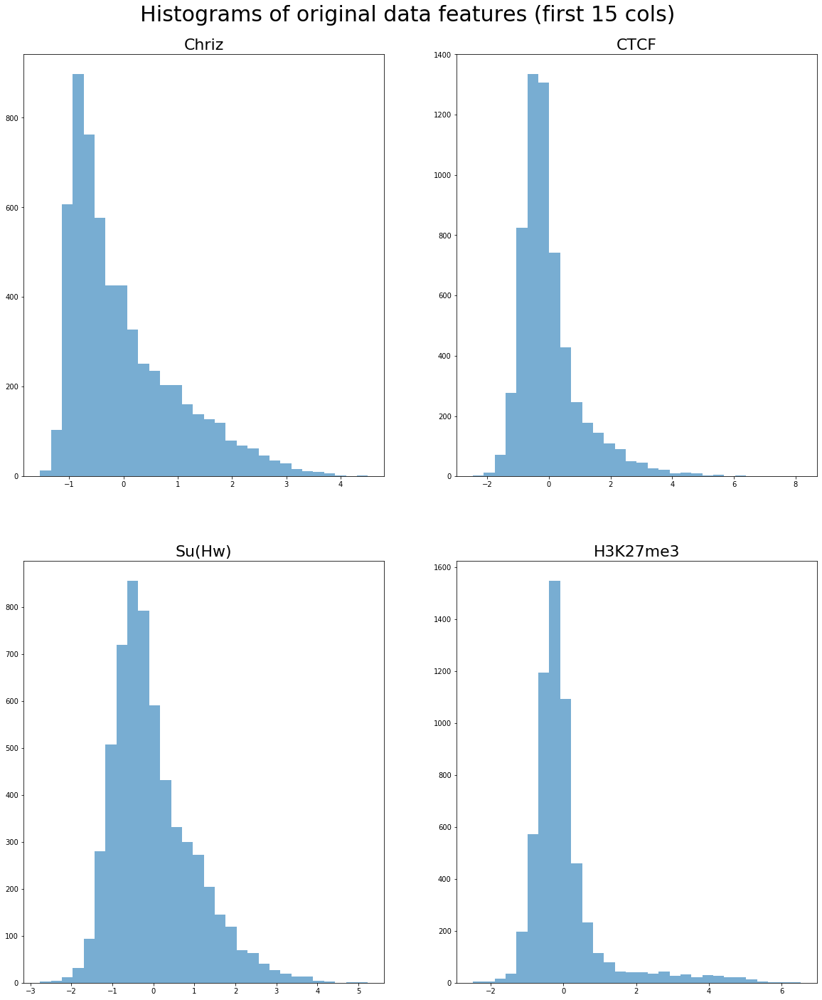

In [24]:
ncols = 2
nrows = 2
plotData(pd.DataFrame(data_scaled), ncols, nrows, bins=30, method = 'hist', is_sharex=False, plt_title='Histograms of original data features (first 15 cols)')

# target - gamma

# Explore target

In [25]:
target = gamma_S2.copy()
target.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.43
2,chr2L,40000,2.43
3,chr2L,60000,0.76
4,chr2L,80000,0.76


In [26]:
# np.unique(target.gamma)

Text(0.5, 1.0, 'gamma values for all bins')

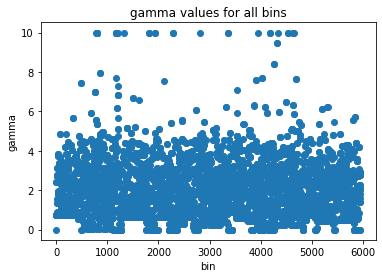

In [27]:
plt.scatter(np.arange(len(target.gamma)), target.gamma) # target
plt.xlabel('bin')
plt.ylabel('gamma')
plt.title('gamma values for all bins')

Text(0.5, 1.0, 'Distribution of gamma values for all bins')

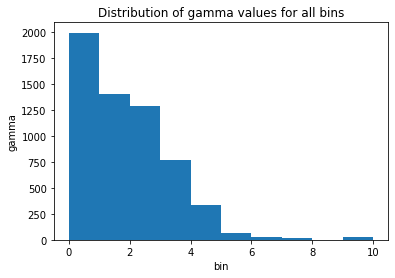

In [28]:
plt.hist(target.gamma)
plt.xlabel('bin')
plt.ylabel('gamma')
plt.title('Distribution of gamma values for all bins')

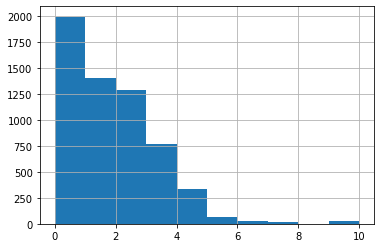

In [29]:
target.gamma.hist()

Log scale

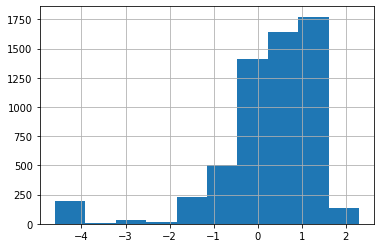

In [30]:
(np.log(0.01+target.gamma)).hist()

# Clean Data  from empty chromosomes

In [31]:
data_scaled_clean, target_clean, empty_chr_names, num_empty_bins = data_scaled, target, [], []
# cleanDataTarget(data_scaled, target)

data_scaled_clean.shape, target_clean.shape

((5950, 5), (5950, 3))

In [32]:
data_scaled_clean.head()

,Chriz,CTCF,Su(Hw),H3K27me3,H3K27ac
0,1.339516,-0.375546,-0.804706,0.667416,-0.665895
1,-0.288877,-0.425095,-1.440856,3.288067,-0.770911
2,-0.328478,0.087835,-0.489589,2.130993,-0.210170
3,0.919315,0.865685,0.999879,0.051090,1.904646
4,0.629713,-0.093149,-0.942593,-0.405903,0.460912


In [33]:
target_clean.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.43
2,chr2L,40000,2.43
3,chr2L,60000,0.76
4,chr2L,80000,0.76


Target distribution

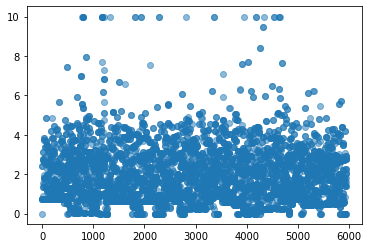

In [34]:
plt.scatter(np.arange(len(target_clean)),  target_clean.gamma, alpha=0.5)

(array([1997., 1406., 1292.,  773.,  340.,   68.,   27.,   14.,    2.,
          31.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <a list of 10 Patch objects>)

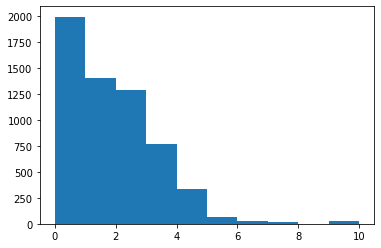

In [35]:
plt.hist(target_clean.gamma)

Log scale

(array([ 196.,    0.,    0.,   44.,    0.,  117.,  647., 1872., 2583.,
         491.]),
 array([-6.90775528, -5.98671124, -5.06566721, -4.14462317, -3.22357913,
        -2.3025351 , -1.38149106, -0.46044702,  0.46059701,  1.38164105,
         2.30268509]),
 <a list of 10 Patch objects>)

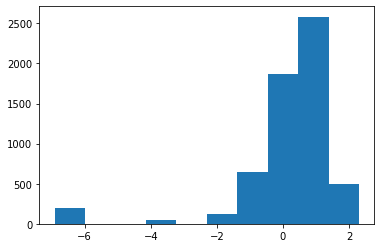

In [36]:
plt.hist(np.log(0.001 + target_clean.gamma))

In [37]:
target.shape, target.head()

((5950, 3),     chrN  start_coord  gamma
 0  chr2L            0   0.00
 1  chr2L        20000   2.43
 2  chr2L        40000   2.43
 3  chr2L        60000   0.76
 4  chr2L        80000   0.76)

# data_scaled_clean, target_clean - prossesed data

# Train Test Split

In [38]:
data = data_scaled_clean 
target = target_clean['gamma']

In [39]:
X, y = data_scaled_clean, target_clean['gamma']
X.shape, y.shape

((5950, 5), (5950,))

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=16)

X_train.shape, X_test.shape, y_train.shape, y_test.shape 

((4165, 5), (1785, 5), (4165,), (1785,))

# Linear Regression

In [41]:
%time

# Create linear regression object
lin_reg = linear_model.LinearRegression() 

# Train the model using the training sets
lin_reg.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg.predict(X_test)

model = lin_reg

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.25 µs


 TEST PREDICTION Error
weighted_mse_test: 0.9457353629452807 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9672591161804253 


 CONSTANT pred Error:
weighted_mse_test_const:  1.357881639311237
test sizes =  1785 1785 1785


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


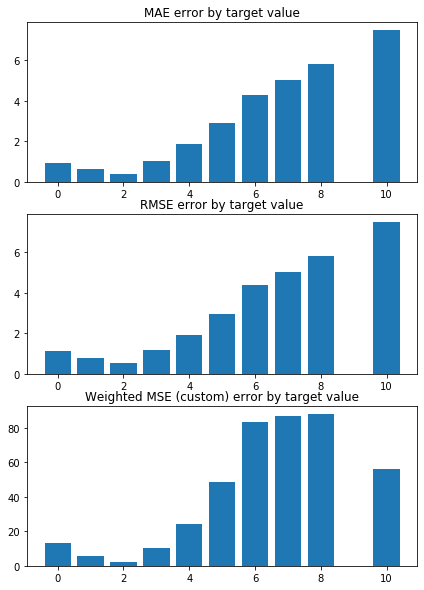

In [42]:
# Make predictions using the testing set
y_pred_train = lin_reg.predict(X_train)

weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  
                                                                          X_test,
                                                                          y_train.values, 
                                                                          y_test.values, 
                                                                          model)

In [43]:
# The coefficients
print('Coefficients: \n', lin_reg.coef_[:20])

Coefficients: 
 [-0.61248742 -0.08485576 -0.00115321 -0.03638842 -0.19260087]


In [44]:
coef = lin_reg.coef_

(array([1., 0., 0., 0., 0., 0., 1., 0., 1., 2.]),
 array([-0.61248742, -0.55135399, -0.49022057, -0.42908715, -0.36795373,
        -0.30682031, -0.24568689, -0.18455347, -0.12342005, -0.06228663,
        -0.00115321]),
 <a list of 10 Patch objects>)

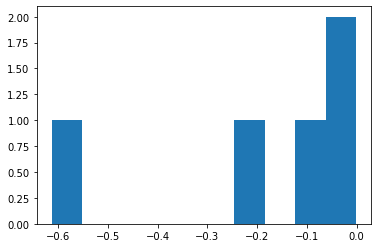

In [45]:
plt.hist(lin_reg.coef_)

Посмотрим на распределения остатков и на нормальное распределение.

(array([  1.,   0.,   1.,   2.,   0.,   1.,   3.,   7.,   9.,   9.,  10.,
         28.,  35.,  36.,  41.,  49.,  82., 104., 104., 126., 147., 182.,
        192., 234., 240., 230., 228., 226., 224., 220., 206., 169., 159.,
        154., 114., 105.,  86.,  56.,  37.,  37.,  24.,  28.,  17.,   5.,
         12.,   7.,   4.,   3.,   2.,   4.]),
 array([-3.81351798, -3.6696427 , -3.52576743, -3.38189215, -3.23801688,
        -3.0941416 , -2.95026633, -2.80639105, -2.66251578, -2.5186405 ,
        -2.37476523, -2.23088995, -2.08701468, -1.9431394 , -1.79926413,
        -1.65538885, -1.51151357, -1.3676383 , -1.22376302, -1.07988775,
        -0.93601247, -0.7921372 , -0.64826192, -0.50438665, -0.36051137,
        -0.2166361 , -0.07276082,  0.07111445,  0.21498973,  0.358865  ,
         0.50274028,  0.64661556,  0.79049083,  0.93436611,  1.07824138,
         1.22211666,  1.36599193,  1.50986721,  1.65374248,  1.79761776,
         1.94149303,  2.08536831,  2.22924358,  2.37311886,  2.51699413,
 

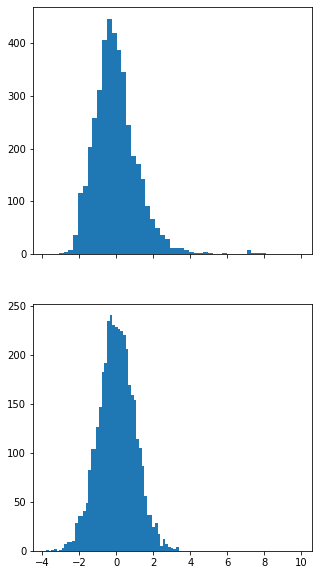

In [46]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train).values, bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

Следовательно ошибка на train имеет нормальное распределение -> модель обучается описывать данные

Значения, на которых модель возвращает наибольшую ошибку:

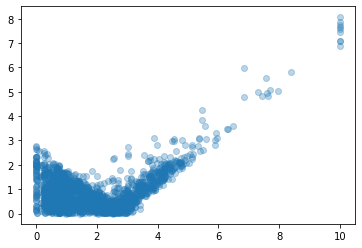

In [47]:
plt.scatter(y_test,  np.abs(y_test - y_pred) , alpha=0.3)

# Remove outlires
Посмотрим на результаты удаления объектов, для которых значение целевой переменной больше 9.

In [48]:
target_clean.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.43
2,chr2L,40000,2.43
3,chr2L,60000,0.76
4,chr2L,80000,0.76


In [49]:
data_scaled_clean[target < 9].values

target[target < 9].values

array([0.  , 2.43, 2.43, ..., 1.99, 0.  , 0.  ])

KFold(n_splits=5, random_state=3, shuffle=True)
train_index= [   1    2    3 ... 5916 5917 5918]
 TEST PREDICTION Error
weighted_mse_test: 0.8672077441757499 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9326468709518712 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2920917856361507
test sizes =  1184 1184 1184


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


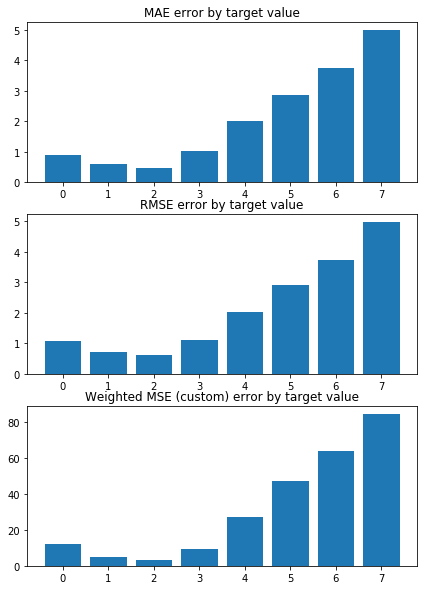

train_index= [   0    1    2 ... 5915 5916 5918]
 TEST PREDICTION Error
weighted_mse_test: 0.892828888358935 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9293757182027851 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2862471322913342
test sizes =  1184 1184 1184


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


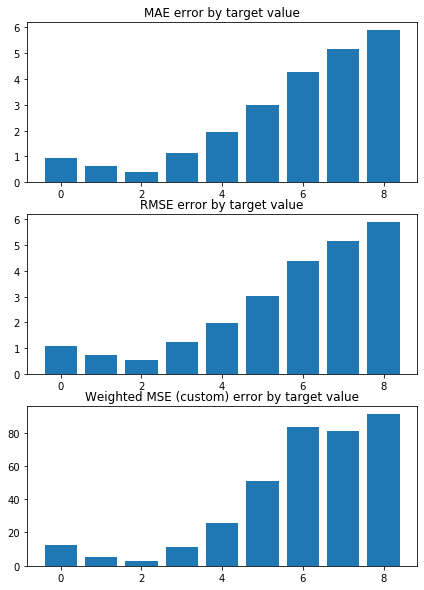

train_index= [   0    1    2 ... 5916 5917 5918]
 TEST PREDICTION Error
weighted_mse_test: 0.9735823344414615 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9074044955630606 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3789707530553161
test sizes =  1184 1184 1184


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


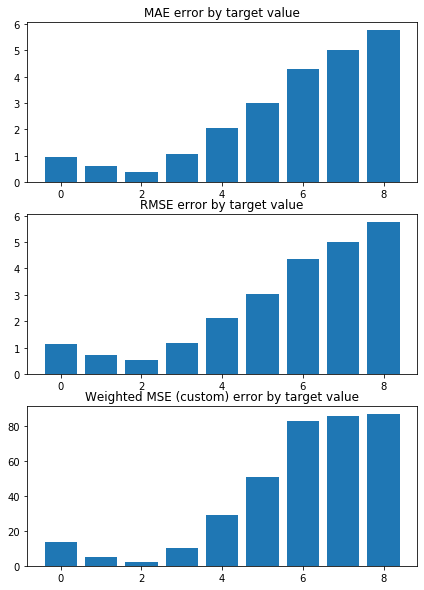

train_index= [   0    3    4 ... 5914 5915 5917]
 TEST PREDICTION Error
weighted_mse_test: 0.970224597051777 


 TRAIN PREDICTION Error
weighted_mse_train: 0.910526674209403 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4089476261666791
test sizes =  1184 1184 1184


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


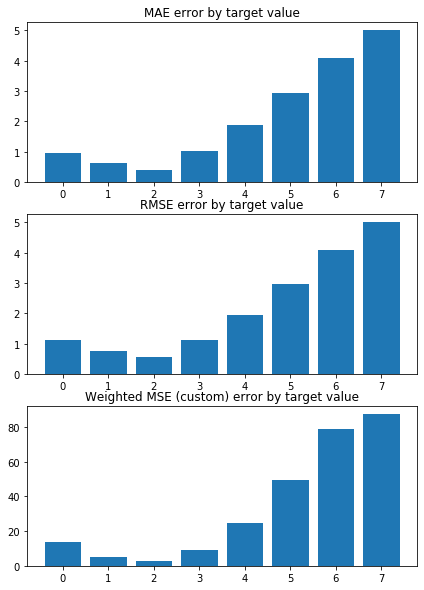

train_index= [   0    1    2 ... 5916 5917 5918]
 TEST PREDICTION Error
weighted_mse_test: 0.9063926695835893 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9242680061730065 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2542092921444037
test sizes =  1183 1183 1183


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


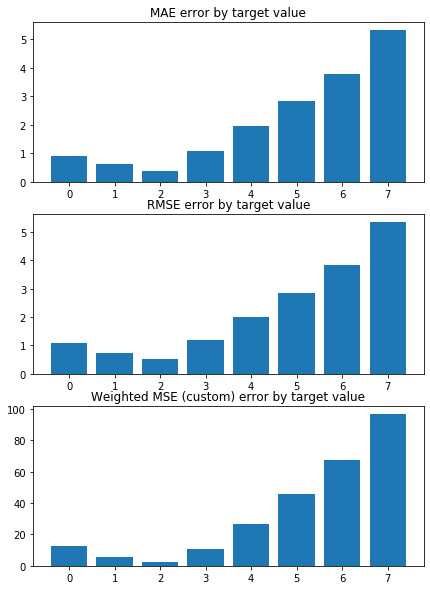

Weighted Mean squared error on Train: 0.92 
 MSE mean train: 1.2678851732161551 

Mean squared error on Test: 0.92 
 MSE mean test:  1.2693723349082604 

Root of MSE on Test: 0.96 
 1.1266642511894396 

Variance score on Test: 0.04 
 r2_test: 0.3027077706243855 

wMSE_train 0.92
wMSE_test 0.92
MSE_train 1.27
MSE_test 1.27
MAE_train 0.87
MAE_test 0.85
r2_test 0.3
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.595929 -0.182707 -0.058802  0.040858 -0.025577
1 -0.607805 -0.171395 -0.064074  0.040539 -0.028601
2 -0.595766 -0.184942 -0.067474  0.038958 -0.037383
3 -0.598371 -0.179242 -0.067561  0.033005 -0.015856
4 -0.603355 -0.181392 -0.067039  0.048281 -0.016032


In [50]:
X, y = data_scaled_clean[target < 9].values, target[target < 9].values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression() 
model_name = 'LR+L1_no_outliers'


lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=5, random_state=3, shuffle=True)


In [51]:
results_pd 

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.922047,0.042622,0.920844,0.010108,-,test_params = testtest,1.269372,0.07726,1.267885,0.019264,"[0.33022472445781603, 0.30276714824071915, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9455995888906195 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9603754462685091 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


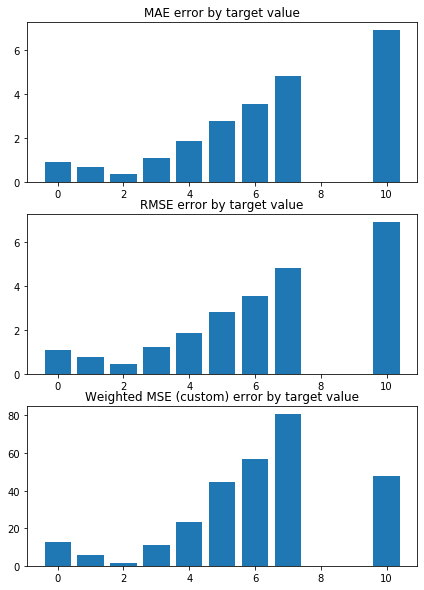

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8505579048187752 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9703194255065083 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


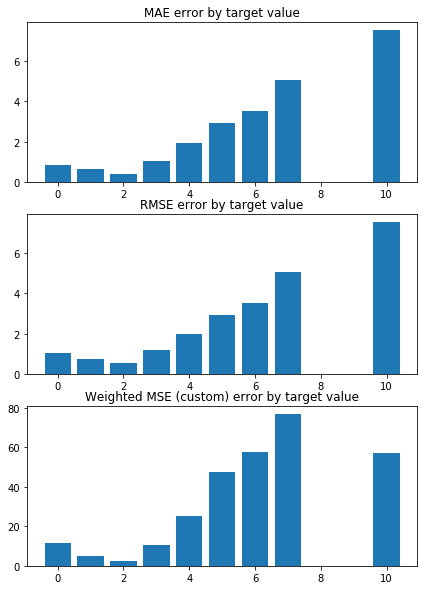

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0395098799433695 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518809239249897 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


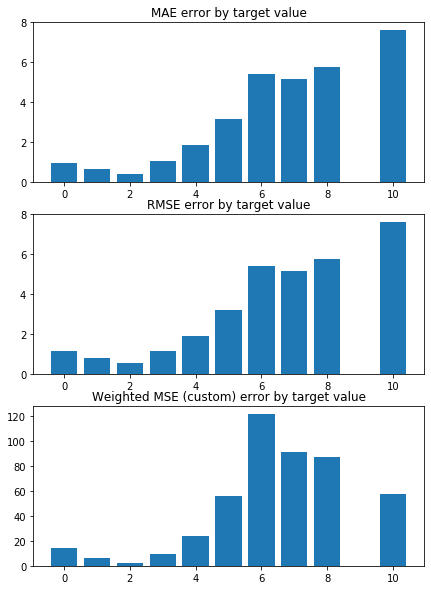

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9679932045405429 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9557725900337942 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


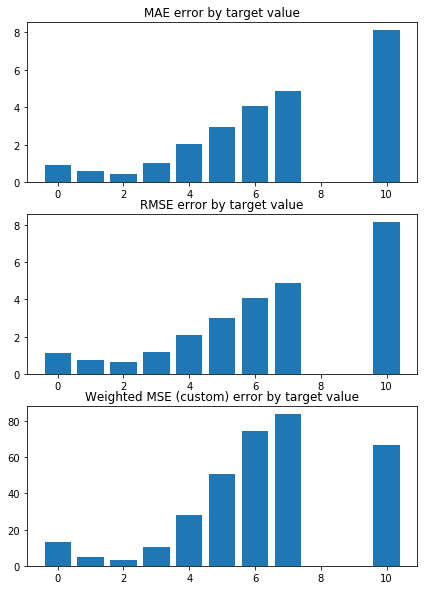

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0411551326283972 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9482024895993993 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


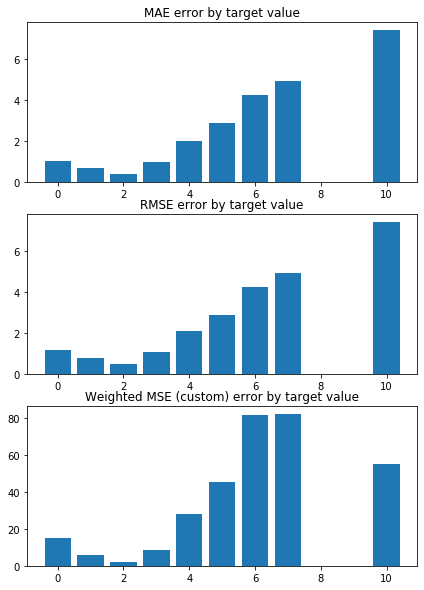

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642521288450389 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9568170964093331 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


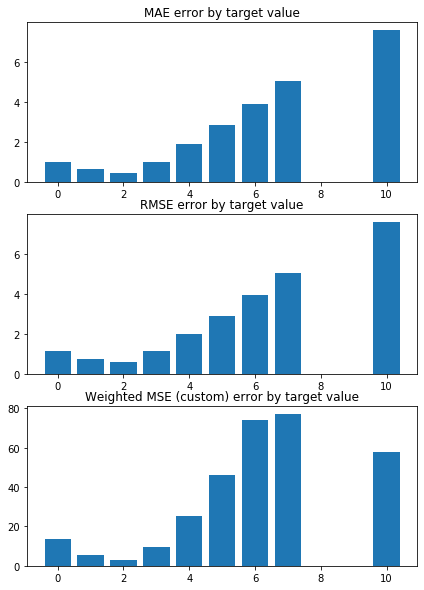

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9734548226658905 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9586834206397351 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


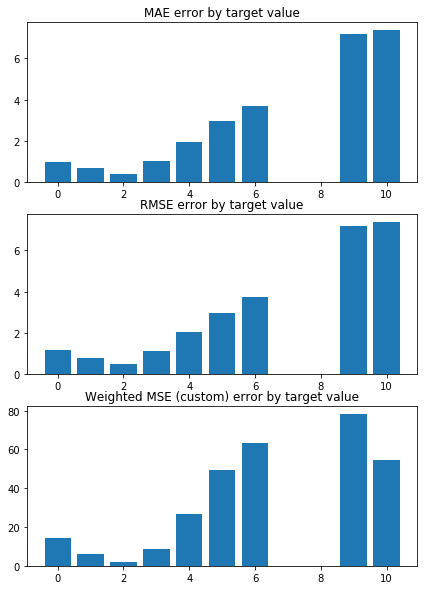

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9425846536237507 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9610023690953803 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


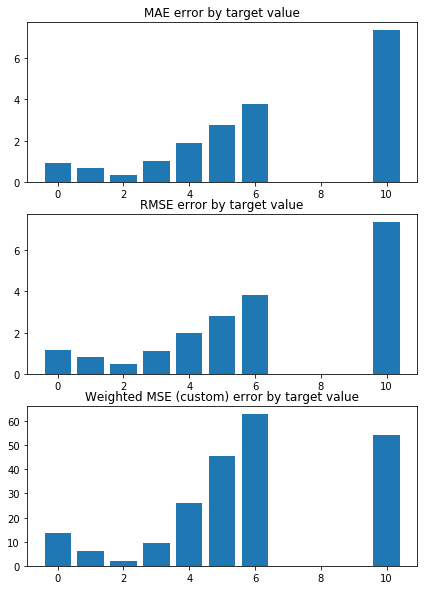

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0459065815277124 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9473869909682894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


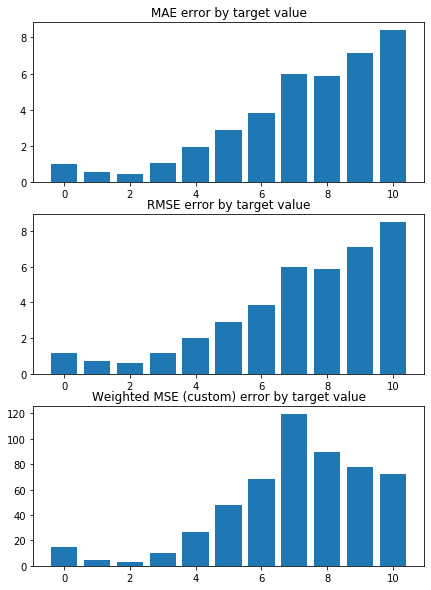

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8370351058117279 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9755965144073965 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


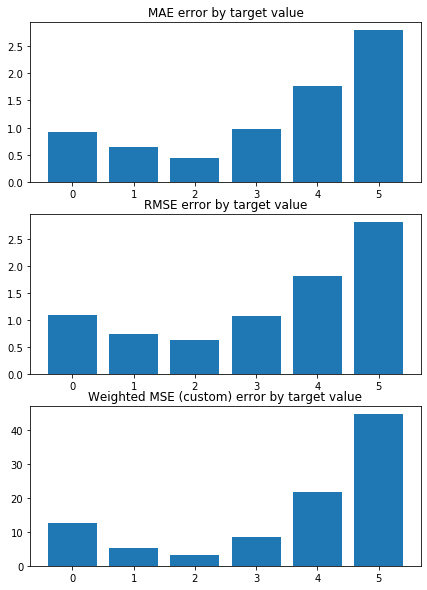

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760946939714553 

Mean squared error on Test: 0.96 
 MSE mean test:  1.579956057333393 

Root of MSE on Test: 0.98 
 1.2569630294218652 

Variance score on Test: 0.07 
 r2_test: 0.26927210899686277 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604917 -0.190577 -0.077341 -0.035250  0.013724
1 -0.605994 -0.209867 -0.069082 -0.046829  0.007790
2 -0.606345 -0.203347 -0.092007 -0.044125  0.009684
3 -0.613834 -0.199451 -0.066803 -0.050258  0.017438
4 -0.592805 -0.207426 -0.080341 -0.046697  0.022904
5 -0.599567 -0.199354 -0.070598 -0.039149  0.025675
6 -0.603285 -0.218941 -0.074712 -0.045496 -0.001745
7 -0.608094 -0.200640 -0.078664 -0.042130  0.012393
8 -0.603454 -0.207045 -0.077731 -0.039399  0.016631
9 -0.595396 -0.206297 -0.087506 -0.050025  0.019883


,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.922047,0.042622,0.920844,0.010108,-,test_params = testtest,1.269372,0.077260,1.267885,0.019264,"[0.33022472445781603, 0.30276714824071915, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [52]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression() 

model_name = 'LR'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)
results_pd

In [53]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.922047,0.042622,0.920844,0.010108,-,test_params = testtest,1.269372,0.077260,1.267885,0.019264,"[0.33022472445781603, 0.30276714824071915, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [54]:
coefs_argsort, coefs

(array([[0, 4, 1, 3, 2],
        [0, 4, 1, 3, 2],
        [0, 4, 1, 3, 2],
        [0, 4, 1, 3, 2],
        [0, 4, 1, 3, 2],
        [0, 4, 1, 3, 2],
        [0, 4, 1, 3, 2],
        [0, 4, 1, 3, 2],
        [0, 4, 1, 3, 2],
        [0, 4, 1, 3, 2]]),
 array([[-0.60491679, -0.07734103,  0.01372434, -0.03525037, -0.19057744],
        [-0.605994  , -0.06908233,  0.00779029, -0.04682851, -0.20986695],
        [-0.60634487, -0.09200686,  0.00968387, -0.04412535, -0.2033472 ],
        [-0.61383435, -0.06680347,  0.01743793, -0.05025801, -0.19945094],
        [-0.59280534, -0.08034077,  0.02290403, -0.0466967 , -0.20742589],
        [-0.59956706, -0.07059804,  0.0256751 , -0.03914914, -0.1993541 ],
        [-0.60328463, -0.07471238, -0.00174501, -0.0454958 , -0.21894111],
        [-0.60809366, -0.07866439,  0.01239336, -0.04212996, -0.20064031],
        [-0.60345393, -0.07773095,  0.01663086, -0.03939947, -0.20704466],
        [-0.59539628, -0.08750639,  0.01988288, -0.05002539, -0.20629702]

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

(array([  1.,   0.,   0.,   1.,   1.,   0.,   2.,   2.,   6.,  11.,   6.,
         18.,  22.,  30.,  35.,  54.,  77.,  85., 122., 161., 161., 168.,
        200., 219., 234., 246., 259., 268., 243., 225., 201., 193., 164.,
        152., 110.,  86.,  61.,  62.,  37.,  31.,  13.,  12.,   5.,   6.,
          5.,   2.,   1.,   1.,   0.,   1.]),
 array([-4.23911785, -4.07856025, -3.91800264, -3.75744504, -3.59688744,
        -3.43632983, -3.27577223, -3.11521463, -2.95465702, -2.79409942,
        -2.63354182, -2.47298421, -2.31242661, -2.151869  , -1.9913114 ,
        -1.8307538 , -1.67019619, -1.50963859, -1.34908099, -1.18852338,
        -1.02796578, -0.86740817, -0.70685057, -0.54629297, -0.38573536,
        -0.22517776, -0.06462016,  0.09593745,  0.25649505,  0.41705266,
         0.57761026,  0.73816786,  0.89872547,  1.05928307,  1.21984067,
         1.38039828,  1.54095588,  1.70151349,  1.86207109,  2.02262869,
         2.1831863 ,  2.3437439 ,  2.5043015 ,  2.66485911,  2.82541671,
 

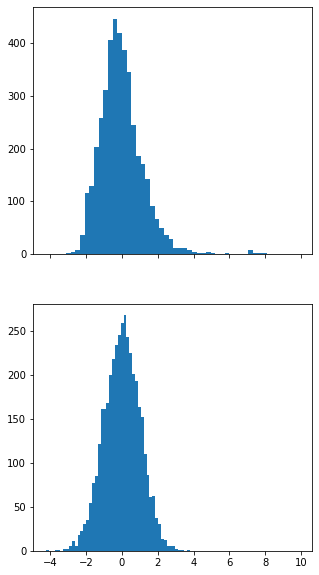

In [55]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train), bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

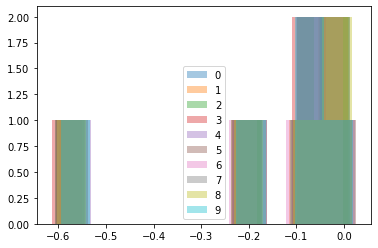

In [56]:
for i, coef_i in enumerate(coefs):
    plt.hist(coef_i, label=str(i), alpha=0.4, bins=10)
plt.legend()

(array([1., 0., 0., 0., 0., 0., 1., 0., 1., 2.]),
 array([-0.60491679, -0.54305267, -0.48118856, -0.41932445, -0.35746034,
        -0.29559622, -0.23373211, -0.171868  , -0.11000389, -0.04813977,
         0.01372434]),
 <a list of 10 Patch objects>)

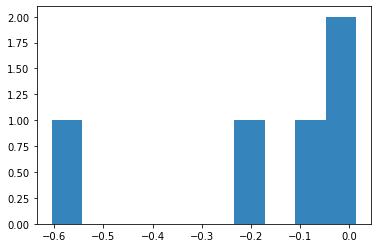

In [57]:
plt.hist(coefs[0], label=str(i), alpha=0.9, bins=10)

### Отсортированные номера выделенных признаков обычной линейной модели

In [58]:
su_drsc.columns

Index(['chrN', 'start_coord', 'Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3',
       'H3K27ac'],
      dtype='object')

In [59]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K27ac', 'CTCF', 'H3K27me3', 'Su(Hw)'], dtype='object')

In [60]:
coefs_argsort

array([[0, 4, 1, 3, 2],
       [0, 4, 1, 3, 2],
       [0, 4, 1, 3, 2],
       [0, 4, 1, 3, 2],
       [0, 4, 1, 3, 2],
       [0, 4, 1, 3, 2],
       [0, 4, 1, 3, 2],
       [0, 4, 1, 3, 2],
       [0, 4, 1, 3, 2],
       [0, 4, 1, 3, 2]])

In [61]:
pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

,Chriz,H3K27ac,CTCF,H3K27me3,Su(Hw)
0,0,4,1,3,2
1,0,4,1,3,2
2,0,4,1,3,2
3,0,4,1,3,2
4,0,4,1,3,2
5,0,4,1,3,2
6,0,4,1,3,2
7,0,4,1,3,2
8,0,4,1,3,2
9,0,4,1,3,2


# !! одинаковая приоритизация 

In [62]:
def getConfIdxFrequencies(coefs_argsort, row_lim, min_lim = 5, max_lim = 5):
    ''' 
    Get Frequencies of feature indexes in the sorted array of indexes bu the coefficient of the feature in different itterstions.
    The smallest and the biggest elements are valueable - as they give the biggest impact.
    min_lim, max_lim - limitations of the number of smallest and biggest coefficients to consider for the frequency.
    '''
    merged_coefs = np.concatenate(np.hstack([coefs_argsort[:row_lim,:min_lim], coefs_argsort[:row_lim,-max_lim:]]))

    merged_coefs = list(merged_coefs)

    featur_freq_dict =  dict((i, merged_coefs.count(i)) for i in merged_coefs)
    for key, value in  sorted(featur_freq_dict.items(), key=lambda item: (-item[1], item[0])):
        print("{}: {}".format(key, value))
        
    return featur_freq_dict

In [63]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort, row_lim=len(coefs_argsort), min_lim = 3, max_lim = 3)

1: 20
0: 10
2: 10
3: 10
4: 10


## Explore fold with big error

train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    2    3 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5946 5948 5949]
train_index= [   1    4    5 ... 5945 5947 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5946 5947 5948]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]


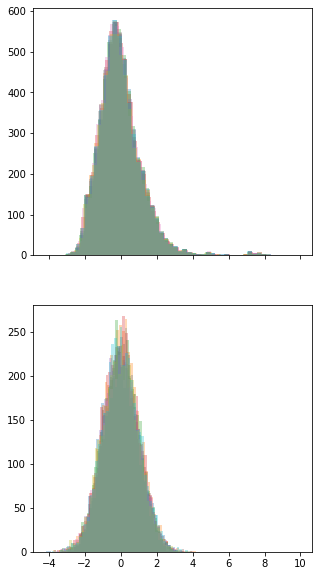

In [64]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

     # Train the model using the training sets
    model.fit(X_train, y_train)

    # Make predictions using the train set
    y_pred_train = model.predict(X_train)

    # Make predictions using the testing set
    y_pred = model.predict(X_test)

    axes[0].hist(y_train - y_pred_train, bins=50, alpha=0.3)
    axes[1].hist(np.random.randn(4000), bins=50, alpha=0.3)

# ================================================================

# Linear Regression with L1 regularization -  LASSO

$$ (1 / (2  n\_{samples}))  ||y - Xw||^2_2 + \alpha * ||w||_1 $$


In [65]:
X, y = data_scaled_clean, target_clean.gamma
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=10)

In [66]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso()

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

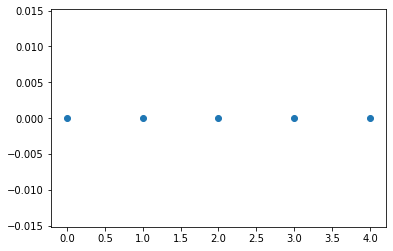

In [67]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [68]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index([], dtype='object')

In [69]:
lin_reg_l1.coef_

array([-0., -0.,  0.,  0., -0.])

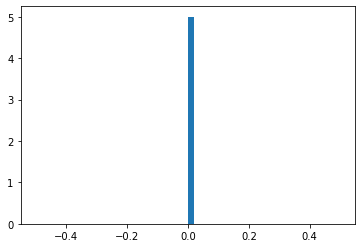

In [70]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

In [71]:
# f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
# axes[0].hist((y_train - y_pred_train), bins=50)
# axes[1].hist(np.random.randn(4000), bins=50)

### Cross validation
without outliers

In [72]:
# X, y = data_scaled_clean[target < 9].values, target[target < 9].values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# # Create linear regression with L2 regularization object
# model_l1 = linear_model.Lasso(0.2)

# model_name = 'LR+L1_t<.9'

# lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
#                 weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const, \
#                 results_pd = train_test_KFold(X, y, 
#                                               model, model_name, results_pd,
#                                               n_splits=5, random_state=3, shuffle=True)
# results_pd

In [73]:
# np.mean(weighted_mse_test_all)

In [74]:
# for coef_i in coefs_l1:
#     plt.hist(coef_i, alpha=0.5)
# plt.hist(coefs_l1[0], alpha=0.5)

In [75]:
# np.sort(coefs_l1)

In [76]:
# lin_reg_l1.predict(X_test)

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L 1 

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4063865324088682 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3598390652573922 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


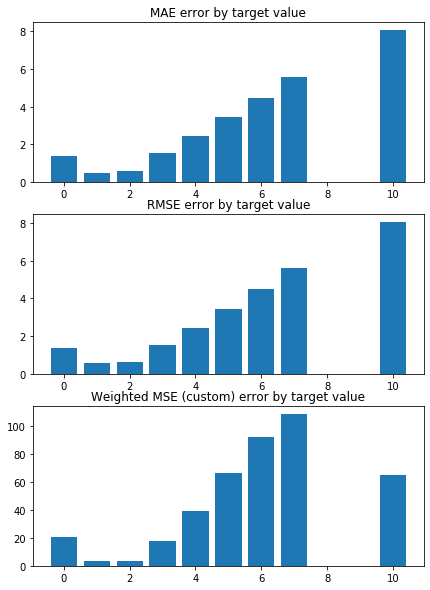

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


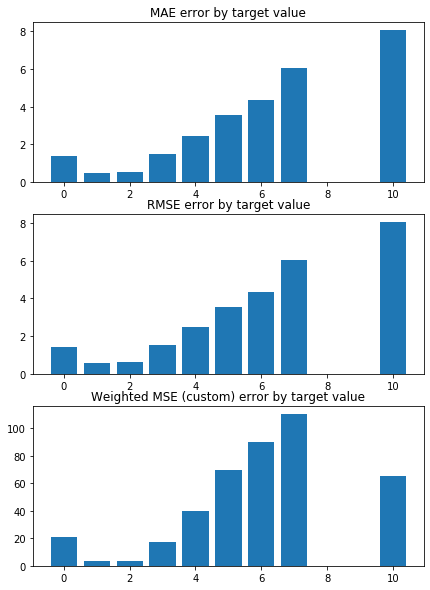

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


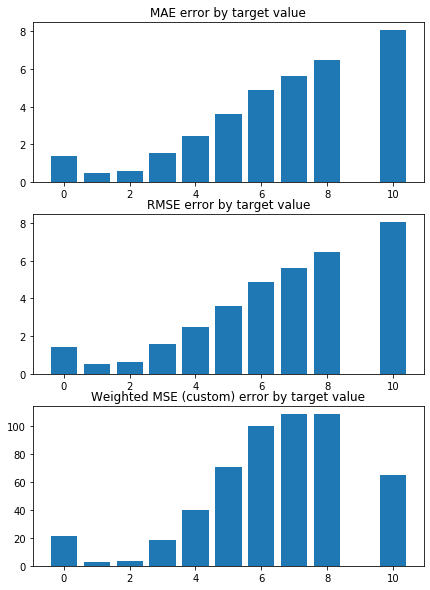

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


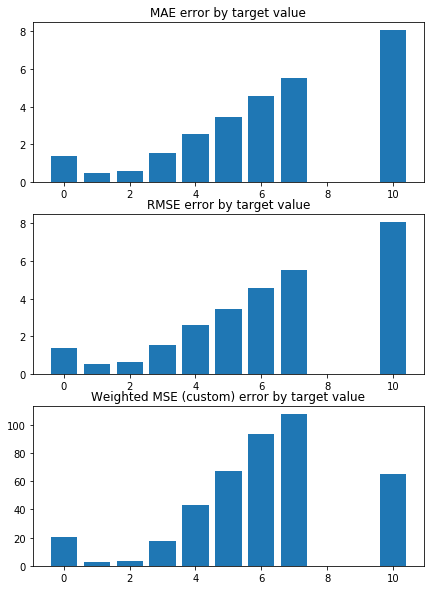

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


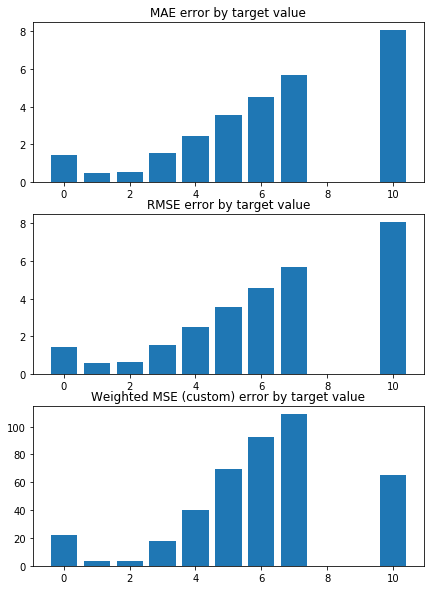

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


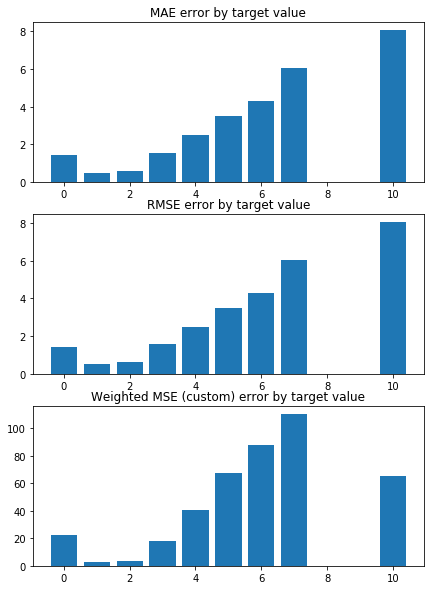

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


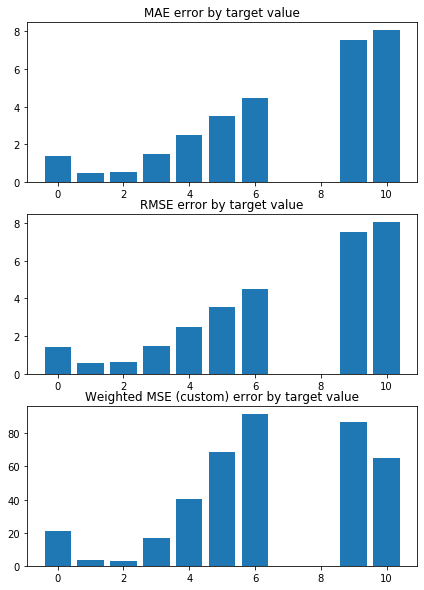

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


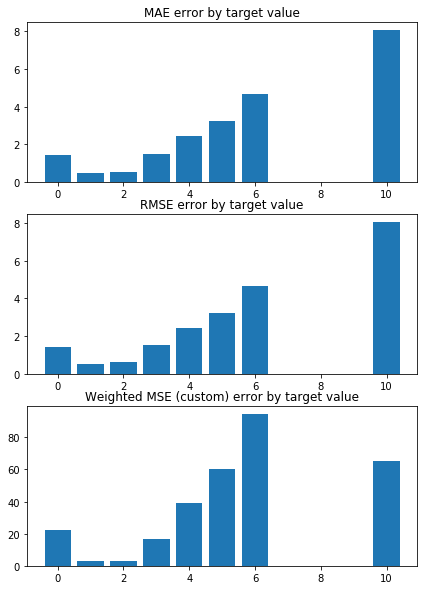

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


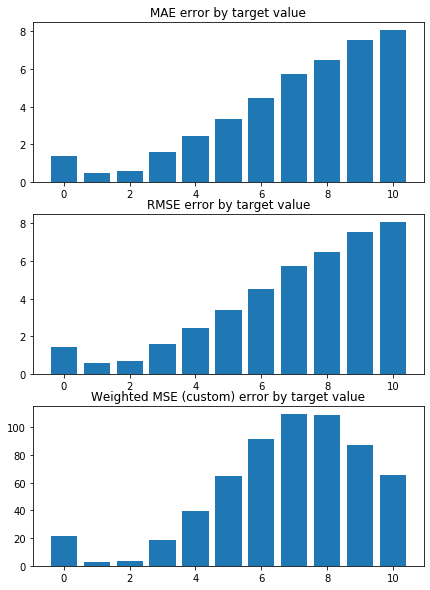

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


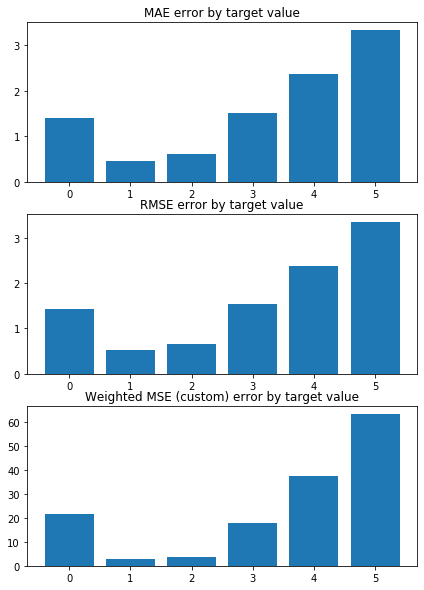

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0     -0.0
1   -0.0  -0.0     0.0       0.0     -0.0
2   -0.0  -0.0     0.0       0.0     -0.0
3   -0.0  -0.0     0.0       0.0     -0.0
4   -0.0  -0.0     0.0       0.0     -0.0
5   -0.0  -0.0     0.0       0.0     -0.0
6   -0.0  -0.0     0.0       0.0     -0.0
7   -0.0  -0.0     0.0       0.0     -0.0
8   -0.0  -0.0     0.0       0.0     -0.0
9   -0.0  -0.0     0.0       0.0     -0.0


,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.922047,0.042622,0.920844,0.010108,-,test_params = testtest,1.269372,0.077260,1.267885,0.019264,"[0.33022472445781603, 0.30276714824071915, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."


In [77]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.Lasso()

model_name = 'LR+L1'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)
results_pd

# Fined parametrs for lasso L1

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9455995888906196 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9603754462685091 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4283.493843344127, tolerance: 1.157624653381885
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

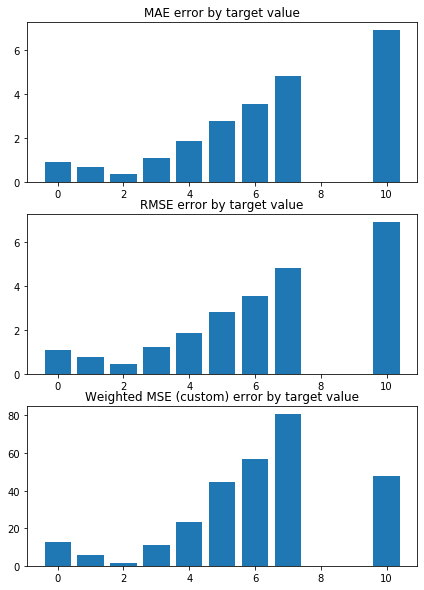

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8505579048187755 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9703194255065085 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4255.715907018319, tolerance: 1.1556851426591965
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

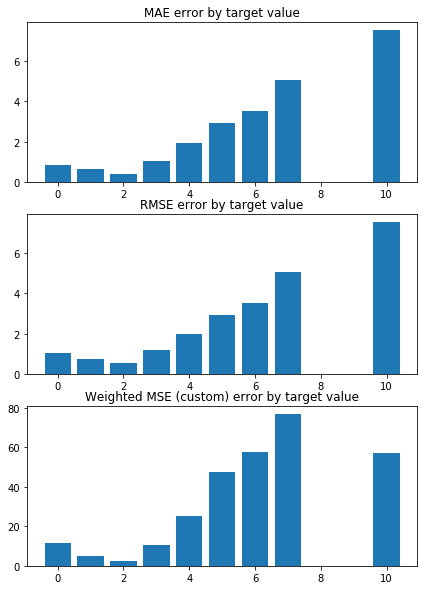

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0395098799433695 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518809239249897 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4141.437276359796, tolerance: 1.1390143168328661
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

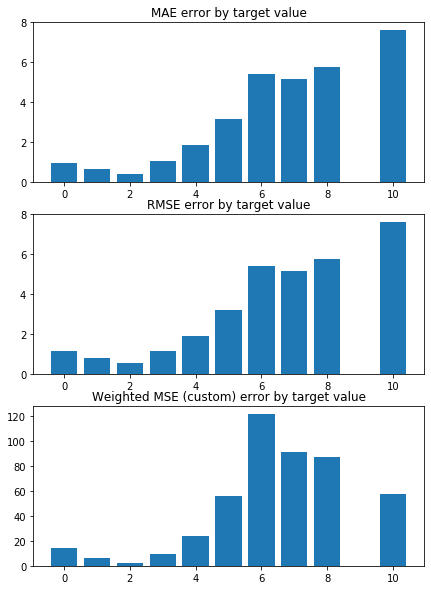

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9679932045405429 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9557725900337942 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4110.026989822735, tolerance: 1.134086969012138
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

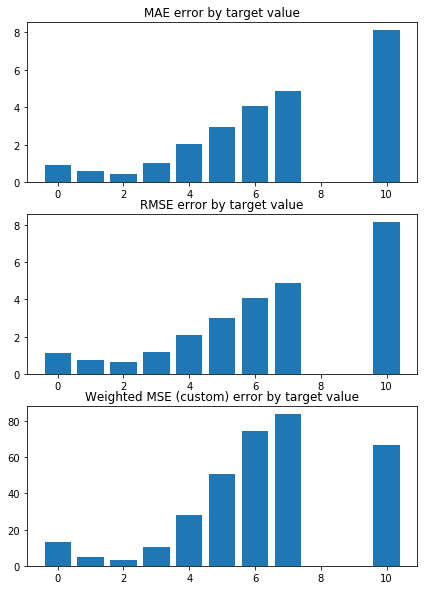

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.041155132628397 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9482024895993995 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4189.8603892790925, tolerance: 1.1411477756974782
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounte

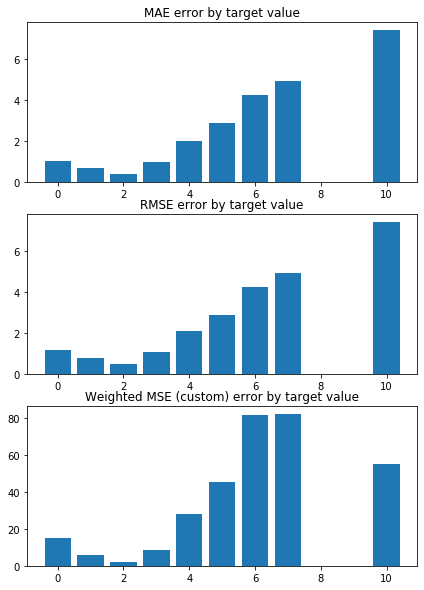

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642521288450389 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9568170964093331 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4197.58486227444, tolerance: 1.1451602222857147
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

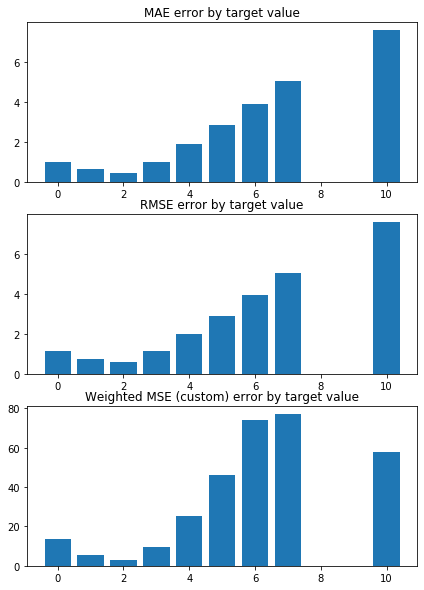

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9734548226658905 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9586834206397351 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4266.849385438329, tolerance: 1.162511723331466
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

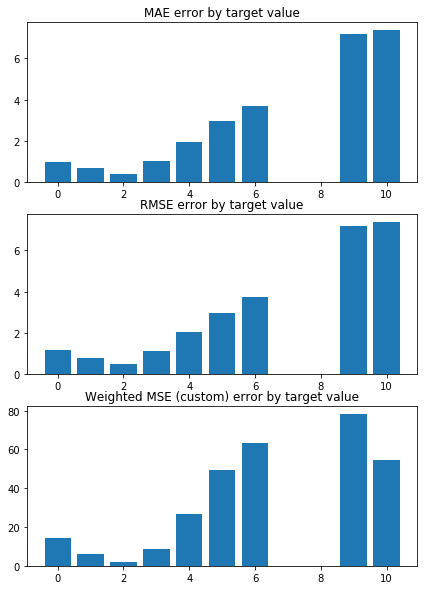

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9425846536237507 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9610023690953802 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4278.562239754587, tolerance: 1.1623169966386562
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

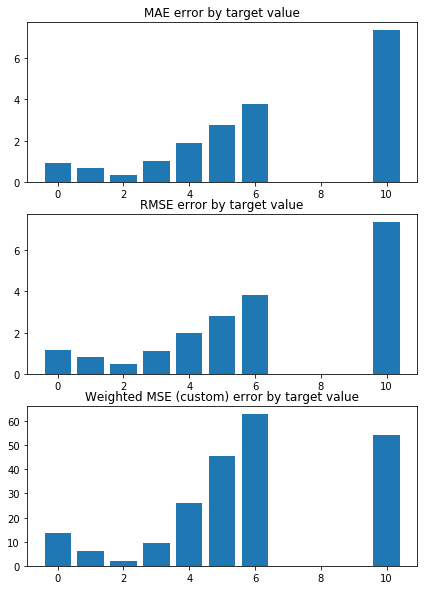

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0459065815277122 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9473869909682893 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4099.268192642675, tolerance: 1.1313881385546216
  positive)


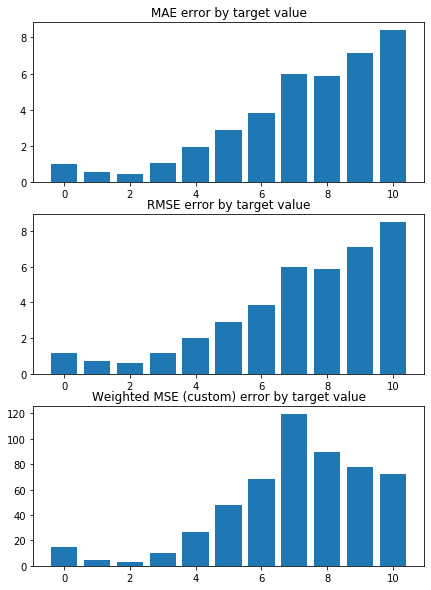

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8370351058117279 


 TRAIN PREDICTION Error


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4377.136345151623, tolerance: 1.181346870110178
  positive)


weighted_mse_train: 0.9755965144073965 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


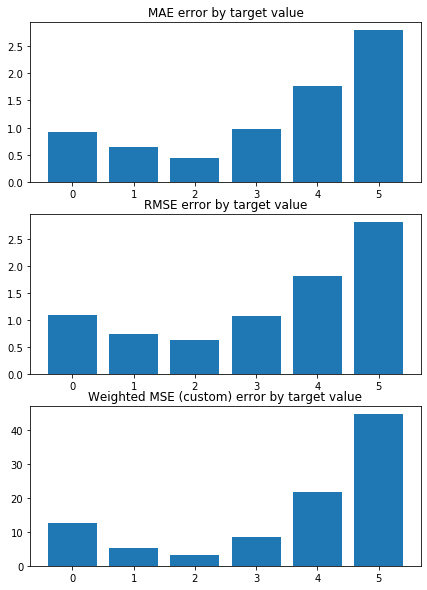

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760946939714553 

Mean squared error on Test: 0.96 
 MSE mean test:  1.579956057333393 

Root of MSE on Test: 0.98 
 1.2569630294218652 

Variance score on Test: 0.07 
 r2_test: 0.26927210899686277 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604917 -0.190577 -0.077341 -0.035250  0.013724
1 -0.605994 -0.209867 -0.069082 -0.046829  0.007790
2 -0.606345 -0.203347 -0.092007 -0.044125  0.009684
3 -0.613834 -0.199451 -0.066803 -0.050258  0.017438
4 -0.592805 -0.207426 -0.080341 -0.046697  0.022904
5 -0.599567 -0.199354 -0.070598 -0.039149  0.025675
6 -0.603285 -0.218941 -0.074712 -0.045496 -0.001745
7 -0.608094 -0.200640 -0.078664 -0.042130  0.012393
8 -0.603454 -0.207045 -0.077731 -0.039399  0.016631
9 -0.595396 -0.206297 -0.087506 -0.050025  0.019883
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


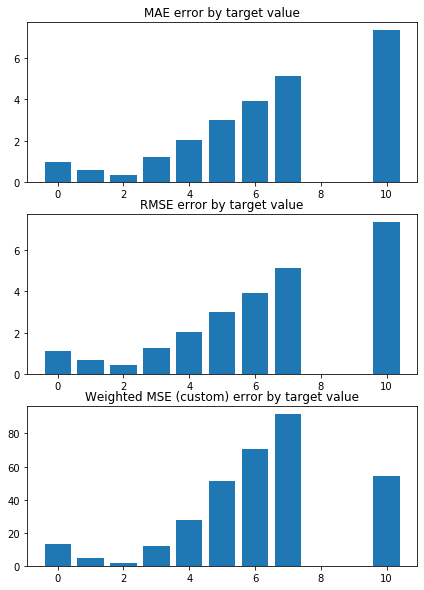

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.86858850446636 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9929325445569973 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


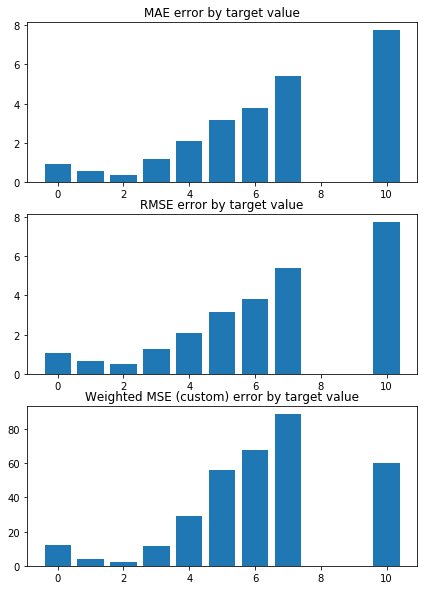

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.035376530635326 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9753536877885366 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


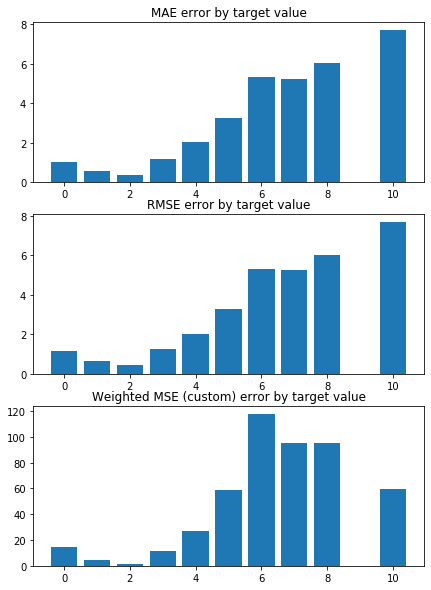

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9829619394080757 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9773188126350543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


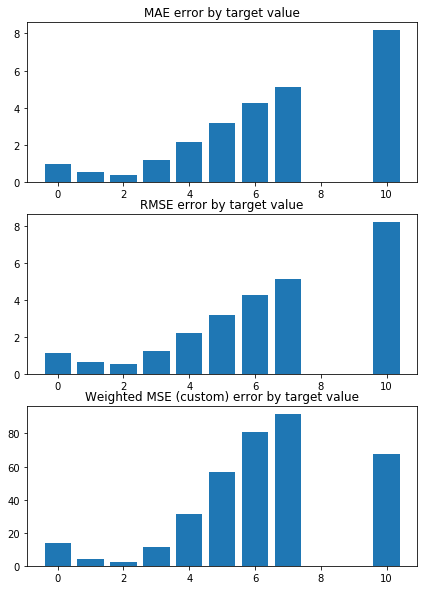

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0636448049237517 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9729646247043543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


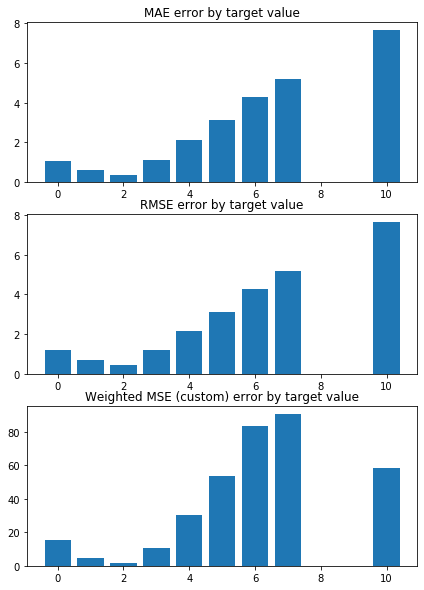

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0004206103482998 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9799153821287289 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


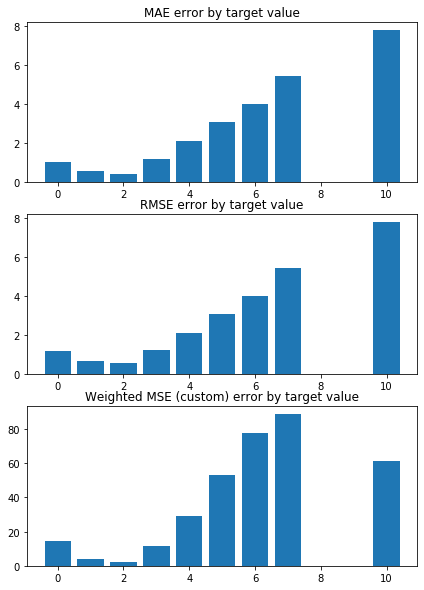

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9689756702855213 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9806770169906543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


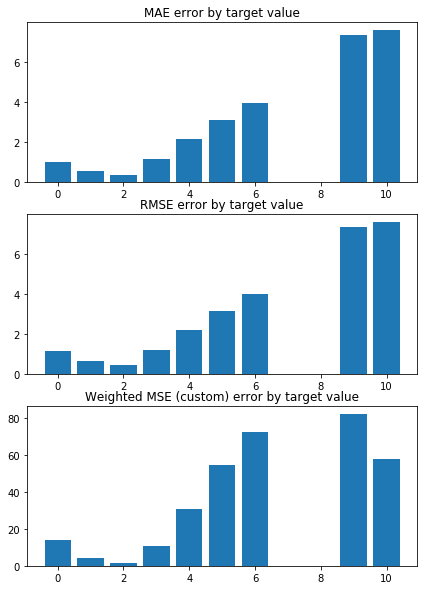

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9690944733715253 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9834480415498508 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


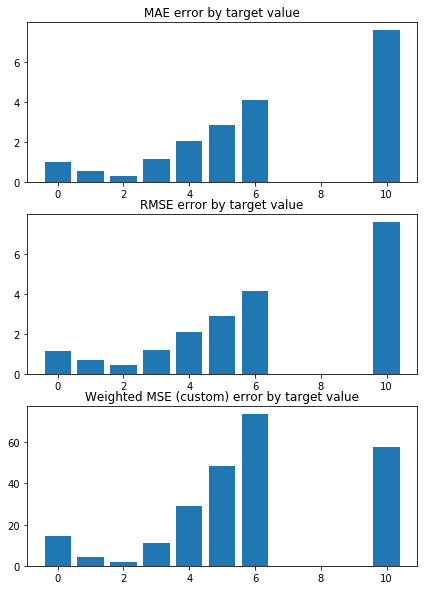

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0661108968050799 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9678888287300402 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


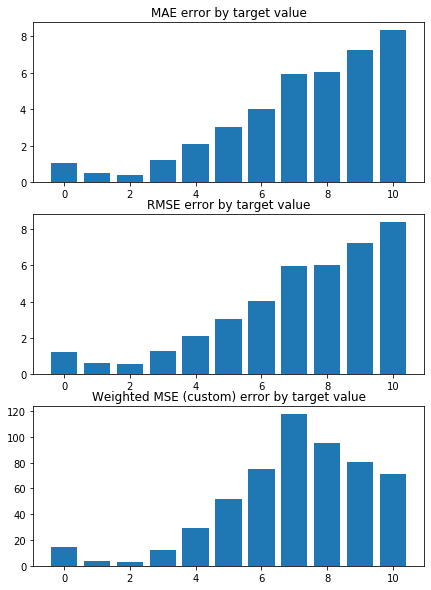

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8690106767147683 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9991037630069876 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


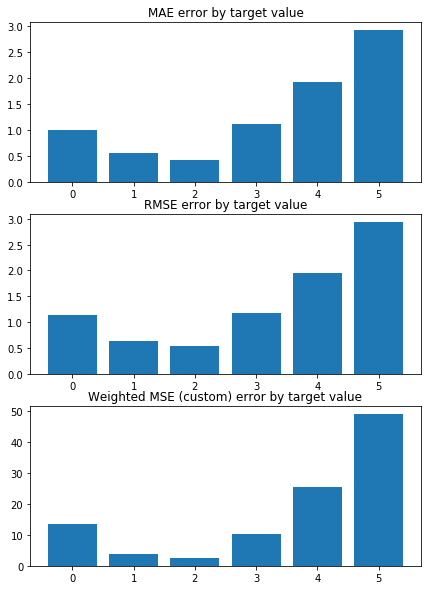

Weighted Mean squared error on Train: 0.98 
 MSE mean train: 1.6363542969769356 

Mean squared error on Test: 0.98 
 MSE mean test:  1.6377671808995646 

Root of MSE on Test: 0.99 
 1.2797527811650047 

Variance score on Test: 0.07 
 r2_test: 0.24186579603713138 

wMSE_train 0.98
wMSE_test 0.98
MSE_train 1.64
MSE_test 1.64
MAE_train 0.94
MAE_test 0.86
r2_test 0.24
      Chriz   H3K27ac  CTCF  Su(Hw)  H3K27me3
0 -0.490566 -0.065055  -0.0     0.0       0.0
1 -0.484760 -0.082044  -0.0     0.0      -0.0
2 -0.492167 -0.077468  -0.0     0.0      -0.0
3 -0.498552 -0.071579  -0.0     0.0      -0.0
4 -0.482695 -0.076471  -0.0     0.0      -0.0
5 -0.488640 -0.073731  -0.0     0.0       0.0
6 -0.483315 -0.089801  -0.0     0.0      -0.0
7 -0.492206 -0.073168  -0.0     0.0      -0.0
8 -0.490792 -0.081568  -0.0     0.0       0.0
9 -0.487612 -0.073141  -0.0     0.0      -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weigh

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


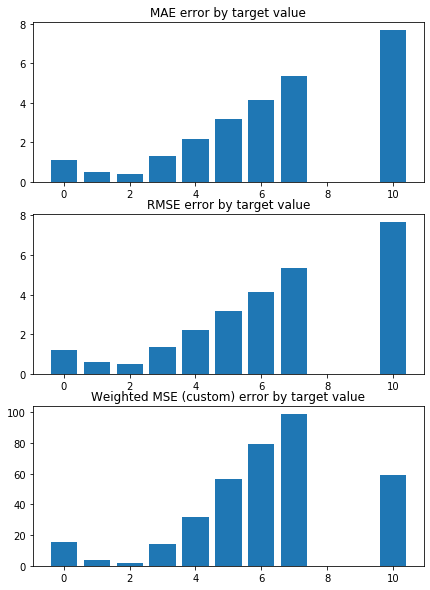

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9673041496596365 


 TRAIN PREDICTION Error
weighted_mse_train: 1.090059704047467 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


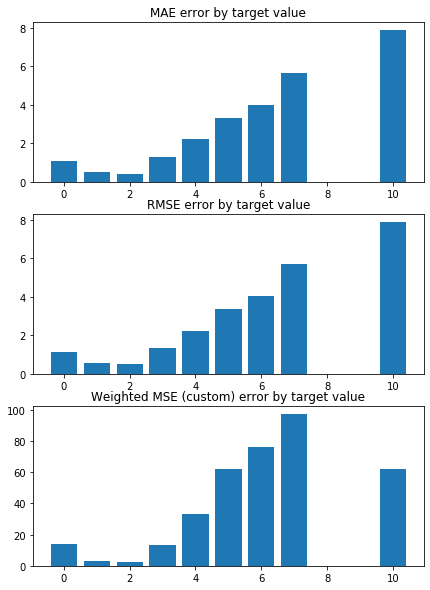

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1131448796165904 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0707368958355872 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


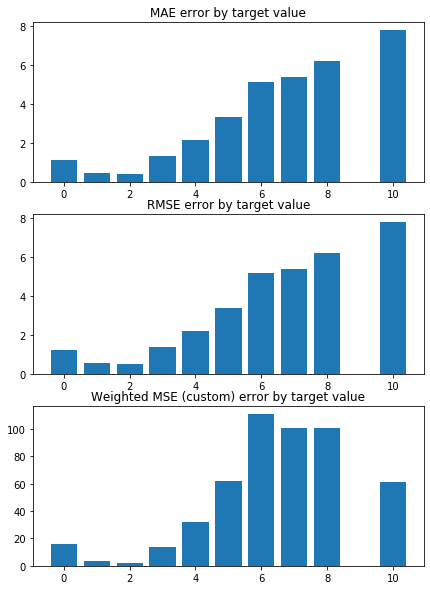

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0596587500967105 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0687626065199831 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


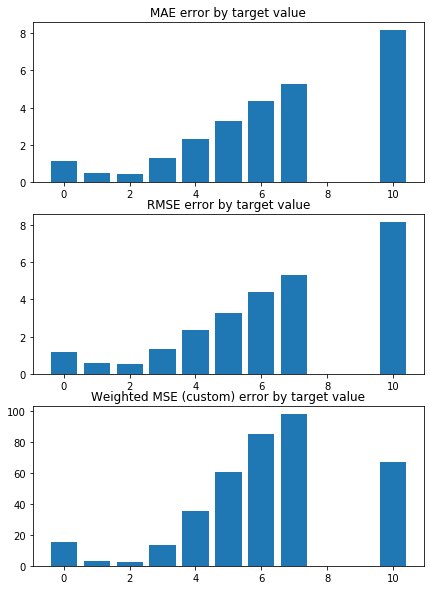

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1705040638912438 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0677063733060548 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


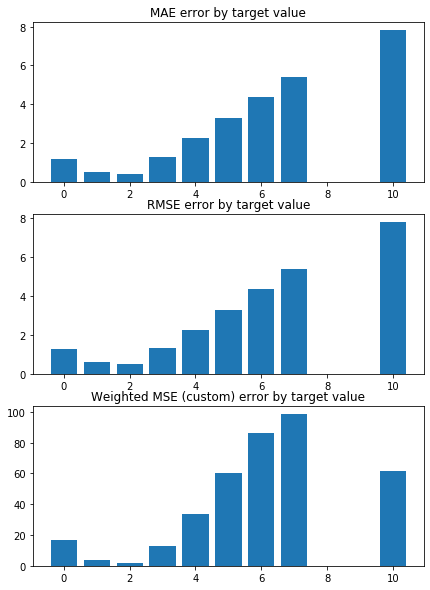

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0917253291446665 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0732053042159209 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


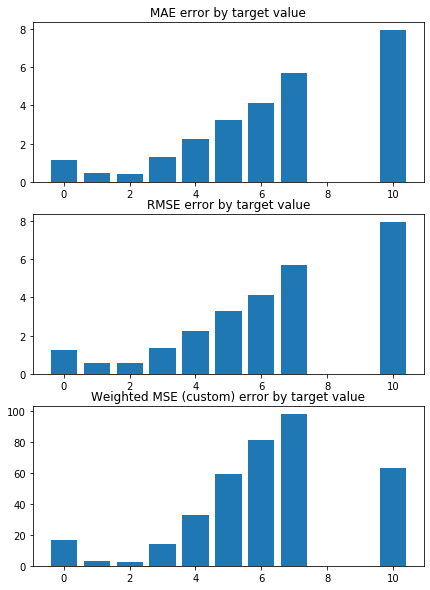

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0493694600961019 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0788462957586167 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


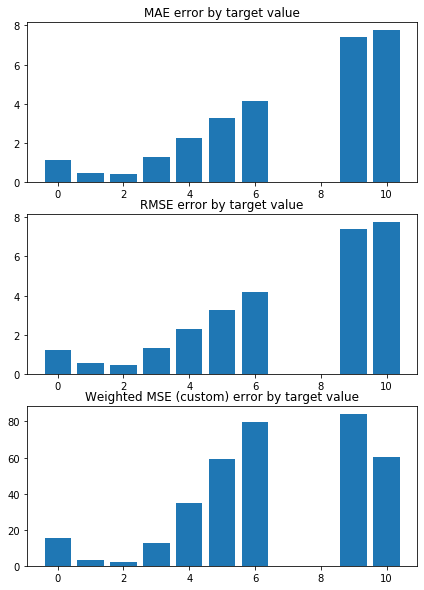

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0642608962844458 


 TRAIN PREDICTION Error
weighted_mse_train: 1.07775400354526 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


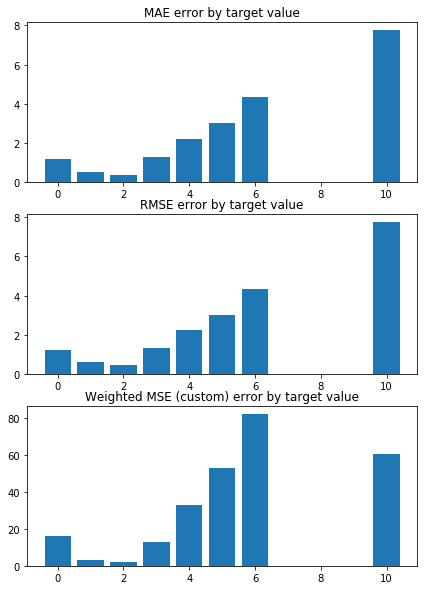

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1500085299254732 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0614931260930613 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


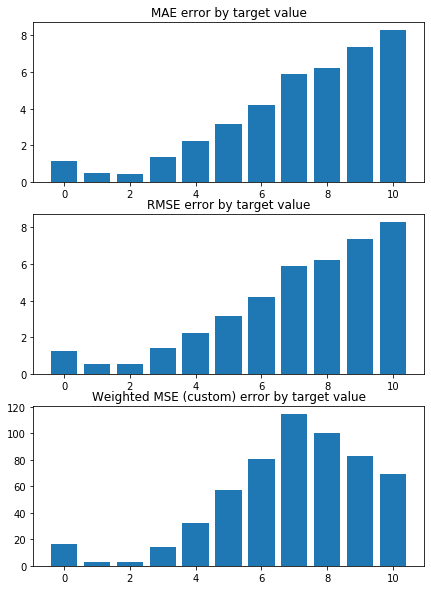

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9878050096805931 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0917233703906537 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


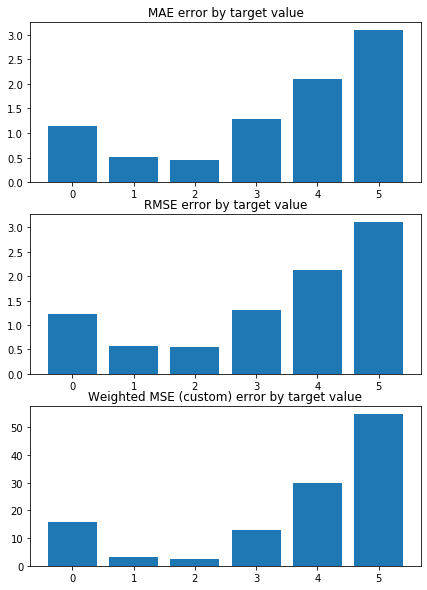

Weighted Mean squared error on Train: 1.08 
 MSE mean train: 1.7738946062979537 

Mean squared error on Test: 1.08 
 MSE mean test:  1.7748506677403402 

Root of MSE on Test: 1.04 
 1.3322352148702346 

Variance score on Test: 0.06 
 r2_test: 0.17654482312216147 

wMSE_train 1.08
wMSE_test 1.08
MSE_train 1.77
MSE_test 1.77
MAE_train 1.01
MAE_test 0.95
r2_test 0.18
      Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0 -0.326864  -0.0     0.0       0.0     -0.0
1 -0.328045  -0.0     0.0       0.0     -0.0
2 -0.334867  -0.0     0.0       0.0     -0.0
3 -0.340126  -0.0     0.0       0.0     -0.0
4 -0.325872  -0.0     0.0       0.0     -0.0
5 -0.331853  -0.0     0.0       0.0     -0.0
6 -0.332278  -0.0     0.0       0.0     -0.0
7 -0.331881  -0.0     0.0       0.0     -0.0
8 -0.337212  -0.0     0.0       0.0     -0.0
9 -0.328988  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_tes

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


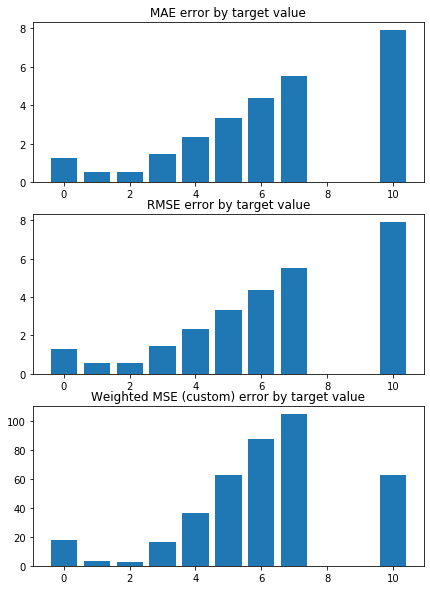

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1373408713993023 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2433917041047733 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


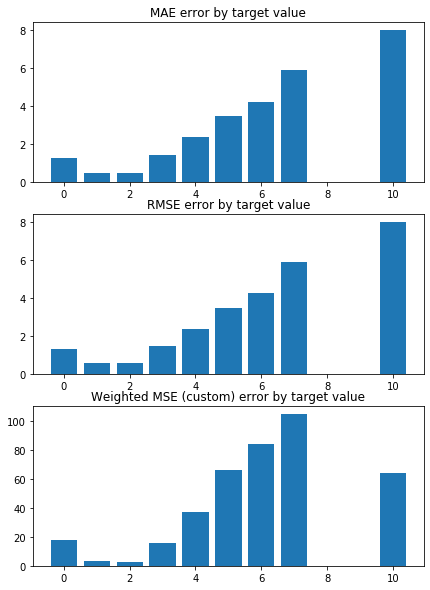

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2467544228077176 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2225156924832645 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


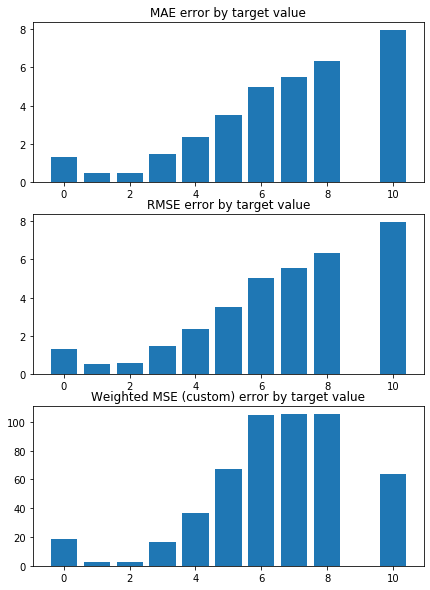

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1881354089028464 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2169104805980249 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


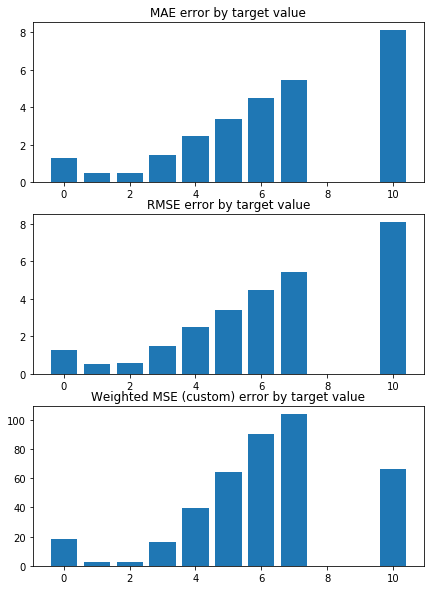

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3279843354894687 


 TRAIN PREDICTION Error
weighted_mse_train: 1.21846087128735 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


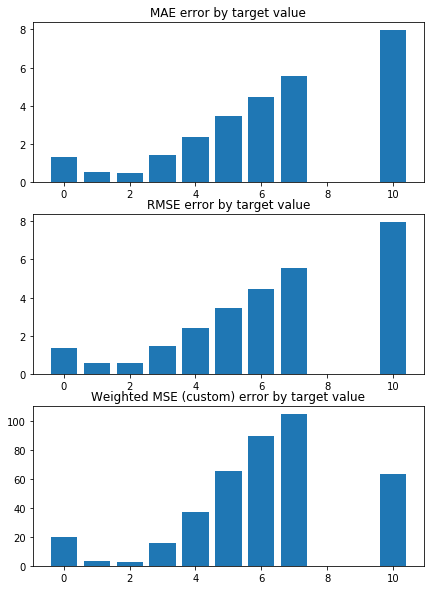

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2335386074086871 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2226111046536265 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


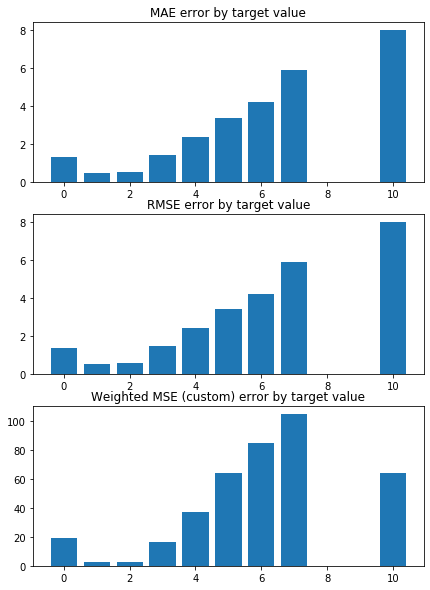

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2038314781308856 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2310533713768435 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


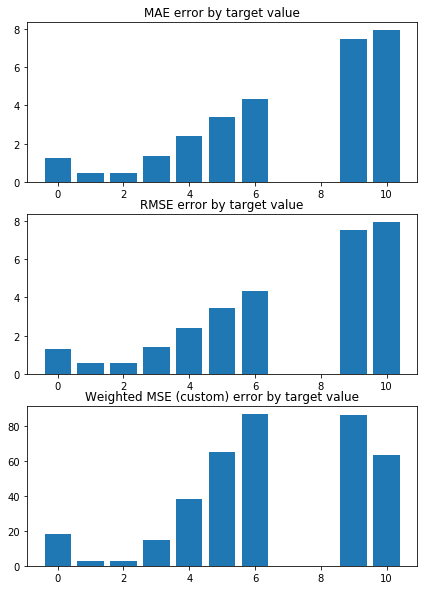

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2178189218004187 


 TRAIN PREDICTION Error
weighted_mse_train: 1.229617601132327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


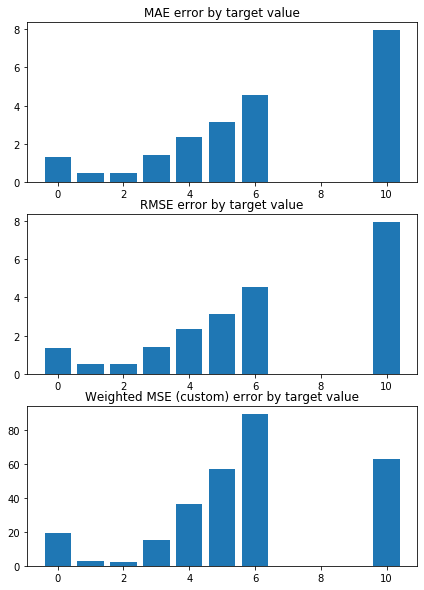

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2913617094452303 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2105278133479194 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


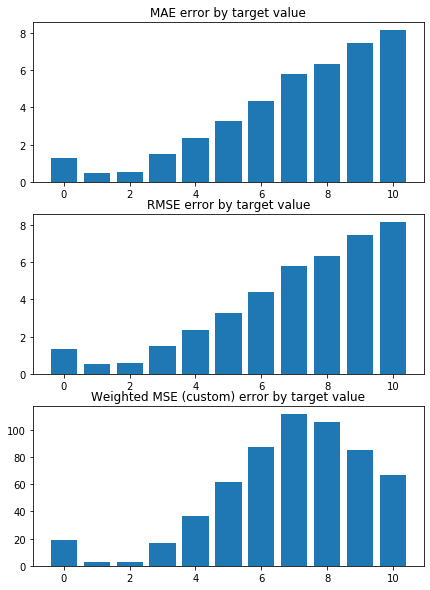

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1545364999971985 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2411282067968807 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


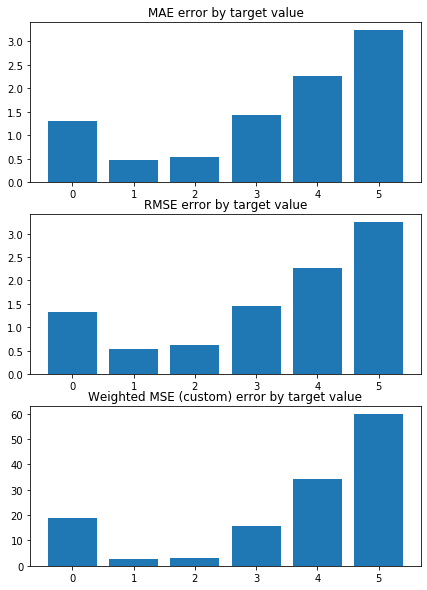

Weighted Mean squared error on Train: 1.23 
 MSE mean train: 1.973906165852458 

Mean squared error on Test: 1.23 
 MSE mean test:  1.9749945464942986 

Root of MSE on Test: 1.11 
 1.4053449919839252 

Variance score on Test: 0.06 
 r2_test: 0.08135932386423997 

wMSE_train 1.23
wMSE_test 1.23
MSE_train 1.97
MSE_test 1.97
MAE_train 1.1
MAE_test 1.04
r2_test 0.08
      Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0 -0.126866  -0.0     0.0       0.0     -0.0
1 -0.125314  -0.0     0.0       0.0     -0.0
2 -0.134546  -0.0     0.0       0.0     -0.0
3 -0.141521  -0.0     0.0       0.0     -0.0
4 -0.126929  -0.0     0.0       0.0     -0.0
5 -0.133792  -0.0     0.0       0.0     -0.0
6 -0.130829  -0.0     0.0       0.0     -0.0
7 -0.130688  -0.0     0.0       0.0     -0.0
8 -0.137543  -0.0     0.0       0.0     -0.0
9 -0.129841  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test:

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


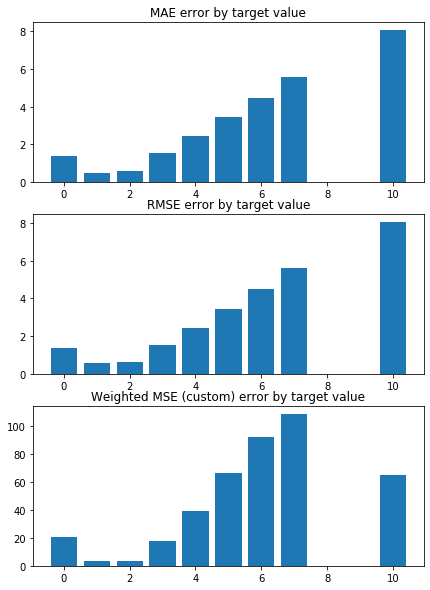

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


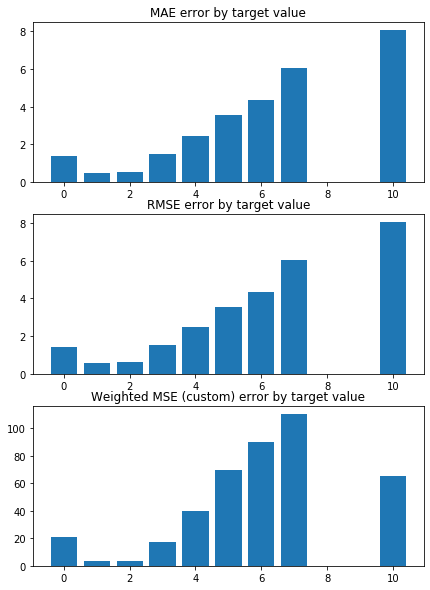

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


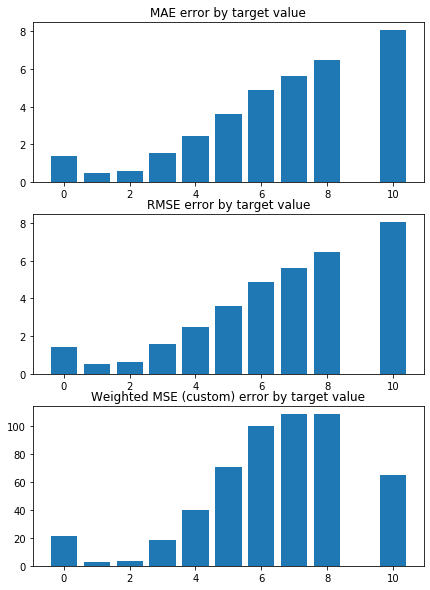

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


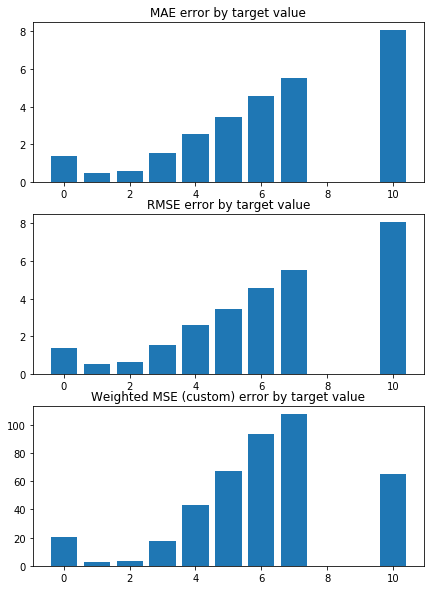

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


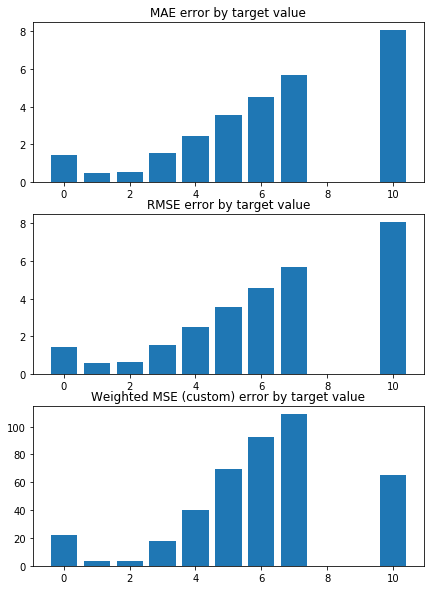

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


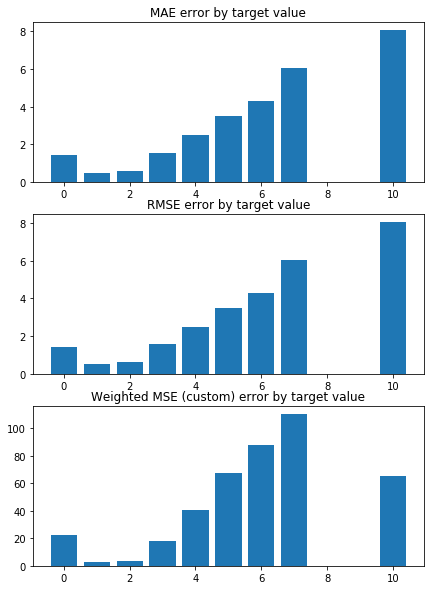

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


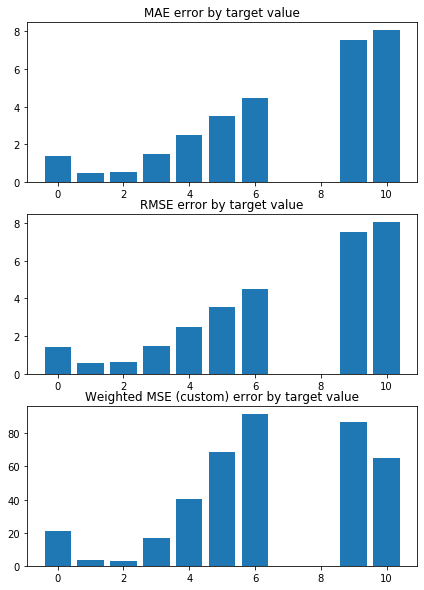

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


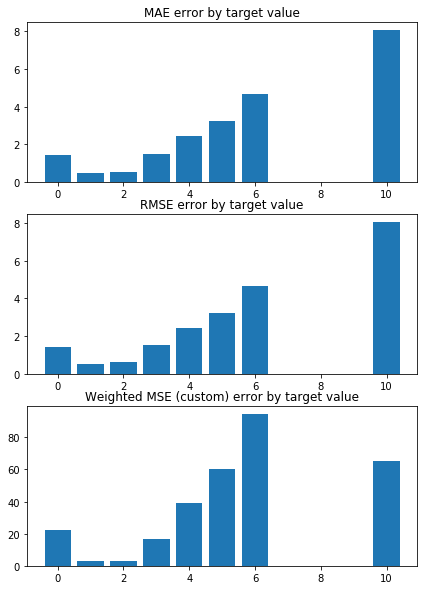

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


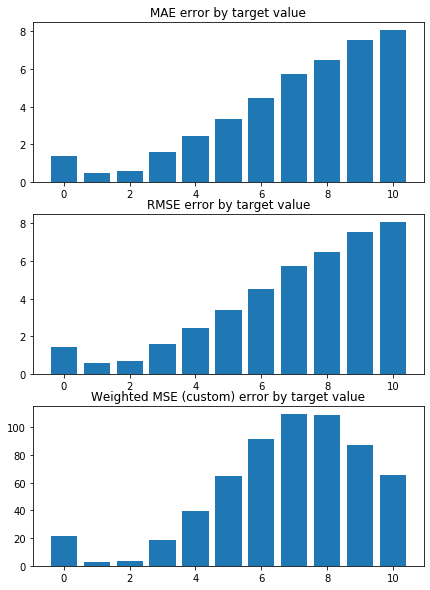

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


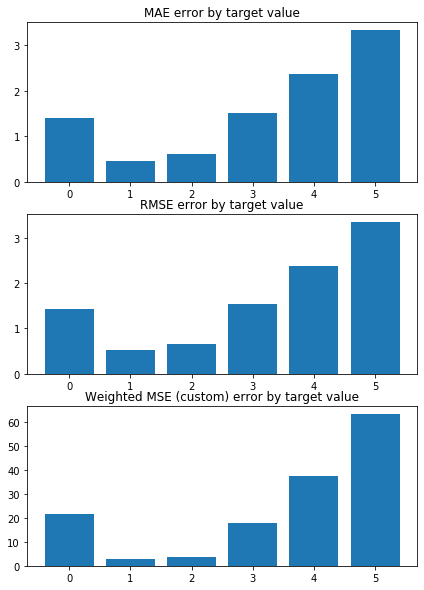

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0     -0.0
1   -0.0  -0.0     0.0       0.0     -0.0
2   -0.0  -0.0     0.0       0.0     -0.0
3   -0.0  -0.0     0.0       0.0     -0.0
4   -0.0  -0.0     0.0       0.0     -0.0
5   -0.0  -0.0     0.0       0.0     -0.0
6   -0.0  -0.0     0.0       0.0     -0.0
7   -0.0  -0.0     0.0       0.0     -0.0
8   -0.0  -0.0     0.0       0.0     -0.0
9   -0.0  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4063865324088682 


 TRAI

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


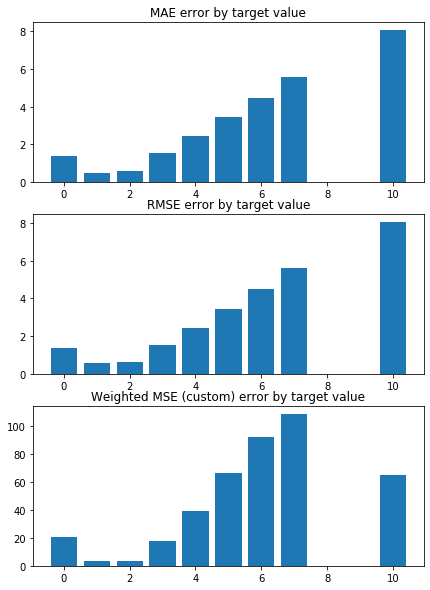

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


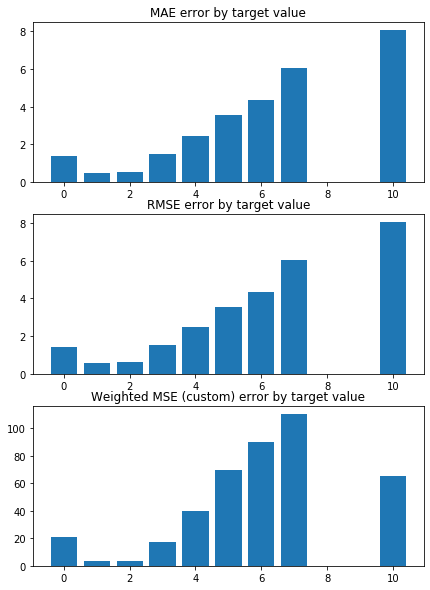

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


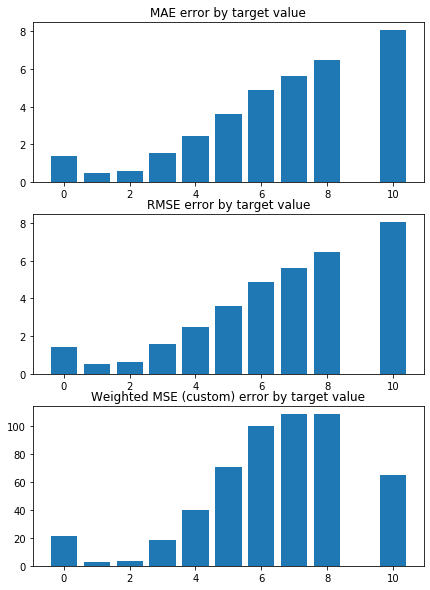

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


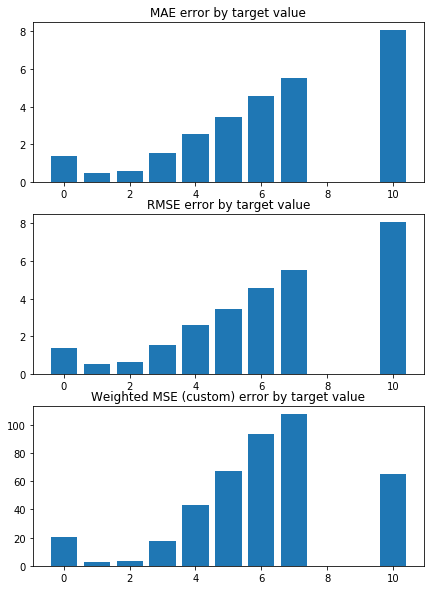

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


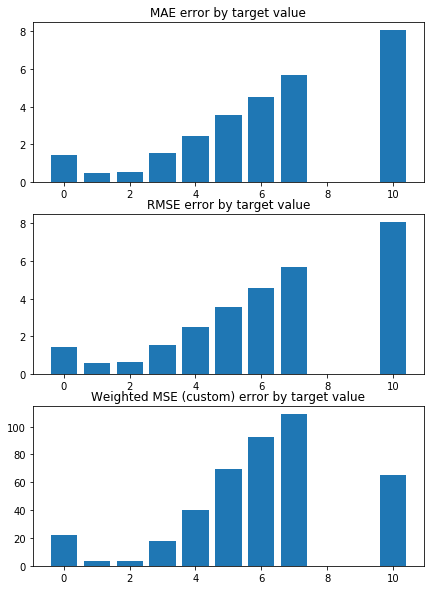

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


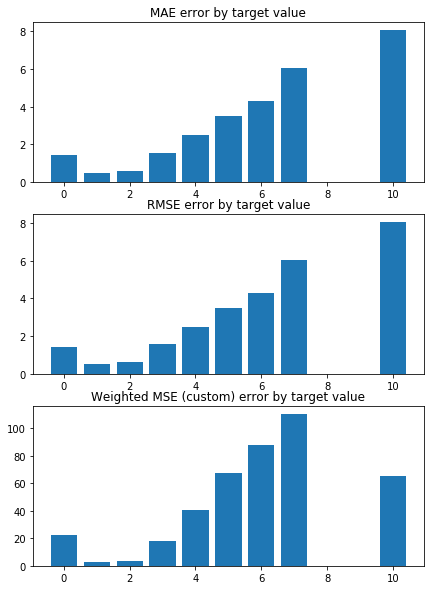

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


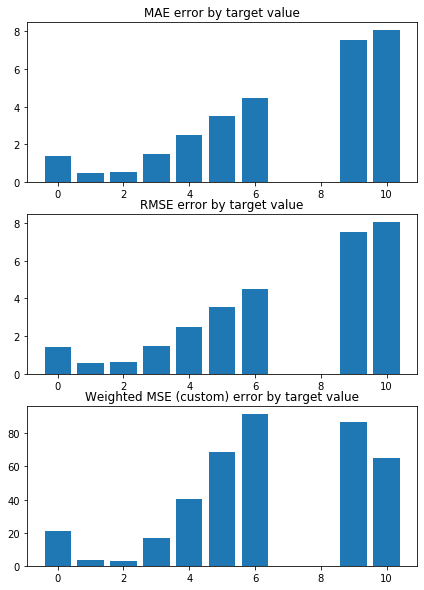

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


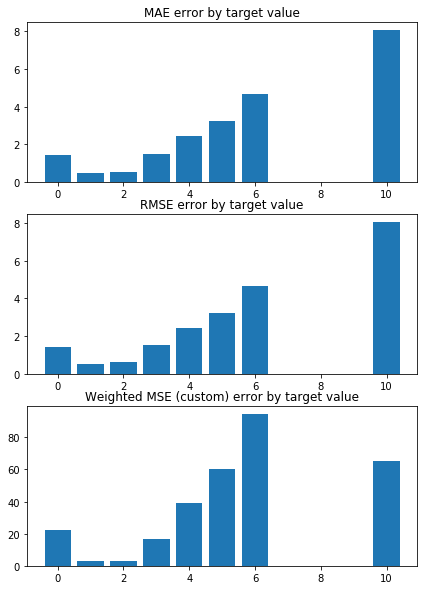

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


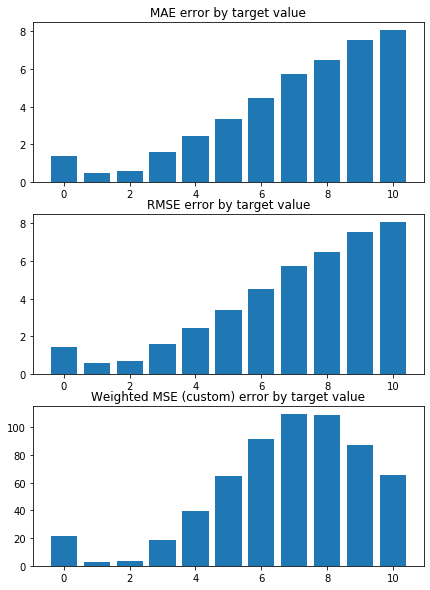

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


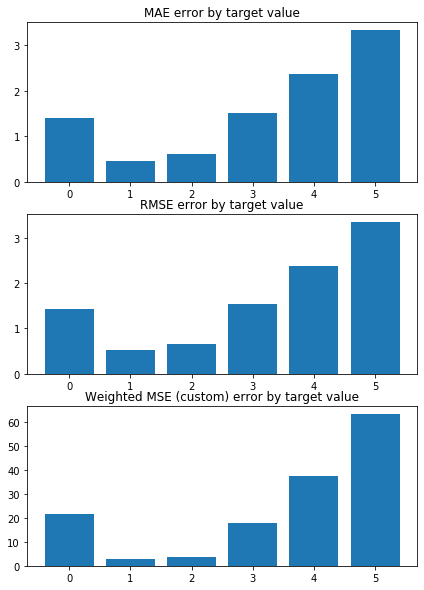

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0     -0.0
1   -0.0  -0.0     0.0       0.0     -0.0
2   -0.0  -0.0     0.0       0.0     -0.0
3   -0.0  -0.0     0.0       0.0     -0.0
4   -0.0  -0.0     0.0       0.0     -0.0
5   -0.0  -0.0     0.0       0.0     -0.0
6   -0.0  -0.0     0.0       0.0     -0.0
7   -0.0  -0.0     0.0       0.0     -0.0
8   -0.0  -0.0     0.0       0.0     -0.0
9   -0.0  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4063865324088682 


 TRAI

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


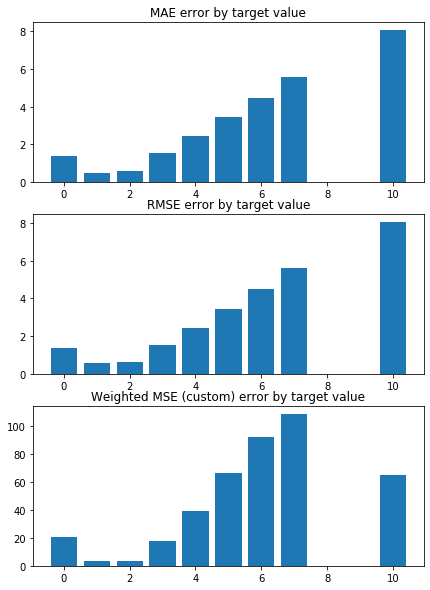

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


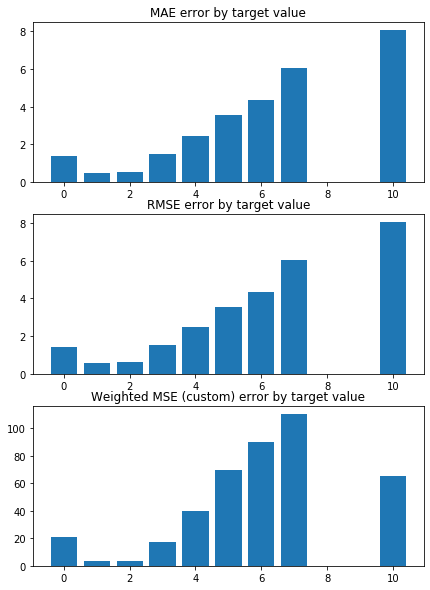

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


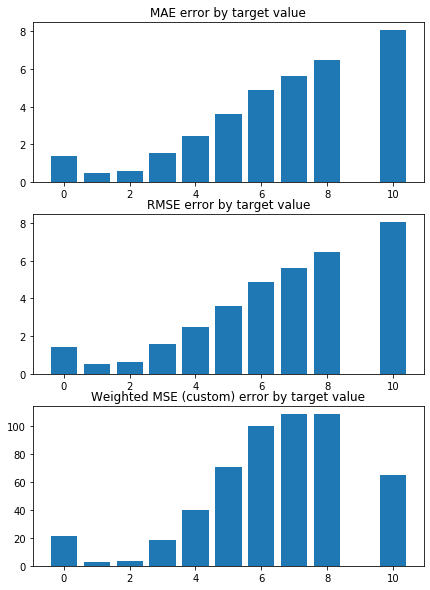

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


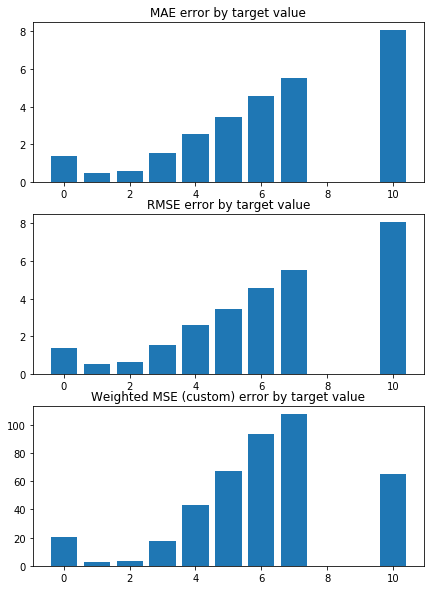

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


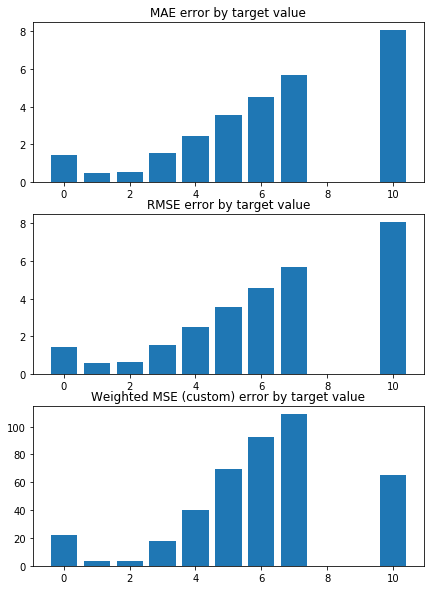

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


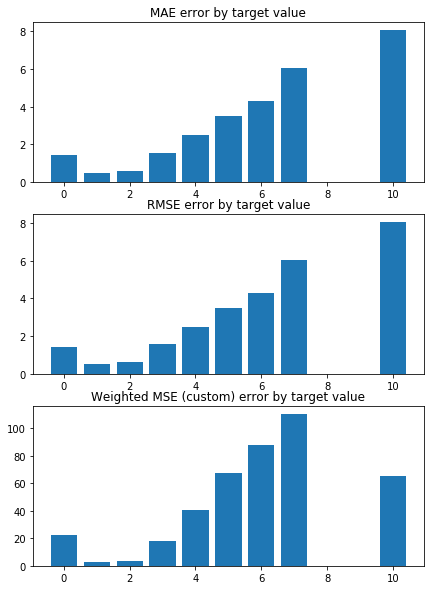

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


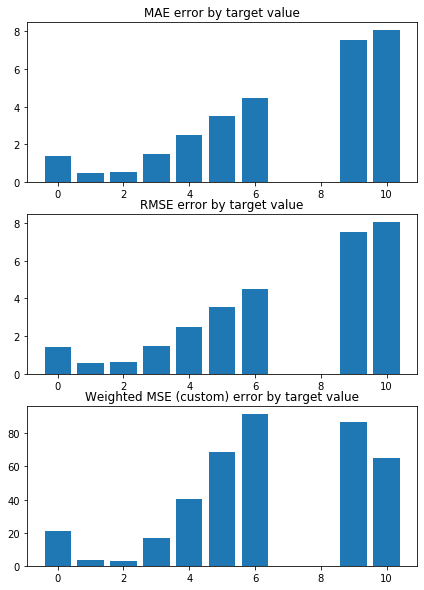

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


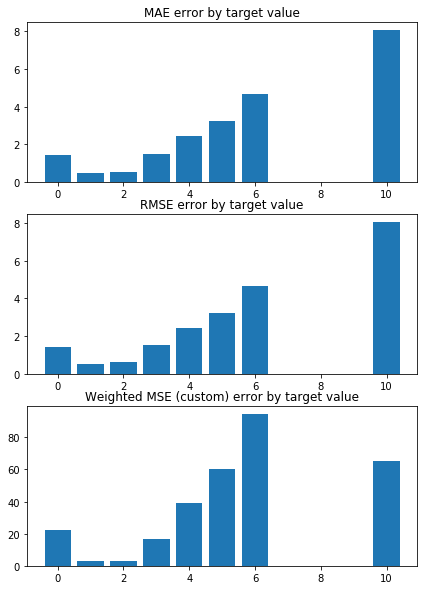

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


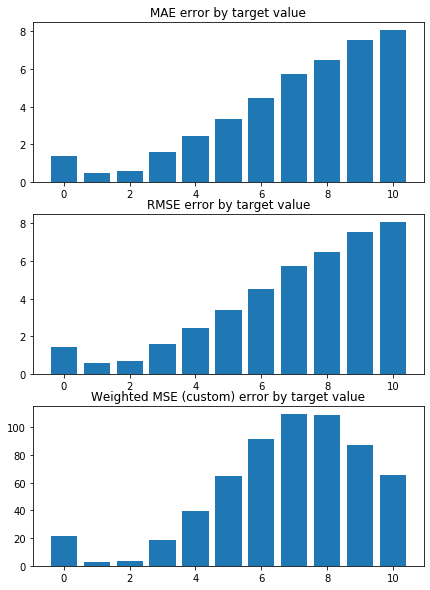

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


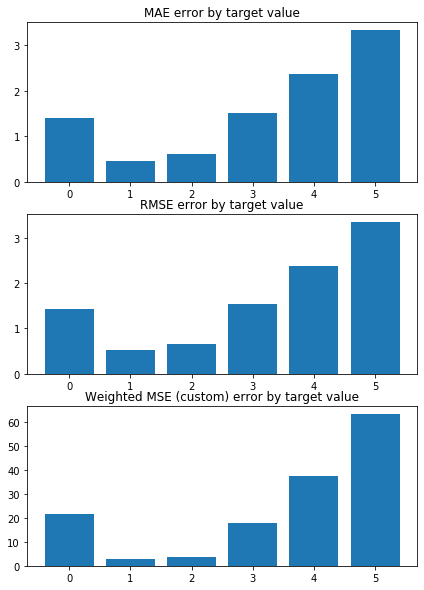

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0     -0.0
1   -0.0  -0.0     0.0       0.0     -0.0
2   -0.0  -0.0     0.0       0.0     -0.0
3   -0.0  -0.0     0.0       0.0     -0.0
4   -0.0  -0.0     0.0       0.0     -0.0
5   -0.0  -0.0     0.0       0.0     -0.0
6   -0.0  -0.0     0.0       0.0     -0.0
7   -0.0  -0.0     0.0       0.0     -0.0
8   -0.0  -0.0     0.0       0.0     -0.0
9   -0.0  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4063865324088682 


 TRAI

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


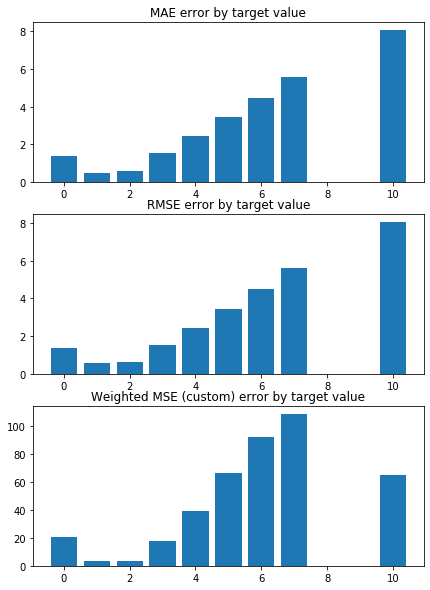

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


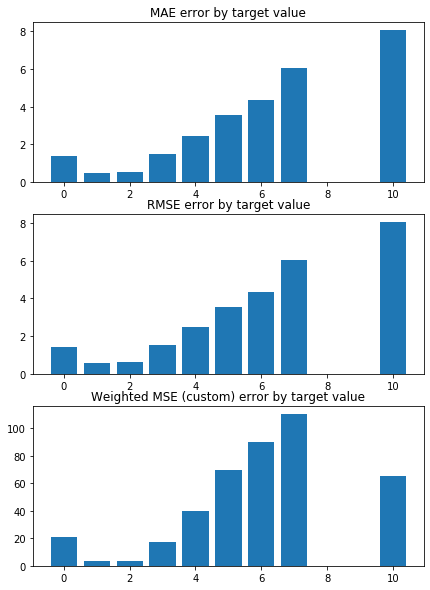

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


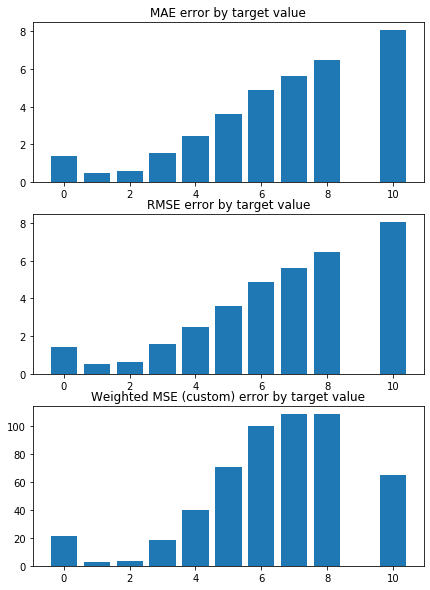

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


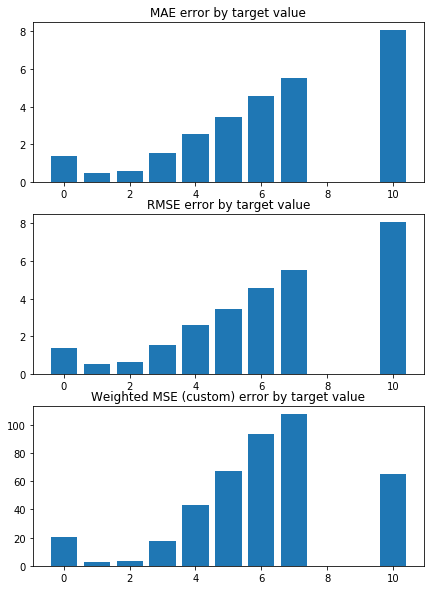

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


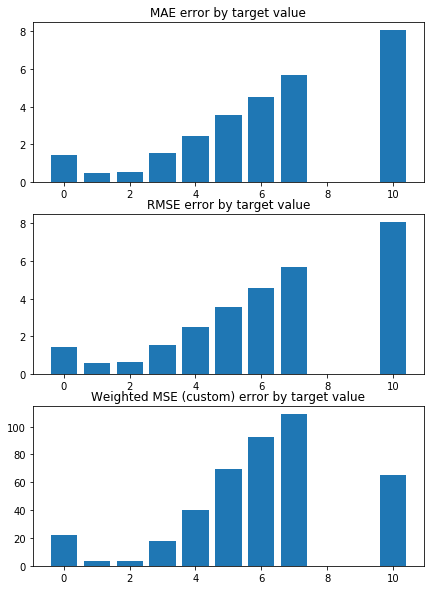

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


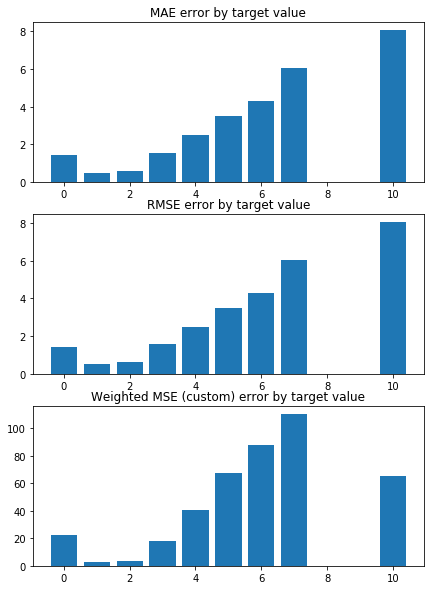

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


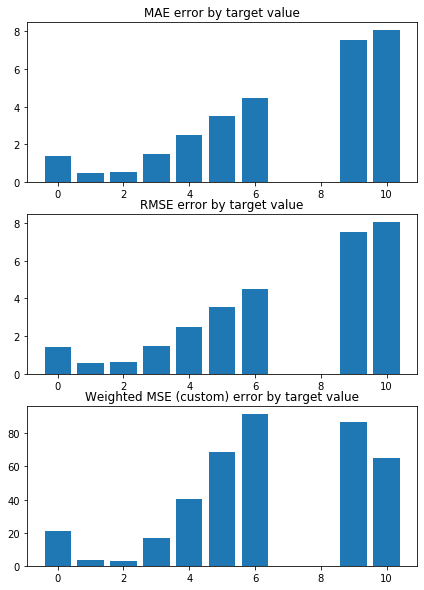

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


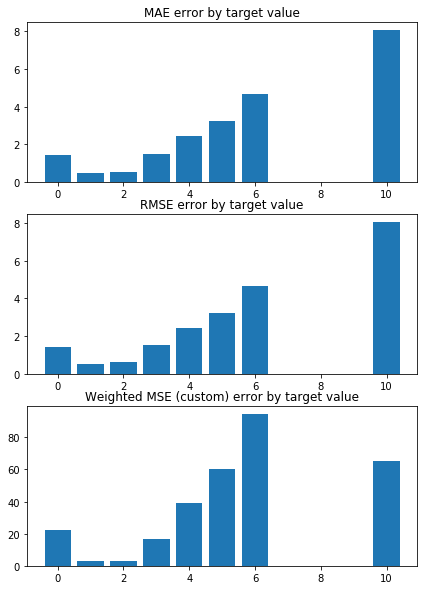

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


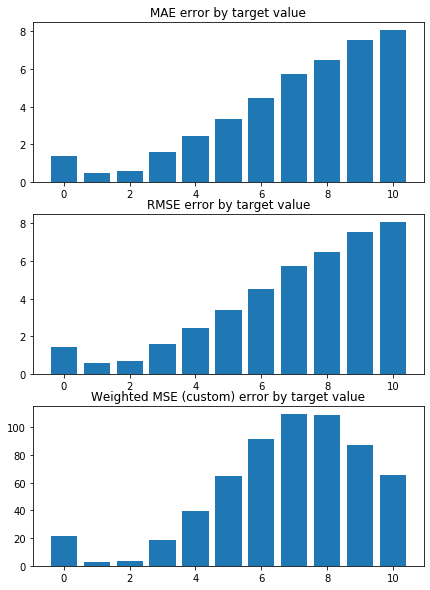

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


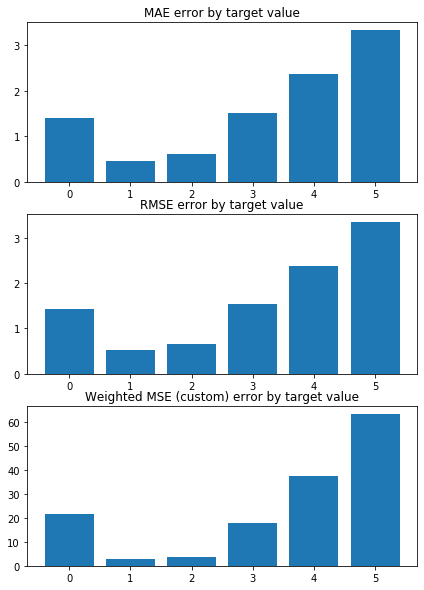

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0     -0.0
1   -0.0  -0.0     0.0       0.0     -0.0
2   -0.0  -0.0     0.0       0.0     -0.0
3   -0.0  -0.0     0.0       0.0     -0.0
4   -0.0  -0.0     0.0       0.0     -0.0
5   -0.0  -0.0     0.0       0.0     -0.0
6   -0.0  -0.0     0.0       0.0     -0.0
7   -0.0  -0.0     0.0       0.0     -0.0
8   -0.0  -0.0     0.0       0.0     -0.0
9   -0.0  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4063865324088682 


 TRAI

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


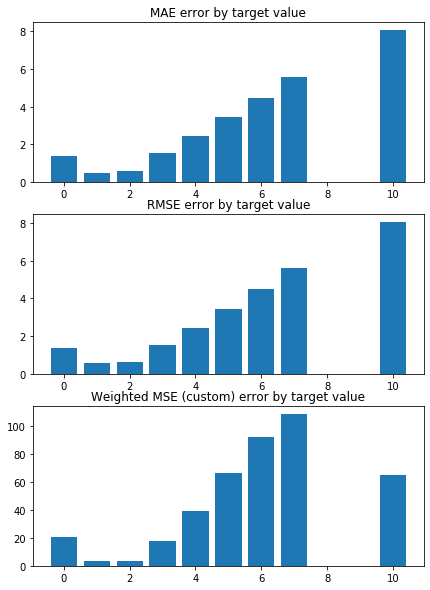

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


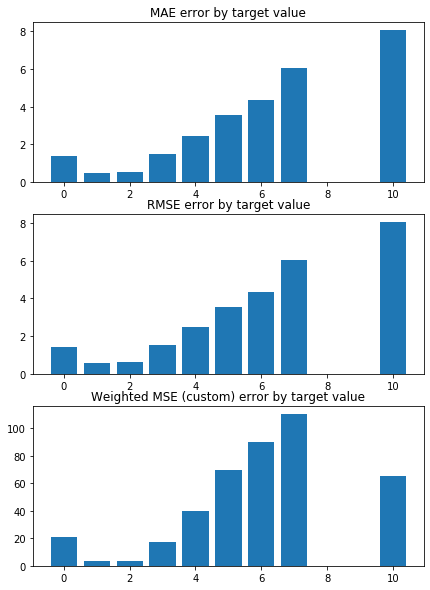

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


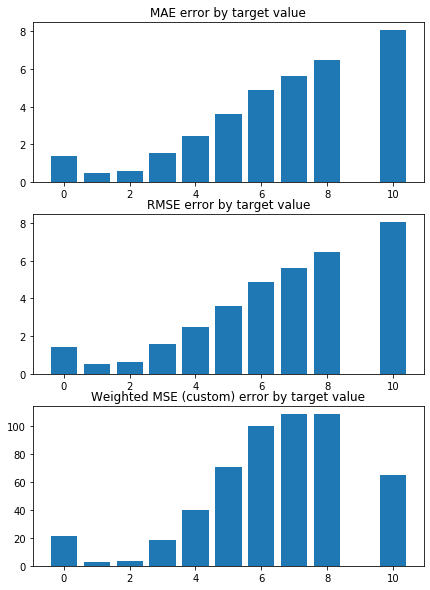

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


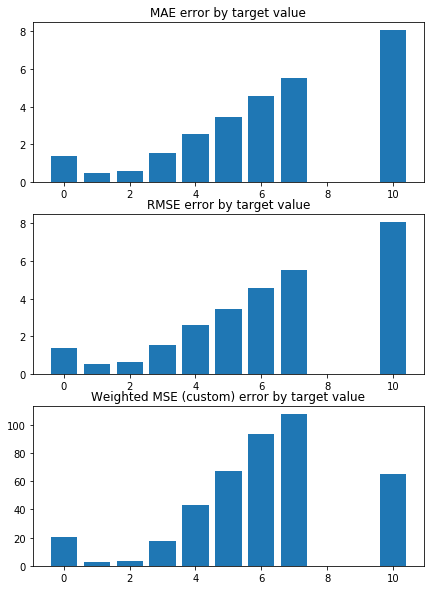

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


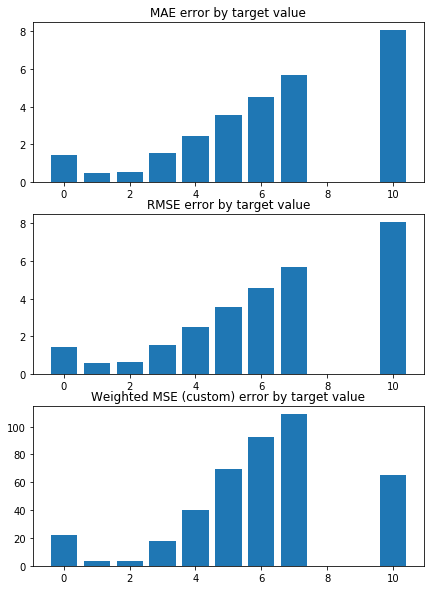

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


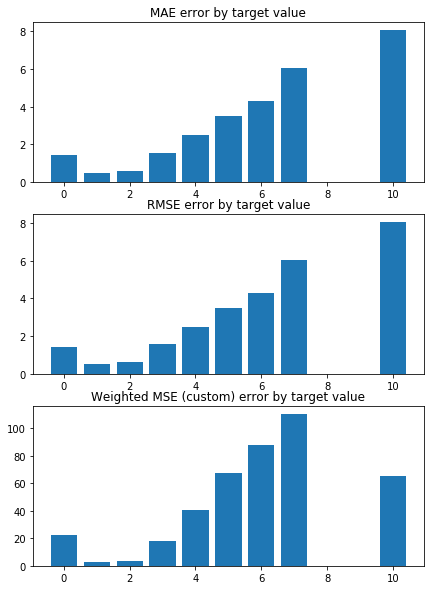

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


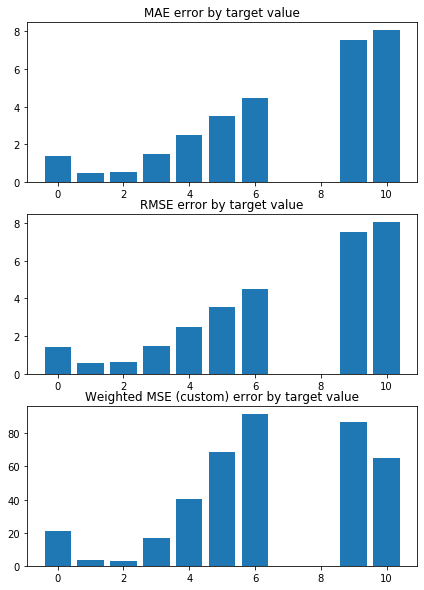

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


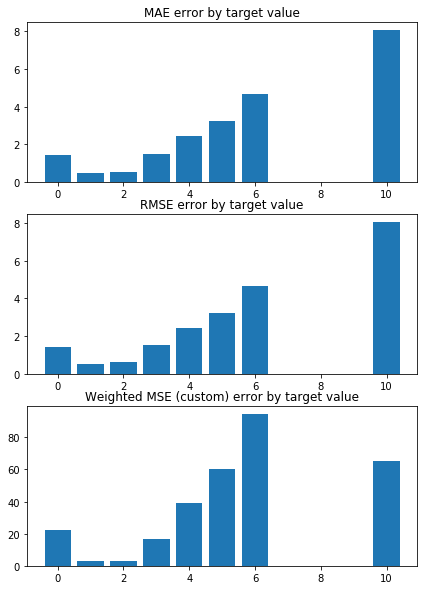

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


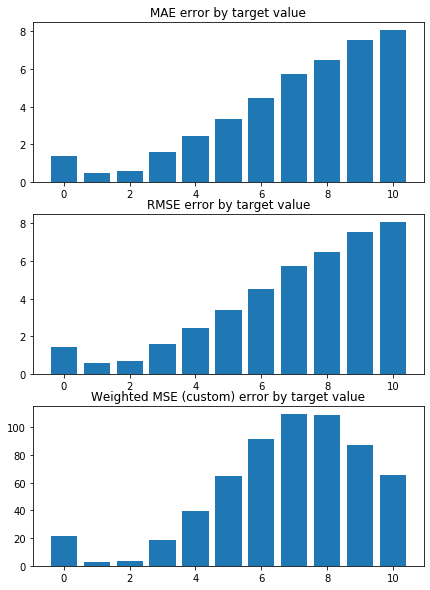

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


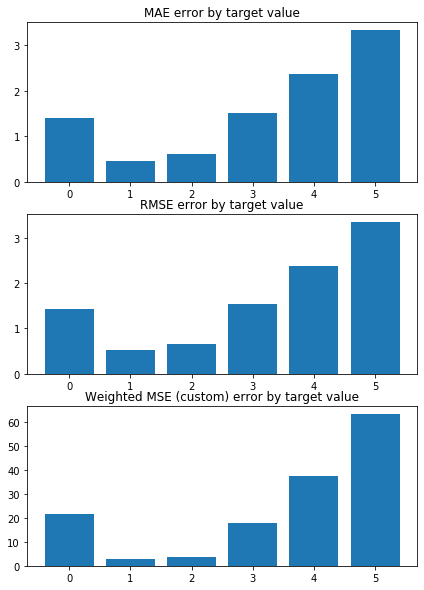

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0     -0.0
1   -0.0  -0.0     0.0       0.0     -0.0
2   -0.0  -0.0     0.0       0.0     -0.0
3   -0.0  -0.0     0.0       0.0     -0.0
4   -0.0  -0.0     0.0       0.0     -0.0
5   -0.0  -0.0     0.0       0.0     -0.0
6   -0.0  -0.0     0.0       0.0     -0.0
7   -0.0  -0.0     0.0       0.0     -0.0
8   -0.0  -0.0     0.0       0.0     -0.0
9   -0.0  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4063865324088682 


 TRAI

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


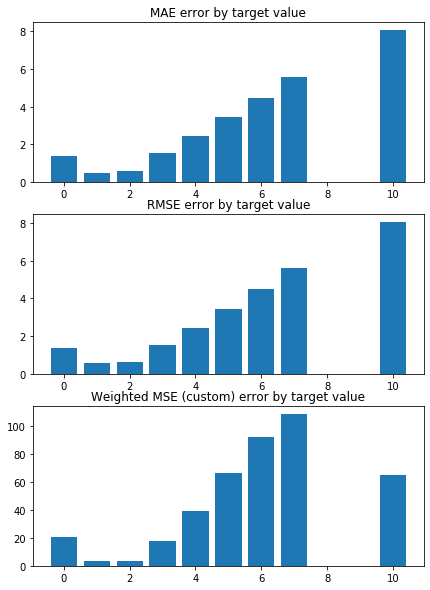

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


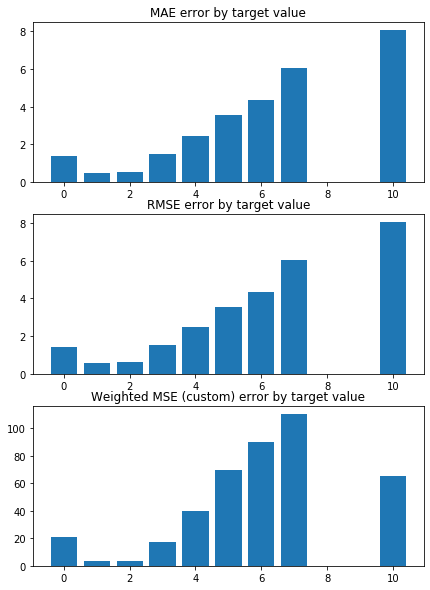

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


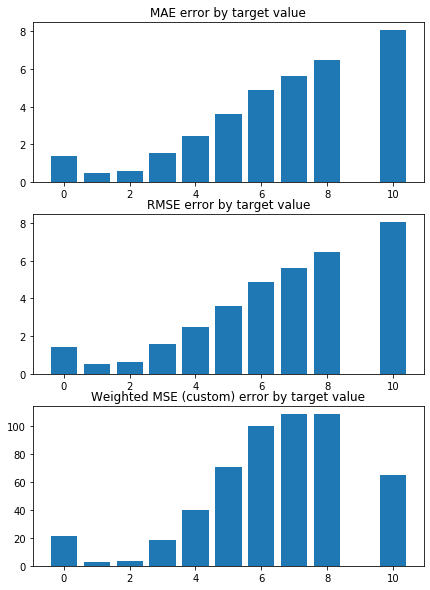

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


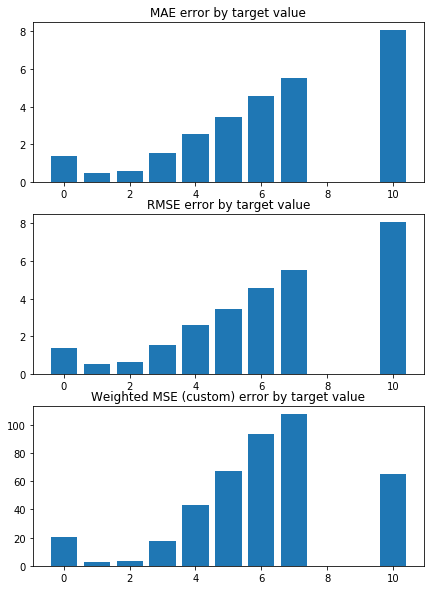

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


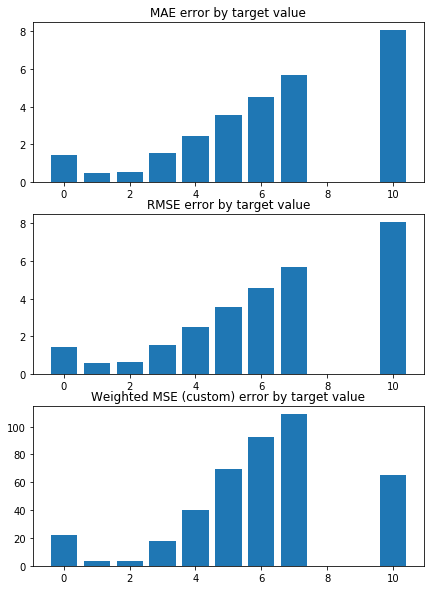

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


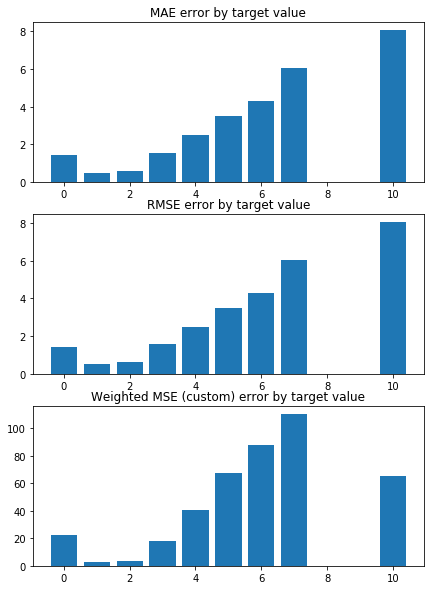

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


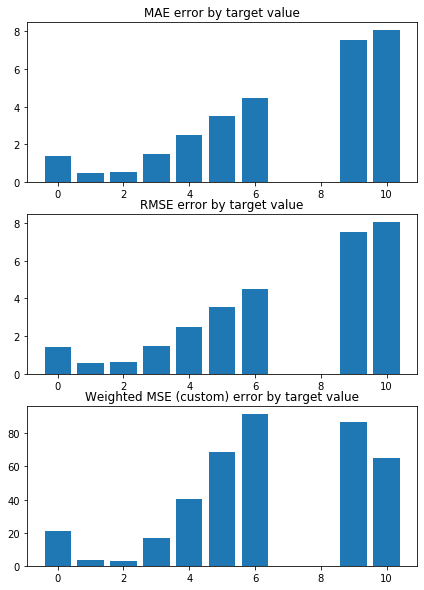

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


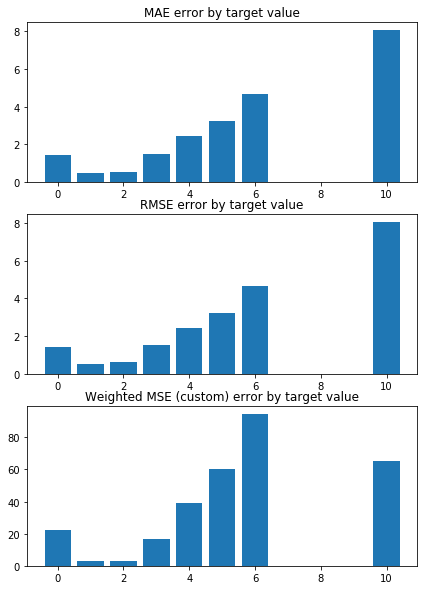

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


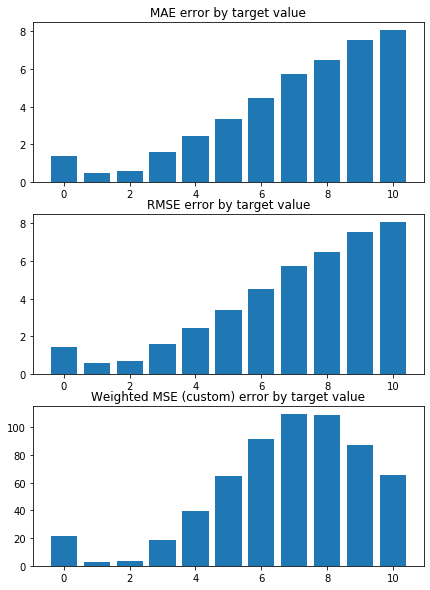

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


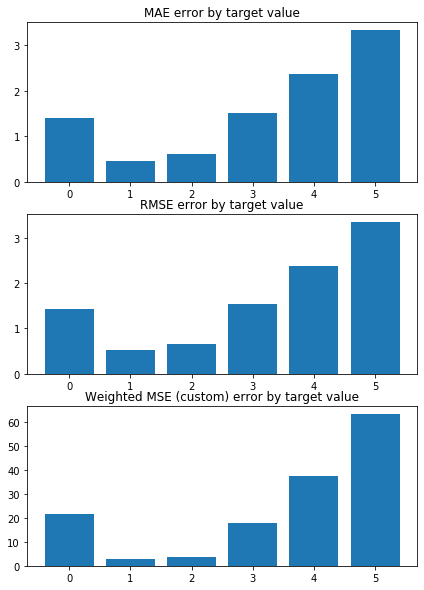

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0     -0.0
1   -0.0  -0.0     0.0       0.0     -0.0
2   -0.0  -0.0     0.0       0.0     -0.0
3   -0.0  -0.0     0.0       0.0     -0.0
4   -0.0  -0.0     0.0       0.0     -0.0
5   -0.0  -0.0     0.0       0.0     -0.0
6   -0.0  -0.0     0.0       0.0     -0.0
7   -0.0  -0.0     0.0       0.0     -0.0
8   -0.0  -0.0     0.0       0.0     -0.0
9   -0.0  -0.0     0.0       0.0     -0.0


In [78]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 2, 0.2)
# Create linear regression object

model_name = 'LR+L1_grid'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

for alpha in alpha_grid:
    model = linear_model.Lasso(alpha=alpha)

    

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    _ = train_test_KFold(X, y, 
                                                  model, model_name, results_pd,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)
#     results_pd
    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))


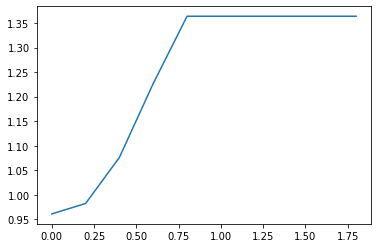

In [79]:
plt.plot(alpha_grid, wmse_test)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9455995888906196 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9603754462685091 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4283.493843344127, tolerance: 1.157624653381885
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

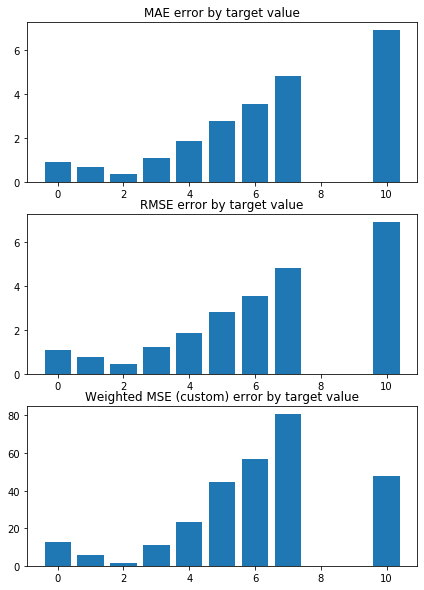

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8505579048187755 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9703194255065085 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4255.715907018319, tolerance: 1.1556851426591965
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

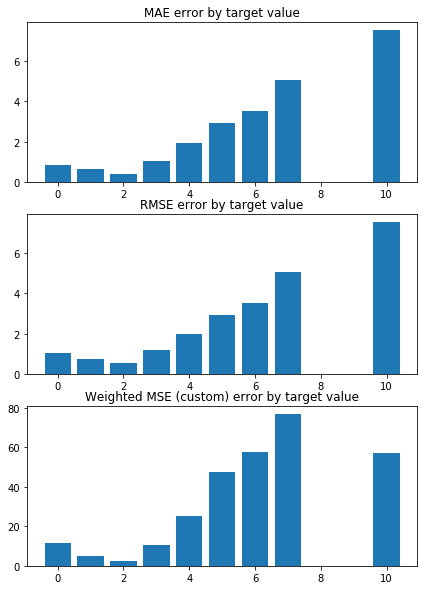

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0395098799433695 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518809239249897 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4141.437276359796, tolerance: 1.1390143168328661
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

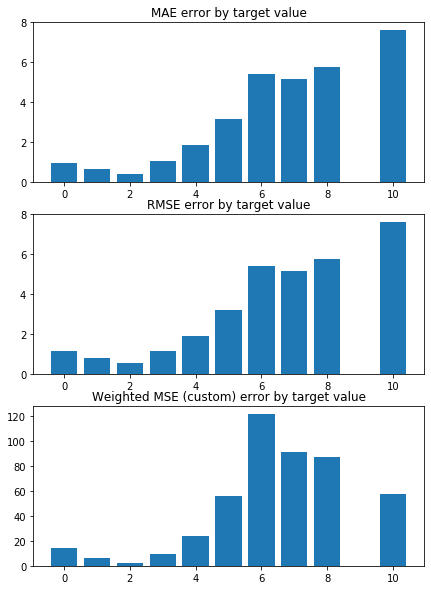

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9679932045405429 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9557725900337942 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4110.026989822735, tolerance: 1.134086969012138
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

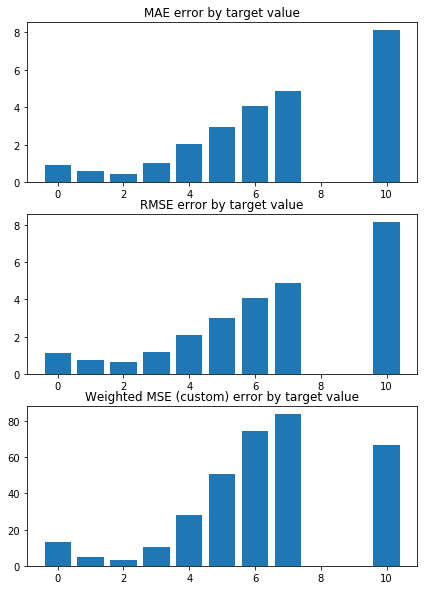

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.041155132628397 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9482024895993995 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4189.8603892790925, tolerance: 1.1411477756974782
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounte

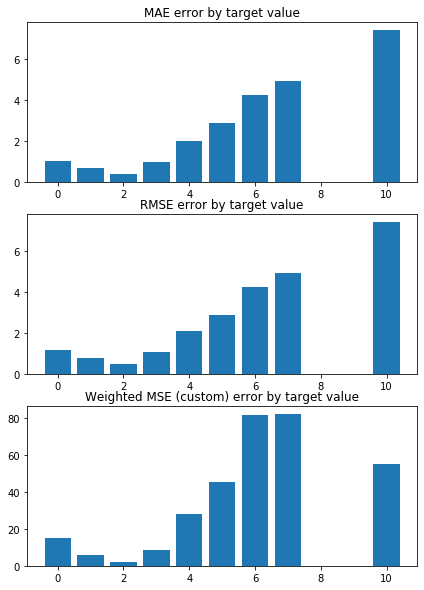

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642521288450389 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9568170964093331 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4197.58486227444, tolerance: 1.1451602222857147
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

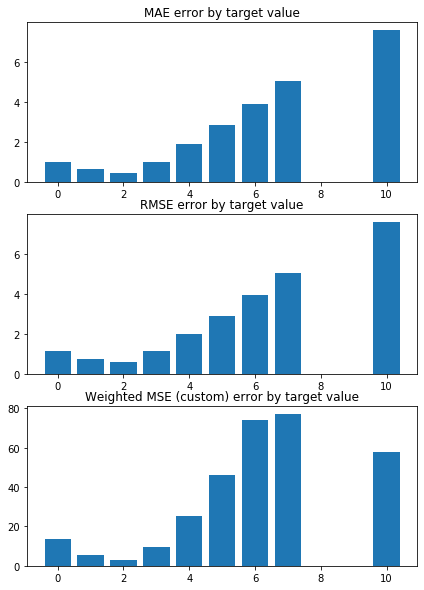

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9734548226658905 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9586834206397351 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4266.849385438329, tolerance: 1.162511723331466
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

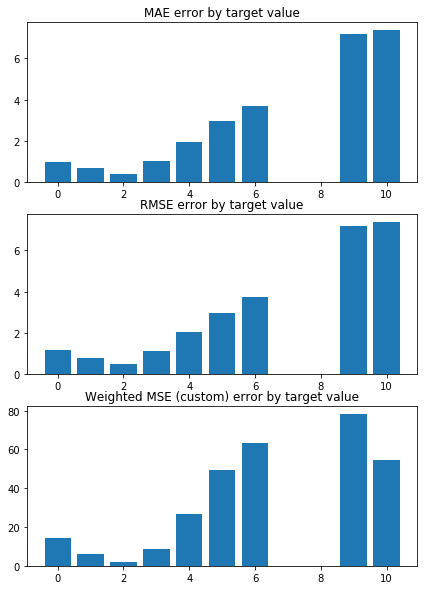

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9425846536237507 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9610023690953802 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4278.562239754587, tolerance: 1.1623169966386562
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

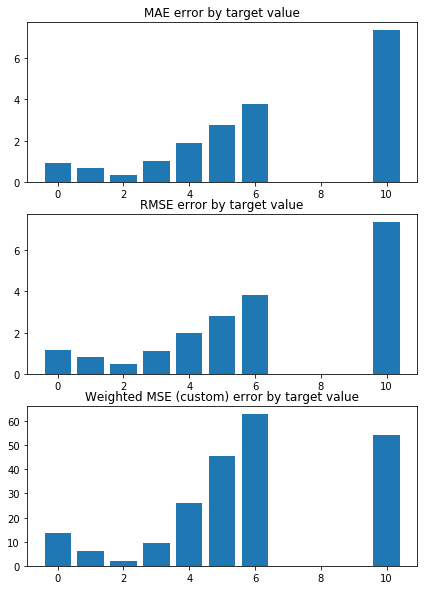

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0459065815277122 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9473869909682893 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4099.268192642675, tolerance: 1.1313881385546216
  positive)


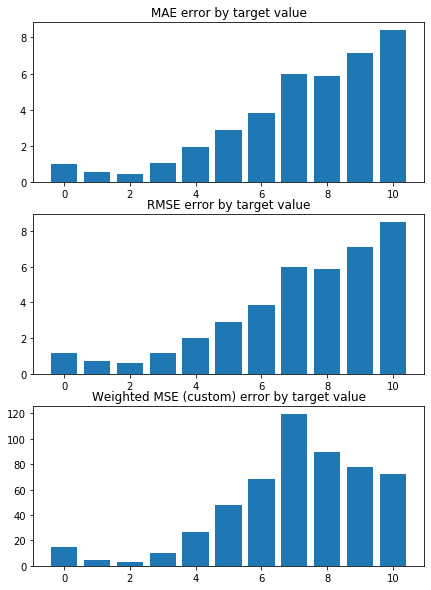

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8370351058117279 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9755965144073965 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4377.136345151623, tolerance: 1.181346870110178
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

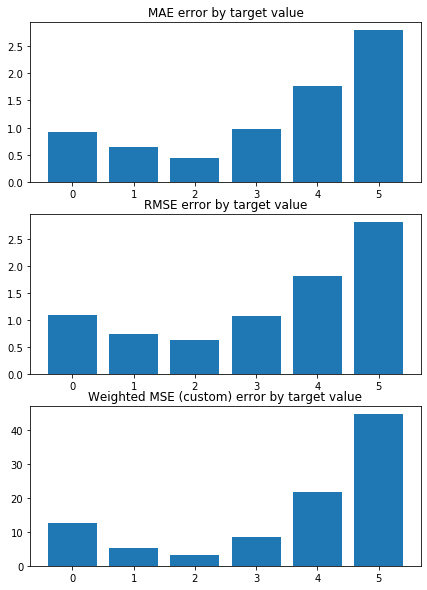

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760946939714553 

Mean squared error on Test: 0.96 
 MSE mean test:  1.579956057333393 

Root of MSE on Test: 0.98 
 1.2569630294218652 

Variance score on Test: 0.07 
 r2_test: 0.26927210899686277 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604917 -0.190577 -0.077341 -0.035250  0.013724
1 -0.605994 -0.209867 -0.069082 -0.046829  0.007790
2 -0.606345 -0.203347 -0.092007 -0.044125  0.009684
3 -0.613834 -0.199451 -0.066803 -0.050258  0.017438
4 -0.592805 -0.207426 -0.080341 -0.046697  0.022904
5 -0.599567 -0.199354 -0.070598 -0.039149  0.025675
6 -0.603285 -0.218941 -0.074712 -0.045496 -0.001745
7 -0.608094 -0.200640 -0.078664 -0.042130  0.012393
8 -0.603454 -0.207045 -0.077731 -0.039399  0.016631
9 -0.595396 -0.206297 -0.087506 -0.050025  0.019883
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


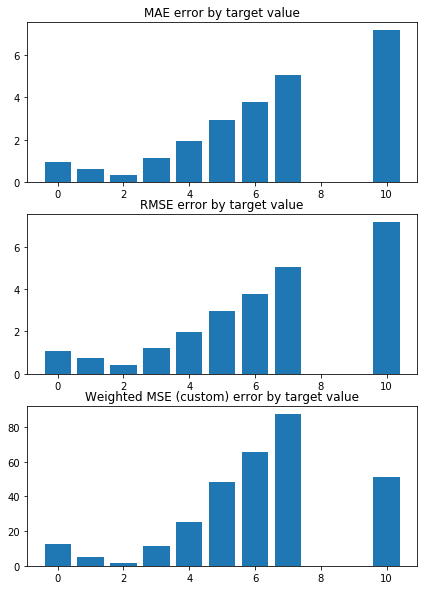

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.850940712310084 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9719448065124134 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


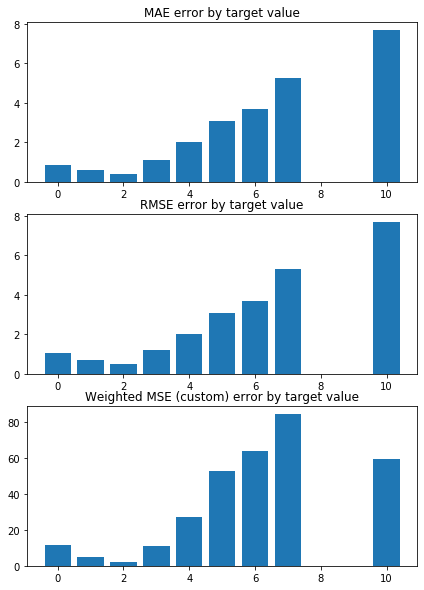

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0234688445097615 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9527522978695978 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


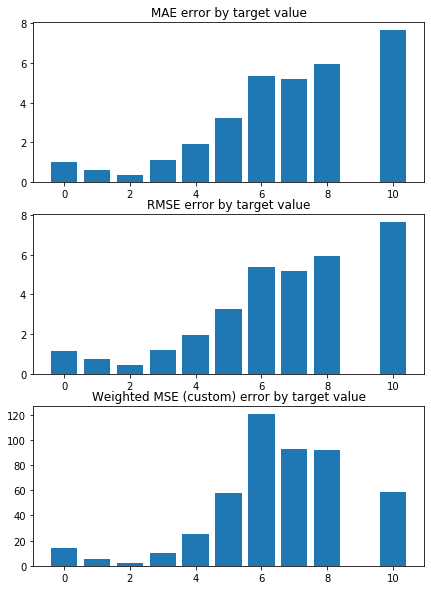

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9675680410478069 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9574200072806973 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


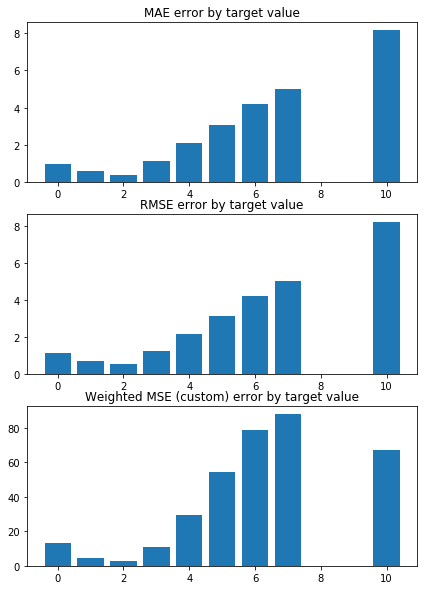

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0362925053602312 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9509803219077276 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


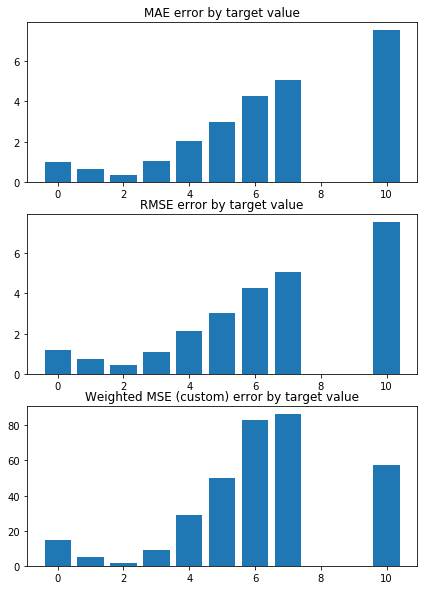

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9772667648070587 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9593729775795841 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


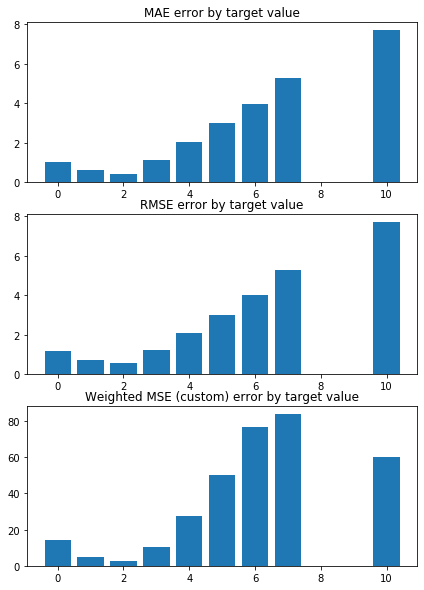

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9613785521268068 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9592366886912291 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


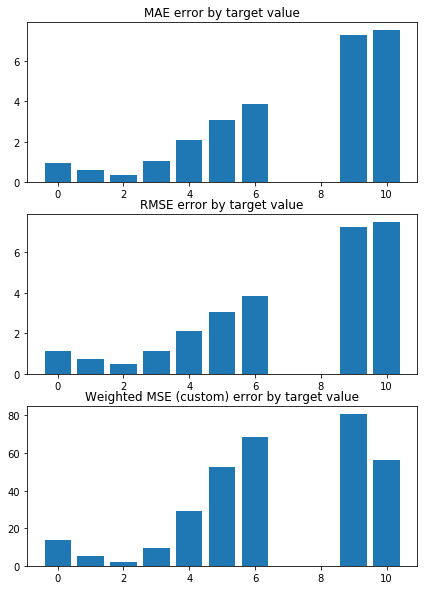

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9474823009360779 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9620605812471626 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


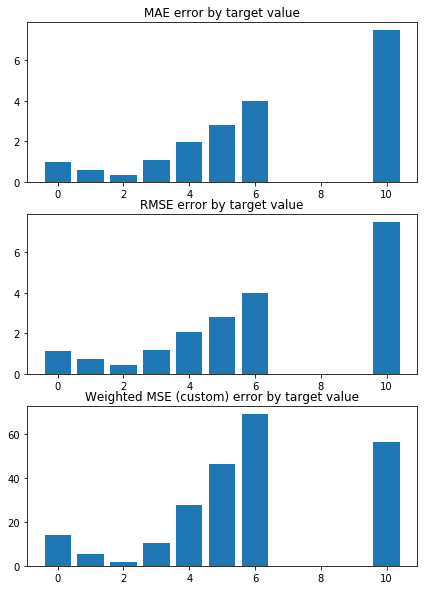

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0491763529308948 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9475739048364612 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


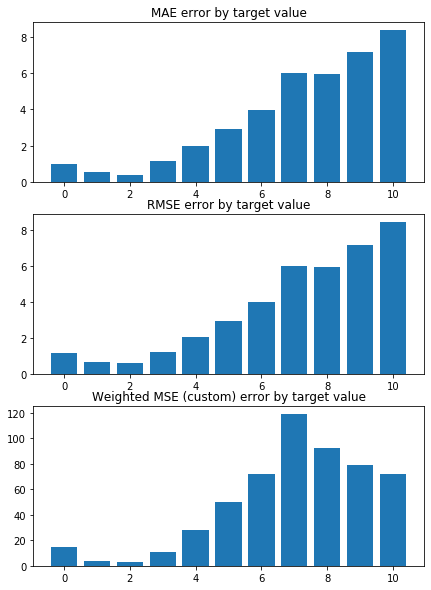

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8357462227859694 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9768550537481705 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


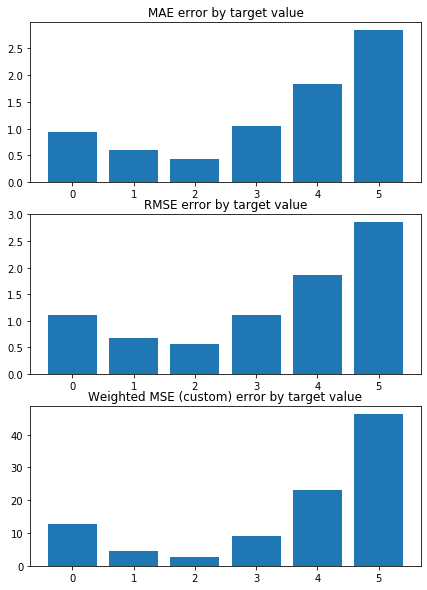

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.59665771685474 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5989125667331099 

Root of MSE on Test: 0.98 
 1.2644811452659583 

Variance score on Test: 0.07 
 r2_test: 0.2604245569013617 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.6
MSE_test 1.6
MAE_train 0.92
MAE_test 0.84
r2_test 0.26
      Chriz   H3K27ac      CTCF  Su(Hw)  H3K27me3
0 -0.553773 -0.128228 -0.006471     0.0      -0.0
1 -0.550522 -0.145467 -0.000110     0.0      -0.0
2 -0.553253 -0.139565 -0.019238     0.0      -0.0
3 -0.562386 -0.134764 -0.000000     0.0      -0.0
4 -0.544222 -0.140895 -0.010468     0.0      -0.0
5 -0.552521 -0.136517 -0.000000     0.0      -0.0
6 -0.546912 -0.153368 -0.006041     0.0      -0.0
7 -0.555595 -0.136974 -0.006660     0.0      -0.0
8 -0.553273 -0.144098 -0.008414     0.0      -0.0
9 -0.546478 -0.138241 -0.019242     0.0      -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


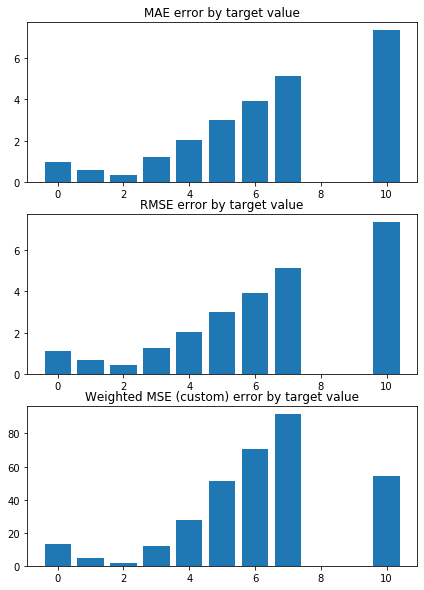

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.86858850446636 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9929325445569973 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


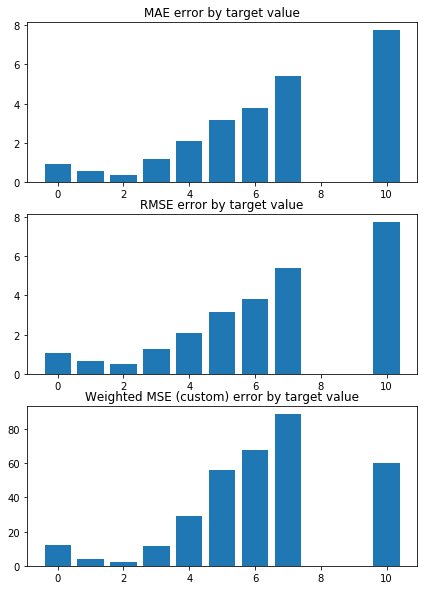

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.035376530635326 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9753536877885366 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


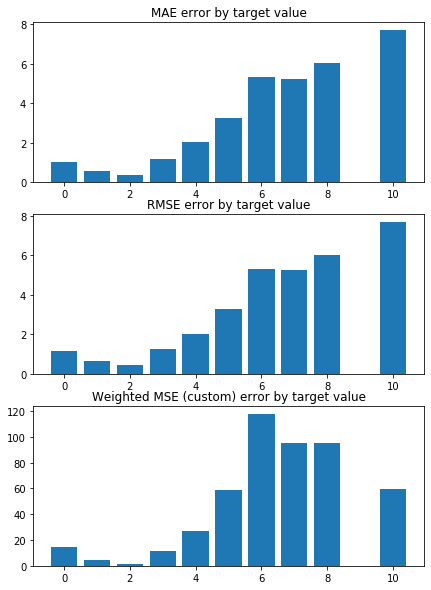

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9829619394080757 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9773188126350543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


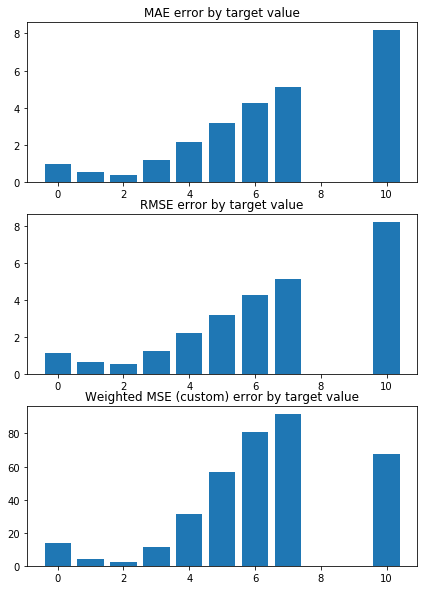

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0636448049237517 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9729646247043543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


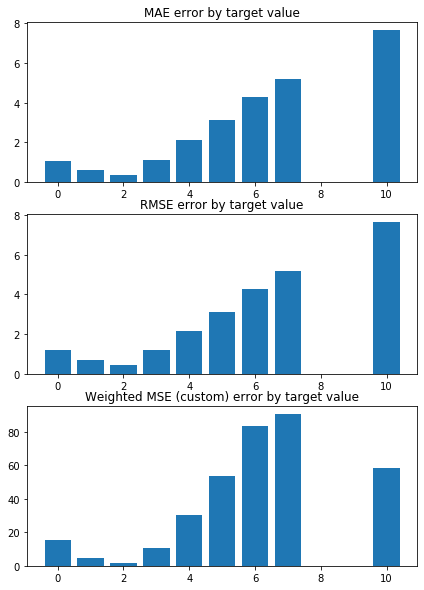

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0004206103482998 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9799153821287289 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


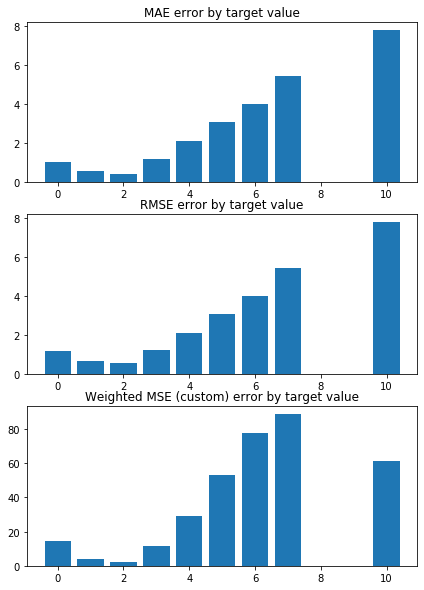

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9689756702855213 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9806770169906543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


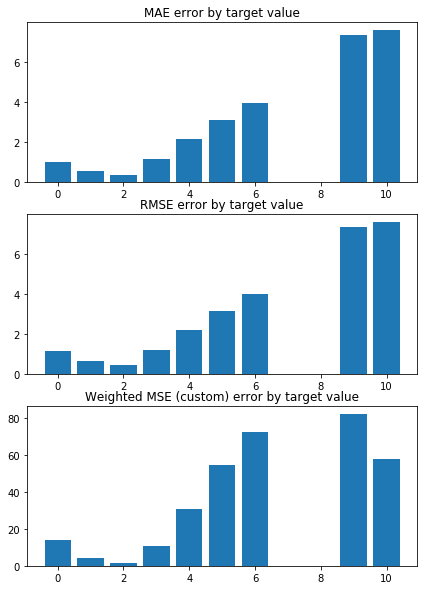

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9690944733715253 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9834480415498508 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


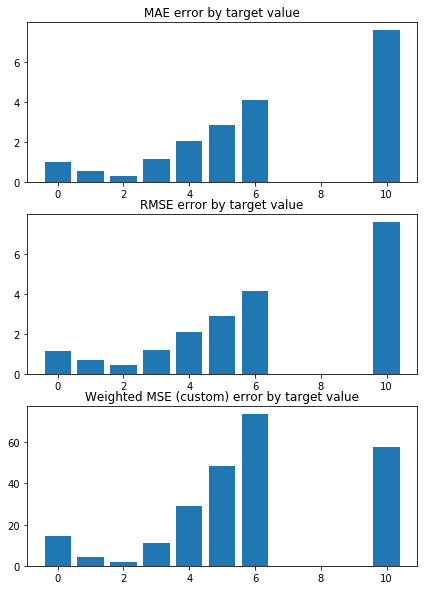

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0661108968050799 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9678888287300402 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


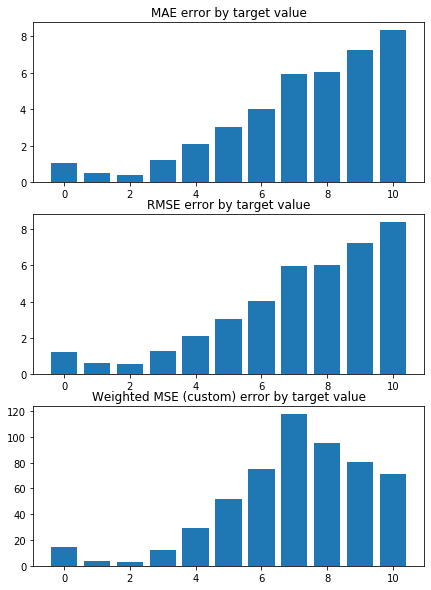

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8690106767147683 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9991037630069876 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


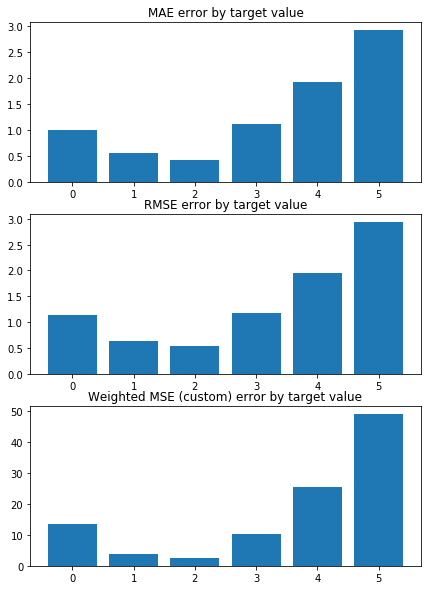

Weighted Mean squared error on Train: 0.98 
 MSE mean train: 1.6363542969769356 

Mean squared error on Test: 0.98 
 MSE mean test:  1.6377671808995646 

Root of MSE on Test: 0.99 
 1.2797527811650047 

Variance score on Test: 0.07 
 r2_test: 0.24186579603713138 

wMSE_train 0.98
wMSE_test 0.98
MSE_train 1.64
MSE_test 1.64
MAE_train 0.94
MAE_test 0.86
r2_test 0.24
      Chriz   H3K27ac  CTCF  Su(Hw)  H3K27me3
0 -0.490566 -0.065055  -0.0     0.0       0.0
1 -0.484760 -0.082044  -0.0     0.0      -0.0
2 -0.492167 -0.077468  -0.0     0.0      -0.0
3 -0.498552 -0.071579  -0.0     0.0      -0.0
4 -0.482695 -0.076471  -0.0     0.0      -0.0
5 -0.488640 -0.073731  -0.0     0.0       0.0
6 -0.483315 -0.089801  -0.0     0.0      -0.0
7 -0.492206 -0.073168  -0.0     0.0      -0.0
8 -0.490792 -0.081568  -0.0     0.0       0.0
9 -0.487612 -0.073141  -0.0     0.0      -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weigh

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


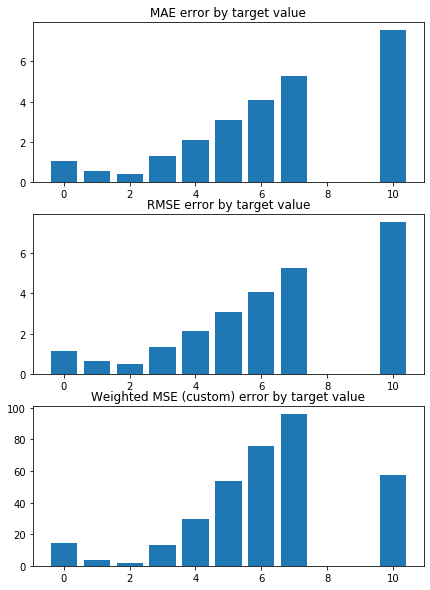

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9099745606182759 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0359264465003086 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


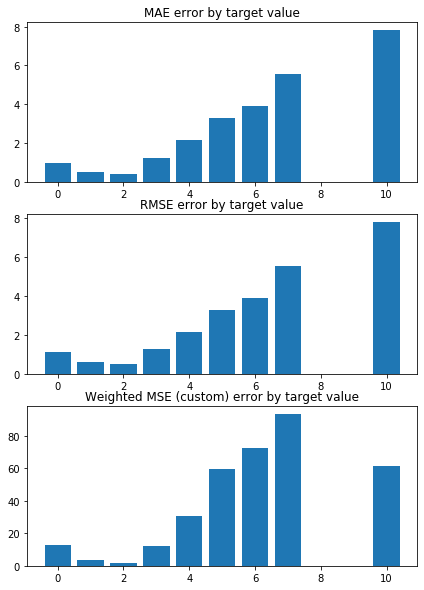

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0698632728763857 


 TRAIN PREDICTION Error
weighted_mse_train: 1.01818721989048 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


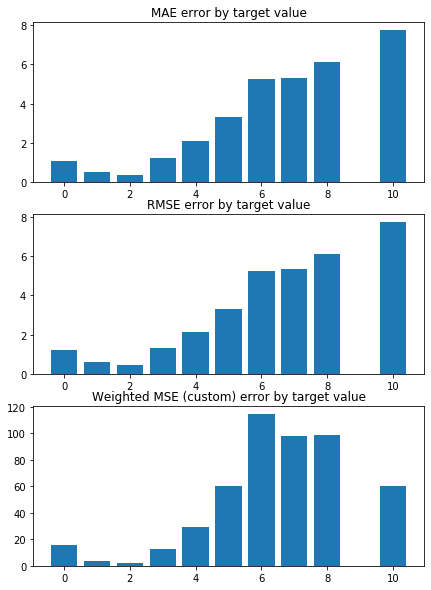

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.017542231283558 


 TRAIN PREDICTION Error
weighted_mse_train: 1.018860999636175 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


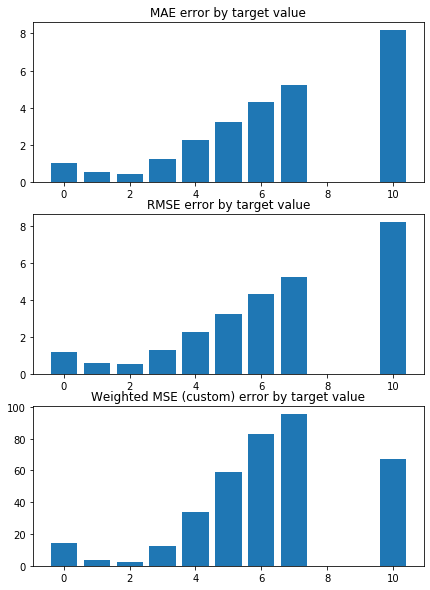

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1136434947156986 


 TRAIN PREDICTION Error
weighted_mse_train: 1.015944468585502 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


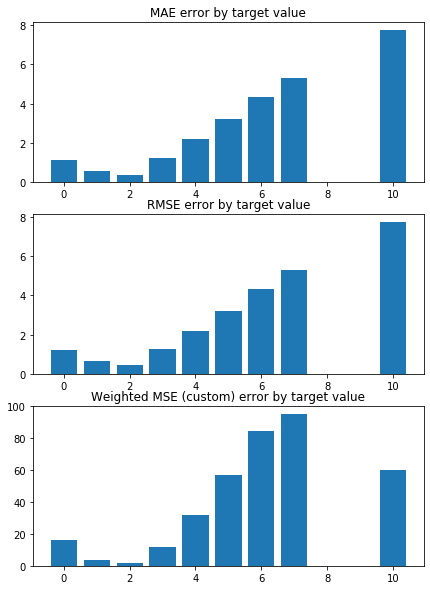

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0420257508318647 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0220477708948268 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


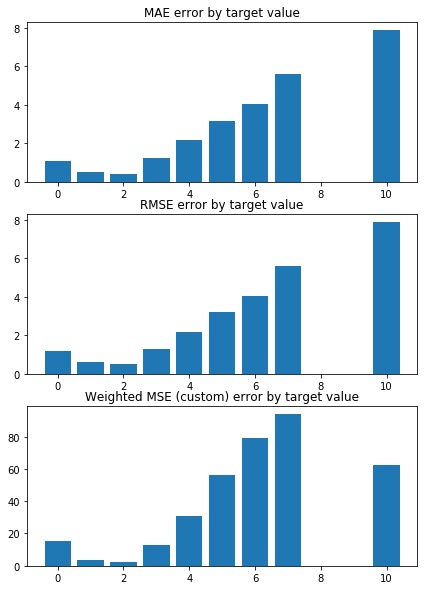

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9992341342467612 


 TRAIN PREDICTION Error
weighted_mse_train: 1.023547004894351 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


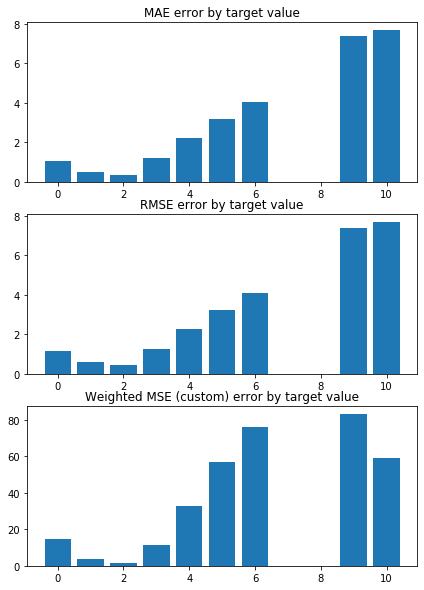

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0131679877617146 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0262664829166797 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


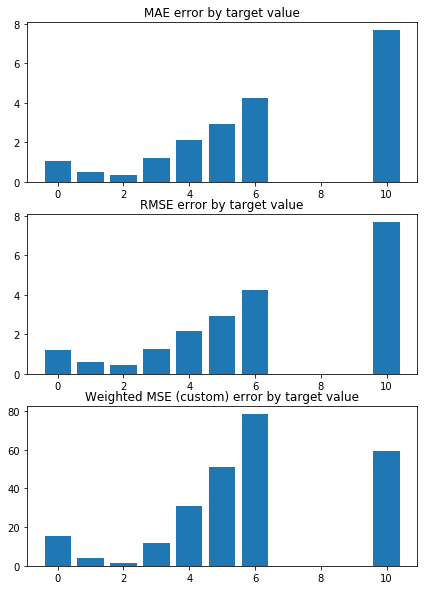

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1018264575725736 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0092801369868705 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


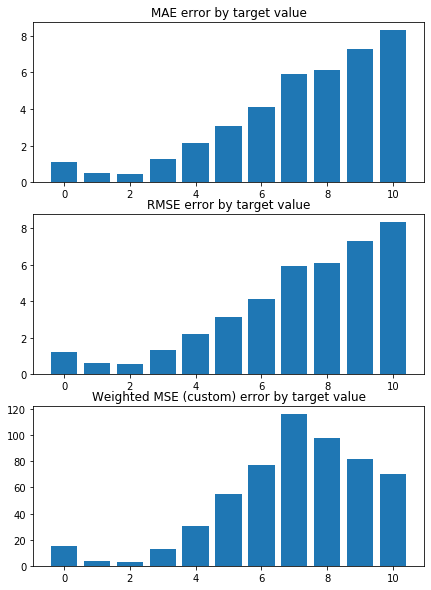

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9275948200910101 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0417018463257806 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


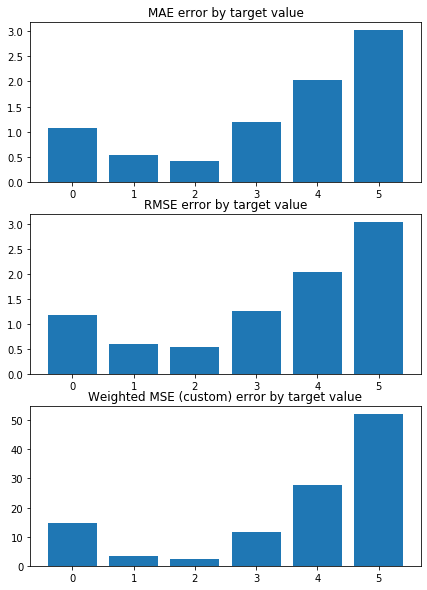

Weighted Mean squared error on Train: 1.02 
 MSE mean train: 1.70052109361216 

Mean squared error on Test: 1.02 
 MSE mean test:  1.7020479980882612 

Root of MSE on Test: 1.01 
 1.3046256160631913 

Variance score on Test: 0.06 
 r2_test: 0.21119025871369418 

wMSE_train 1.02
wMSE_test 1.02
MSE_train 1.7
MSE_test 1.7
MAE_train 0.97
MAE_test 0.9
r2_test 0.21
      Chriz   H3K27ac  CTCF  Su(Hw)  H3K27me3
0 -0.426176 -0.001238  -0.0     0.0       0.0
1 -0.418976 -0.018611  -0.0     0.0       0.0
2 -0.427596 -0.013388  -0.0     0.0       0.0
3 -0.434729 -0.008387  -0.0     0.0       0.0
4 -0.419252 -0.011079  -0.0     0.0       0.0
5 -0.424773 -0.010937  -0.0     0.0       0.0
6 -0.418612 -0.025646  -0.0     0.0       0.0
7 -0.427634 -0.008687  -0.0     0.0       0.0
8 -0.426764 -0.018207  -0.0     0.0       0.0
9 -0.425196 -0.006084  -0.0     0.0       0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_m

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


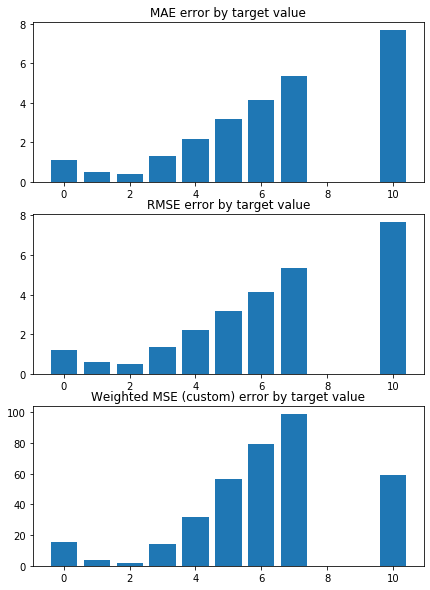

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9673041496596365 


 TRAIN PREDICTION Error
weighted_mse_train: 1.090059704047467 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


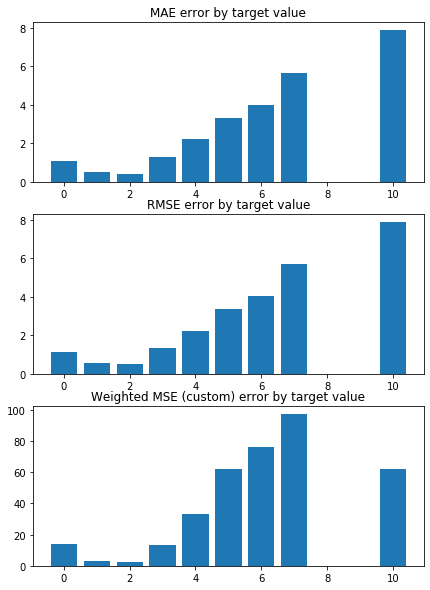

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1131448796165904 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0707368958355872 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


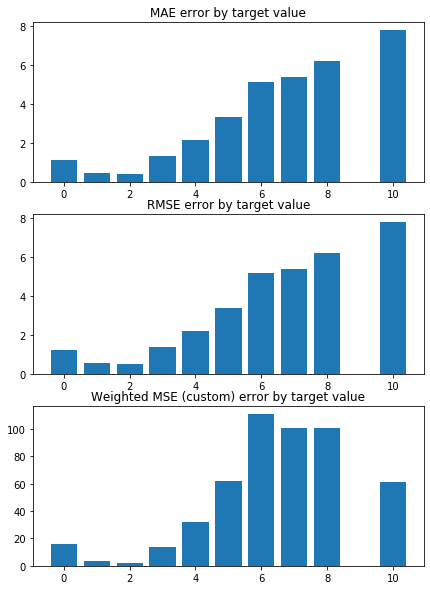

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0596587500967105 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0687626065199831 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


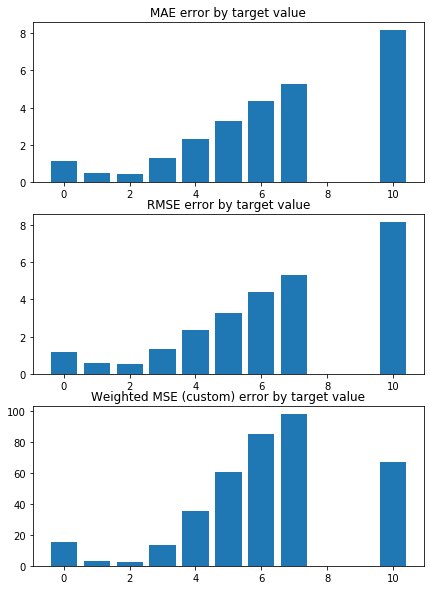

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1705040638912438 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0677063733060548 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


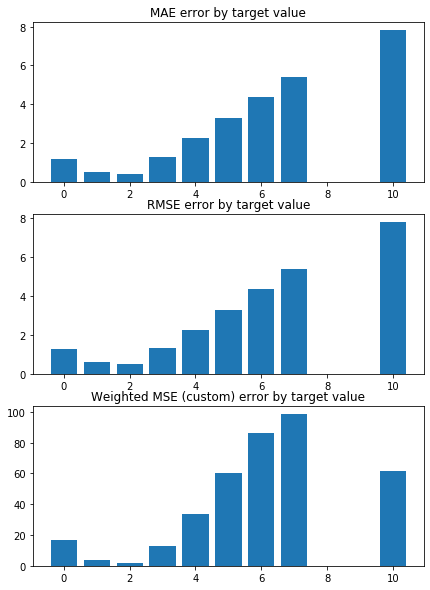

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0917253291446665 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0732053042159209 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


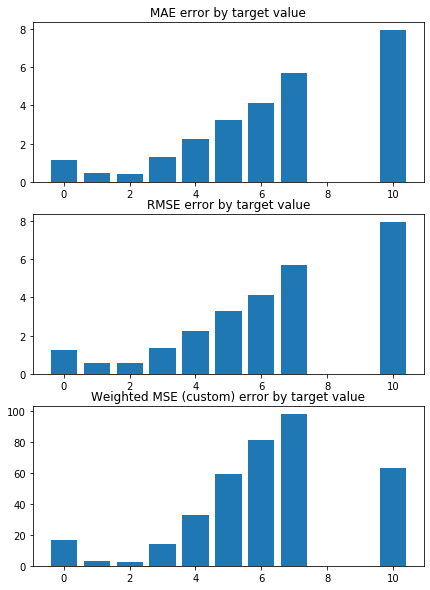

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0493694600961019 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0788462957586167 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


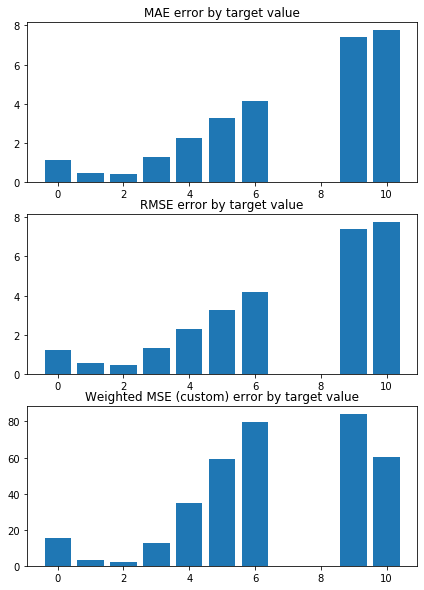

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0642608962844458 


 TRAIN PREDICTION Error
weighted_mse_train: 1.07775400354526 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


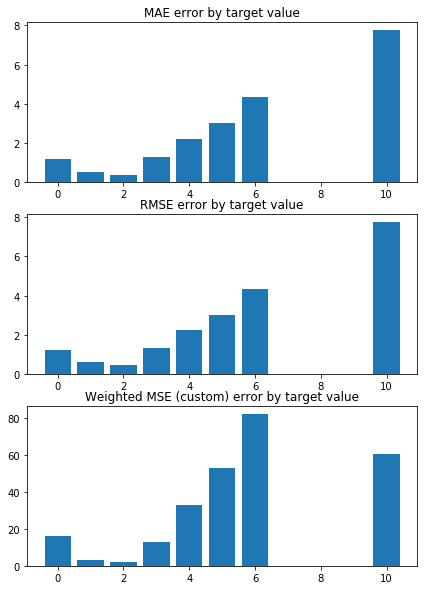

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1500085299254732 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0614931260930613 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


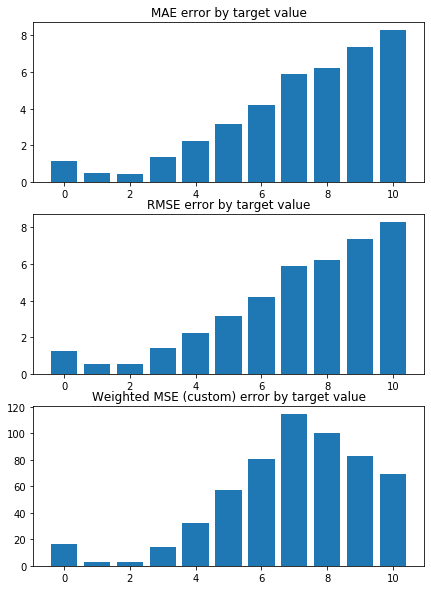

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9878050096805931 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0917233703906537 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


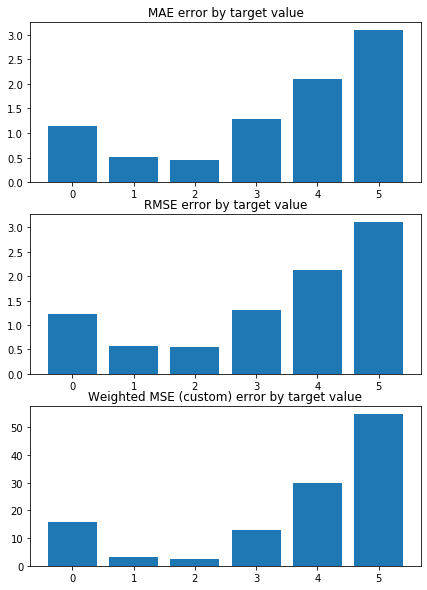

Weighted Mean squared error on Train: 1.08 
 MSE mean train: 1.7738946062979537 

Mean squared error on Test: 1.08 
 MSE mean test:  1.7748506677403402 

Root of MSE on Test: 1.04 
 1.3322352148702346 

Variance score on Test: 0.06 
 r2_test: 0.17654482312216147 

wMSE_train 1.08
wMSE_test 1.08
MSE_train 1.77
MSE_test 1.77
MAE_train 1.01
MAE_test 0.95
r2_test 0.18
      Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0 -0.326864  -0.0     0.0       0.0     -0.0
1 -0.328045  -0.0     0.0       0.0     -0.0
2 -0.334867  -0.0     0.0       0.0     -0.0
3 -0.340126  -0.0     0.0       0.0     -0.0
4 -0.325872  -0.0     0.0       0.0     -0.0
5 -0.331853  -0.0     0.0       0.0     -0.0
6 -0.332278  -0.0     0.0       0.0     -0.0
7 -0.331881  -0.0     0.0       0.0     -0.0
8 -0.337212  -0.0     0.0       0.0     -0.0
9 -0.328988  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_tes

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


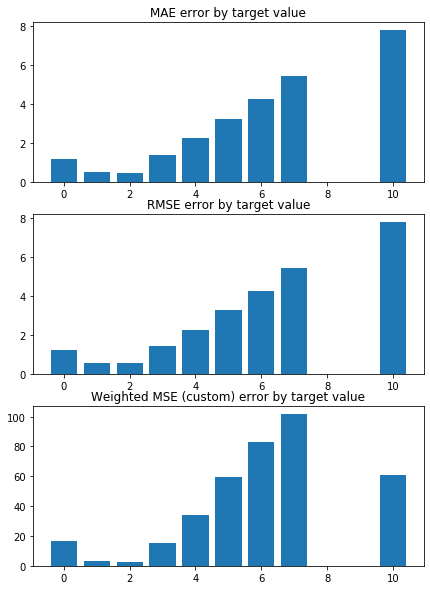

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0421801226040373 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1579240469012209 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


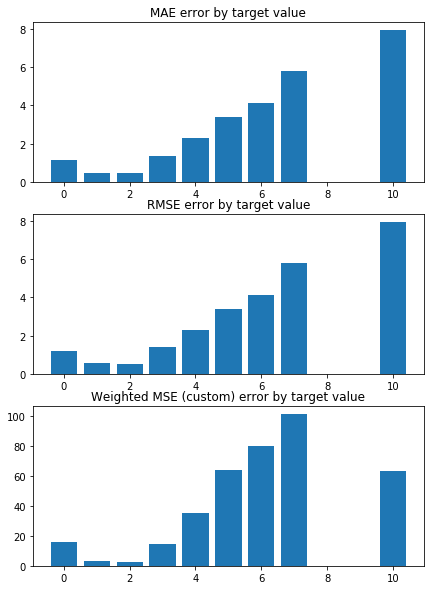

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1710483151448519 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1379313128695339 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


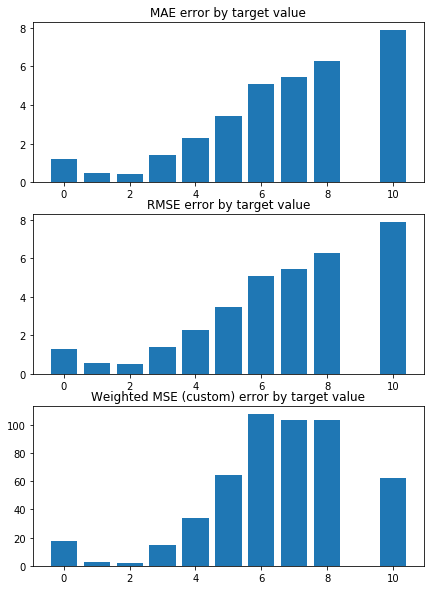

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1160026584992695 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1341963476951584 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


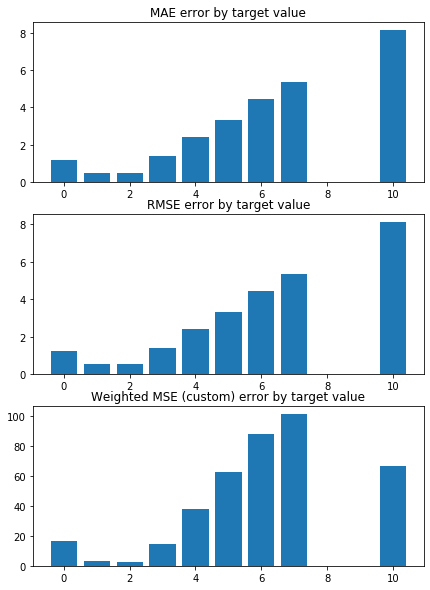

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.241046682179904 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1344472020467367 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


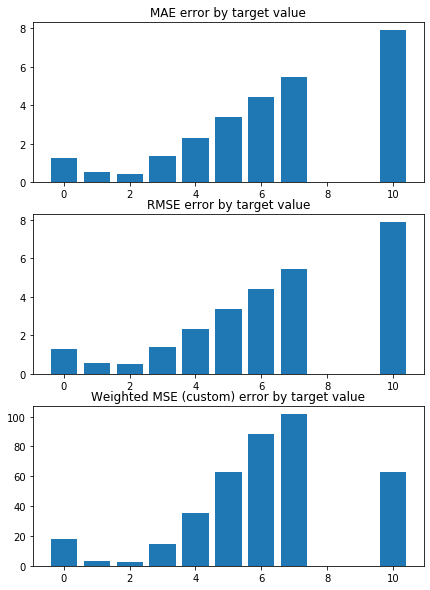

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1549204418743433 


 TRAIN PREDICTION Error
weighted_mse_train: 1.13930111959975 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


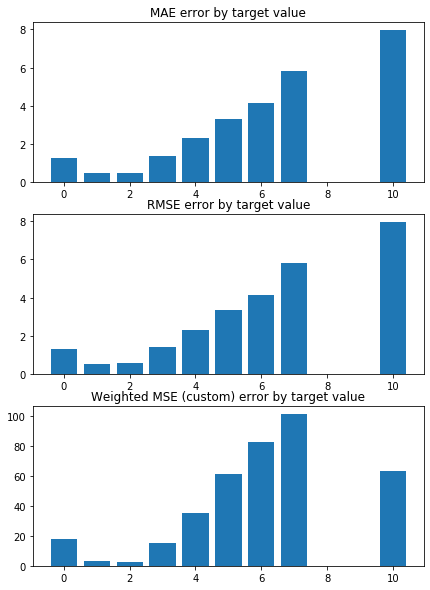

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.117111447049838 


 TRAIN PREDICTION Error
weighted_mse_train: 1.146199251931539 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


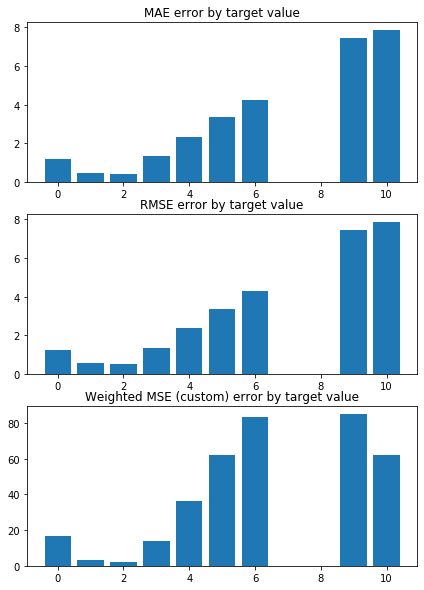

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.1317308716460557 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1449468492612669 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


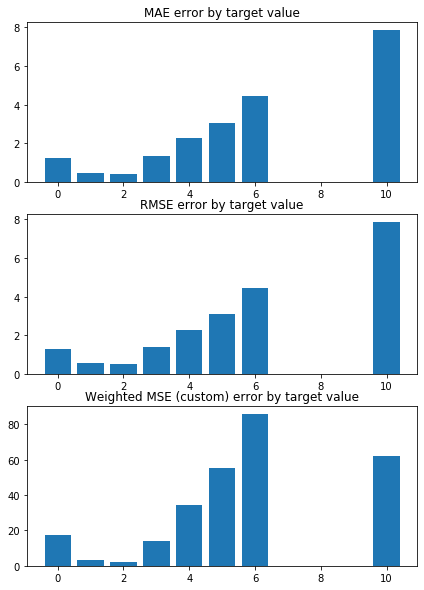

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2123751014161306 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1273133350381965 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


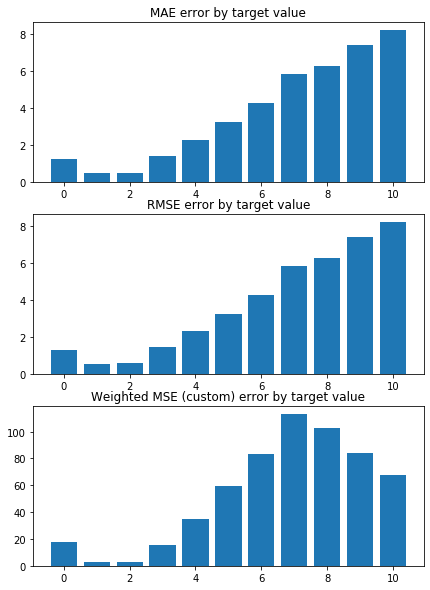

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0628092873201684 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1577838936825375 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


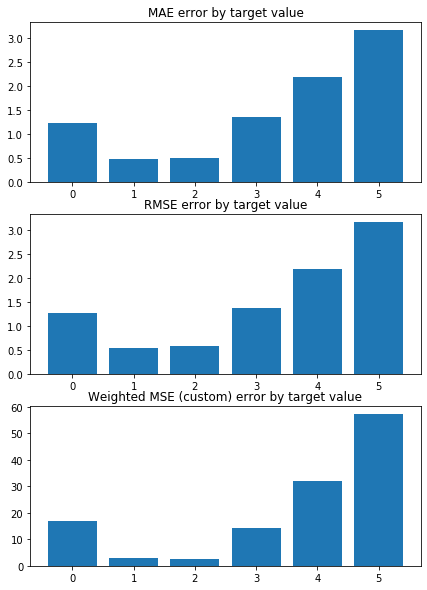

Weighted Mean squared error on Train: 1.14 
 MSE mean train: 1.8638998080974805 

Mean squared error on Test: 1.14 
 MSE mean test:  1.8649104428145313 

Root of MSE on Test: 1.07 
 1.3656172387658745 

Variance score on Test: 0.06 
 r2_test: 0.13369606154569066 

wMSE_train 1.14
wMSE_test 1.14
MSE_train 1.86
MSE_test 1.86
MAE_train 1.05
MAE_test 0.99
r2_test 0.13
      Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0 -0.226865  -0.0     0.0       0.0     -0.0
1 -0.226679  -0.0     0.0       0.0     -0.0
2 -0.234707  -0.0     0.0       0.0     -0.0
3 -0.240824  -0.0     0.0       0.0     -0.0
4 -0.226401  -0.0     0.0       0.0     -0.0
5 -0.232822  -0.0     0.0       0.0     -0.0
6 -0.231554  -0.0     0.0       0.0     -0.0
7 -0.231285  -0.0     0.0       0.0     -0.0
8 -0.237378  -0.0     0.0       0.0     -0.0
9 -0.229414  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_tes

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


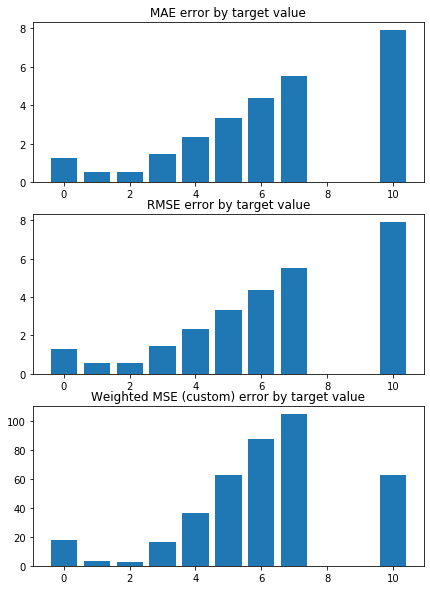

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1373408713993023 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2433917041047733 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


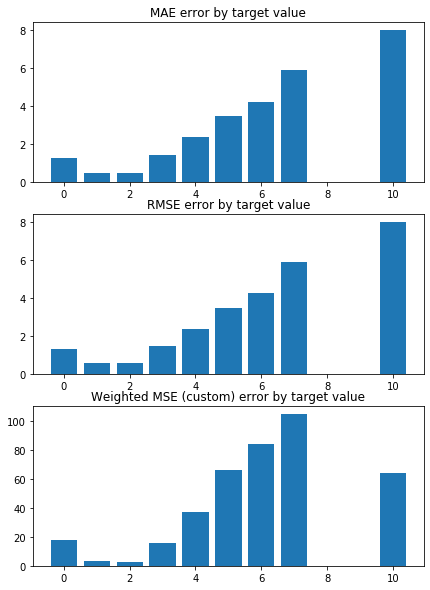

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2467544228077176 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2225156924832645 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


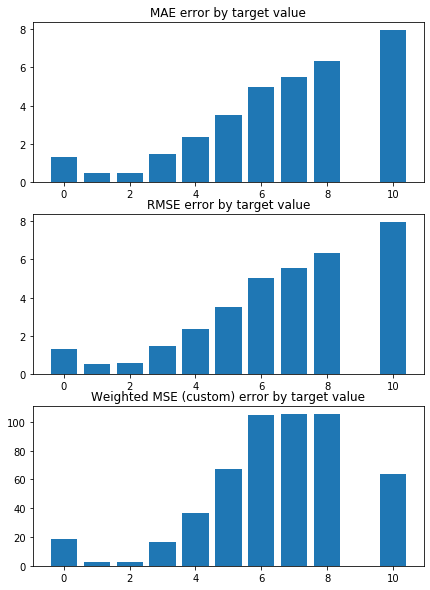

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1881354089028464 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2169104805980249 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


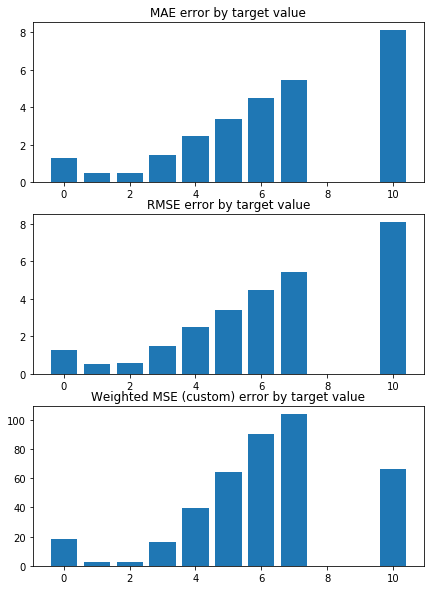

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3279843354894687 


 TRAIN PREDICTION Error
weighted_mse_train: 1.21846087128735 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


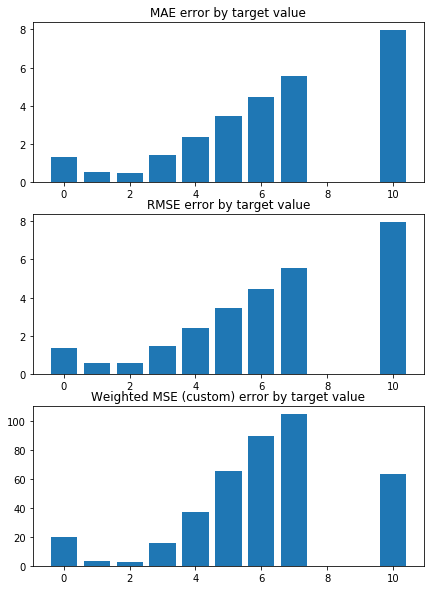

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2335386074086871 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2226111046536265 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


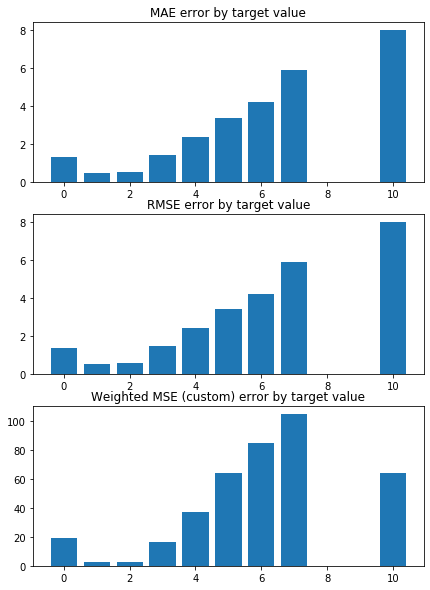

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2038314781308856 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2310533713768435 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


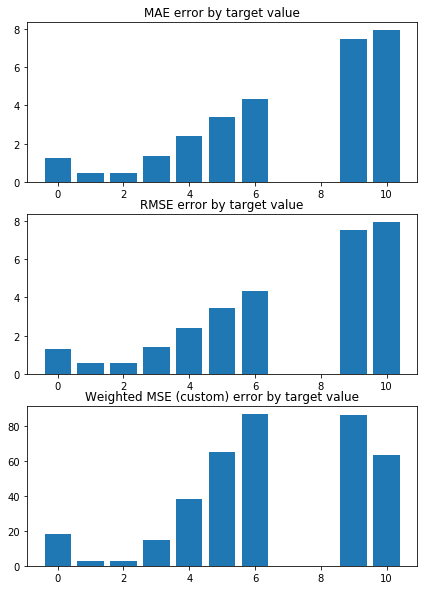

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2178189218004187 


 TRAIN PREDICTION Error
weighted_mse_train: 1.229617601132327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


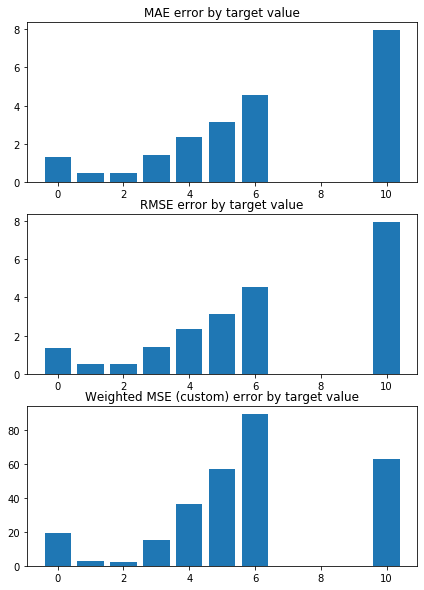

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2913617094452303 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2105278133479194 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


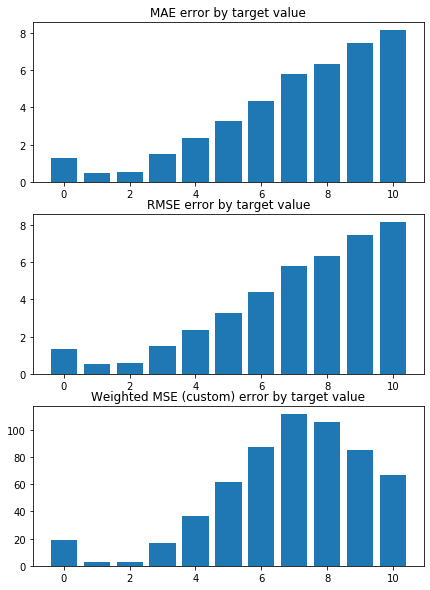

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1545364999971985 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2411282067968807 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


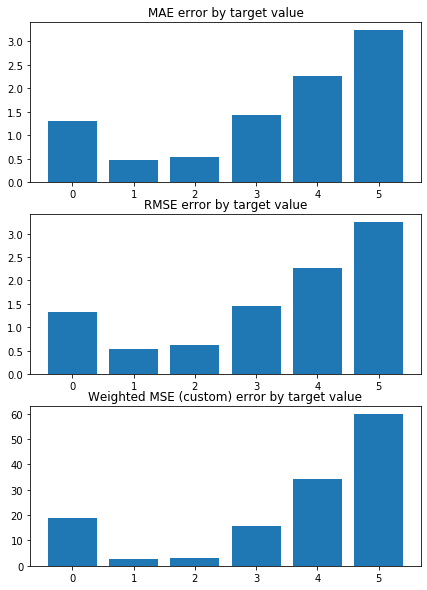

Weighted Mean squared error on Train: 1.23 
 MSE mean train: 1.973906165852458 

Mean squared error on Test: 1.23 
 MSE mean test:  1.9749945464942986 

Root of MSE on Test: 1.11 
 1.4053449919839252 

Variance score on Test: 0.06 
 r2_test: 0.08135932386423997 

wMSE_train 1.23
wMSE_test 1.23
MSE_train 1.97
MSE_test 1.97
MAE_train 1.1
MAE_test 1.04
r2_test 0.08
      Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0 -0.126866  -0.0     0.0       0.0     -0.0
1 -0.125314  -0.0     0.0       0.0     -0.0
2 -0.134546  -0.0     0.0       0.0     -0.0
3 -0.141521  -0.0     0.0       0.0     -0.0
4 -0.126929  -0.0     0.0       0.0     -0.0
5 -0.133792  -0.0     0.0       0.0     -0.0
6 -0.130829  -0.0     0.0       0.0     -0.0
7 -0.130688  -0.0     0.0       0.0     -0.0
8 -0.137543  -0.0     0.0       0.0     -0.0
9 -0.129841  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test:

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


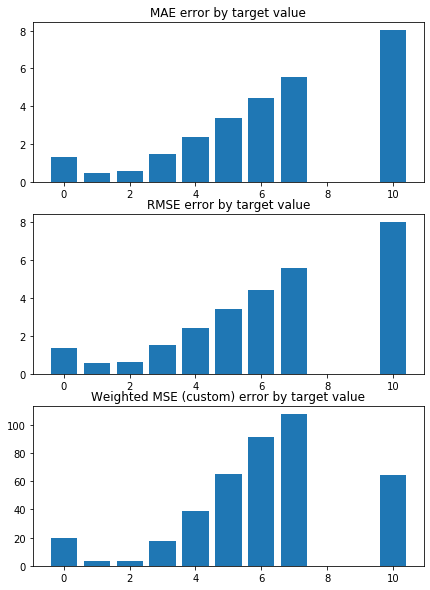

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2527863960454317 


 TRAIN PREDICTION Error
weighted_mse_train: 1.346462675658124 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


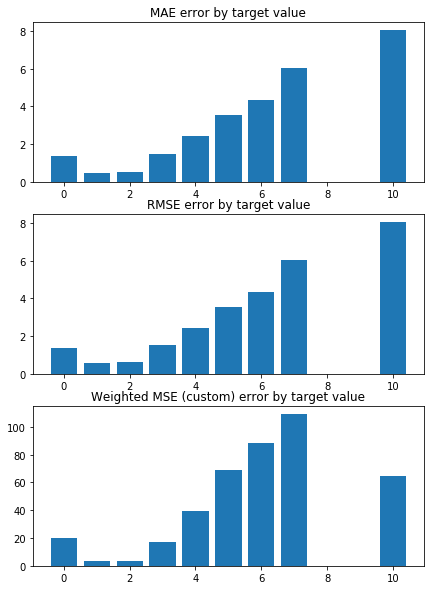

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3402632026051873 


 TRAIN PREDICTION Error
weighted_mse_train: 1.324490034676779 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


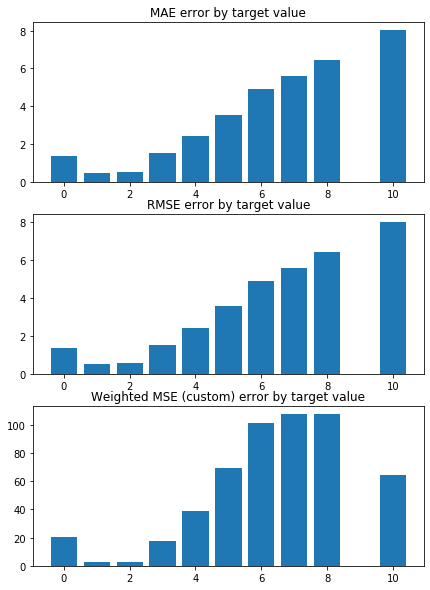

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2760570013074415 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3169050052285822 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


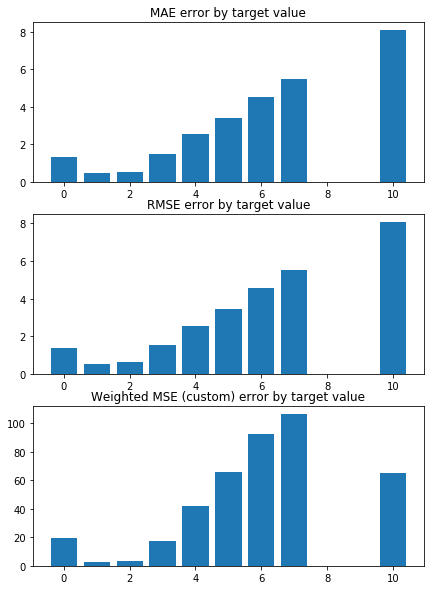

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.431317023819938 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3197473810278948 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


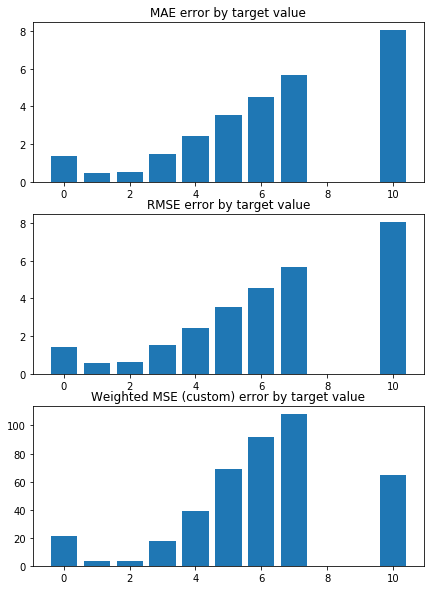

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3275798257476972 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3231352593775503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


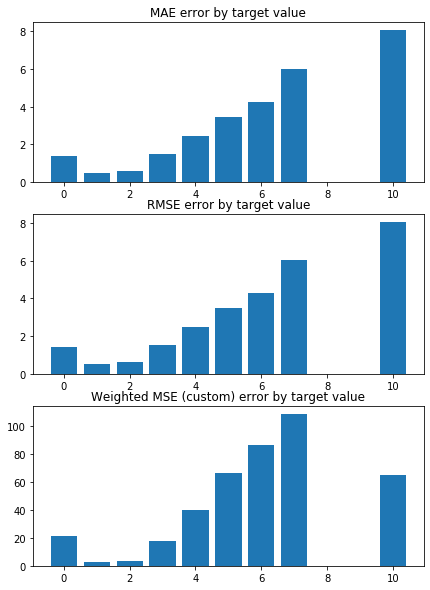

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3095295533392455 


 TRAIN PREDICTION Error
weighted_mse_train: 1.333408654094531 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


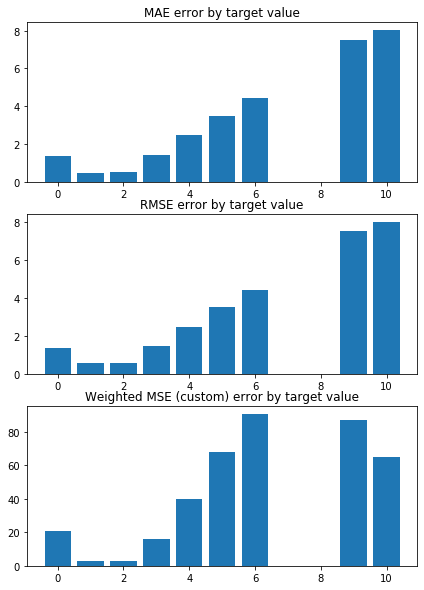

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.322525046747535 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3317662591584405 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


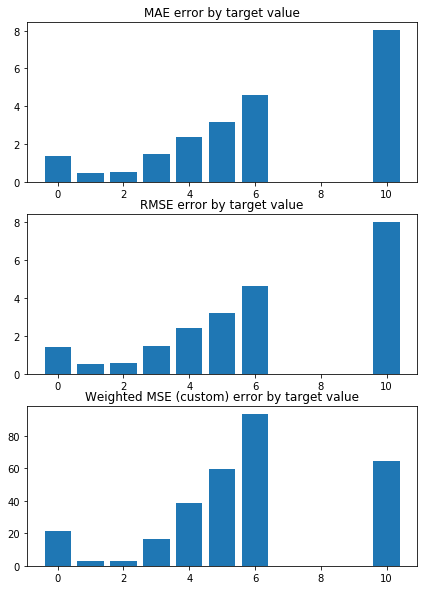

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3869683540127722 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3111365610222296 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


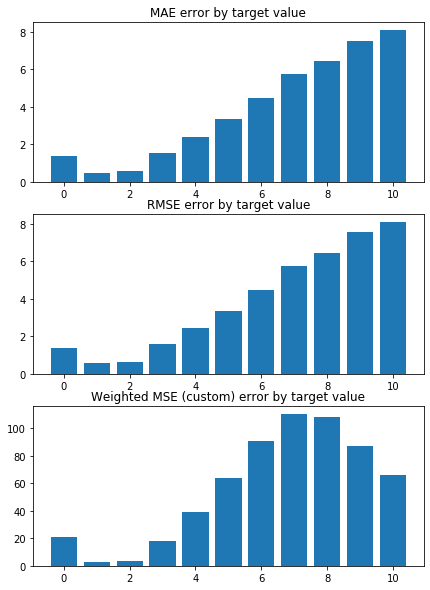

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2629866477116833 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3417563097336833 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


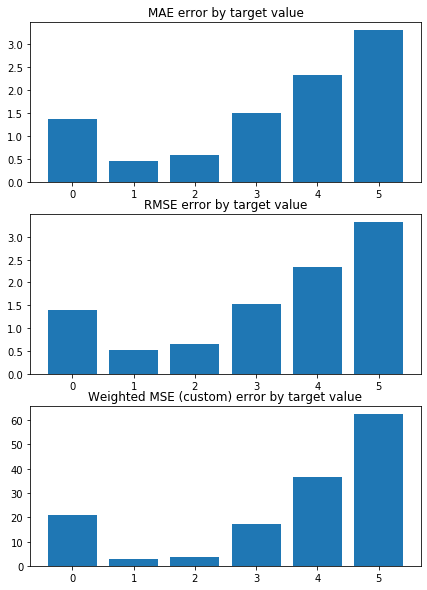

Weighted Mean squared error on Train: 1.33 
 MSE mean train: 2.1039136795628854 

Mean squared error on Test: 1.33 
 MSE mean test:  2.105102978779643 

Root of MSE on Test: 1.15 
 1.450897301251761 

Variance score on Test: 0.05 
 r2_test: 0.019534610077809423 

wMSE_train 1.33
wMSE_test 1.33
MSE_train 2.1
MSE_test 2.11
MAE_train 1.15
MAE_test 1.09
r2_test 0.02
      Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0 -0.026867  -0.0     0.0       0.0     -0.0
1 -0.023949  -0.0     0.0       0.0     -0.0
2 -0.034385  -0.0     0.0       0.0     -0.0
3 -0.042219  -0.0     0.0       0.0     -0.0
4 -0.027457  -0.0     0.0       0.0     -0.0
5 -0.034761  -0.0     0.0       0.0     -0.0
6 -0.030105  -0.0     0.0       0.0     -0.0
7 -0.030092  -0.0     0.0       0.0     -0.0
8 -0.037709  -0.0     0.0       0.0     -0.0
9 -0.030268  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test:

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


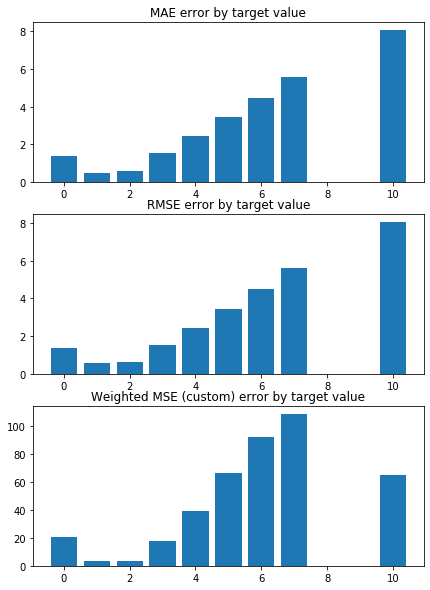

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


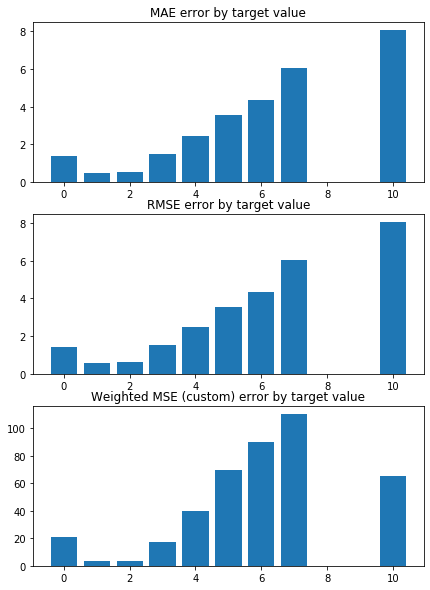

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


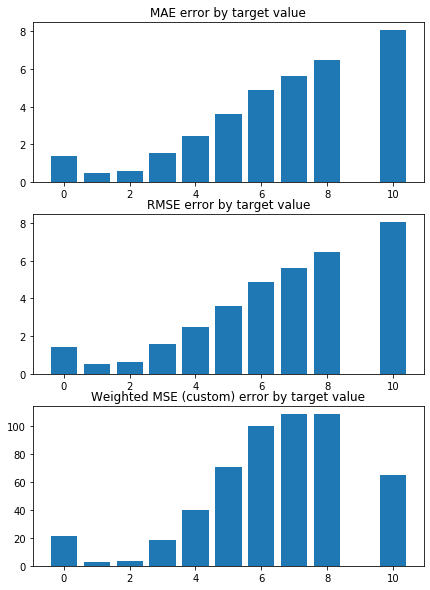

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


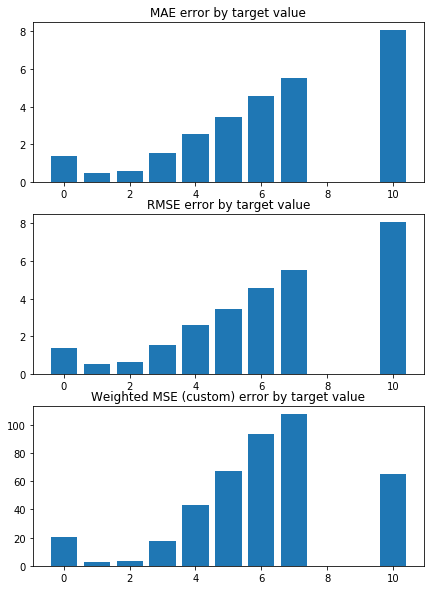

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


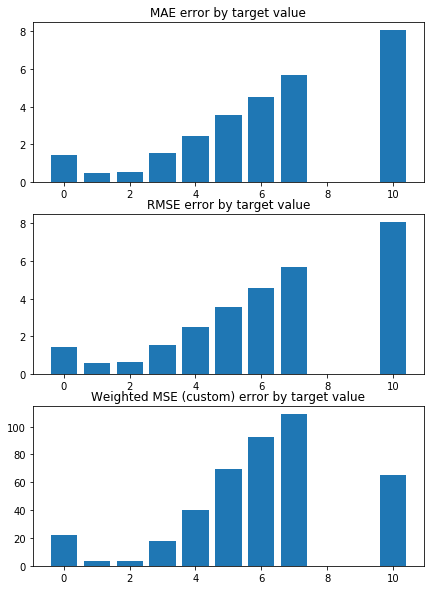

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


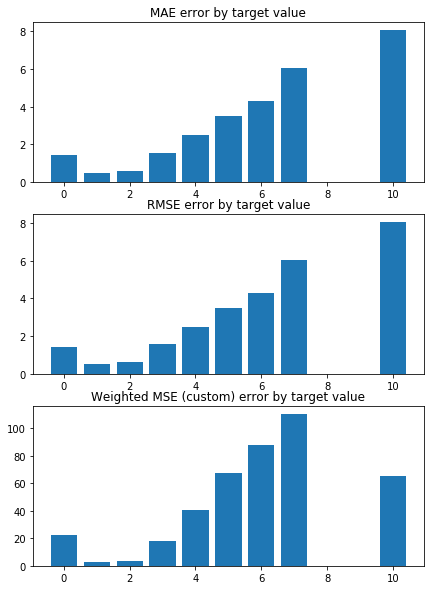

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


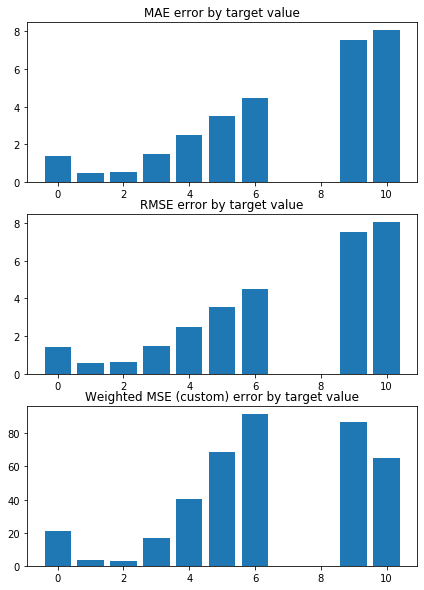

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


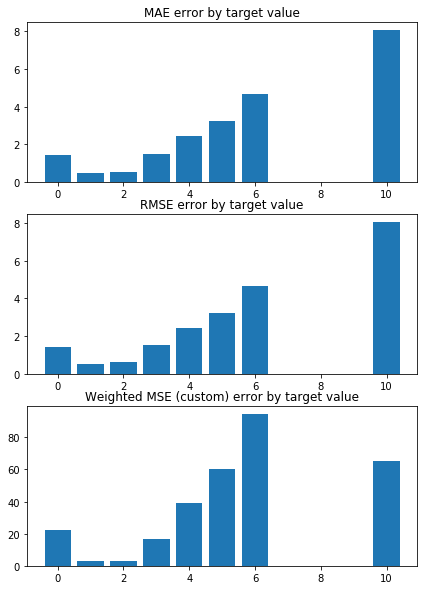

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


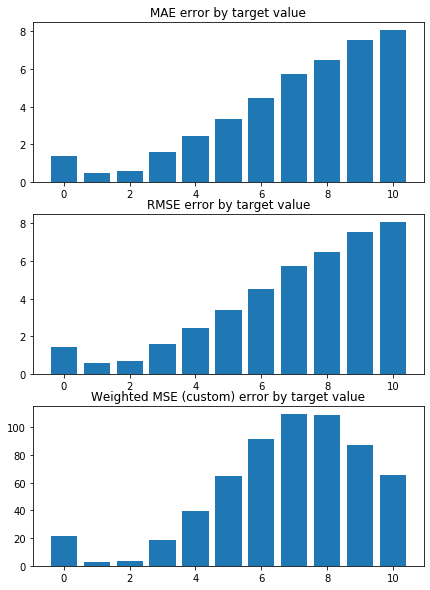

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


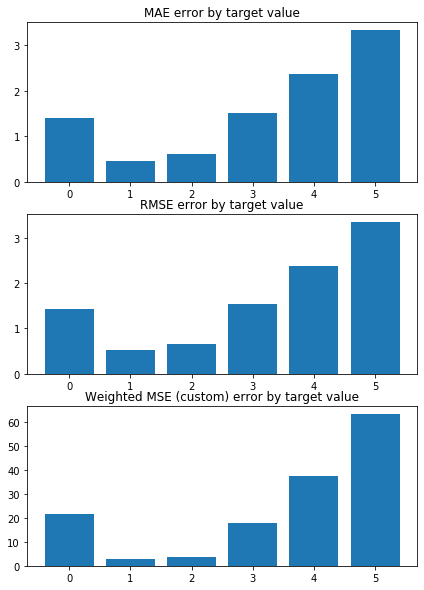

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0     -0.0
1   -0.0  -0.0     0.0       0.0     -0.0
2   -0.0  -0.0     0.0       0.0     -0.0
3   -0.0  -0.0     0.0       0.0     -0.0
4   -0.0  -0.0     0.0       0.0     -0.0
5   -0.0  -0.0     0.0       0.0     -0.0
6   -0.0  -0.0     0.0       0.0     -0.0
7   -0.0  -0.0     0.0       0.0     -0.0
8   -0.0  -0.0     0.0       0.0     -0.0
9   -0.0  -0.0     0.0       0.0     -0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4063865324088682 


 TRAI

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


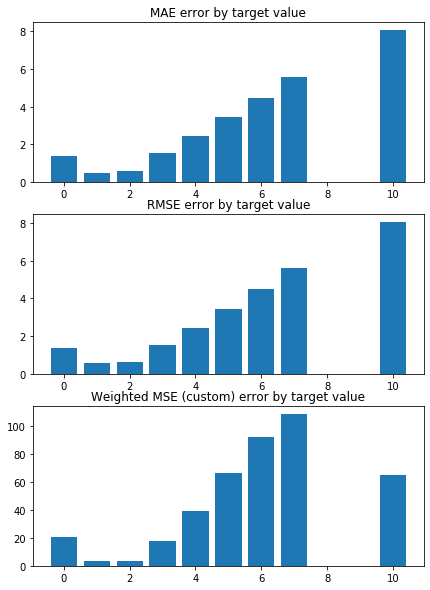

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


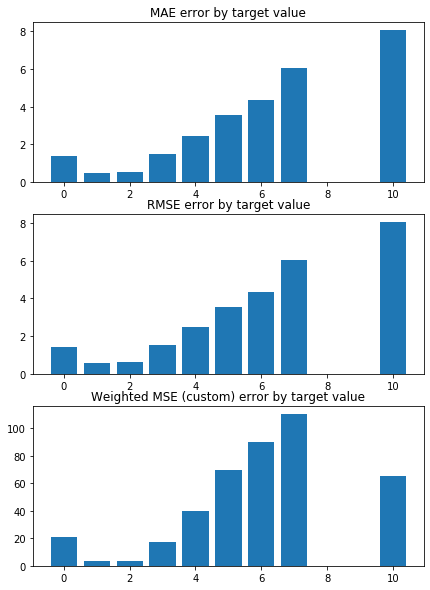

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


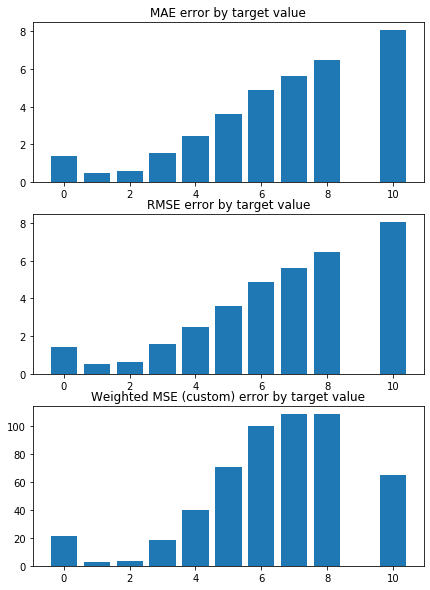

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


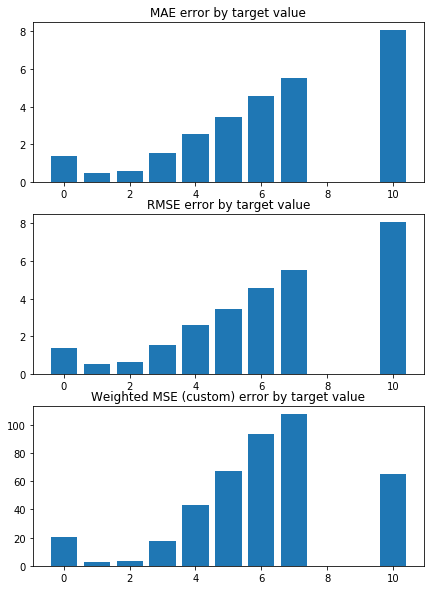

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


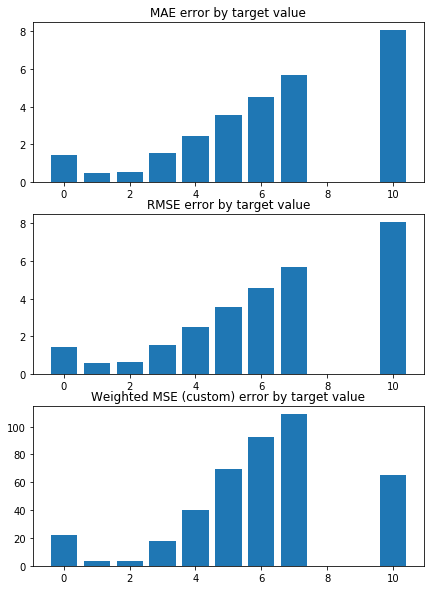

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


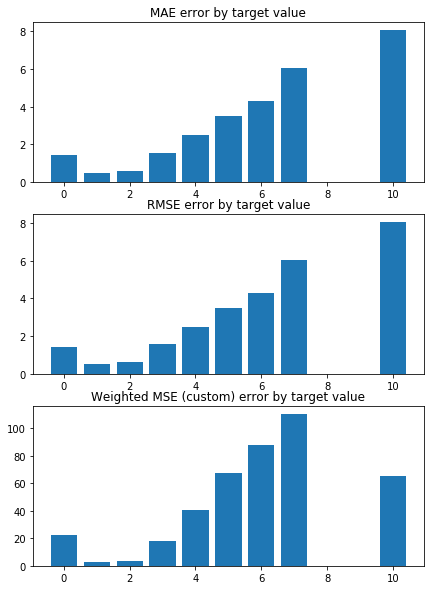

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


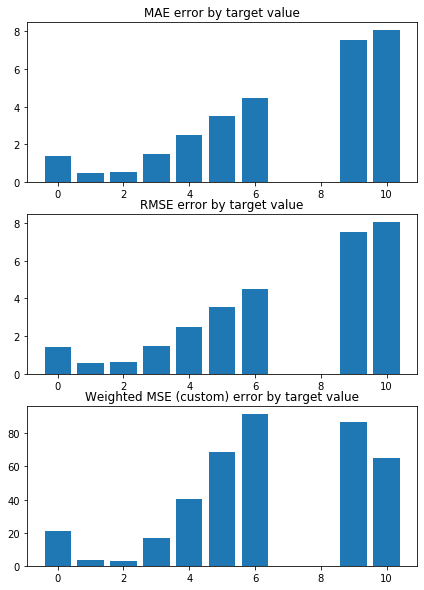

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


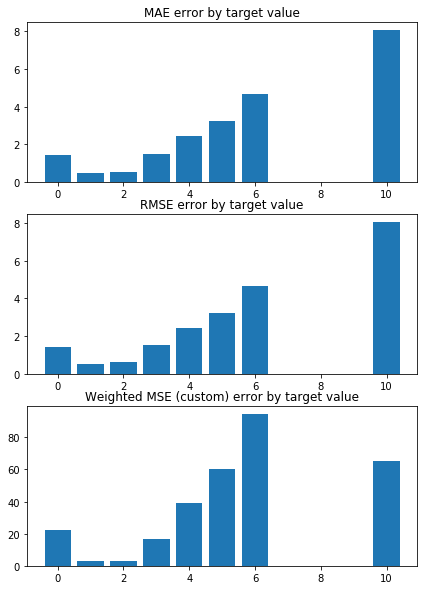

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


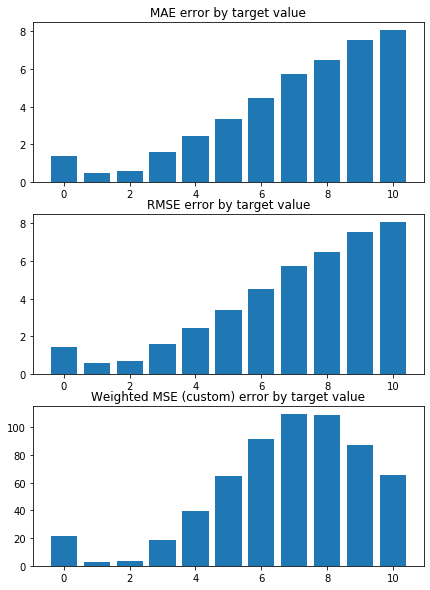

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


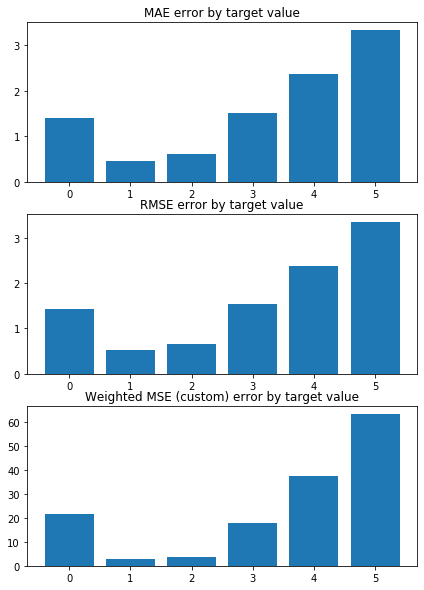

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0     -0.0
1   -0.0  -0.0     0.0       0.0     -0.0
2   -0.0  -0.0     0.0       0.0     -0.0
3   -0.0  -0.0     0.0       0.0     -0.0
4   -0.0  -0.0     0.0       0.0     -0.0
5   -0.0  -0.0     0.0       0.0     -0.0
6   -0.0  -0.0     0.0       0.0     -0.0
7   -0.0  -0.0     0.0       0.0     -0.0
8   -0.0  -0.0     0.0       0.0     -0.0
9   -0.0  -0.0     0.0       0.0     -0.0


In [80]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 1, 0.1)
# Create linear regression object

model_name = 'LR+L1_grid0.1-1'
n_splits = 10
random_state = 16 
shuffle = True


wmse_test = []
wmse_train = []

for alpha in alpha_grid:
    model = linear_model.Lasso(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                        weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                        rmse_test, rmse_train, rmse_test_const, \
                        mae_test,    mae_train,  mae_test_const, \
                        _ = train_test_KFold(X, y, model, model_name, results_pd,
                                             n_splits=n_splits, random_state=random_state, shuffle=shuffle)


    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))


In [81]:
wmse_test

[0.9608049003295823,
 0.9612374318091674,
 0.9821326130026566,
 1.024733562145587,
 1.0761059435784883,
 1.1428298455333692,
 1.2269548694079784,
 1.3284810152023154,
 1.364001547118124,
 1.364001547118124]

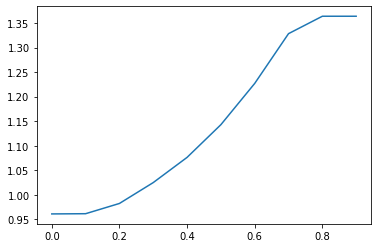

In [82]:
plt.plot(alpha_grid, wmse_test)

In [83]:
# Best alpha = 0.2

# L1 - best  score

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9971420230678572 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9835911120828897 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


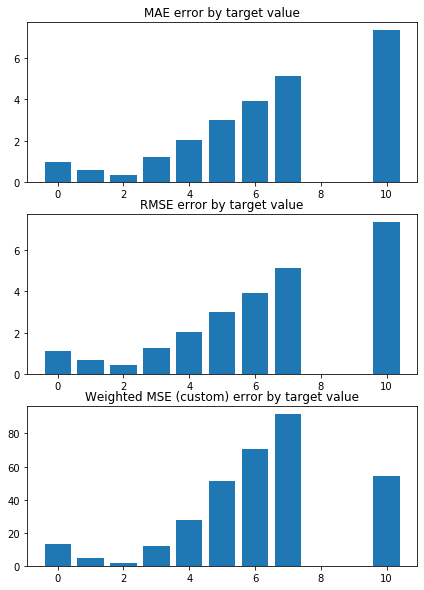

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.86858850446636 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9929325445569973 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


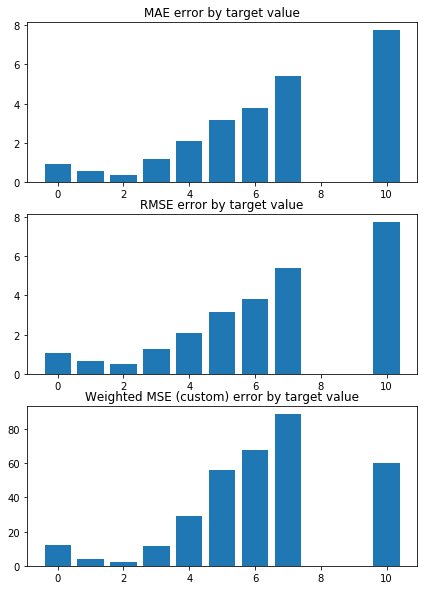

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.035376530635326 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9753536877885366 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


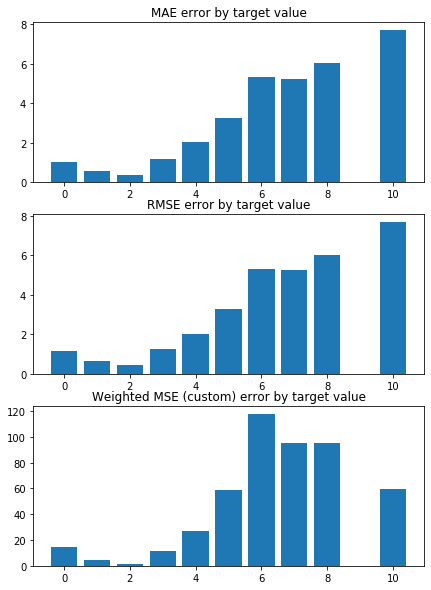

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9829619394080757 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9773188126350543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


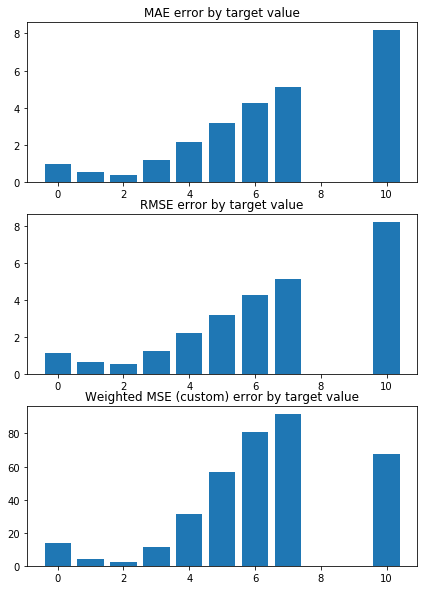

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0636448049237517 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9729646247043543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


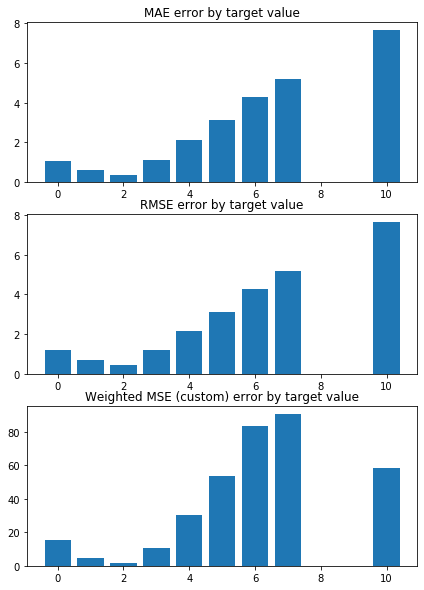

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0004206103482998 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9799153821287289 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


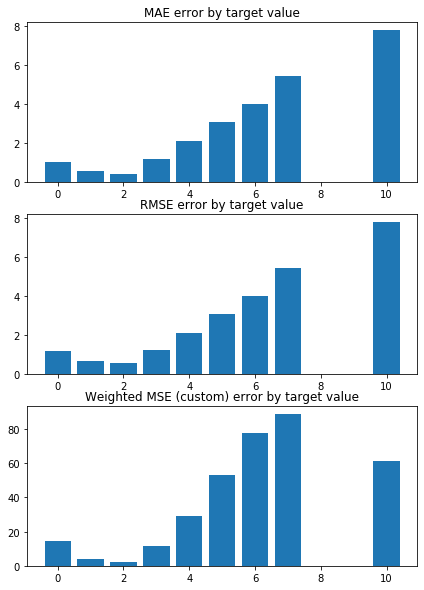

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9689756702855213 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9806770169906543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


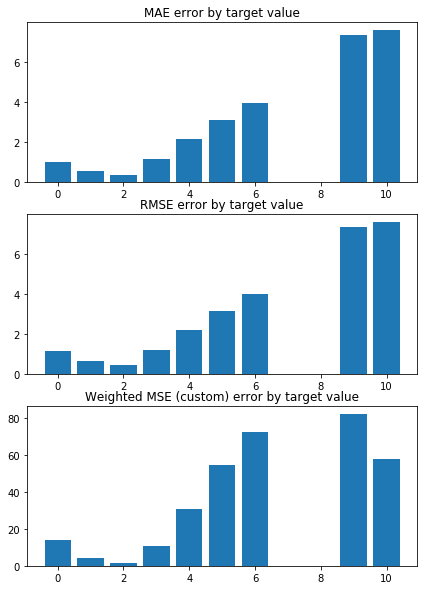

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9690944733715253 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9834480415498508 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


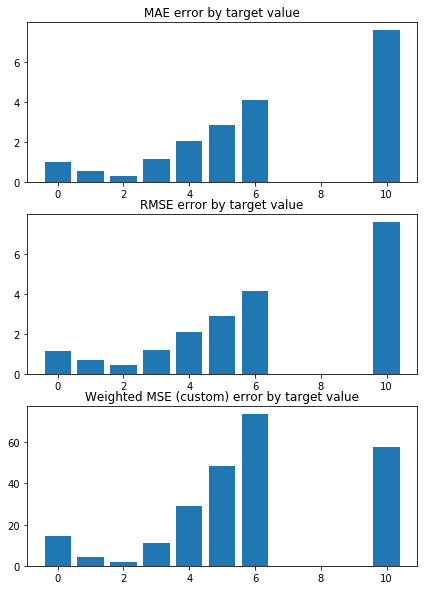

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0661108968050799 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9678888287300402 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


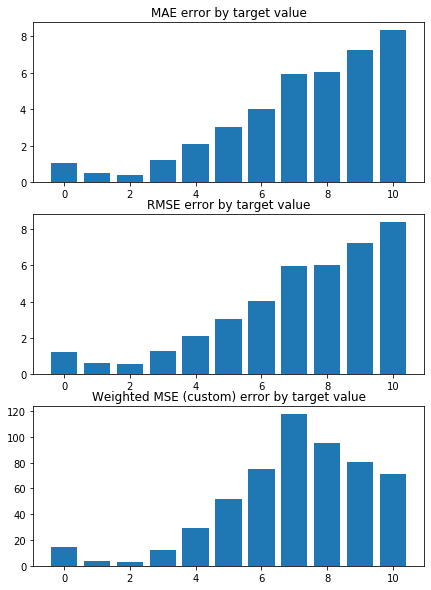

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8690106767147683 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9991037630069876 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


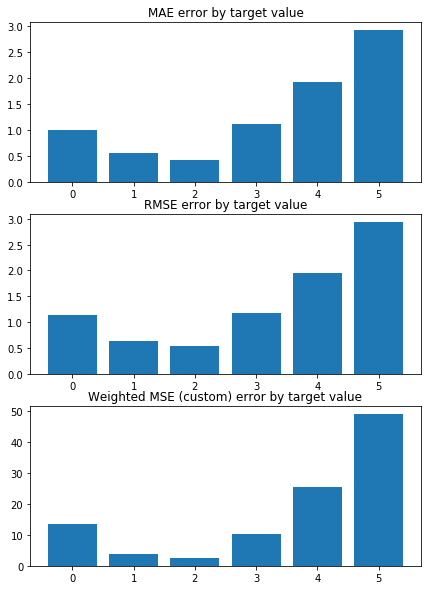

Weighted Mean squared error on Train: 0.98 
 MSE mean train: 1.6363542969769356 

Mean squared error on Test: 0.98 
 MSE mean test:  1.6377671808995646 

Root of MSE on Test: 0.99 
 1.2797527811650047 

Variance score on Test: 0.07 
 r2_test: 0.24186579603713138 

wMSE_train 0.98
wMSE_test 0.98
MSE_train 1.64
MSE_test 1.64
MAE_train 0.94
MAE_test 0.86
r2_test 0.24
      Chriz   H3K27ac  CTCF  Su(Hw)  H3K27me3
0 -0.490566 -0.065055  -0.0     0.0       0.0
1 -0.484760 -0.082044  -0.0     0.0      -0.0
2 -0.492167 -0.077468  -0.0     0.0      -0.0
3 -0.498552 -0.071579  -0.0     0.0      -0.0
4 -0.482695 -0.076471  -0.0     0.0      -0.0
5 -0.488640 -0.073731  -0.0     0.0       0.0
6 -0.483315 -0.089801  -0.0     0.0      -0.0
7 -0.492206 -0.073168  -0.0     0.0      -0.0
8 -0.490792 -0.081568  -0.0     0.0       0.0
9 -0.487612 -0.073141  -0.0     0.0      -0.0


,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.922047,0.042622,0.920844,0.010108,-,test_params = testtest,1.269372,0.077260,1.267885,0.019264,"[0.33022472445781603, 0.30276714824071915, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.982133,0.065669,0.981319,0.008746,-,test_params = testtest,1.637767,0.275124,1.636354,0.031770,"[0.27687710875971383, 0.26619423266295583, 0.2...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."


In [84]:
# L1 - best 
model = linear_model.Lasso(alpha=0.2)


model_name = 'LR+L1_alf=0.2_spt=10'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

# wmse_test.append(np.mean(weighted_mse_test_all))
# wmse_train.append(np.mean(weighted_mse_train_all))
results_pd

In [85]:
coefs_argsort, coefs

(array([[0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3]]),
 array([[-0.49056605, -0.        ,  0.        ,  0.        , -0.06505539],
        [-0.48475966, -0.        ,  0.        , -0.        , -0.08204363],
        [-0.49216732, -0.        ,  0.        , -0.        , -0.07746772],
        [-0.49855203, -0.        ,  0.        , -0.        , -0.07157893],
        [-0.48269541, -0.        ,  0.        , -0.        , -0.07647083],
        [-0.4886398 , -0.        ,  0.        ,  0.        , -0.07373122],
        [-0.48331483, -0.        ,  0.        , -0.        , -0.08980104],
        [-0.49220578, -0.        ,  0.        , -0.        , -0.07316849],
        [-0.49079174, -0.        ,  0.        ,  0.        , -0.08156816],
        [-0.48761224, -0.        ,  0.        , -0.        , -0.0731405 ]

In [86]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K27ac', 'CTCF', 'Su(Hw)', 'H3K27me3'], dtype='object')

In [87]:
coefs_argsort[:]

array([[0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3]])

In [88]:

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 0.9813193814174094 0.9821326130026566


In [89]:
su_drsc.columns[2:][coefs_argsort[0]], coefs

(Index(['Chriz', 'H3K27ac', 'CTCF', 'Su(Hw)', 'H3K27me3'], dtype='object'),
 array([[-0.49056605, -0.        ,  0.        ,  0.        , -0.06505539],
        [-0.48475966, -0.        ,  0.        , -0.        , -0.08204363],
        [-0.49216732, -0.        ,  0.        , -0.        , -0.07746772],
        [-0.49855203, -0.        ,  0.        , -0.        , -0.07157893],
        [-0.48269541, -0.        ,  0.        , -0.        , -0.07647083],
        [-0.4886398 , -0.        ,  0.        ,  0.        , -0.07373122],
        [-0.48331483, -0.        ,  0.        , -0.        , -0.08980104],
        [-0.49220578, -0.        ,  0.        , -0.        , -0.07316849],
        [-0.49079174, -0.        ,  0.        ,  0.        , -0.08156816],
        [-0.48761224, -0.        ,  0.        , -0.        , -0.0731405 ]]))

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS + L 1

Получили наиболее влияющие признаки

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Linear Regression with L2 regularization -  Ridge

In [90]:
X, y = data_scaled_clean, target_clean.gamma
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=10)


In [91]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l2 = linear_model.Ridge()

# Train the model using the training sets
lin_reg_l2.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l2.predict(X_test)

Коэффициенты

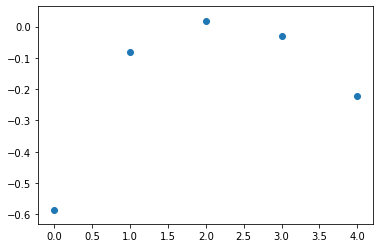

In [92]:
plt.scatter( np.arange(len(lin_reg_l2.coef_)) , lin_reg_l2.coef_)
plt.show()

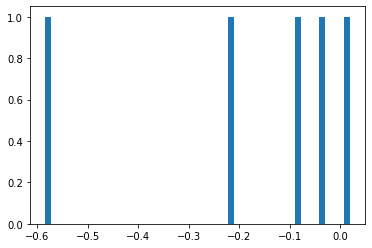

In [93]:
plt.hist(lin_reg_l2.coef_, bins=50)
plt.show()

In [94]:
# Make predictions using the testing set
y_pred_train = lin_reg_l2.predict(X_train)
# The mean squared error
print("Mean squared error on Train: %.2f"
      % mean_squared_error(y_train, y_pred_train))

# The mean squared error
print("Mean squared error on Test: %.2f"
      % mean_squared_error(y_test, y_pred))


# The mean squared error
print("Root of Mean squared error: %.2f"
      % np.sqrt(mean_squared_error(y_test, y_pred)))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(y_test, y_pred))

Mean squared error on Train: 1.62
Mean squared error on Test: 1.46
Root of Mean squared error: 1.21
Variance score: 0.28


(array([  1.,   0.,   0.,   0.,   1.,   1.,   2.,   3.,   9.,  14.,  19.,
         13.,  33.,  46.,  50.,  72.,  89.,  98., 146., 145., 190., 212.,
        214., 250., 263., 232., 220., 239., 223., 190., 180., 177., 150.,
         96., 113.,  80.,  66.,  46.,  27.,  34.,  17.,  13.,   4.,   5.,
          6.,   7.,   3.,   0.,   0.,   1.]),
 array([-3.80473735, -3.65551051, -3.50628367, -3.35705683, -3.20782999,
        -3.05860315, -2.90937631, -2.76014947, -2.61092263, -2.46169579,
        -2.31246895, -2.16324211, -2.01401527, -1.86478843, -1.7155616 ,
        -1.56633476, -1.41710792, -1.26788108, -1.11865424, -0.9694274 ,
        -0.82020056, -0.67097372, -0.52174688, -0.37252004, -0.2232932 ,
        -0.07406636,  0.07516048,  0.22438732,  0.37361416,  0.52284099,
         0.67206783,  0.82129467,  0.97052151,  1.11974835,  1.26897519,
         1.41820203,  1.56742887,  1.71665571,  1.86588255,  2.01510939,
         2.16433623,  2.31356307,  2.46278991,  2.61201675,  2.76124358,
 

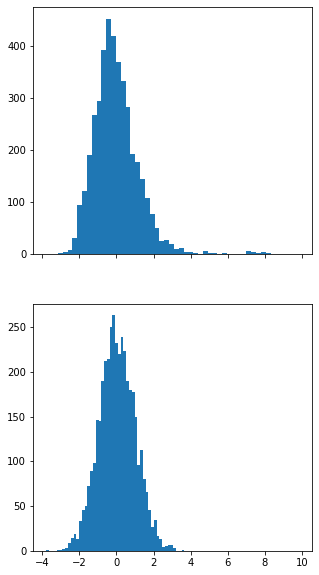

In [95]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train), bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L2


## Fined parametrs for L2

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9455995888906196 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9603754462685091 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


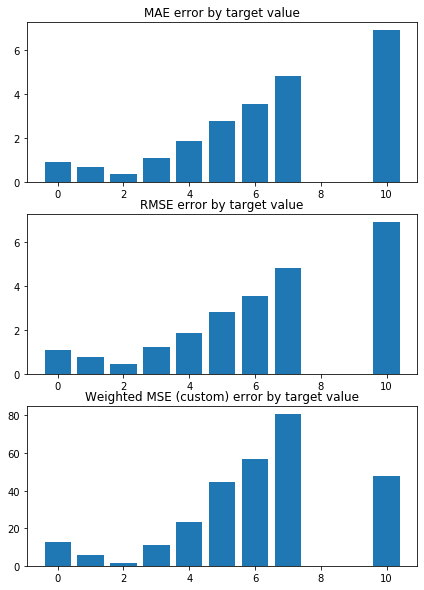

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8505579048187755 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9703194255065083 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


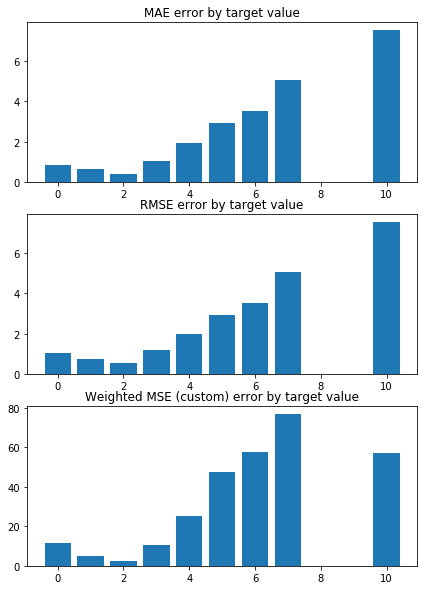

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.03950987994337 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518809239249897 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


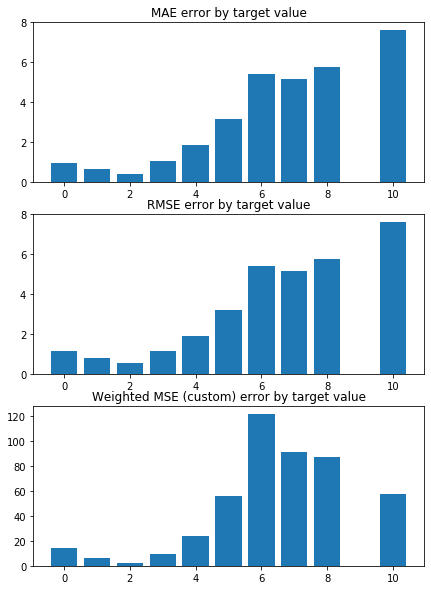

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9679932045405429 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9557725900337942 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


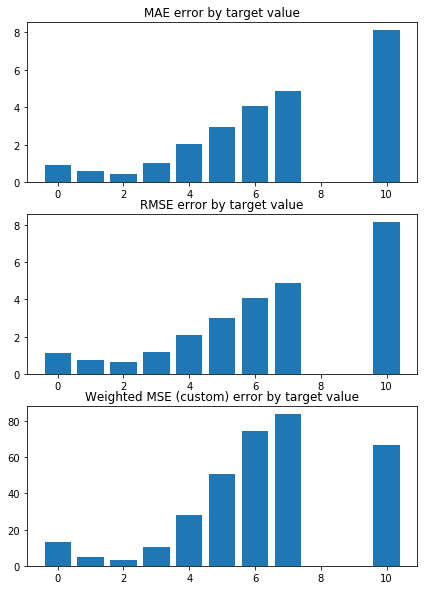

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0411551326283972 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9482024895993995 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


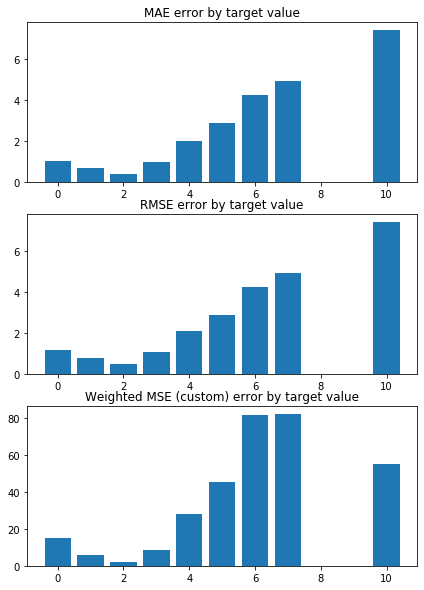

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642521288450389 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9568170964093333 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


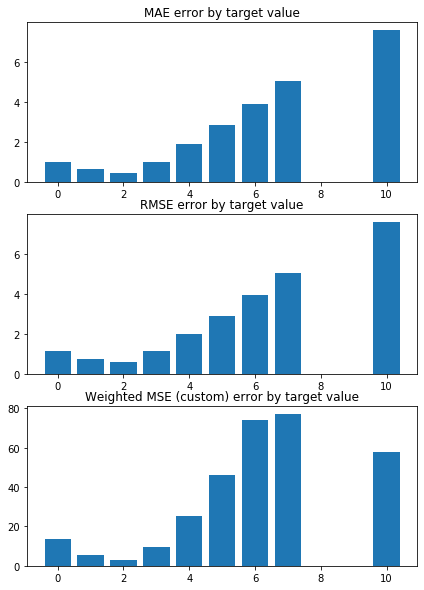

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9734548226658905 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9586834206397351 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


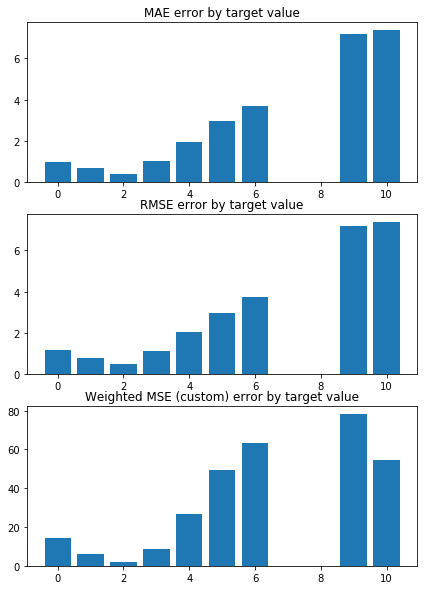

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9425846536237507 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9610023690953802 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


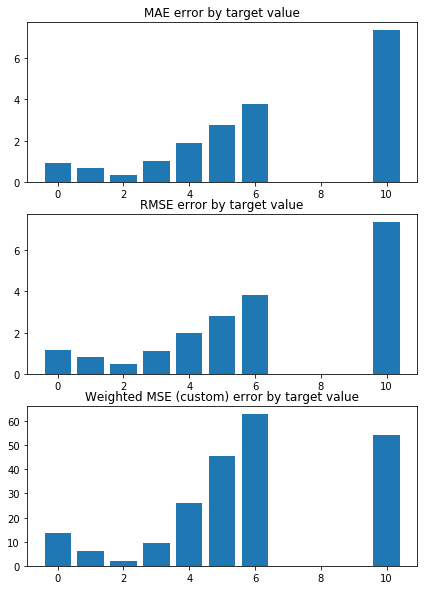

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0459065815277124 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9473869909682893 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


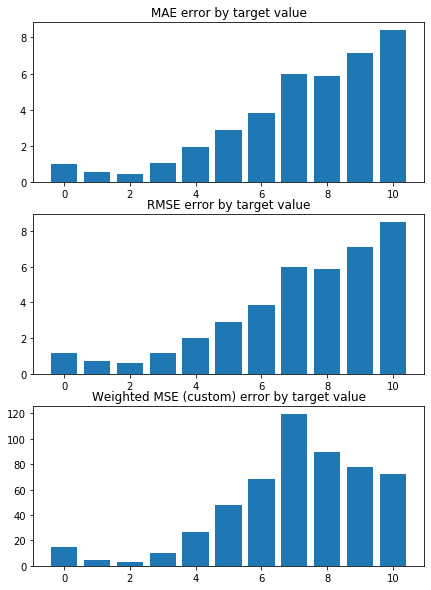

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.837035105811728 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9755965144073965 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


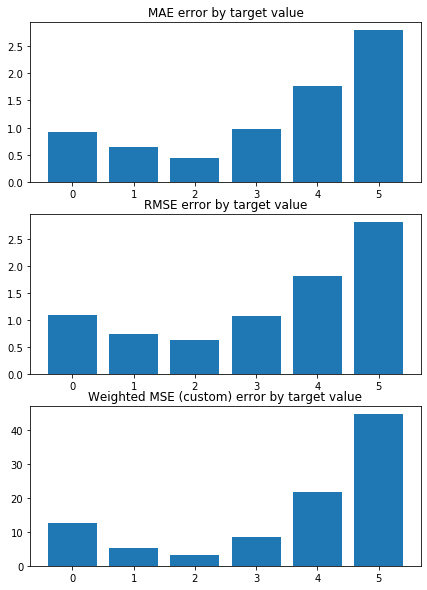

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760946939714553 

Mean squared error on Test: 0.96 
 MSE mean test:  1.579956057333393 

Root of MSE on Test: 0.98 
 1.2569630294218652 

Variance score on Test: 0.07 
 r2_test: 0.2692721089968628 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604917 -0.190577 -0.077341 -0.035250  0.013724
1 -0.605994 -0.209867 -0.069082 -0.046829  0.007790
2 -0.606345 -0.203347 -0.092007 -0.044125  0.009684
3 -0.613834 -0.199451 -0.066803 -0.050258  0.017438
4 -0.592805 -0.207426 -0.080341 -0.046697  0.022904
5 -0.599567 -0.199354 -0.070598 -0.039149  0.025675
6 -0.603285 -0.218941 -0.074712 -0.045496 -0.001745
7 -0.608094 -0.200640 -0.078664 -0.042130  0.012393
8 -0.603454 -0.207045 -0.077731 -0.039399  0.016631
9 -0.595396 -0.206297 -0.087506 -0.050025  0.019883
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


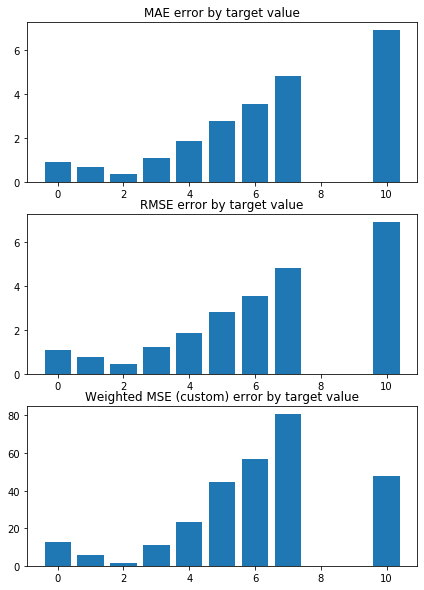

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8505358456088039 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9703054031481511 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


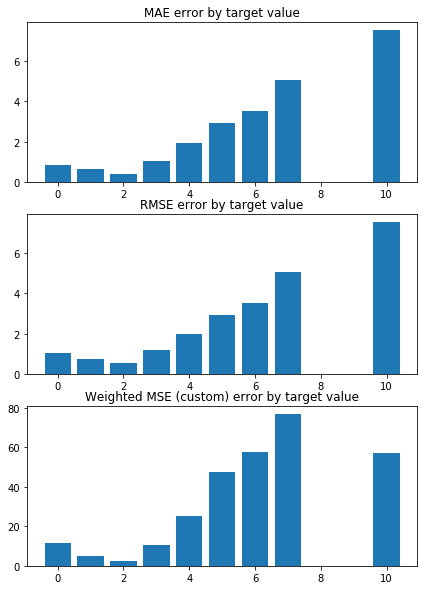

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0394807431337068 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518675441643046 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


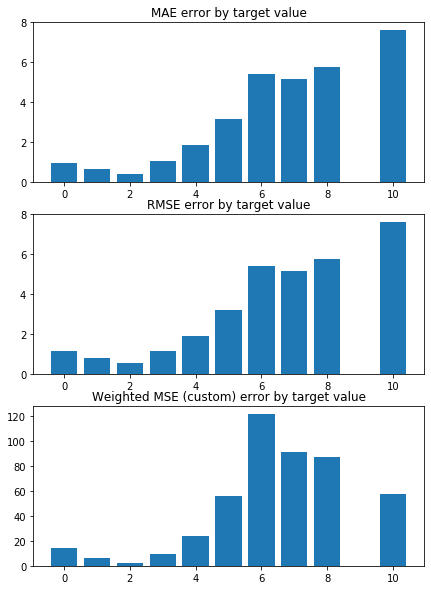

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9679726065538243 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9557573427832484 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


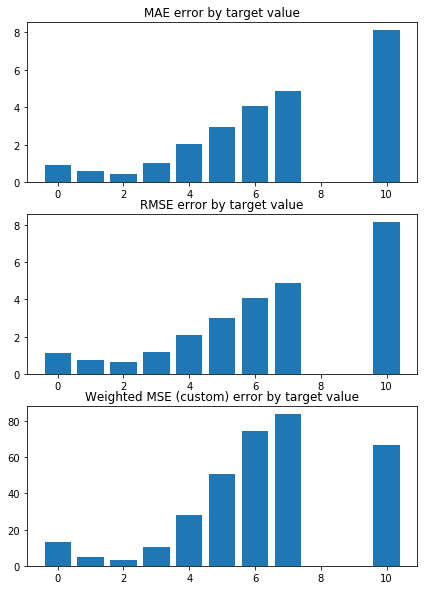

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0411490249444801 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9481896524499834 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


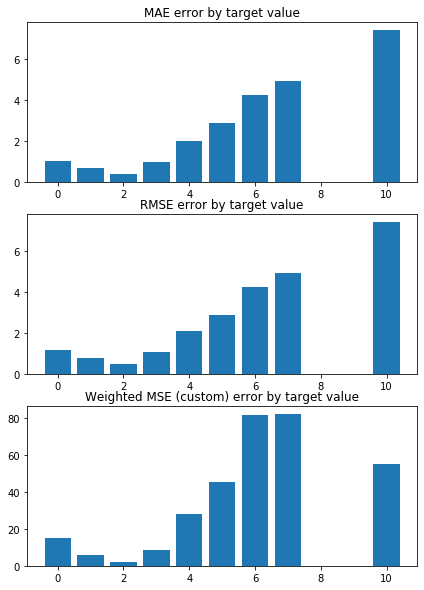

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.964246088055248 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9568038497919639 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


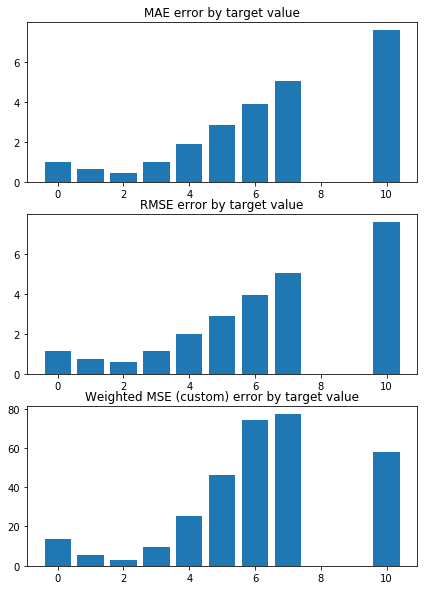

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9734328133021873 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9586694145486572 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


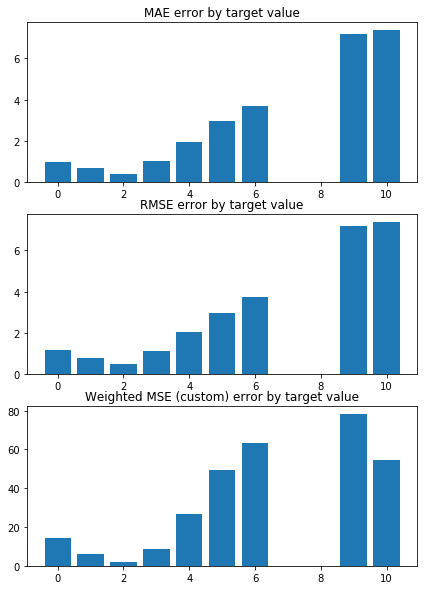

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9425628838988455 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9609883130624535 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


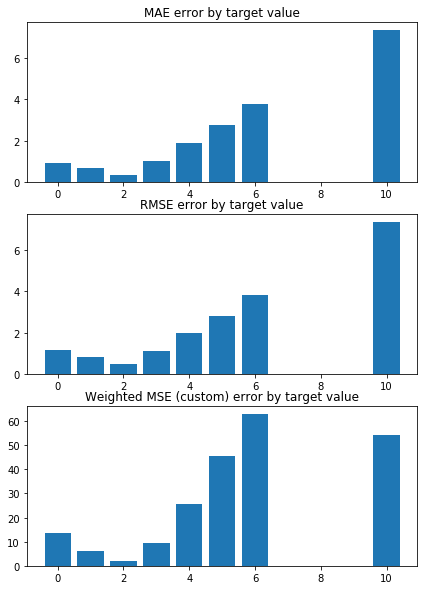

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.045896649599076 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9473722963002179 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


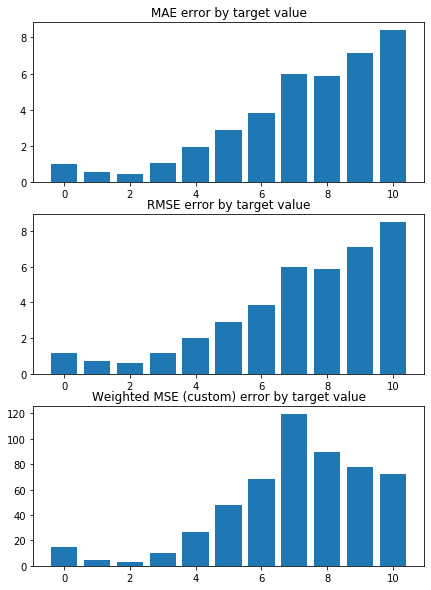

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.837035726910493 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9755823616104968 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


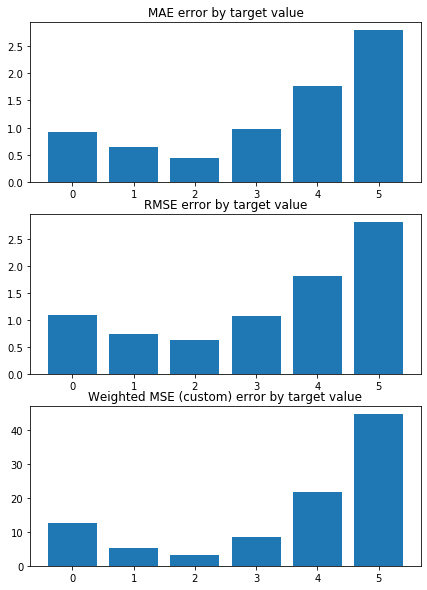

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.576094709765333 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5799553149331433 

Root of MSE on Test: 0.98 
 1.2569627341067608 

Variance score on Test: 0.07 
 r2_test: 0.26927230615821557 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604765 -0.190609 -0.077358 -0.035216  0.013762
1 -0.605842 -0.209893 -0.069101 -0.046791  0.007831
2 -0.606195 -0.203375 -0.092022 -0.044090  0.009723
3 -0.613681 -0.199480 -0.066823 -0.050220  0.017477
4 -0.592661 -0.207450 -0.080357 -0.046661  0.022940
5 -0.599419 -0.199382 -0.070617 -0.039114  0.025711
6 -0.603135 -0.218964 -0.074730 -0.045459 -0.001703
7 -0.607941 -0.200670 -0.078681 -0.042094  0.012432
8 -0.603304 -0.207072 -0.077748 -0.039364  0.016669
9 -0.595250 -0.206323 -0.087521 -0.049989  0.019920
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


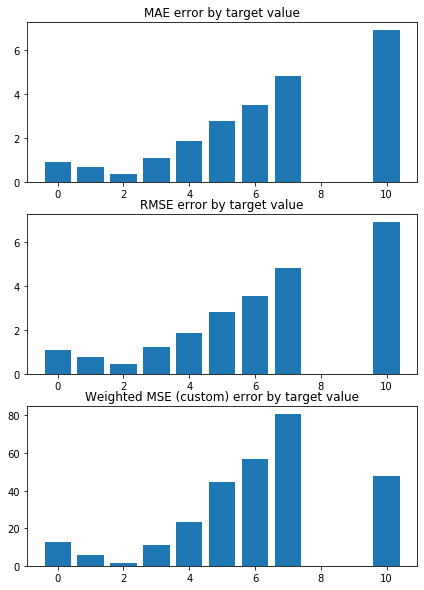

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8505138301784377 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9702914158779865 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


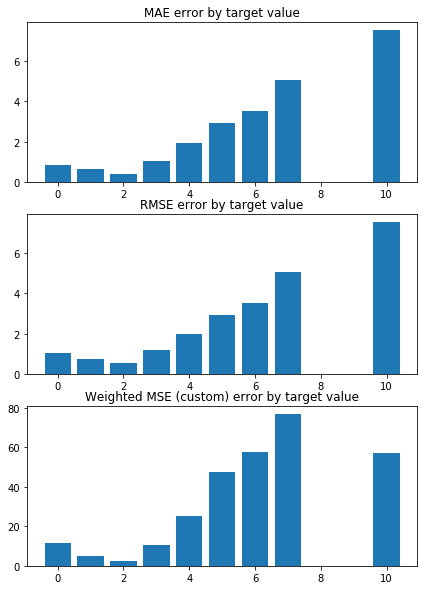

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0394516479813853 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518541981388022 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


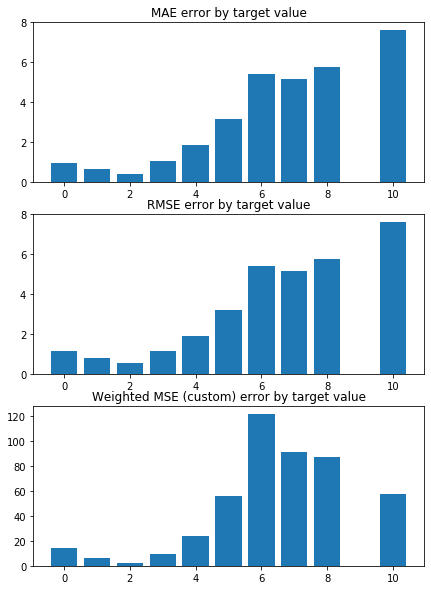

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9679520480181921 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9557421318615295 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


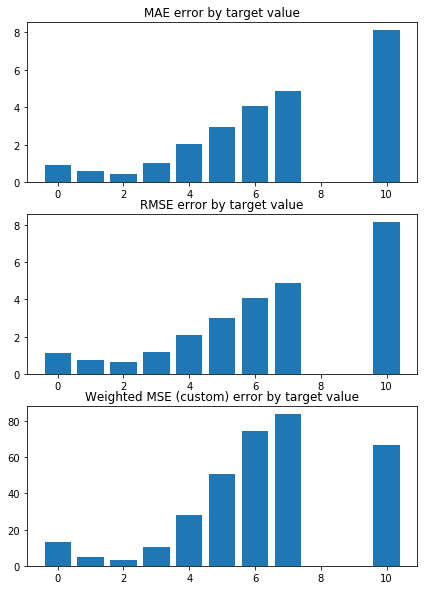

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0411429415692124 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9481768471302593 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


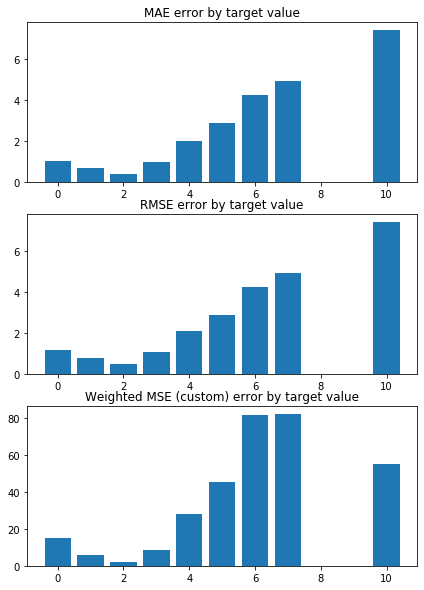

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642400756011764 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9567906362159788 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


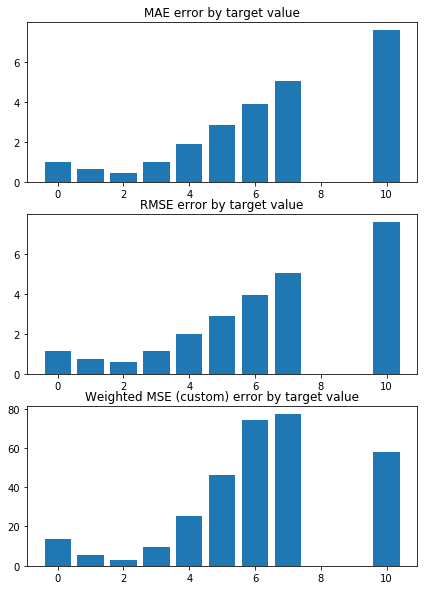

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9734108406527985 


 TRAIN PREDICTION Error
weighted_mse_train: 0.958655442920022 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


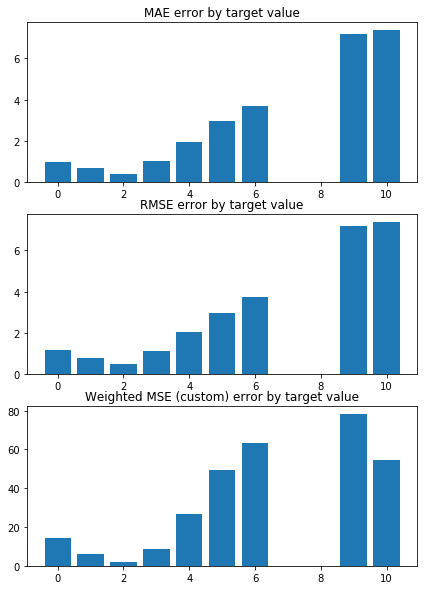

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9425411569957348 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9609742919245463 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


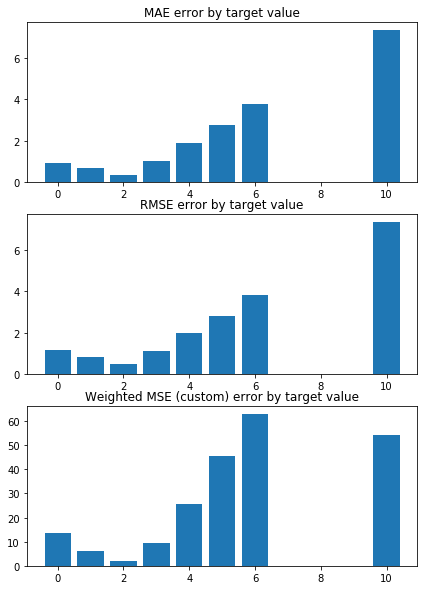

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0458867480582095 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9473576359703132 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


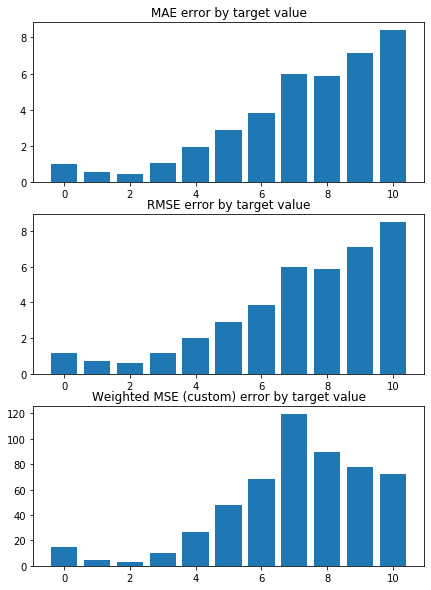

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8370363697911024 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9755682418050018 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


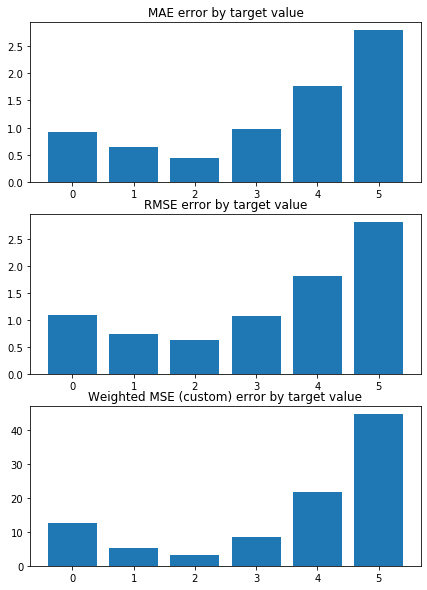

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.576094757107753 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5799546045254576 

Root of MSE on Test: 0.98 
 1.2569624515177282 

Variance score on Test: 0.07 
 r2_test: 0.2692724883069184 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604613 -0.190640 -0.077374 -0.035182  0.013800
1 -0.605689 -0.209919 -0.069121 -0.046753  0.007871
2 -0.606045 -0.203402 -0.092036 -0.044054  0.009761
3 -0.613527 -0.199510 -0.066842 -0.050182  0.017516
4 -0.592517 -0.207473 -0.080373 -0.046625  0.022977
5 -0.599271 -0.199409 -0.070635 -0.039079  0.025747
6 -0.602986 -0.218987 -0.074748 -0.045422 -0.001660
7 -0.607788 -0.200699 -0.078698 -0.042058  0.012471
8 -0.603155 -0.207100 -0.077764 -0.039329  0.016708
9 -0.595105 -0.206349 -0.087536 -0.049953  0.019956
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


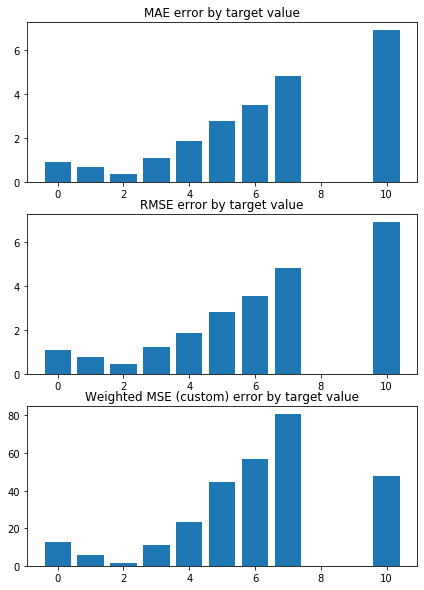

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8504918584565672 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9702774636361355 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


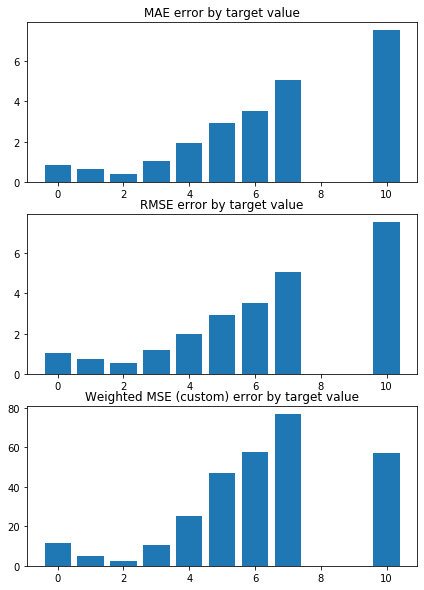

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0394225944221185 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518408857916949 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


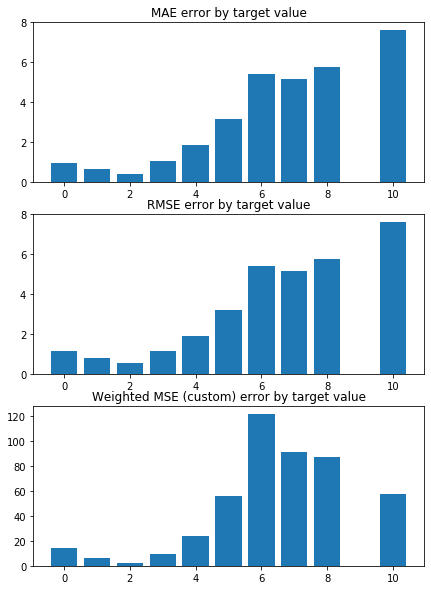

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9679315288683352 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9557269572068019 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


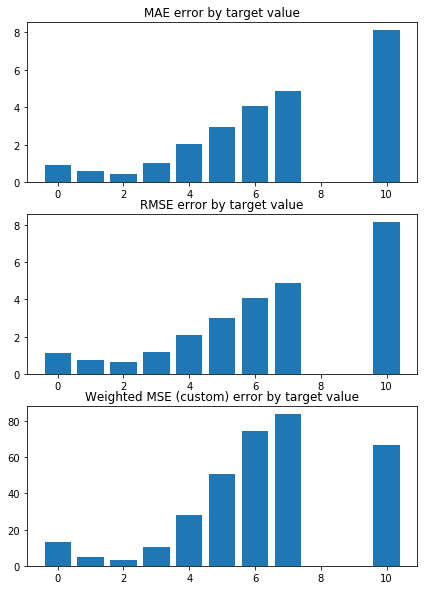

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0411368824616167 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9481640735876314 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


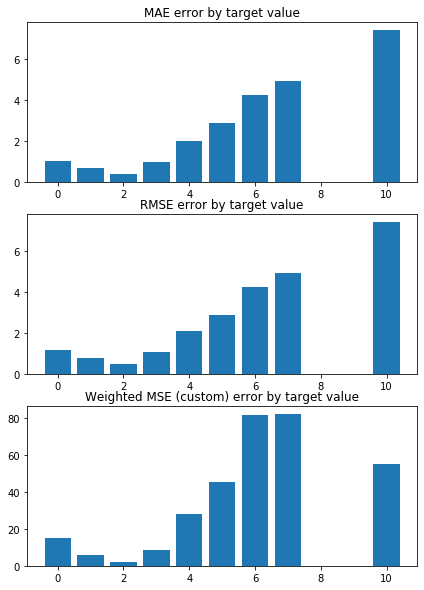

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642340914322971 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9567774556255274 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


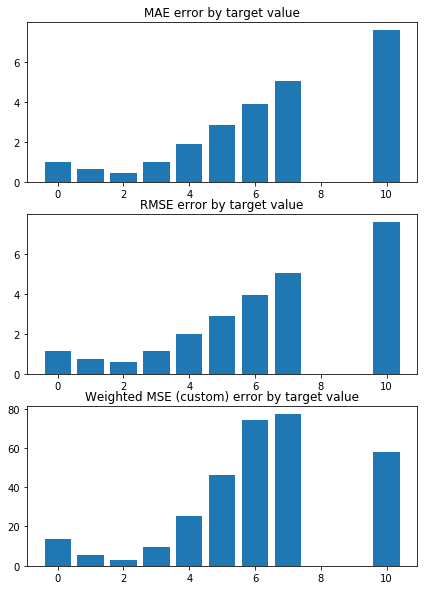

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9733889046599719 


 TRAIN PREDICTION Error
weighted_mse_train: 0.958641505695995 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


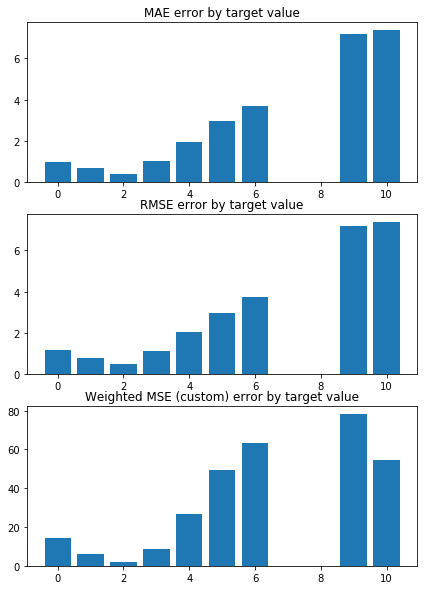

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.942519472843289 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9609603056220013 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


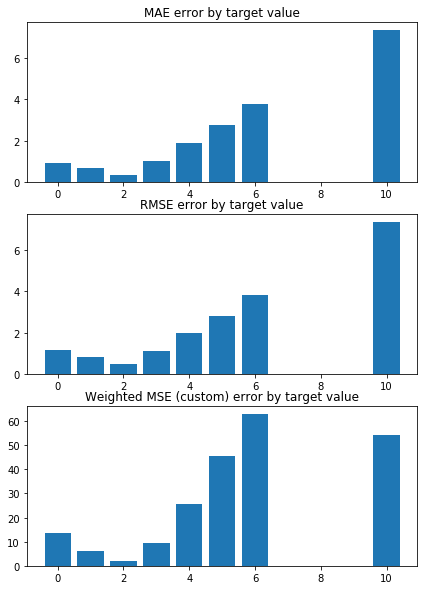

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.045876876851226 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9473430099206562 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


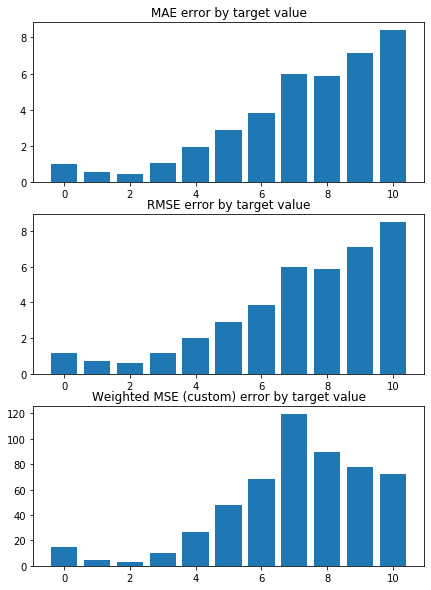

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8370370344122828 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9755541549362569 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


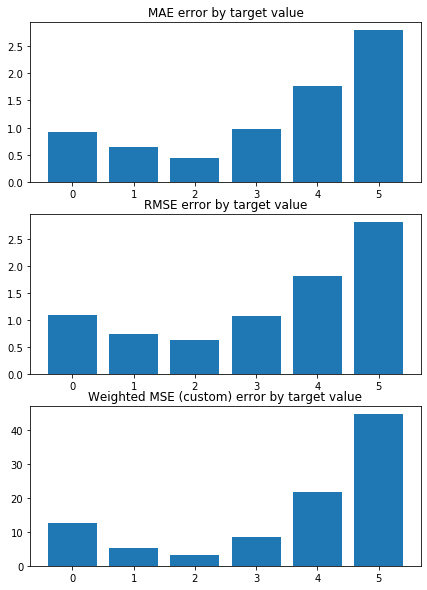

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760948359399964 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5799539260511366 

Root of MSE on Test: 0.98 
 1.2569621816312282 

Variance score on Test: 0.07 
 r2_test: 0.26927265547080526 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604461 -0.190672 -0.077391 -0.035147  0.013838
1 -0.605537 -0.209945 -0.069140 -0.046716  0.007911
2 -0.605895 -0.203430 -0.092051 -0.044019  0.009800
3 -0.613374 -0.199539 -0.066861 -0.050144  0.017555
4 -0.592373 -0.207497 -0.080389 -0.046589  0.023013
5 -0.599124 -0.199436 -0.070654 -0.039044  0.025784
6 -0.602836 -0.219011 -0.074765 -0.045385 -0.001618
7 -0.607636 -0.200728 -0.078715 -0.042023  0.012510
8 -0.603005 -0.207127 -0.077781 -0.039294  0.016746
9 -0.594959 -0.206374 -0.087551 -0.049918  0.019993
KFold(n_splits=10, random_state=16, shuffle=True)
train_index

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


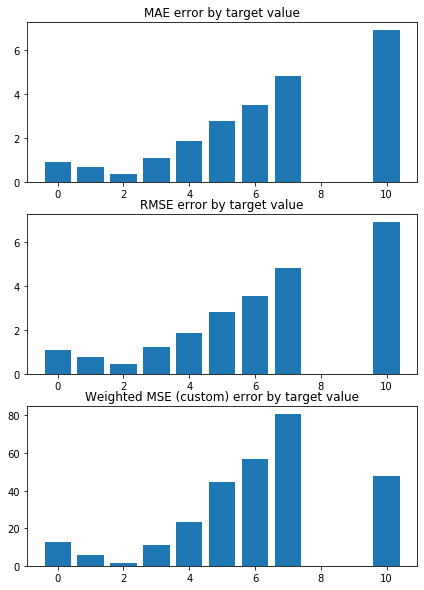

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8504699303722347 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9702635463628528 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


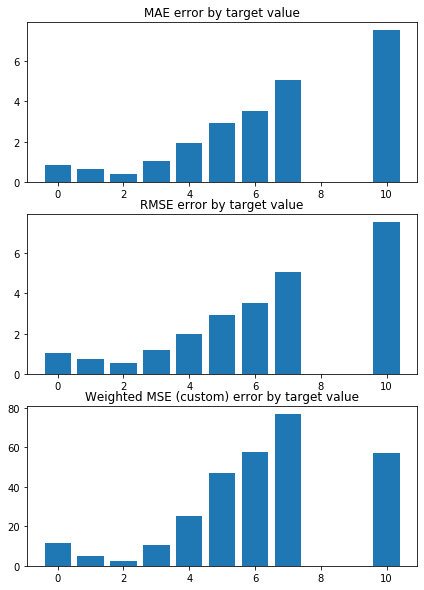

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0393935823917553 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518276070663192 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


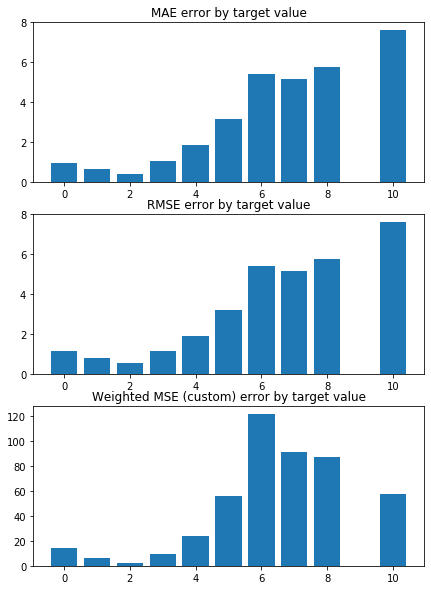

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9679110490390826 


 TRAIN PREDICTION Error
weighted_mse_train: 0.955711818757366 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


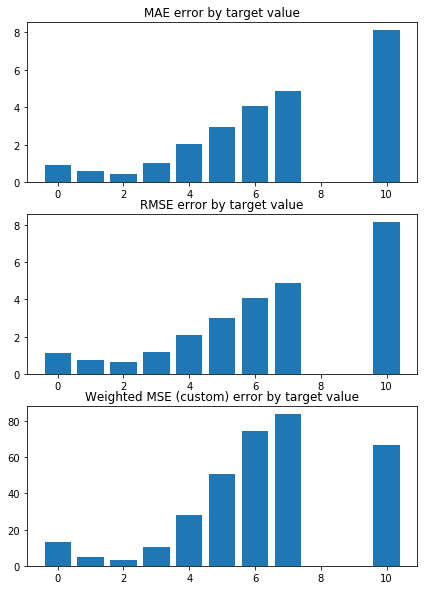

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.041130847580809 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9481513317696177 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


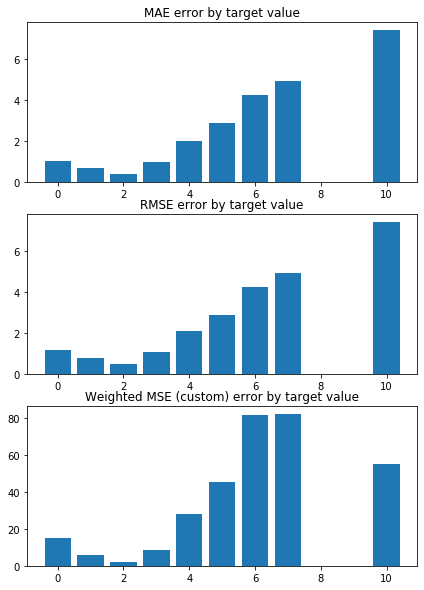

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642281354981969 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9567643079648839 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


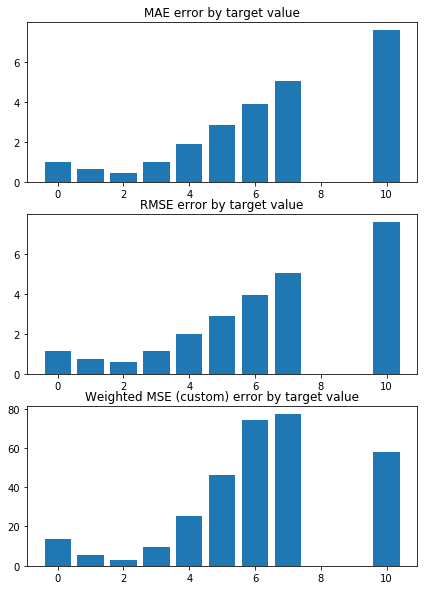

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9733670052660802 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9586276028188689 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


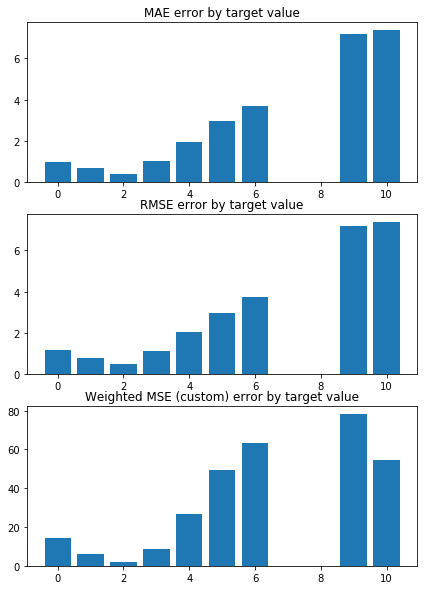

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9424978313705341 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9609463540952923 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


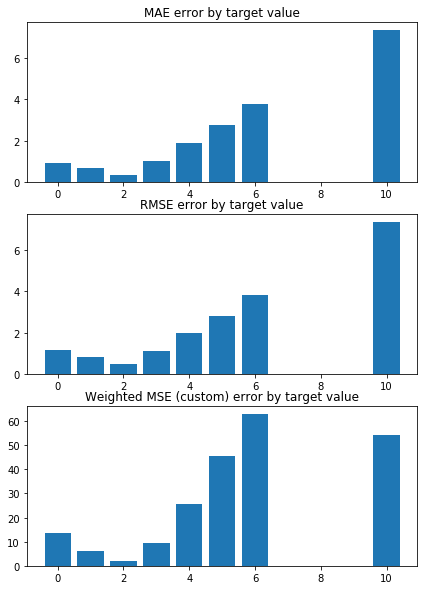

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0458670359243616 


 TRAIN PREDICTION Error
weighted_mse_train: 0.947328418093457 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


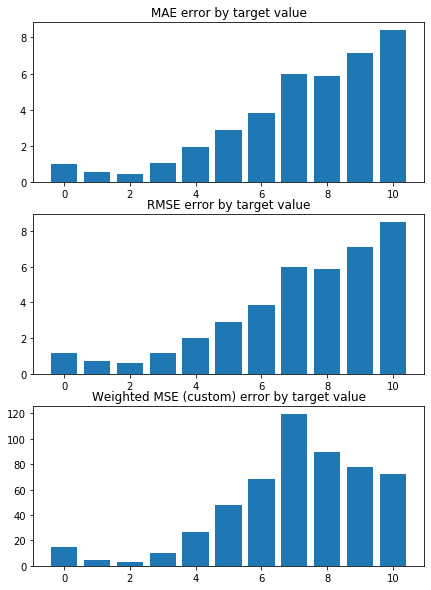

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.837037720732861 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9755401009497277 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


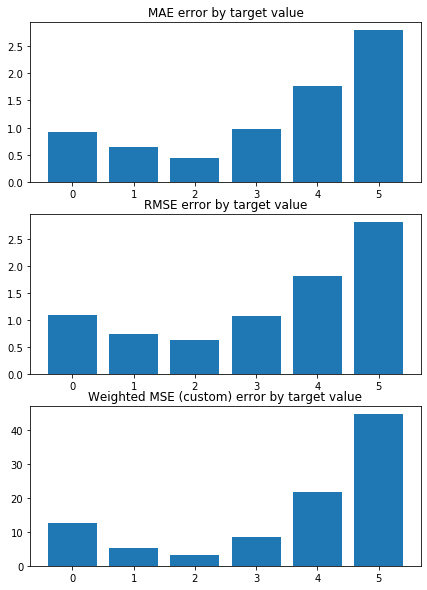

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760949462034806 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5799532794511173 

Root of MSE on Test: 0.98 
 1.256961924423774 

Variance score on Test: 0.07 
 r2_test: 0.2692728076776462 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604310 -0.190703 -0.077407 -0.035113  0.013876
1 -0.605385 -0.209970 -0.069159 -0.046678  0.007952
2 -0.605745 -0.203457 -0.092066 -0.043983  0.009839
3 -0.613221 -0.199569 -0.066881 -0.050106  0.017595
4 -0.592229 -0.207520 -0.080405 -0.046553  0.023050
5 -0.598976 -0.199464 -0.070672 -0.039009  0.025820
6 -0.602687 -0.219034 -0.074783 -0.045348 -0.001575
7 -0.607484 -0.200757 -0.078732 -0.041987  0.012549
8 -0.602856 -0.207154 -0.077798 -0.039260  0.016784
9 -0.594813 -0.206400 -0.087566 -0.049882  0.020030
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


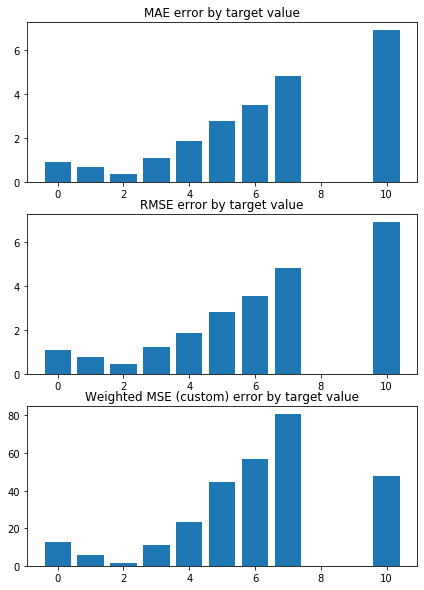

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8504480458546351 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9702496639985246 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


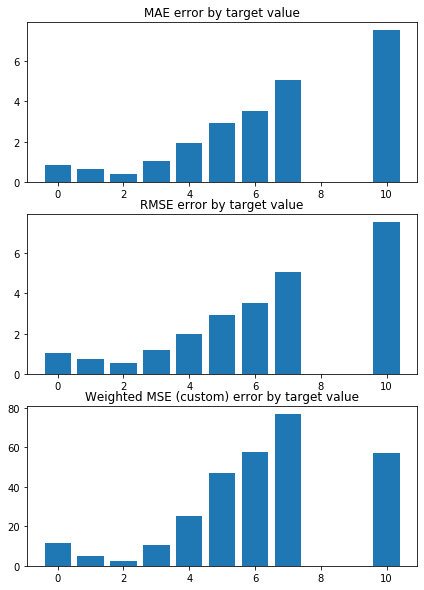

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0393646118262798 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518143619061369 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


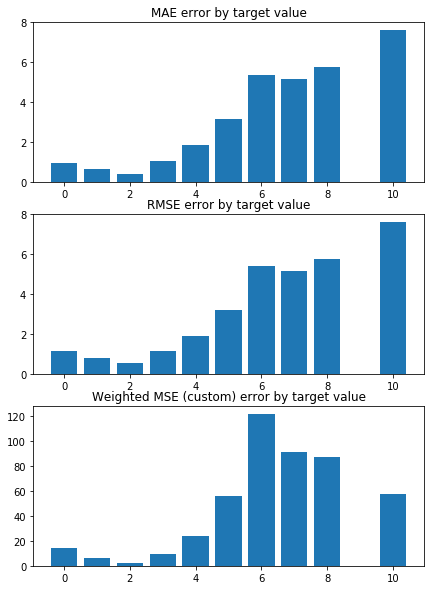

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9678906084654044 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9556967164516585 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


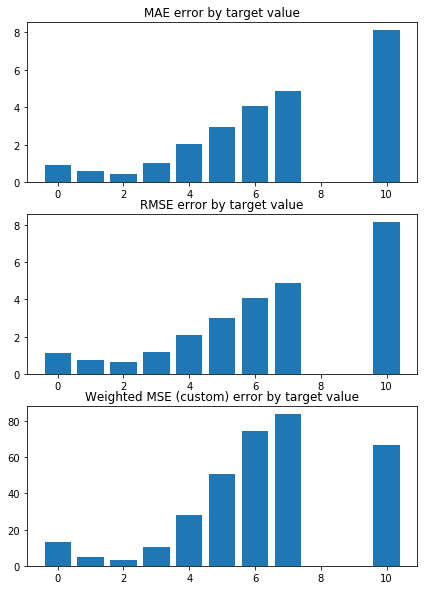

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.041124836885996 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9481386216238508 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


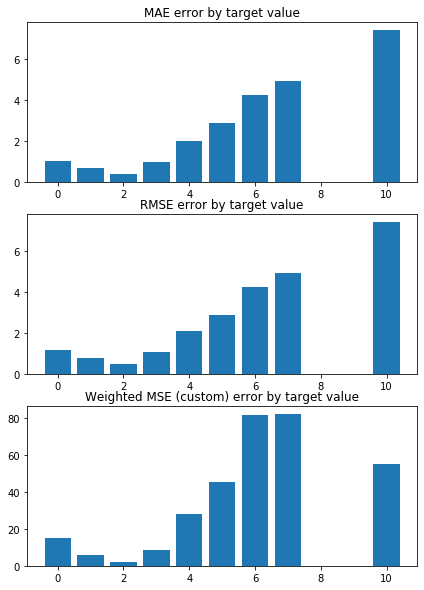

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642222077485748 


 TRAIN PREDICTION Error
weighted_mse_train: 0.956751193178444 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


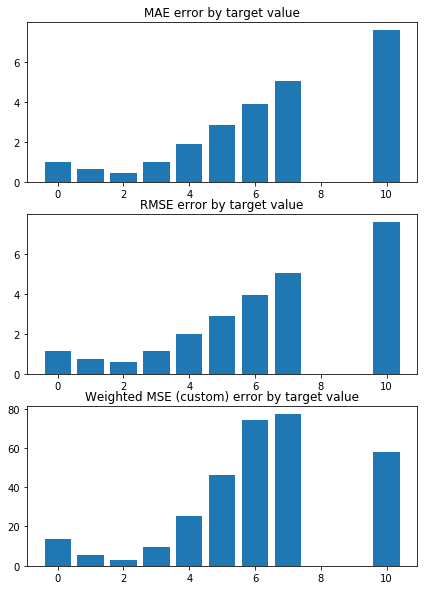

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9733451424136201 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9586137342310633 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


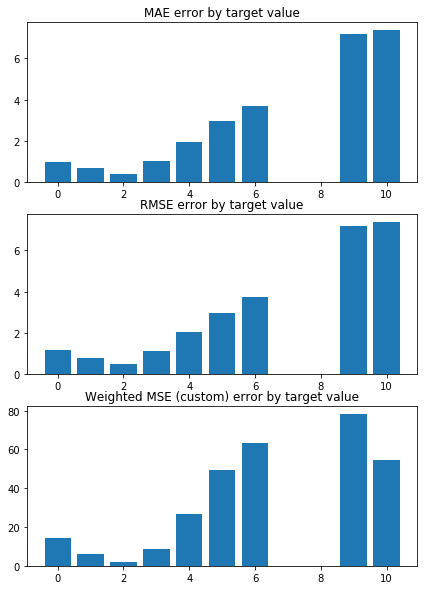

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9424762325066514 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9609324372850268 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


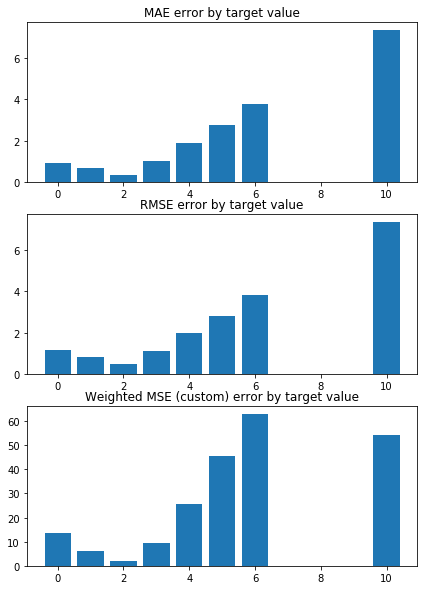

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0458572252239737 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9473138604310531 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


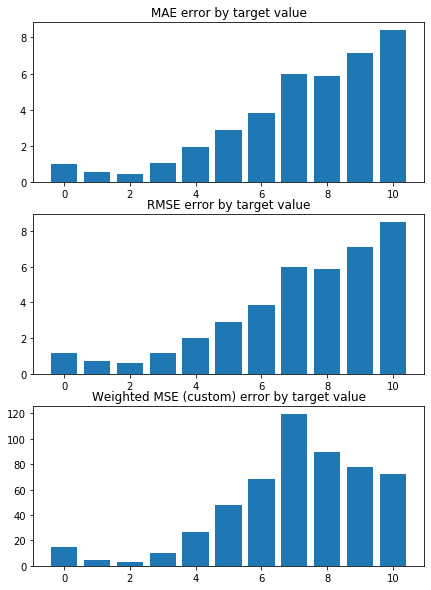

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.837038428711764 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9755260797909995 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


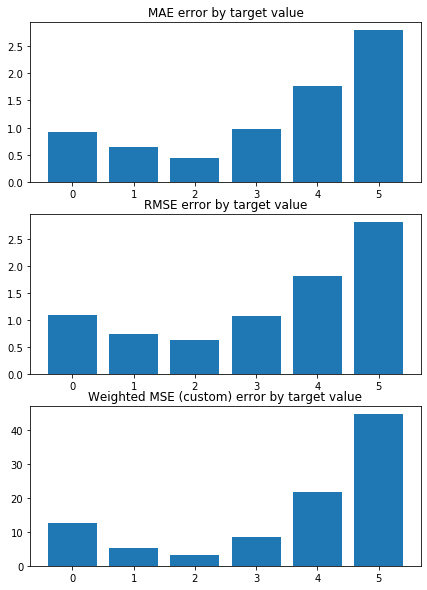

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760950878397568 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5799526646664717 

Root of MSE on Test: 0.98 
 1.256961679871933 

Variance score on Test: 0.07 
 r2_test: 0.2692729449551473 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604158 -0.190734 -0.077423 -0.035079  0.013914
1 -0.605233 -0.209996 -0.069178 -0.046641  0.007992
2 -0.605596 -0.203485 -0.092080 -0.043948  0.009877
3 -0.613068 -0.199598 -0.066900 -0.050068  0.017634
4 -0.592085 -0.207543 -0.080421 -0.046518  0.023086
5 -0.598828 -0.199491 -0.070691 -0.038974  0.025856
6 -0.602538 -0.219057 -0.074800 -0.045311 -0.001533
7 -0.607331 -0.200786 -0.078749 -0.041951  0.012588
8 -0.602706 -0.207182 -0.077814 -0.039225  0.016822
9 -0.594668 -0.206426 -0.087581 -0.049846  0.020066
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


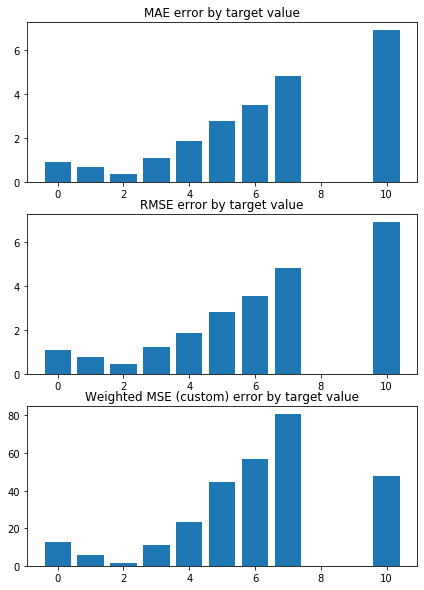

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.850426204833115 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9702358164836702 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


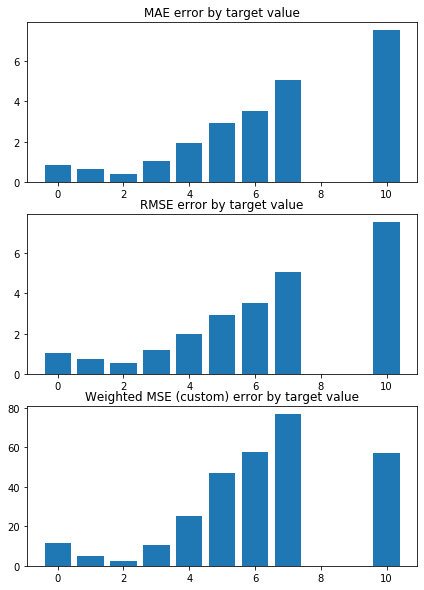

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.039335682661812 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518011502547339 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


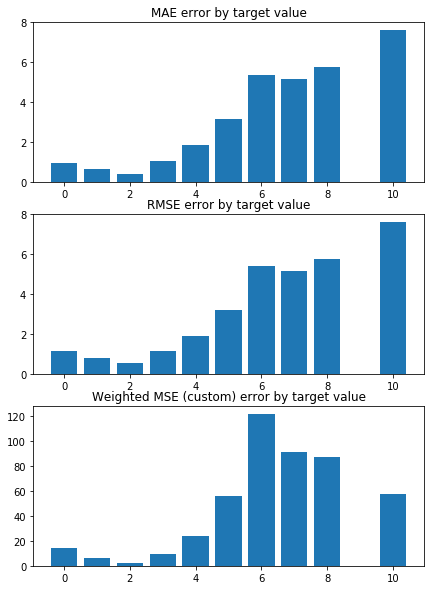

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9678702070824099 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9556816502282519 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


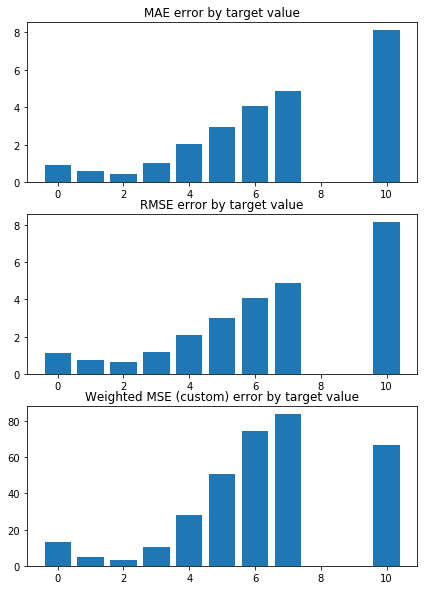

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0411188503364759 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9481259430980771 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


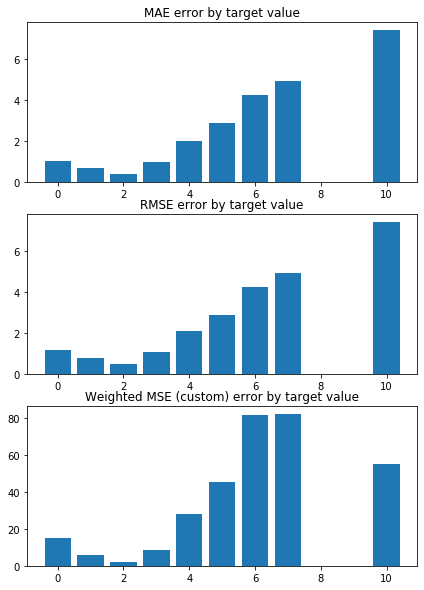

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642163081332424 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9567381112107267 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


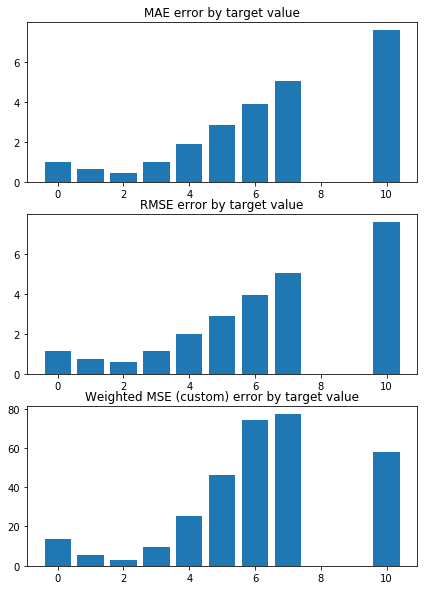

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9733233160452123 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9585998998751234 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


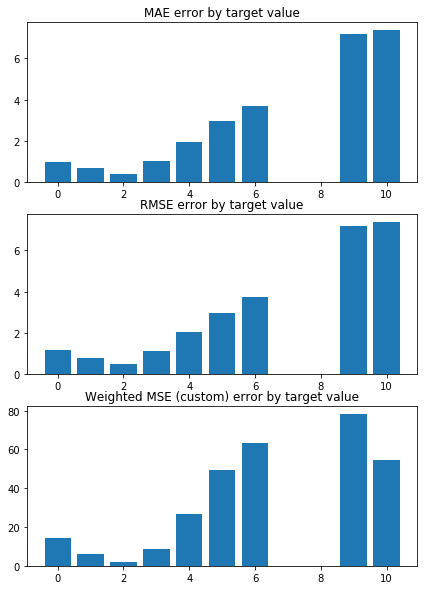

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9424546761809774 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9609185551319441 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


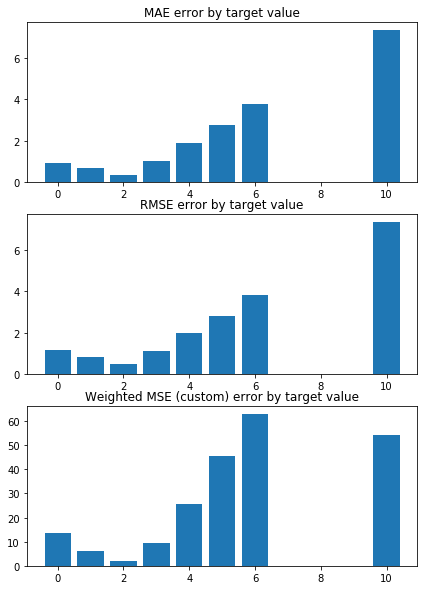

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0458474446965422 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9472993368759106 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


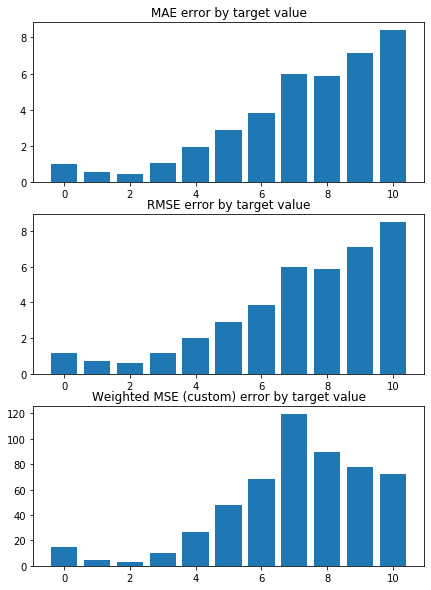

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.837039158308017 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9755120914057778 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


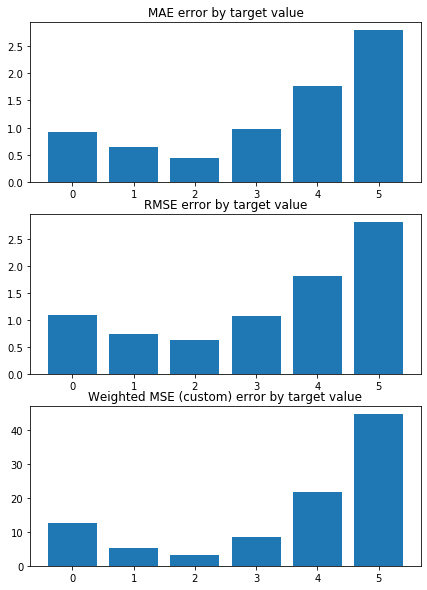

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.576095260790511 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5799520816384083 

Root of MSE on Test: 0.98 
 1.2569614479523261 

Variance score on Test: 0.07 
 r2_test: 0.2692730673309508 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604007 -0.190765 -0.077440 -0.035045  0.013952
1 -0.605081 -0.210022 -0.069197 -0.046603  0.008032
2 -0.605446 -0.203512 -0.092095 -0.043912  0.009916
3 -0.612915 -0.199627 -0.066919 -0.050030  0.017673
4 -0.591942 -0.207567 -0.080437 -0.046482  0.023122
5 -0.598681 -0.199518 -0.070709 -0.038940  0.025892
6 -0.602389 -0.219080 -0.074818 -0.045274 -0.001491
7 -0.607179 -0.200815 -0.078766 -0.041916  0.012627
8 -0.602557 -0.207209 -0.077831 -0.039190  0.016860
9 -0.594522 -0.206451 -0.087596 -0.049810  0.020103
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


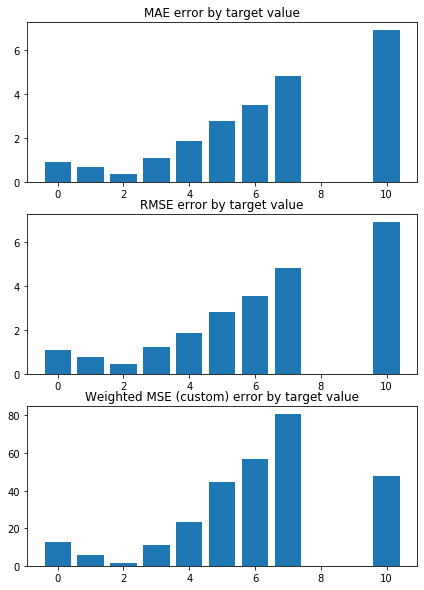

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8504044072371716 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9702220037589395 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


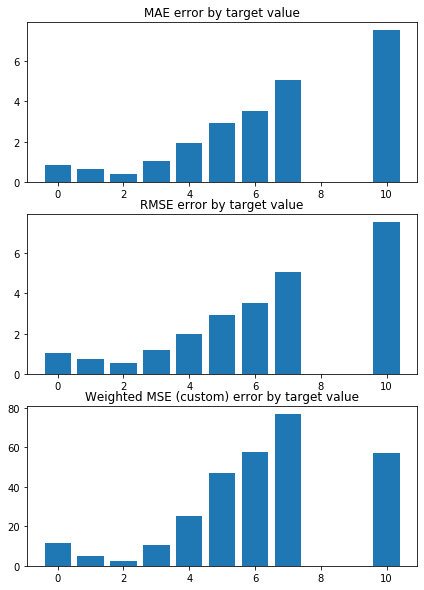

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0393067948346064 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9517879720558202 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


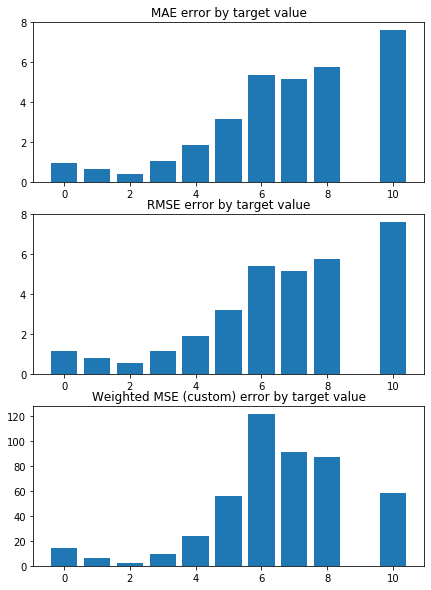

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9678498448253492 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9556666200258541 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


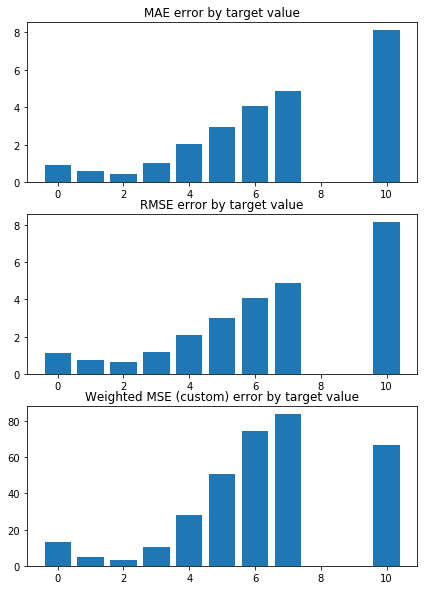

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0411128878916376 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9481132961401566 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


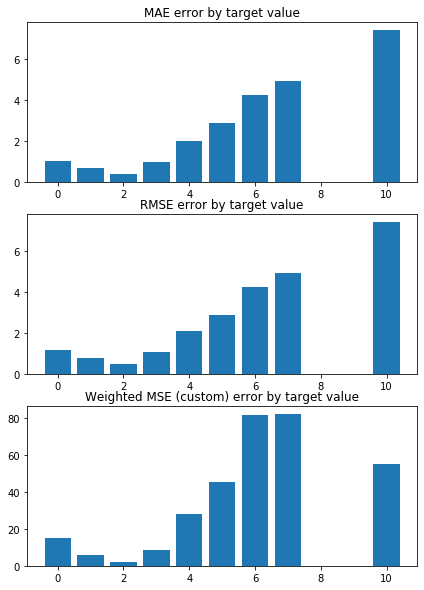

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642104366021234 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9567250620063722 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


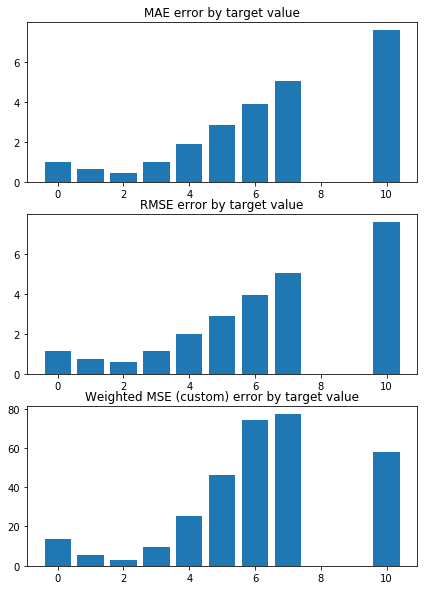

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.973301526103601 


 TRAIN PREDICTION Error
weighted_mse_train: 0.958586099693721 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


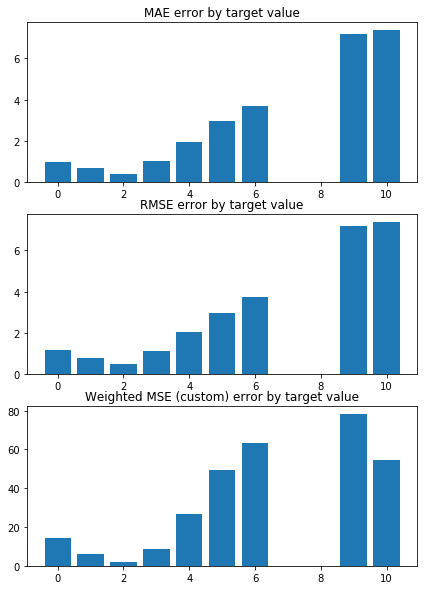

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9424331623230024 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9609047075769162 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


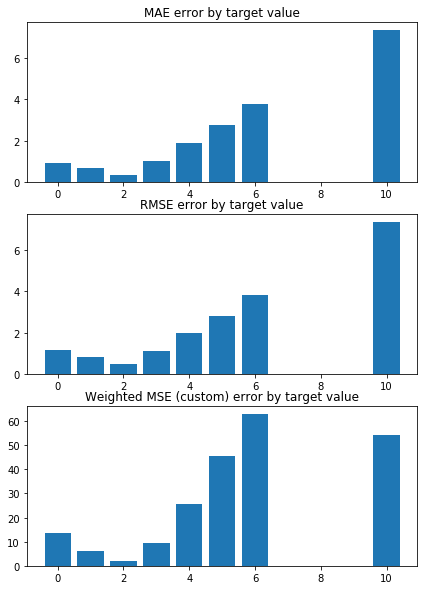

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0458376942886691 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9472848473706221 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


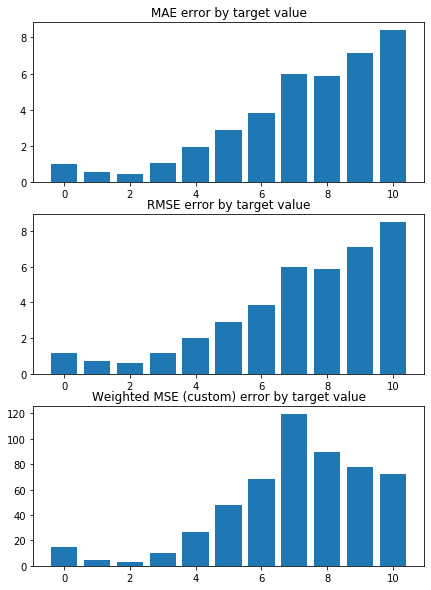

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8370399094807454 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9754981357398864 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


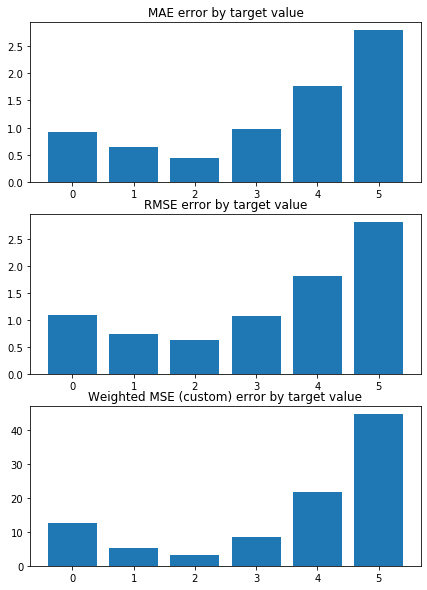

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760954649975643 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5799515303082692 

Root of MSE on Test: 0.98 
 1.2569612286416272 

Variance score on Test: 0.07 
 r2_test: 0.26927317483263546 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.603856 -0.190796 -0.077456 -0.035010  0.013990
1 -0.604929 -0.210047 -0.069216 -0.046566  0.008072
2 -0.605297 -0.203539 -0.092109 -0.043877  0.009954
3 -0.612762 -0.199656 -0.066938 -0.049992  0.017712
4 -0.591798 -0.207590 -0.080453 -0.046446  0.023159
5 -0.598534 -0.199545 -0.070728 -0.038905  0.025928
6 -0.602240 -0.219102 -0.074835 -0.045237 -0.001449
7 -0.607027 -0.200844 -0.078783 -0.041880  0.012666
8 -0.602408 -0.207236 -0.077847 -0.039155  0.016898
9 -0.594377 -0.206477 -0.087610 -0.049774  0.020139
KFold(n_splits=10, random_state=16, shuffle=True)
train_index

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


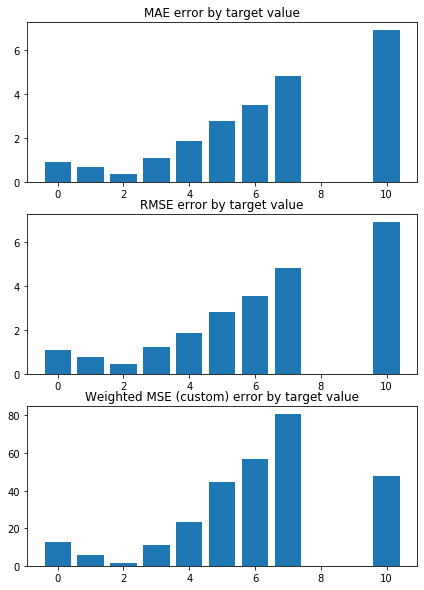

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8503826529964532 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9702082257651149 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


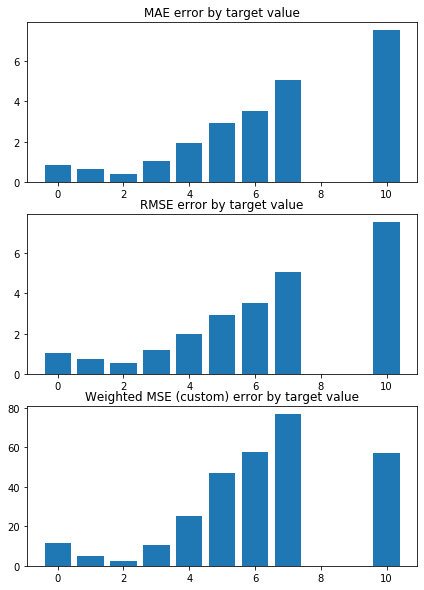

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0392779482810512 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9517748272532297 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


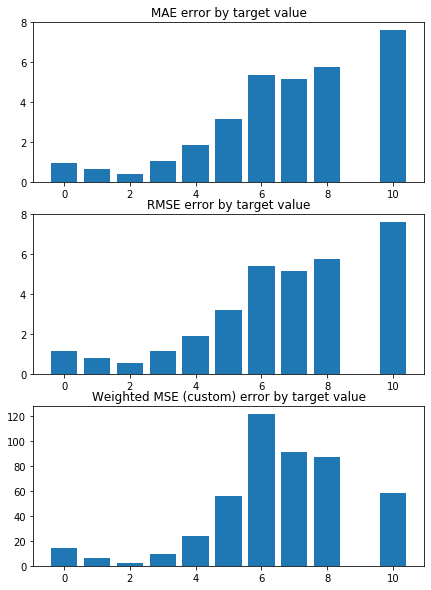

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9678295216296103 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9556516257833079 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


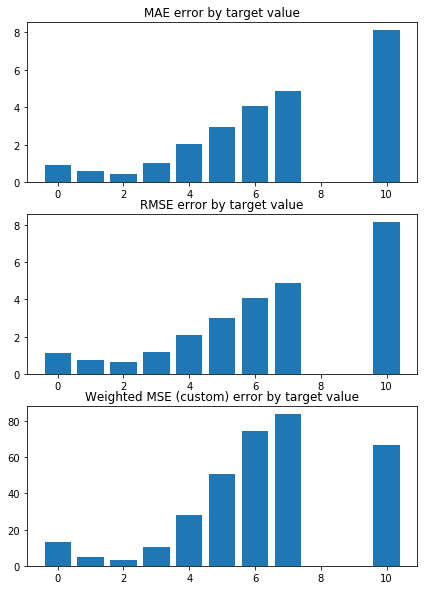

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0411069495109613 


 TRAIN PREDICTION Error
weighted_mse_train: 0.948100680698063 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


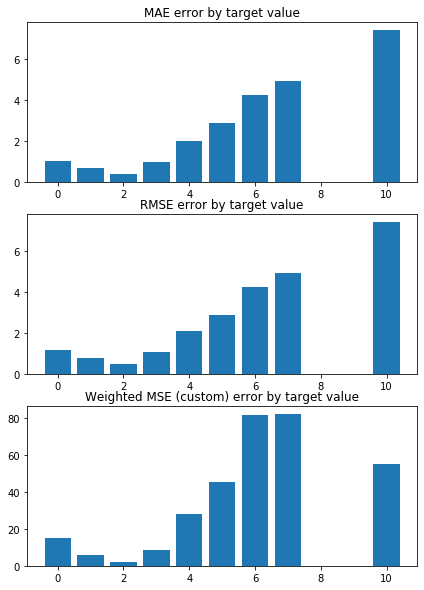

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642045931052532 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9567120455101442 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


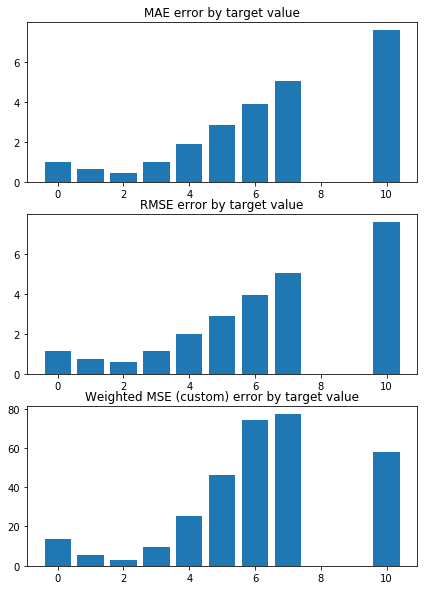

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9732797725316534 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9585723336296532 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


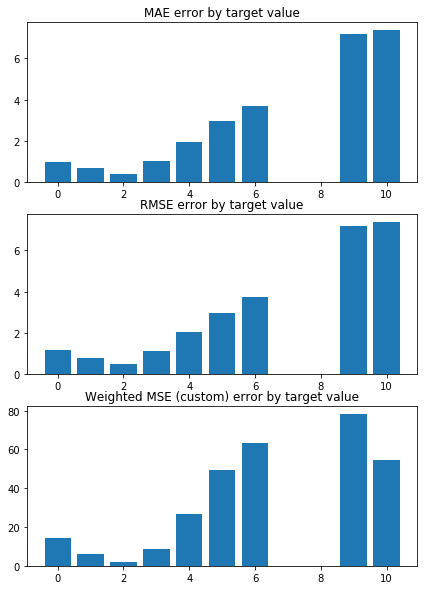

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.942411690862371 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9608908945609453 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


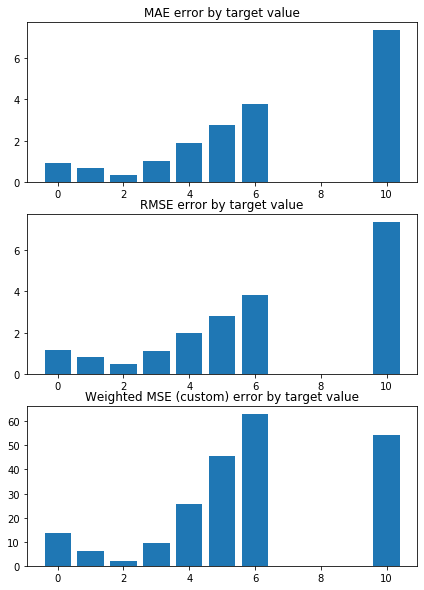

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.045827973947076 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9472703918579082 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


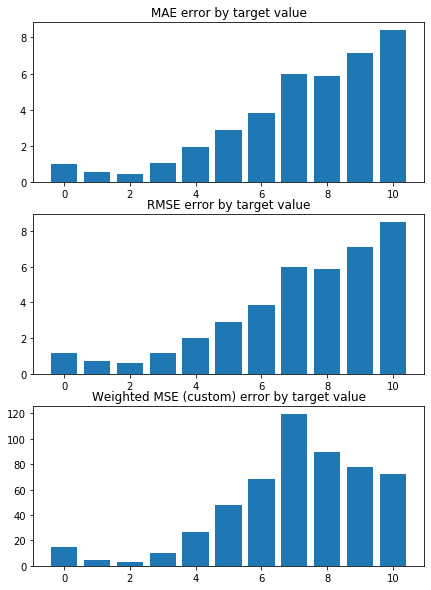

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.837040682189172 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9754842127392682 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


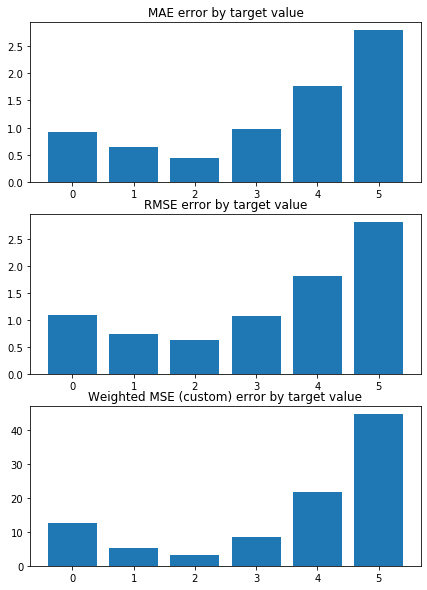

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760957004028693 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5799510106175325 

Root of MSE on Test: 0.98 
 1.256961021916564 

Variance score on Test: 0.07 
 r2_test: 0.2692732674877168 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.603704 -0.190828 -0.077473 -0.034976  0.014028
1 -0.604777 -0.210073 -0.069235 -0.046529  0.008113
2 -0.605148 -0.203566 -0.092124 -0.043841  0.009993
3 -0.612610 -0.199686 -0.066958 -0.049954  0.017751
4 -0.591655 -0.207613 -0.080469 -0.046411  0.023195
5 -0.598387 -0.199572 -0.070746 -0.038870  0.025964
6 -0.602091 -0.219125 -0.074853 -0.045200 -0.001406
7 -0.606875 -0.200873 -0.078800 -0.041844  0.012704
8 -0.602259 -0.207263 -0.077864 -0.039120  0.016937
9 -0.594232 -0.206502 -0.087625 -0.049738  0.020176
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


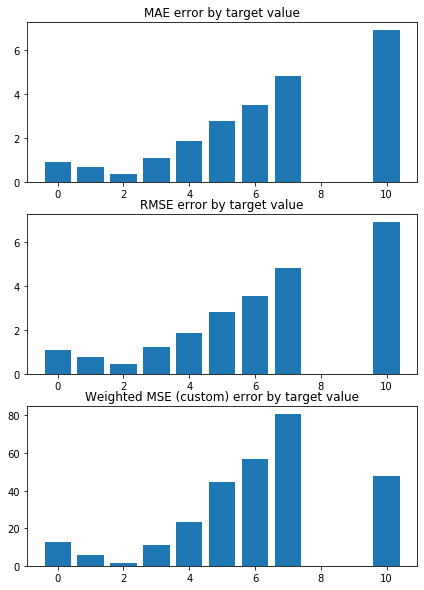

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8503609420407584 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9701944824431095 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


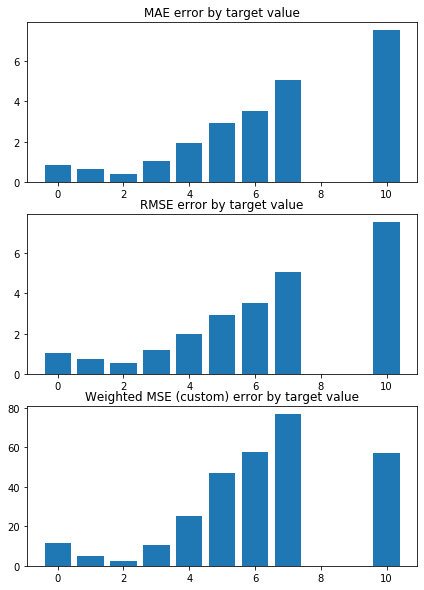

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0392491429376698 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9517617157909193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


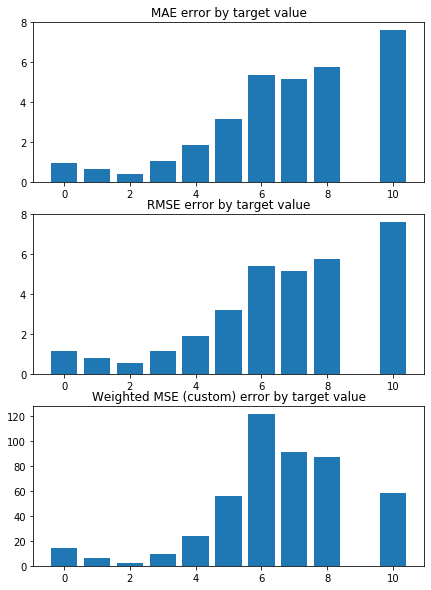

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9678092374307212 


 TRAIN PREDICTION Error
weighted_mse_train: 0.955636667439591 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


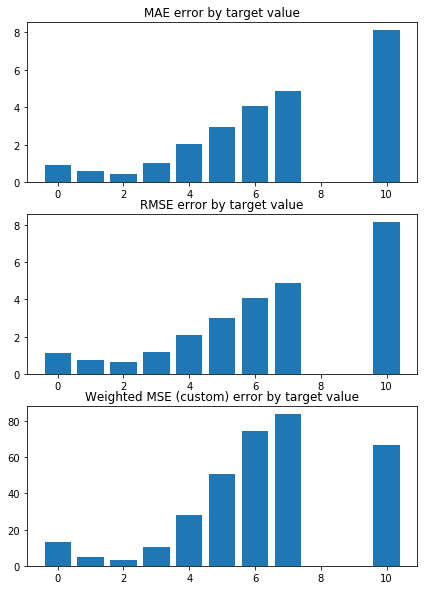

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.041101035154018 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9480880967198821 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


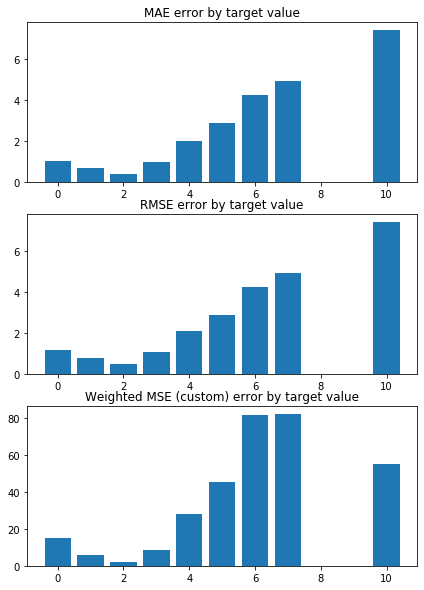

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9641987775927787 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9566990616669259 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


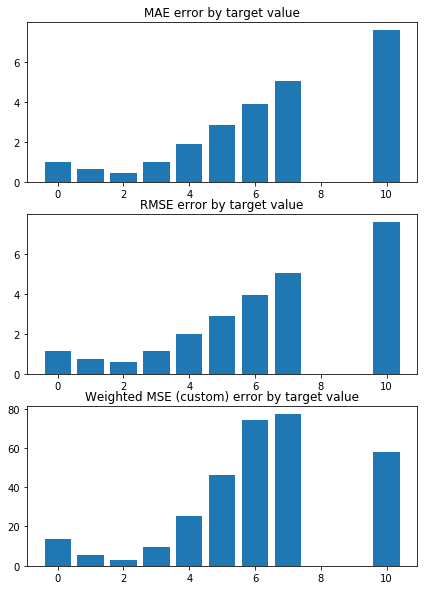

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9732580552723598 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9585586016258432 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


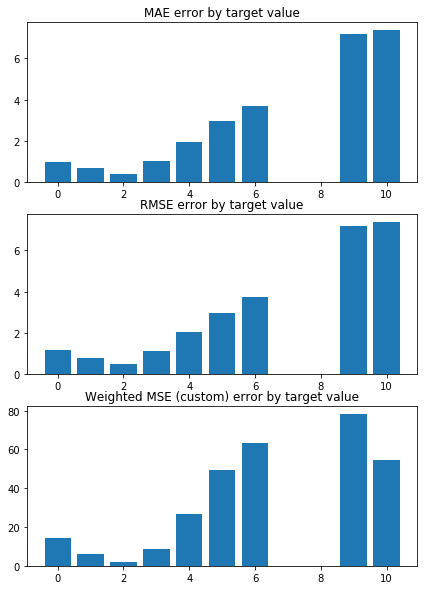

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9423902617288814 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9608771160251665 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


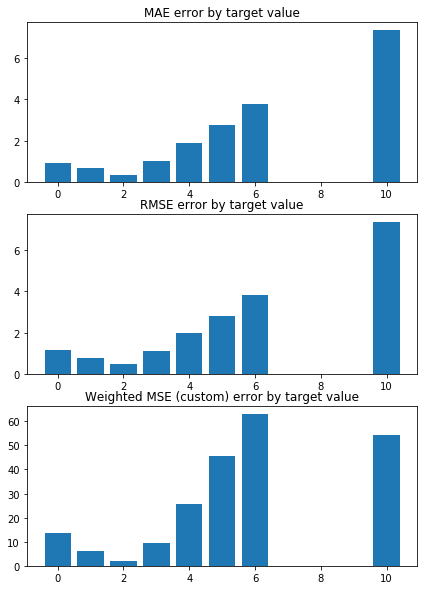

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0458182836186065 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9472559702806155 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


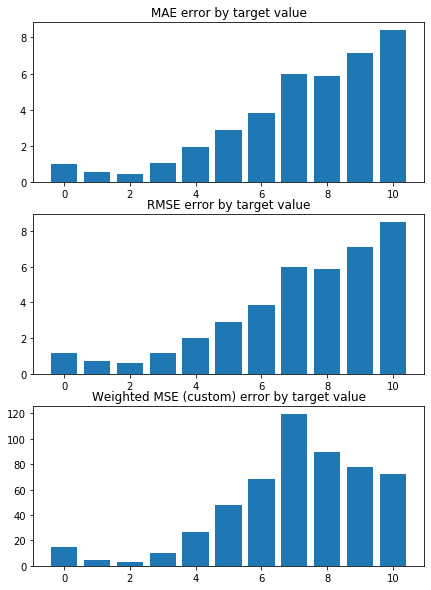

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8370414763926196 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9754703223499853 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


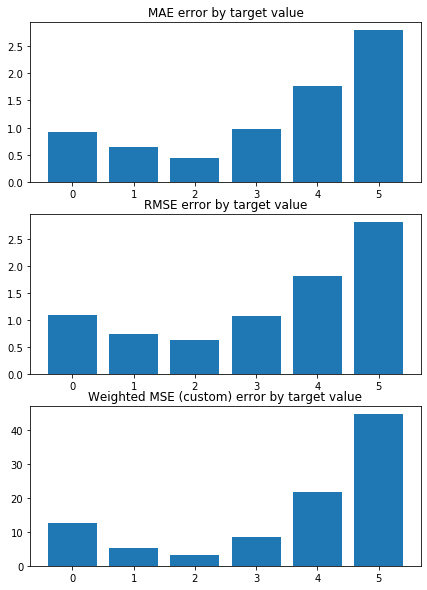

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760959669485137 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5799505225078085 

Root of MSE on Test: 0.98 
 1.2569608277539155 

Variance score on Test: 0.07 
 r2_test: 0.2692733453236471 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.603553 -0.190859 -0.077489 -0.034942  0.014066
1 -0.604626 -0.210098 -0.069253 -0.046491  0.008153
2 -0.604998 -0.203594 -0.092138 -0.043806  0.010031
3 -0.612457 -0.199715 -0.066977 -0.049916  0.017789
4 -0.591511 -0.207637 -0.080485 -0.046375  0.023231
5 -0.598240 -0.199599 -0.070764 -0.038835  0.026000
6 -0.601942 -0.219148 -0.074870 -0.045163 -0.001364
7 -0.606724 -0.200902 -0.078817 -0.041809  0.012743
8 -0.602110 -0.207291 -0.077880 -0.039085  0.016975
9 -0.594087 -0.206528 -0.087640 -0.049702  0.020212


,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,1.579956,0.280739,1.576095,0.03122,-,"Ridge(alpha=0, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3295722263665575, 0.29554928362975974, 0.21...",0.960805,0.069392,0.958604,0.008517
1,1.579955,0.280735,1.576095,0.03122,-,"Ridge(alpha=1, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.32956846351856783, 0.2955533490699265, 0.21...",0.960790,0.069391,0.958590,0.008516
2,1.579955,0.280731,1.576095,0.03122,-,"Ridge(alpha=2, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3295646835750625, 0.29555739413092774, 0.21...",0.960776,0.069389,0.958576,0.008516
3,1.579954,0.280727,1.576095,0.03122,-,"Ridge(alpha=3, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3295608865696147, 0.29556141884826725, 0.21...",0.960762,0.069387,0.958562,0.008516
4,1.579953,0.280724,1.576095,0.03122,-,"Ridge(alpha=4, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.32955707253572064, 0.29556542325737123, 0.2...",0.960747,0.069385,0.958548,0.008516
5,1.579953,0.280720,1.576095,0.03122,-,"Ridge(alpha=5, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3295532415067993, 0.2955694073935867, 0.215...",0.960733,0.069384,0.958534,0.008516
6,1.579952,0.280716,1.576095,0.03122,-,"Ridge(alpha=6, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.32954939351619306, 0.2955733712921831, 0.21...",0.960719,0.069382,0.958521,0.008516
7,1.579952,0.280712,1.576095,0.03122,-,"Ridge(alpha=7, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3295455285971678, 0.2955773149883518, 0.215...",0.960705,0.069380,0.958507,0.008516
8,1.579951,0.280708,1.576096,0.03122,-,"Ridge(alpha=8, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.32954164678291276, 0.29558123851720675, 0.2...",0.960690,0.069378,0.958493,0.008516
9,1.579951,0.280704,1.576096,0.03122,-,"Ridge(alpha=9, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.32953774810654124, 0.29558514191378404, 0.2...",0.960676,0.069377,0.958480,0.008516


In [96]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 10, 1)
# Create linear regression object



model_name = 'LR+L2_grid10'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

results_pd_gr = pd.DataFrame()

for alpha in alpha_grid:
    model = linear_model.Ridge(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    results_pd_gr = train_test_KFold(X, y, 
                                                  model, model_name, results_pd_gr,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)

    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))

results_pd_gr

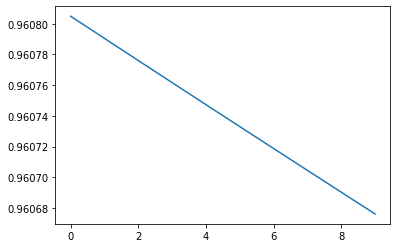

In [97]:
plt.plot(alpha_grid, wmse_test)

In [98]:
wmse_test

[0.9608049003295825,
 0.9607904580500224,
 0.960776050212108,
 0.9607616767578457,
 0.9607473376293694,
 0.9607330327689411,
 0.9607187621189495,
 0.9607045256219106,
 0.9606903232204669,
 0.9606761548573873]

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9490360389387902 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9575691324672377 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


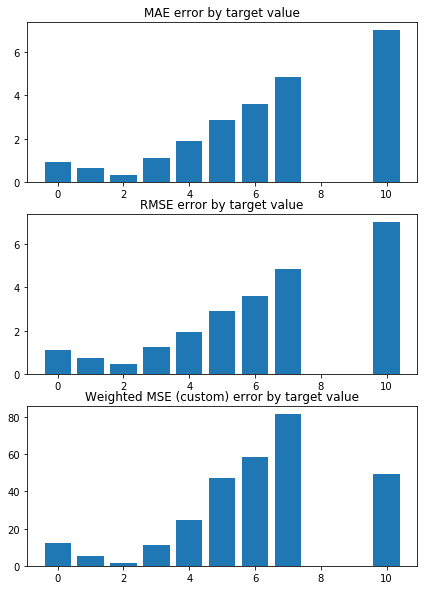

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8426760099435792 


 TRAIN PREDICTION Error
weighted_mse_train: 0.967437125803616 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


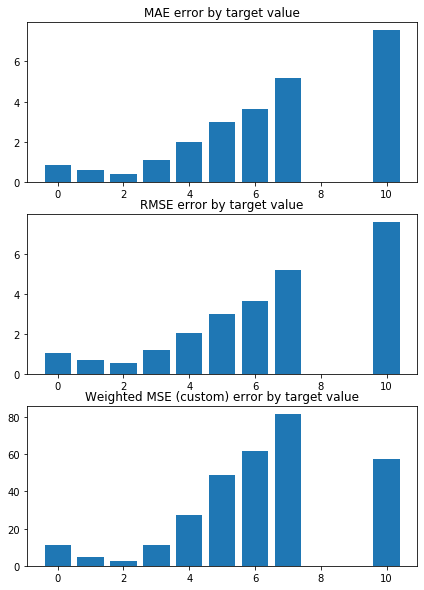

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0241859324704954 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9492767006056433 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


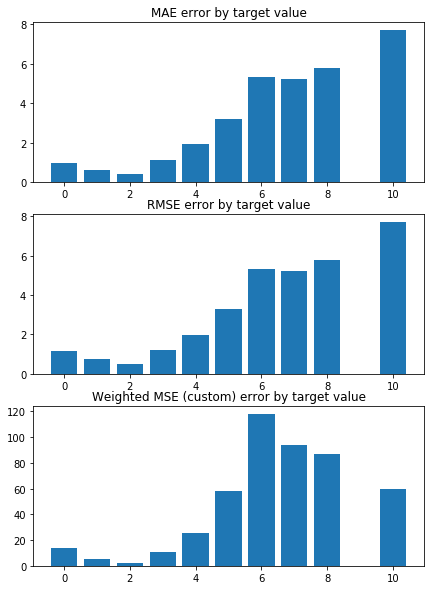

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9600610261297304 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9520673409946755 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


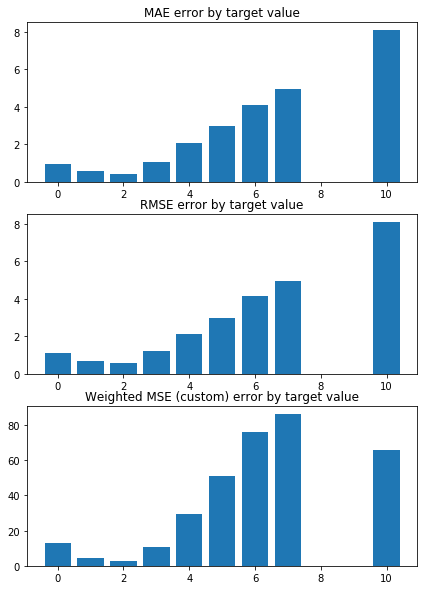

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0428311475465561 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9456106868348514 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


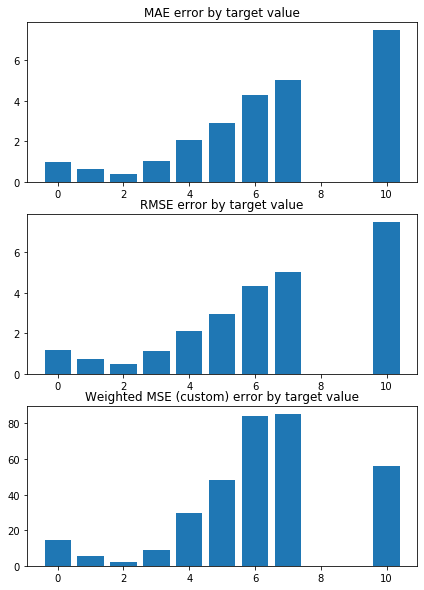

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9670027336016265 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9541055436214034 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


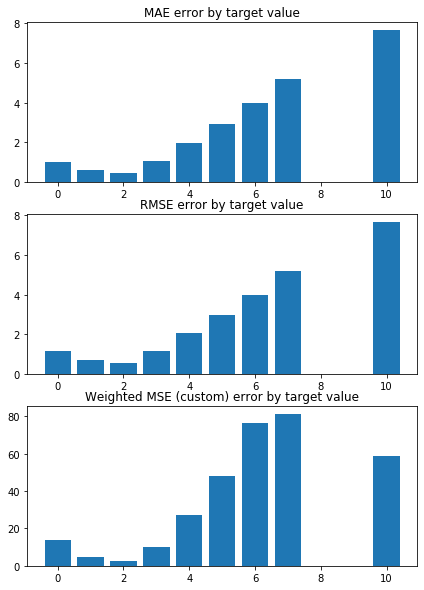

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9635400795341222 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9556963106166834 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


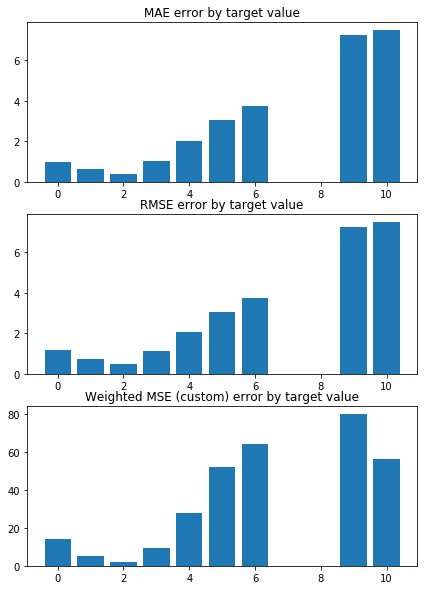

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9345746347300888 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9580247503392776 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


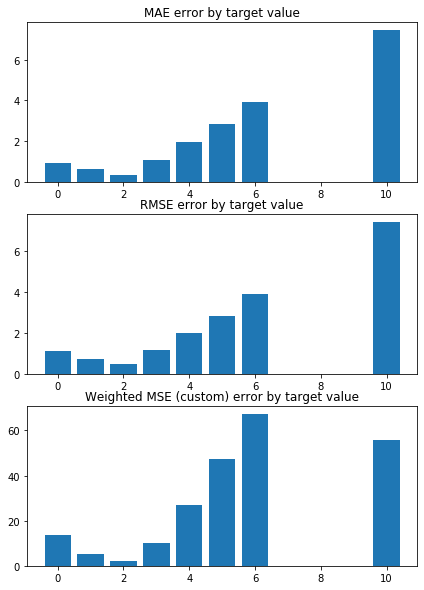

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0454646895950046 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9436631848950426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


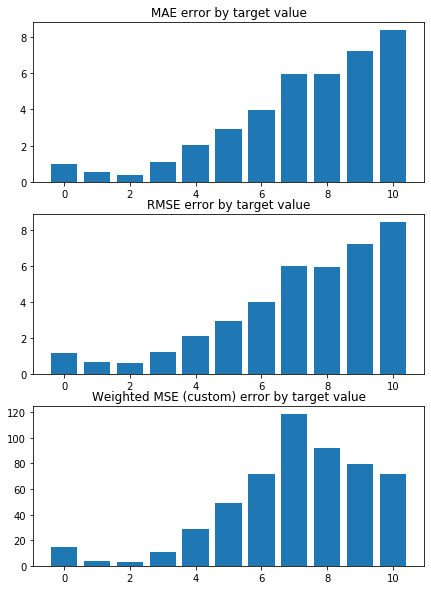

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8442844255840588 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9720650608815403 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


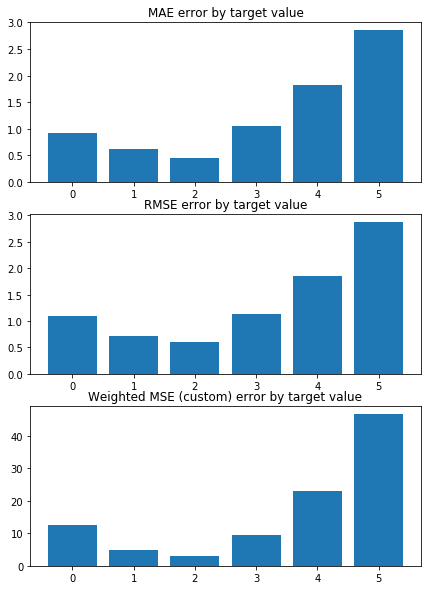

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5857071246205083 

Mean squared error on Test: 0.96 
 MSE mean test:  1.5889757463148773 

Root of MSE on Test: 0.98 
 1.260545812858413 

Variance score on Test: 0.07 
 r2_test: 0.26489206829965084 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.59
MSE_test 1.59
MAE_train 0.92
MAE_test 0.84
r2_test 0.26
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.491633 -0.204069 -0.086389  0.038604 -0.010939
1 -0.492328 -0.219072 -0.080052  0.034433 -0.020059
2 -0.494109 -0.214038 -0.099273  0.035224 -0.018620
3 -0.499275 -0.211486 -0.078090  0.043040 -0.023018
4 -0.484625 -0.215477 -0.089001  0.046555 -0.020961
5 -0.488934 -0.210260 -0.081211  0.048929 -0.014193
6 -0.491487 -0.226090 -0.084624  0.026594 -0.018985
7 -0.494310 -0.212286 -0.087878  0.038010 -0.016676
8 -0.491706 -0.217475 -0.086977  0.041699 -0.014452
9 -0.486267 -0.215471 -0.095283  0.043891 -0.024063
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


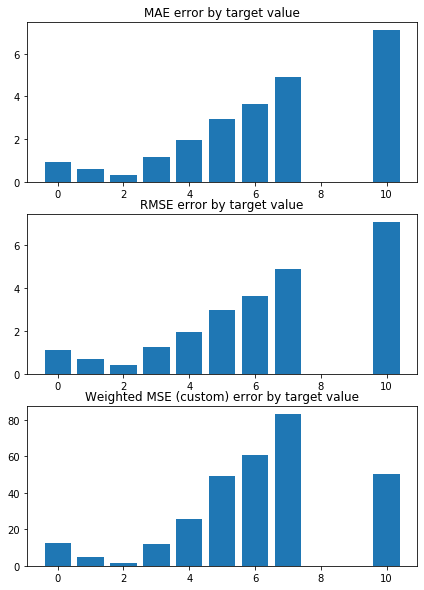

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8483123475221663 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9748139602612711 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


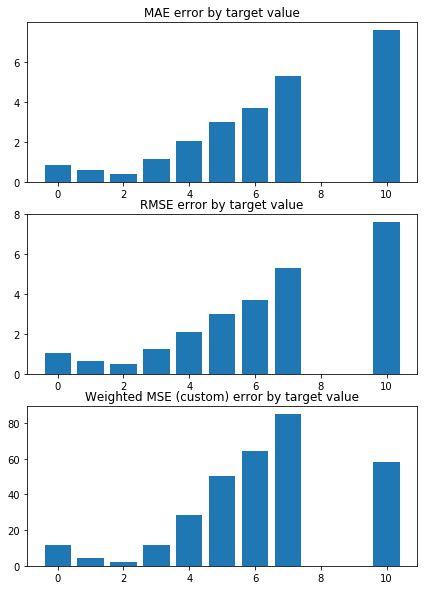

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0228027494040453 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9567201275566052 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


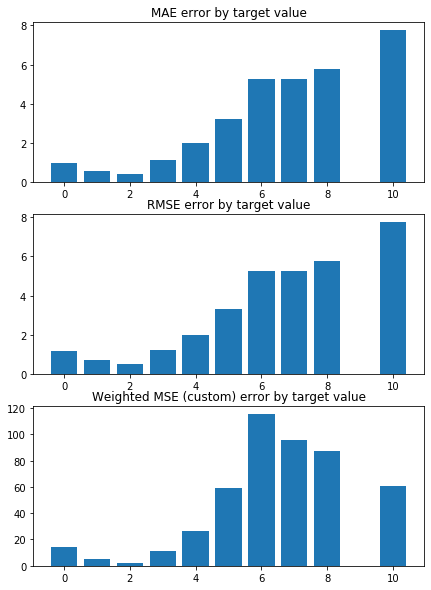

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9640035254581836 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9590055723499092 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


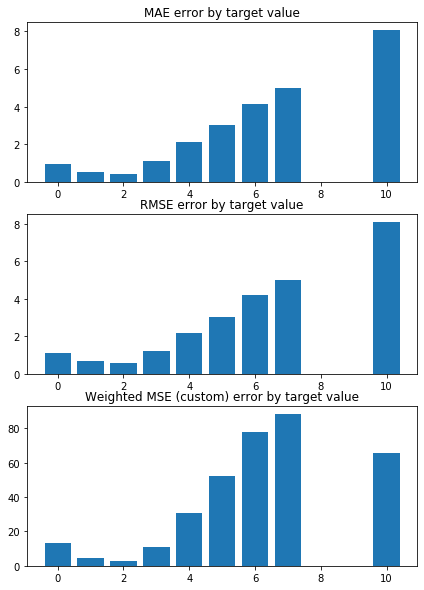

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.051859188811091 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9527072578644561 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


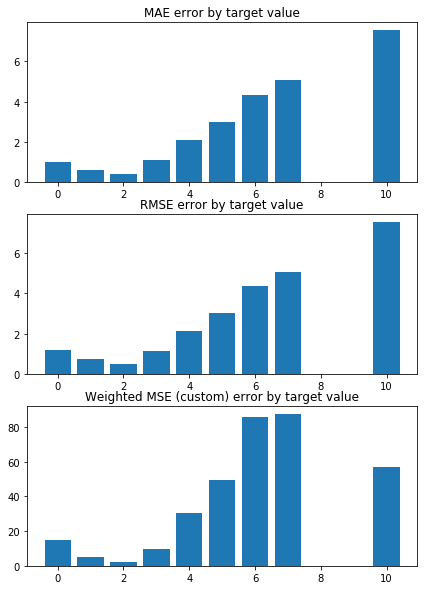

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9773850810062501 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9611926011269868 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


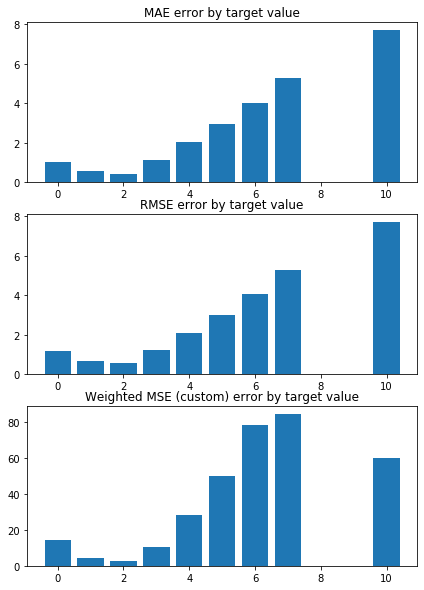

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9656907728238943 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9629885774373794 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


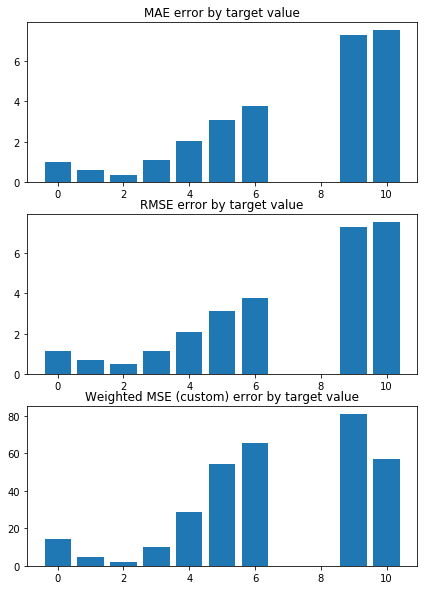

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9395682785785798 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9652741885509196 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


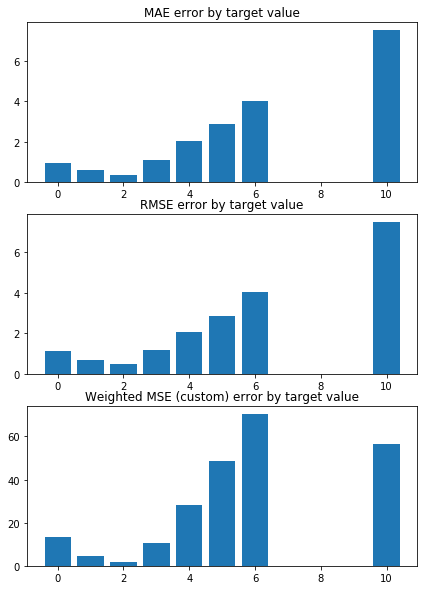

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0534967718033152 


 TRAIN PREDICTION Error
weighted_mse_train: 0.950214484353183 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


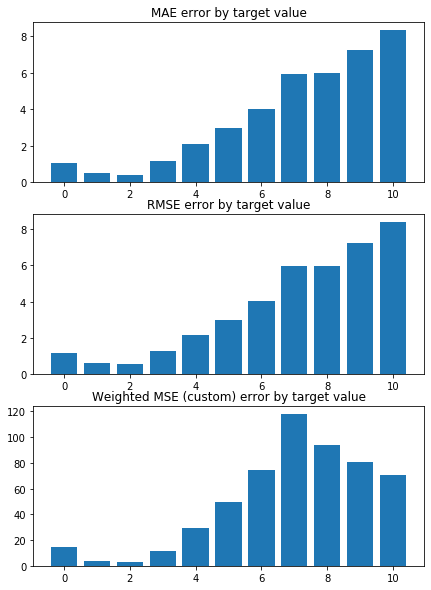

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8572145821737519 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9786136280906177 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


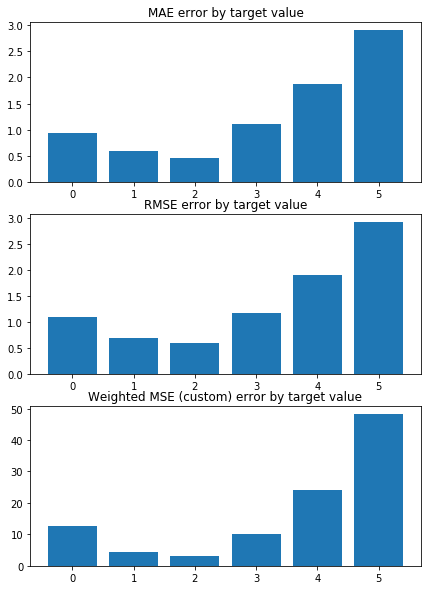

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.6032828004284412 

Mean squared error on Test: 0.96 
 MSE mean test:  1.6061626104945 

Root of MSE on Test: 0.98 
 1.267344708630805 

Variance score on Test: 0.07 
 r2_test: 0.2566884787853813 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.6
MSE_test 1.61
MAE_train 0.92
MAE_test 0.85
r2_test 0.26
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.421793 -0.201136 -0.087640  0.049178  0.001708
1 -0.422253 -0.213425 -0.082442  0.046053 -0.005892
2 -0.424544 -0.209462 -0.098979  0.046348 -0.004955
3 -0.428558 -0.207648 -0.080814  0.053855 -0.008453
4 -0.417208 -0.209667 -0.089923  0.056298 -0.007126
5 -0.420385 -0.206123 -0.083447  0.058256 -0.000966
6 -0.422267 -0.219201 -0.086424  0.039401 -0.004879
7 -0.424162 -0.208042 -0.089027  0.049053 -0.003262
8 -0.422650 -0.212584 -0.088393  0.052334 -0.001296
9 -0.418511 -0.209906 -0.095619  0.054016 -0.009969
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


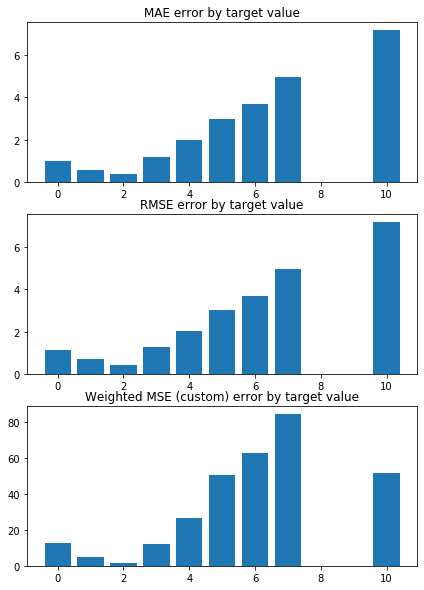

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8588333674523791 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9856911588943249 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


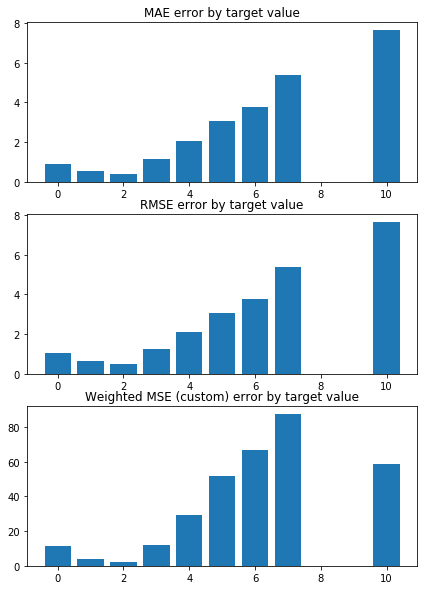

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0271463766349003 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9676707521693119 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


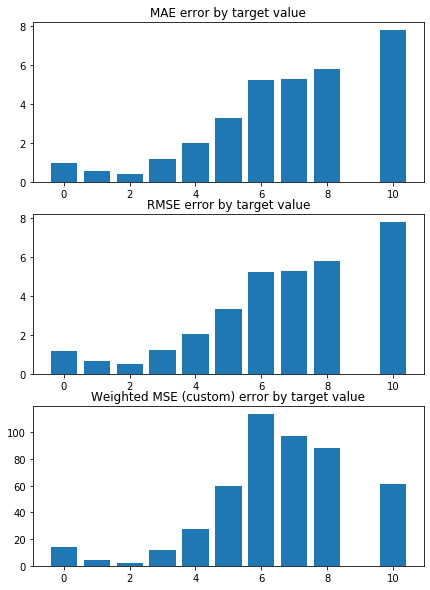

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9721431025314208 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9696034318842677 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


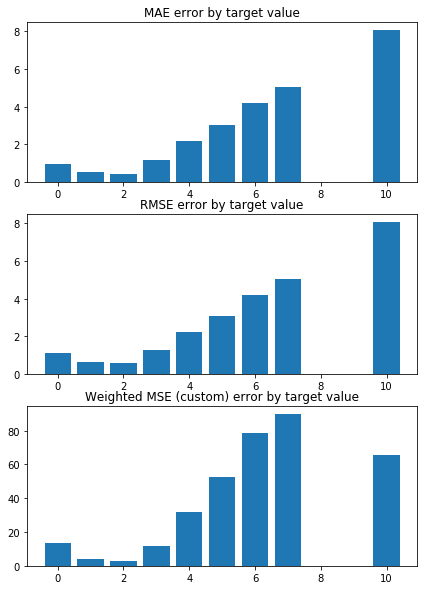

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0635231495266313 


 TRAIN PREDICTION Error
weighted_mse_train: 0.963260733399942 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


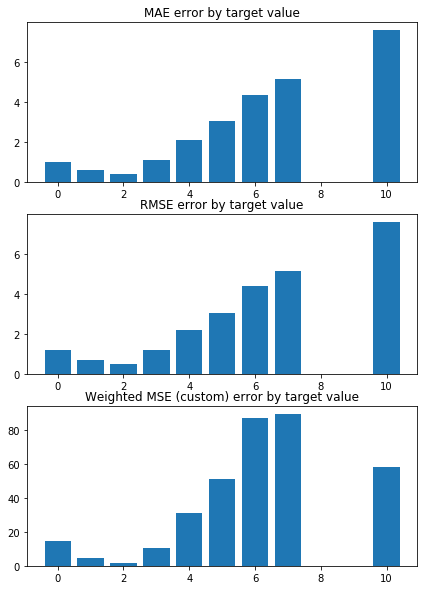

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9899851281177472 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9717049626409664 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


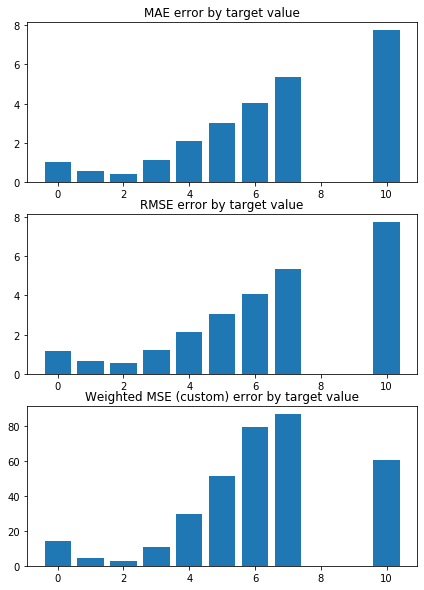

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9726699966912576 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9738592210637567 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


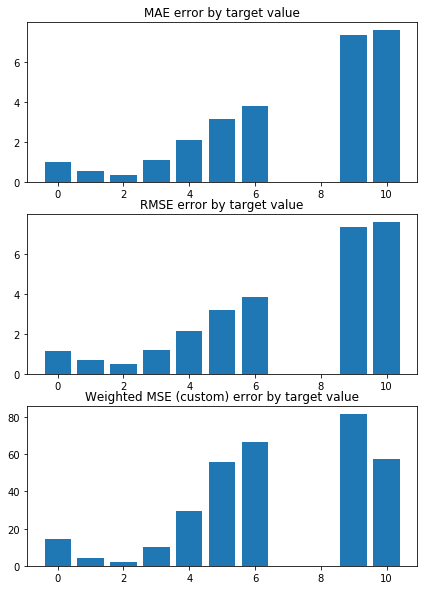

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9492651667420771 


 TRAIN PREDICTION Error
weighted_mse_train: 0.976047270974965 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


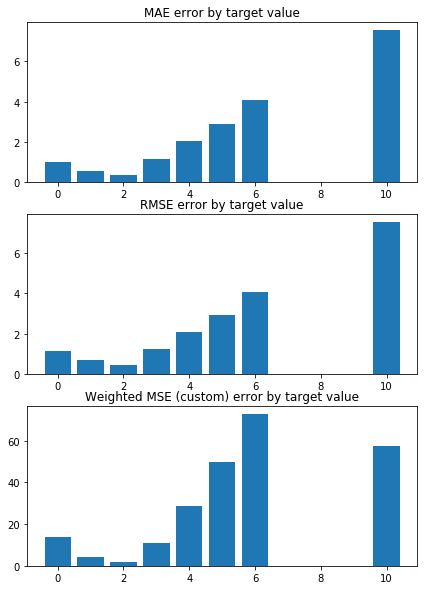

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0642656666940227 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9604239890513365 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


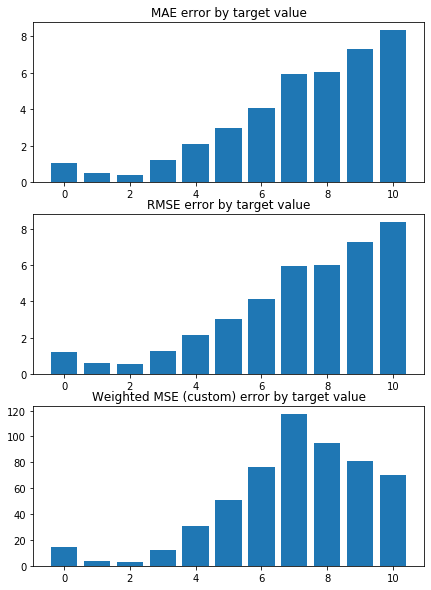

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8718127892130121 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9888045757113471 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


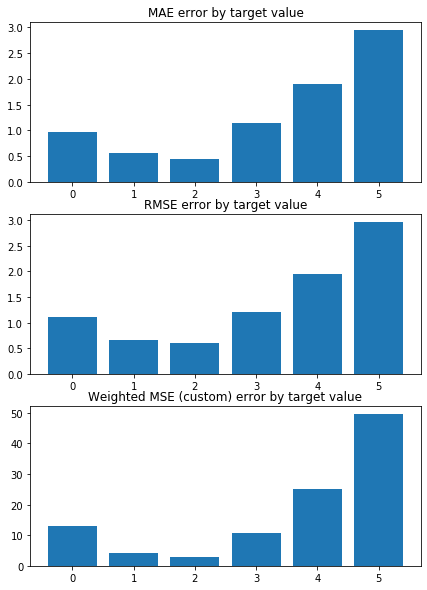

Weighted Mean squared error on Train: 0.97 
 MSE mean train: 1.622849922238211 

Mean squared error on Test: 0.97 
 MSE mean test:  1.6254512066919673 

Root of MSE on Test: 0.99 
 1.2749318439398898 

Variance score on Test: 0.07 
 r2_test: 0.24750595611126958 

wMSE_train 0.97
wMSE_test 0.97
MSE_train 1.62
MSE_test 1.63
MAE_train 0.93
MAE_test 0.86
r2_test 0.25
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.372637 -0.193354 -0.085947  0.053709  0.008882
1 -0.372930 -0.203763 -0.081506  0.051261  0.002323
2 -0.375414 -0.200563 -0.096011  0.051302  0.003043
3 -0.378755 -0.199225 -0.080166  0.058410  0.000085
4 -0.369413 -0.200116 -0.087954  0.060181  0.001006
5 -0.371976 -0.197652 -0.082438  0.061800  0.006682
6 -0.373391 -0.208706 -0.085091  0.045476  0.003311
7 -0.374768 -0.199300 -0.087175  0.053885  0.004476
8 -0.373928 -0.203430 -0.086814  0.056845  0.006270
9 -0.370541 -0.200391 -0.093199  0.058224 -0.001609
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


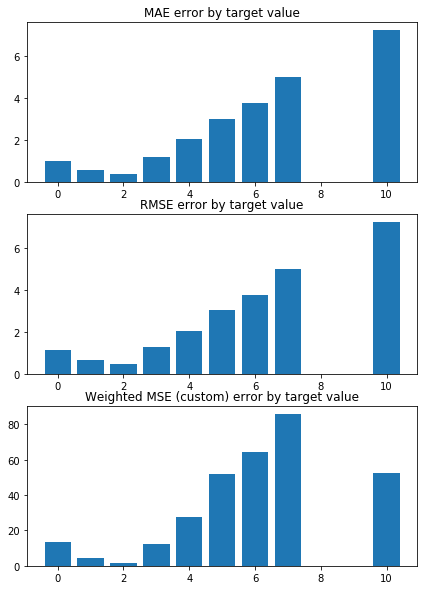

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8713621358515297 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9978998626467059 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


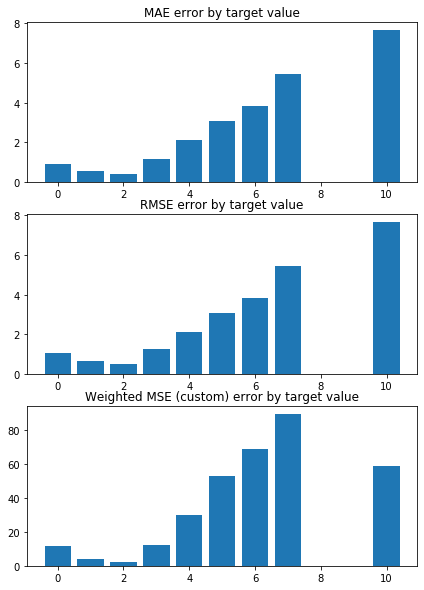

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0342957883090154 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9799867399086122 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


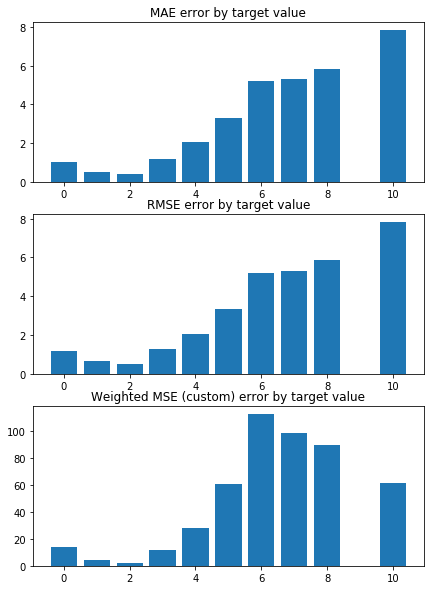

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9820072058213701 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9816296292793979 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


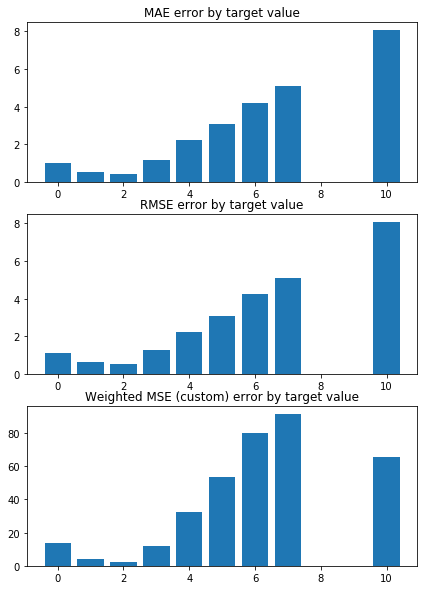

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.076204363760593 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9751882033831959 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


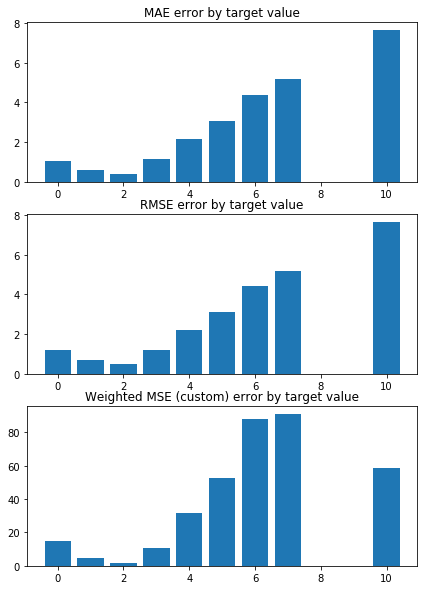

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0031777313823416 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9835704488765454 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


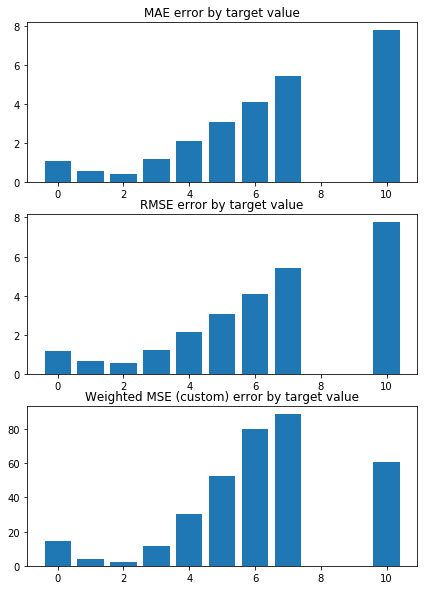

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9819097253414448 


 TRAIN PREDICTION Error
weighted_mse_train: 0.986117292946494 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


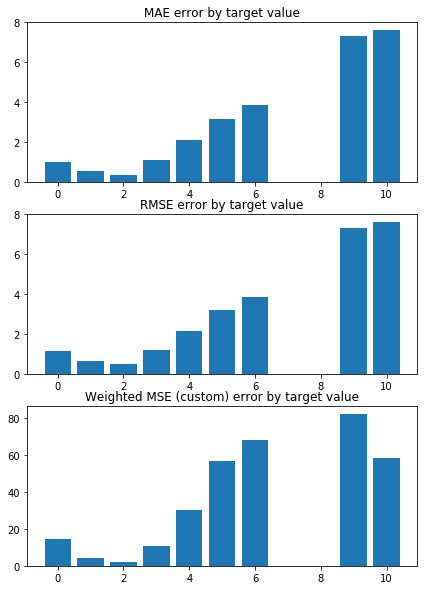

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9609373195184255 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9881831906115327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


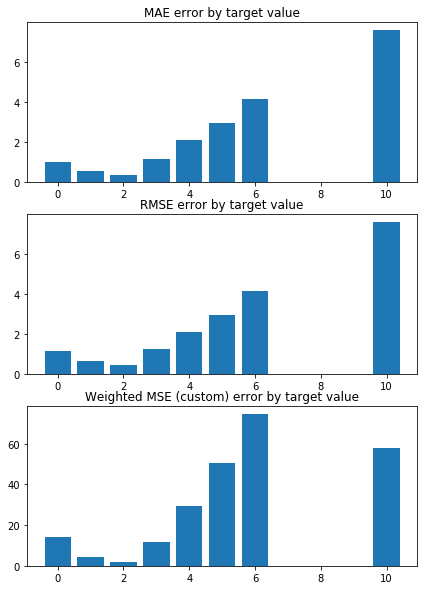

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.075998736685755 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9721211265556142 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


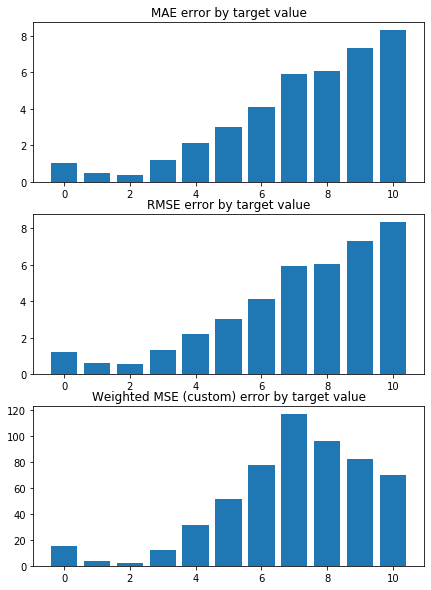

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8868220446489533 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0004780930391959 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


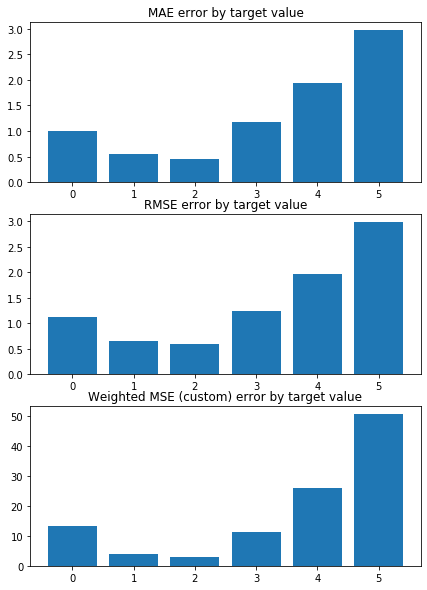

Weighted Mean squared error on Train: 0.99 
 MSE mean train: 1.6426598098356493 

Mean squared error on Test: 0.99 
 MSE mean test:  1.6450506671310265 

Root of MSE on Test: 0.99 
 1.2825952857901148 

Variance score on Test: 0.07 
 r2_test: 0.23818443045471138 

wMSE_train 0.99
wMSE_test 0.99
MSE_train 1.64
MSE_test 1.65
MAE_train 0.94
MAE_test 0.88
r2_test 0.24
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.335375 -0.184237 -0.083083  0.055320  0.013142
1 -0.335543 -0.193262 -0.079186  0.053338  0.007346
2 -0.338084 -0.190620 -0.092102  0.053239  0.007969
3 -0.340987 -0.189618 -0.078083  0.059944  0.005371
4 -0.332995 -0.189805 -0.084863  0.061260  0.006045
5 -0.335187 -0.188084 -0.080079  0.062616  0.011321
6 -0.336255 -0.197603 -0.082473  0.048216  0.008313
7 -0.337310 -0.189451 -0.084154  0.055693  0.009174
8 -0.336914 -0.193284 -0.084024  0.058394  0.010836
9 -0.334011 -0.190059 -0.089736  0.059568  0.003625
KFold(n_splits=10, random_state=16, shuffle=True)
train_index

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


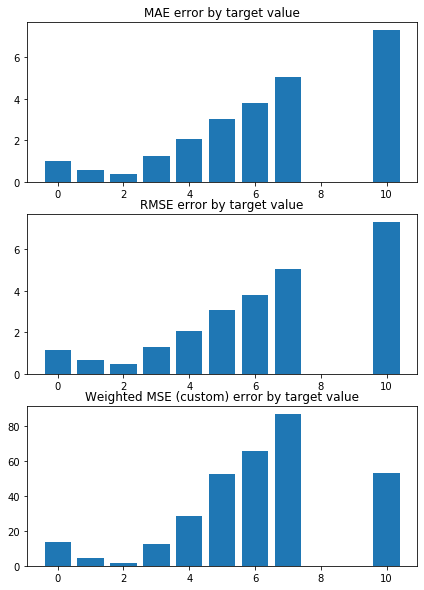

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8846277540397446 


 TRAIN PREDICTION Error
weighted_mse_train: 1.010495617483564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


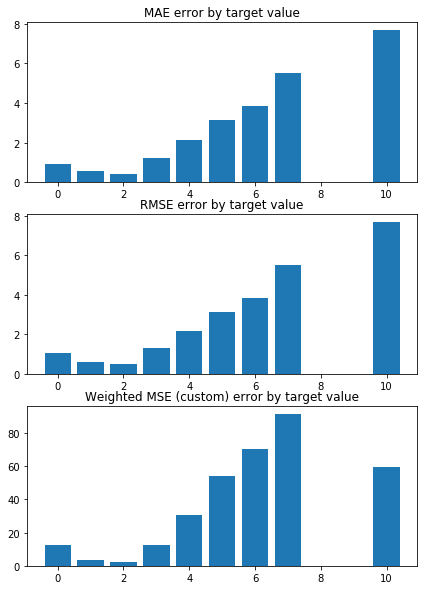

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0428669930820043 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9927191537948516 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


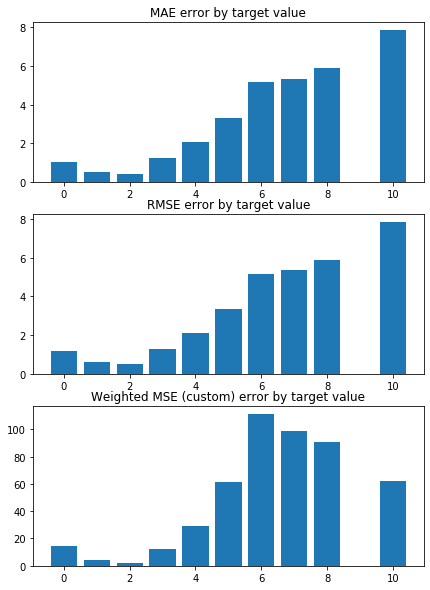

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9925277025499991 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9941127993776347 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


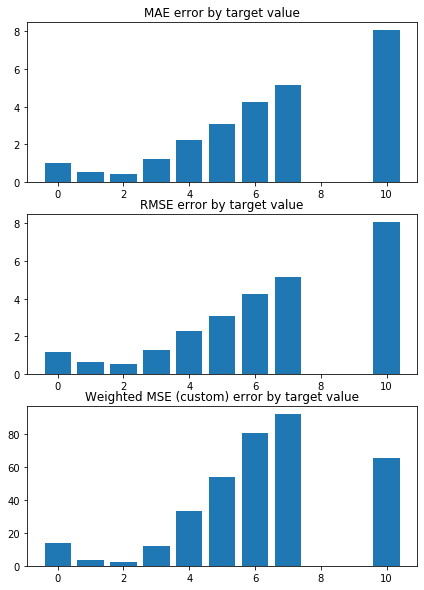

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0891450525438313 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9875547113765895 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


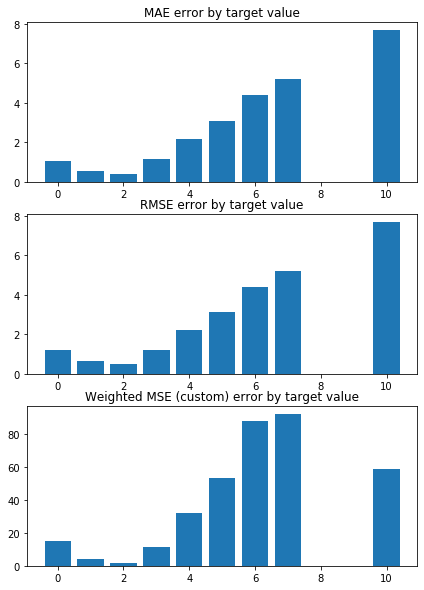

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0162999908003847 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9958710743784068 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


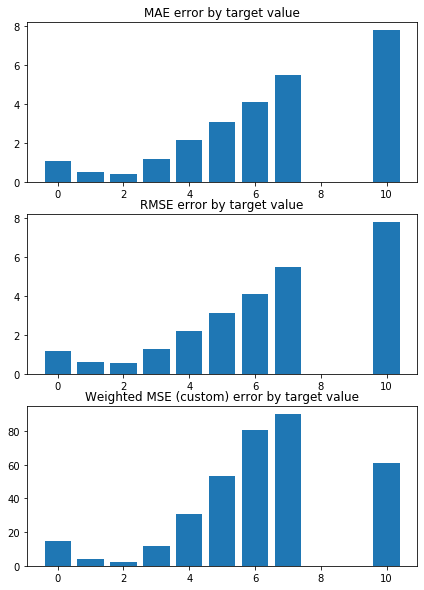

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9921974882832718 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9987979169301672 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


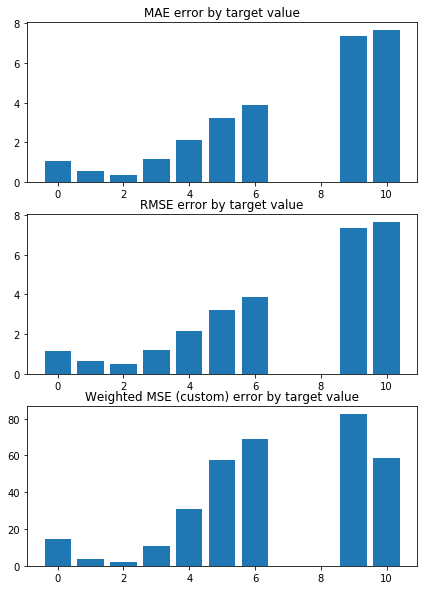

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9733750550369841 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0007336693628144 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


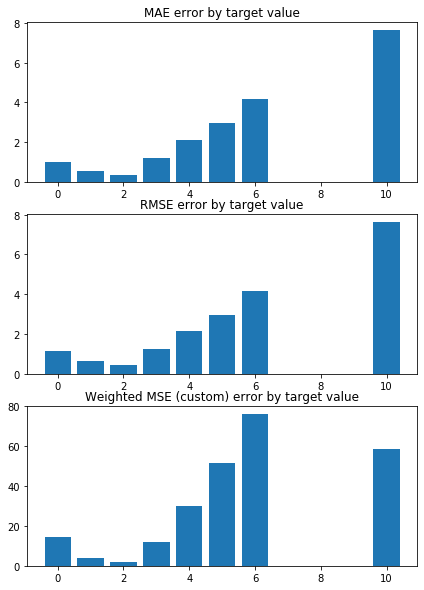

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0879383728976935 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9843362377924535 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


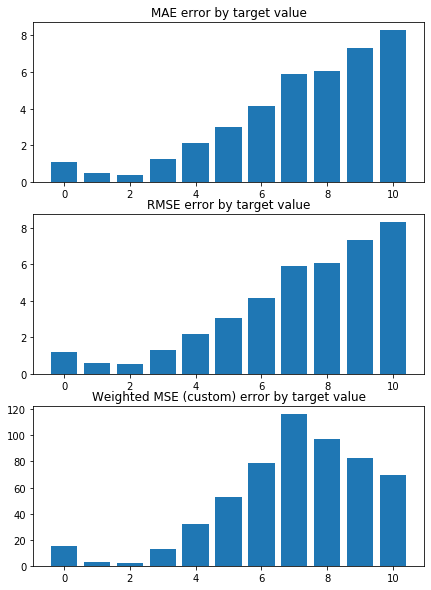

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.901678240532792 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0126603423401954 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


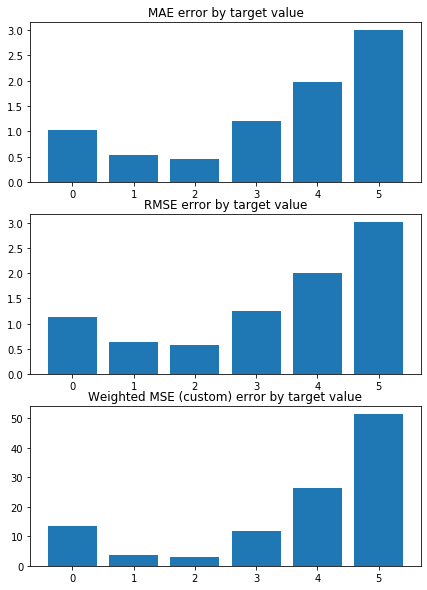

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 1.6620126041201764 

Mean squared error on Test: 1.00 
 MSE mean test:  1.6642383614590084 

Root of MSE on Test: 1.00 
 1.2900536273577965 

Variance score on Test: 0.06 
 r2_test: 0.2290630767206681 

wMSE_train 1.0
wMSE_test 1.0
MSE_train 1.66
MSE_test 1.66
MAE_train 0.95
MAE_test 0.89
r2_test 0.23
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.305775 -0.175044 -0.079798  0.055415  0.015723
1 -0.305847 -0.183005 -0.076312  0.053770  0.010514
2 -0.308380 -0.180785 -0.087950  0.053589  0.011093
3 -0.310976 -0.180029 -0.075402  0.059915  0.008755
4 -0.303957 -0.179755 -0.081388  0.060907  0.009267
5 -0.305903 -0.178567 -0.077181  0.062057  0.014206
6 -0.306705 -0.186889 -0.079360  0.049169  0.011457
7 -0.307544 -0.179682 -0.080727  0.055919  0.012106
8 -0.307457 -0.183284 -0.080783  0.058405  0.013661
9 -0.304891 -0.179974 -0.085945  0.059429  0.007015
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


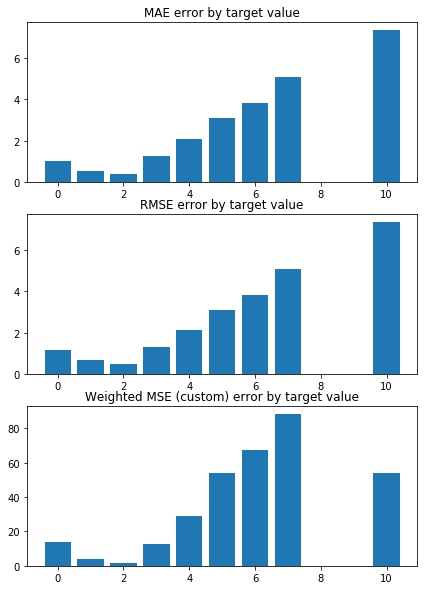

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8979888732863067 


 TRAIN PREDICTION Error
weighted_mse_train: 1.023005614987895 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


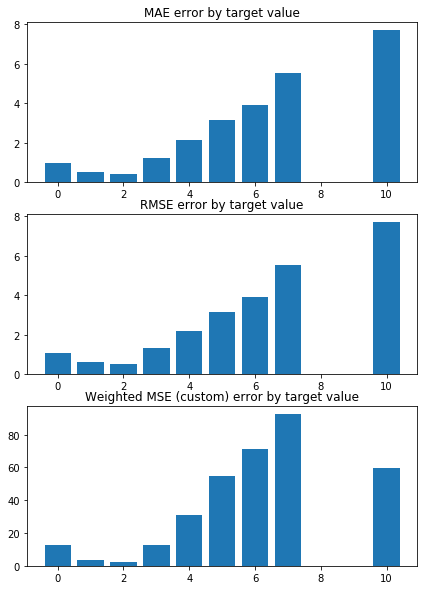

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0521085508474242 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0053863703285648 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


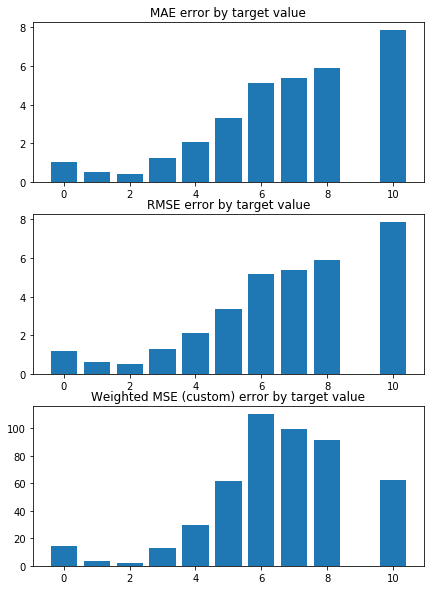

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.003170598302181 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0065637759670634 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


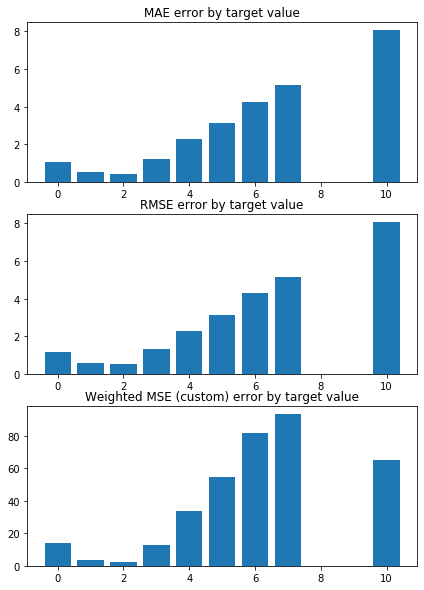

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1019441182138363 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9998814729141398 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


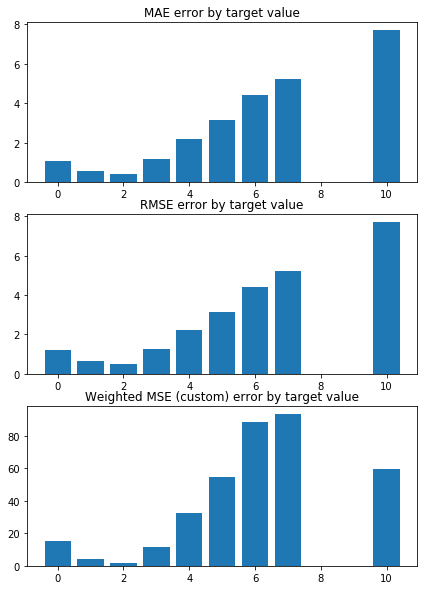

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.029042476675058 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0081381407010443 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


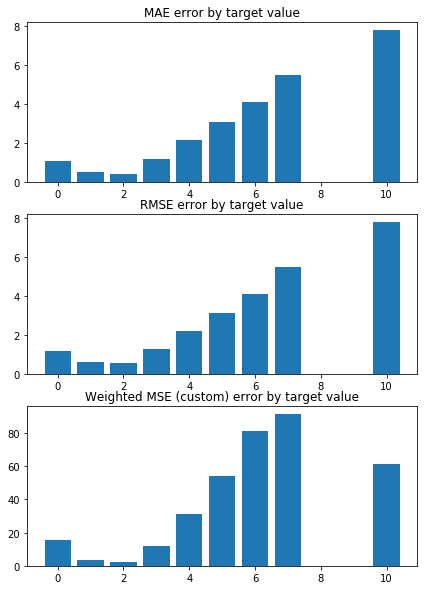

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0028814314865089 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0114144510545535 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


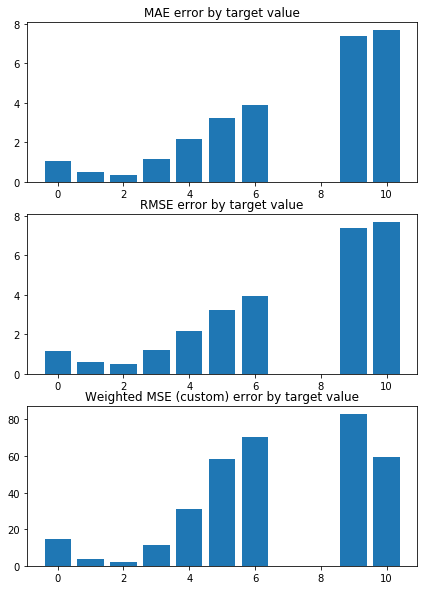

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9859604465121051 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0132201164090189 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


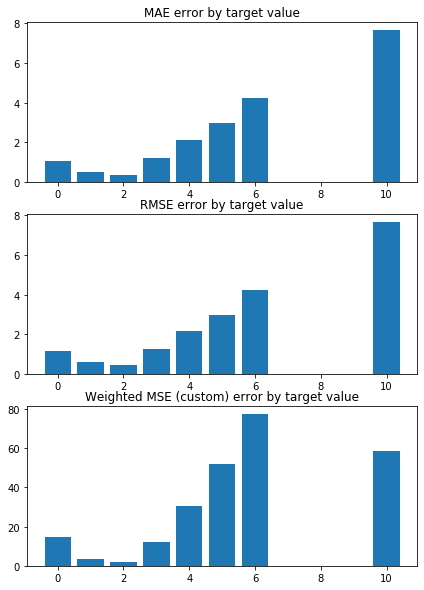

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0997091954000393 


 TRAIN PREDICTION Error
weighted_mse_train: 0.996570517369364 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


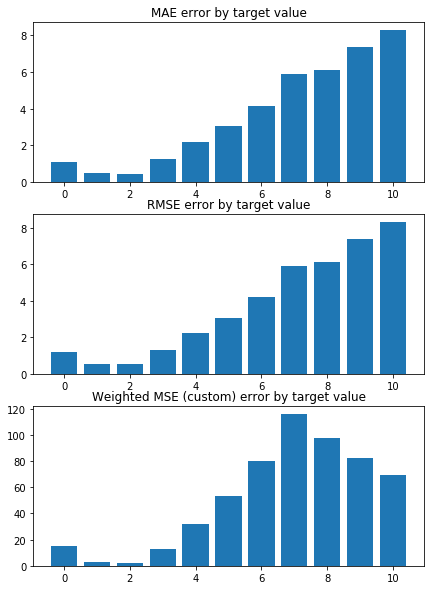

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9160941374888432 


 TRAIN PREDICTION Error
weighted_mse_train: 1.024850173878141 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


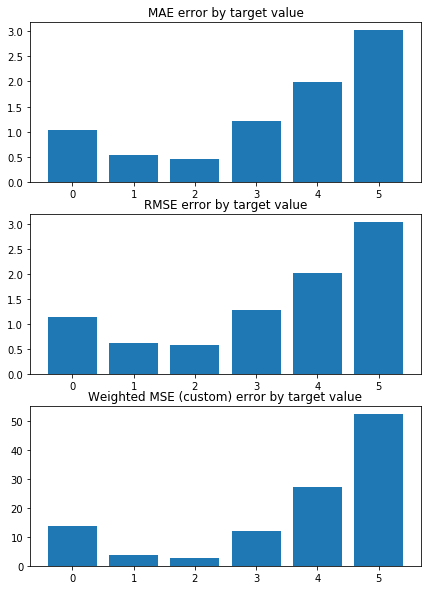

Weighted Mean squared error on Train: 1.01 
 MSE mean train: 1.6805938984617093 

Mean squared error on Test: 1.01 
 MSE mean test:  1.6826863243411758 

Root of MSE on Test: 1.01 
 1.2971839978743092 

Variance score on Test: 0.06 
 r2_test: 0.22029582103881123 

wMSE_train 1.01
wMSE_test 1.01
MSE_train 1.68
MSE_test 1.68
MAE_train 0.96
MAE_test 0.9
r2_test 0.22
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.281495 -0.166250 -0.076430  0.054695  0.017279
1 -0.281493 -0.173370 -0.073268  0.053302  0.012538
2 -0.283986 -0.171476 -0.083859  0.053073  0.013099
3 -0.286352 -0.170908 -0.072515  0.059049  0.010959
4 -0.280069 -0.170320 -0.077862  0.059801  0.011361
5 -0.281843 -0.169526 -0.074120  0.060790  0.016008
6 -0.282437 -0.176892 -0.076118  0.049123  0.013457
7 -0.283122 -0.170426 -0.077237  0.055285  0.013952
8 -0.283257 -0.173835 -0.077440  0.057591  0.015416
9 -0.280939 -0.170504 -0.082144  0.058499  0.009254
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


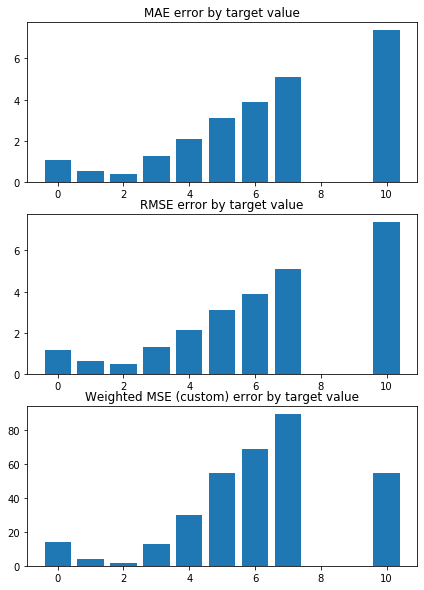

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9111033386693976 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0351808949041479 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


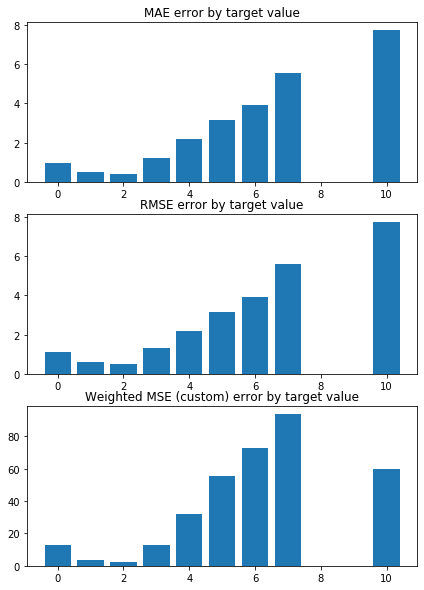

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.061584745015267 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0177316797472018 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


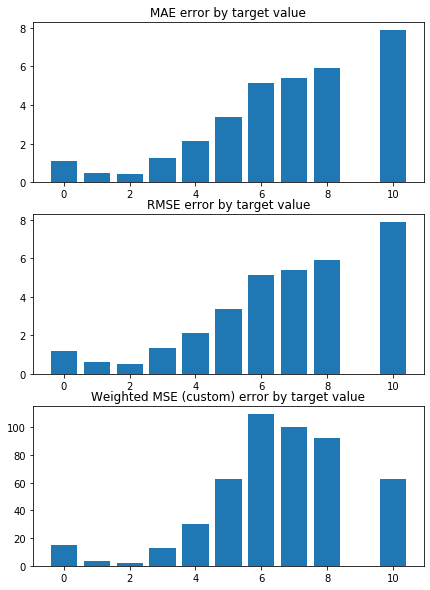

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0136507488372757 


 TRAIN PREDICTION Error
weighted_mse_train: 1.018721747182215 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


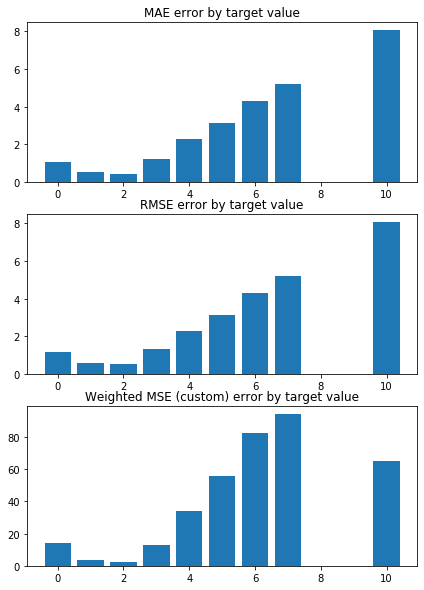

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1143820385682535 


 TRAIN PREDICTION Error
weighted_mse_train: 1.011911278282371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


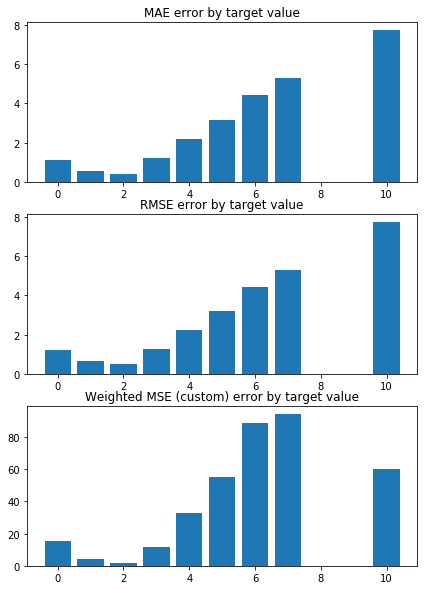

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0412572321958389 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0201191085106955 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


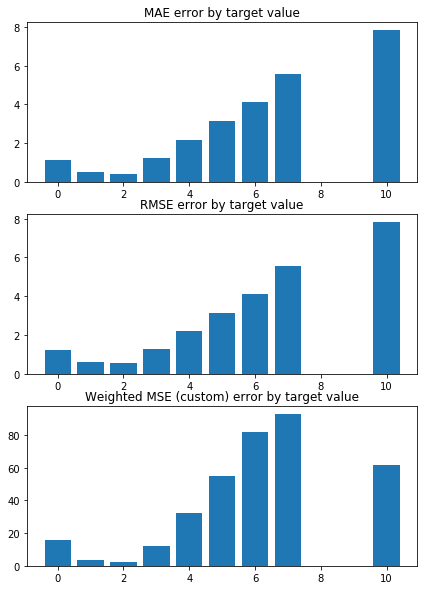

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0135901736033697 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0237089134462891 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


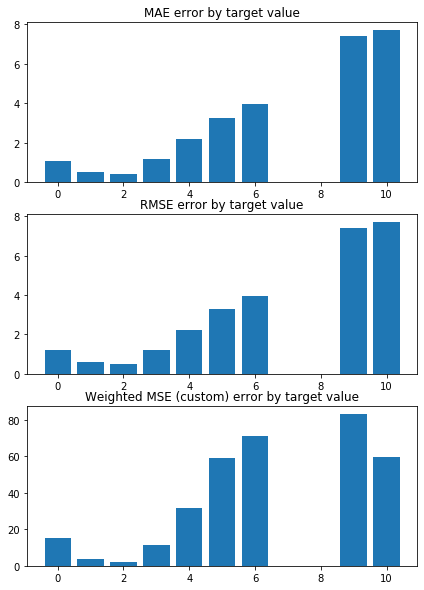

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9983582334754054 


 TRAIN PREDICTION Error
weighted_mse_train: 1.025388342313689 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


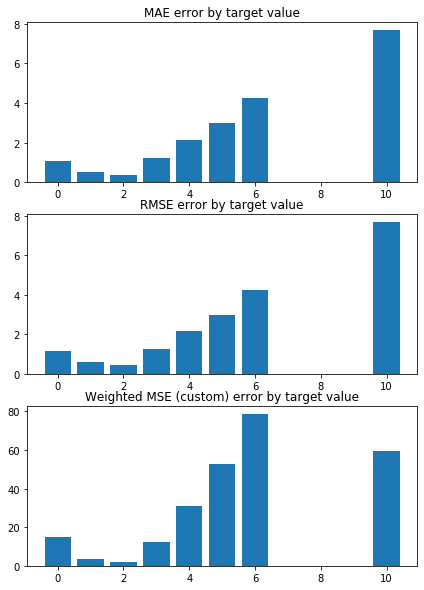

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1111158099959486 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0085528603080125 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


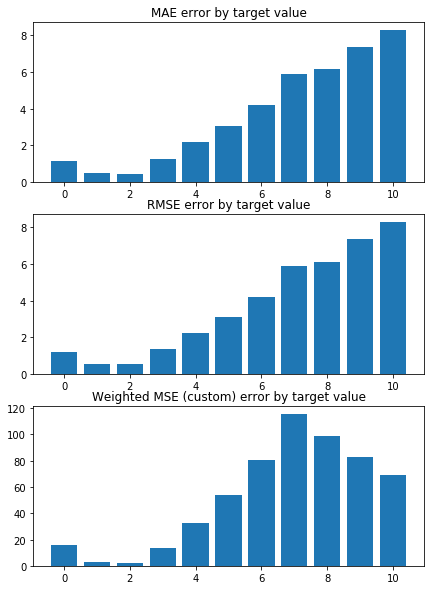

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9299226337069043 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0367764825689232 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


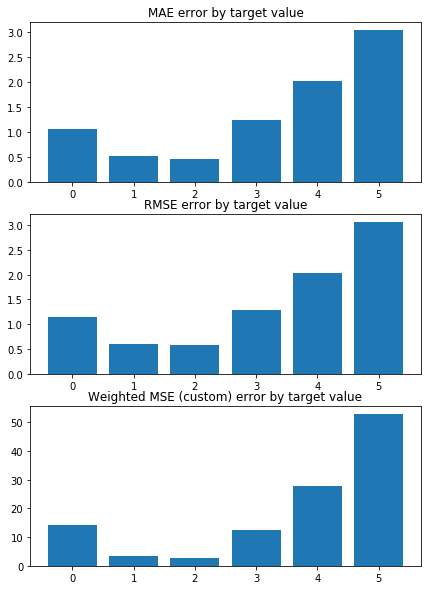

Weighted Mean squared error on Train: 1.02 
 MSE mean train: 1.698266499890255 

Mean squared error on Test: 1.02 
 MSE mean test:  1.7002487480002848 

Root of MSE on Test: 1.01 
 1.3039358680549764 

Variance score on Test: 0.06 
 r2_test: 0.21195095090283428 

wMSE_train 1.02
wMSE_test 1.02
MSE_train 1.7
MSE_test 1.7
MAE_train 0.97
MAE_test 0.91
r2_test 0.21
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.261109 -0.158027 -0.073140  0.053535  0.018187
1 -0.261048 -0.164462 -0.070240  0.052335  0.013829
2 -0.263483 -0.162826 -0.079956  0.052078  0.014382
3 -0.265671 -0.162404 -0.069616  0.057737  0.012401
4 -0.259967 -0.161599 -0.074438  0.058307  0.012724
5 -0.261612 -0.161103 -0.071077  0.059166  0.017116
6 -0.262040 -0.167691 -0.072921  0.048506  0.014721
7 -0.262612 -0.161821 -0.073843  0.054181  0.015104
8 -0.262909 -0.165066 -0.074160  0.056333  0.016489
9 -0.260783 -0.161751 -0.078477  0.057149  0.010743
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


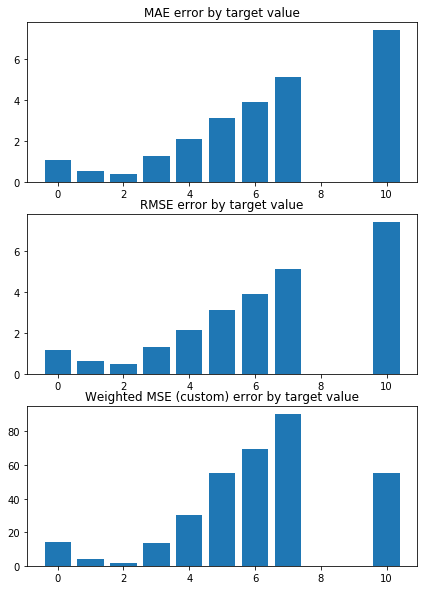

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9237876977541937 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0468917200203491 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


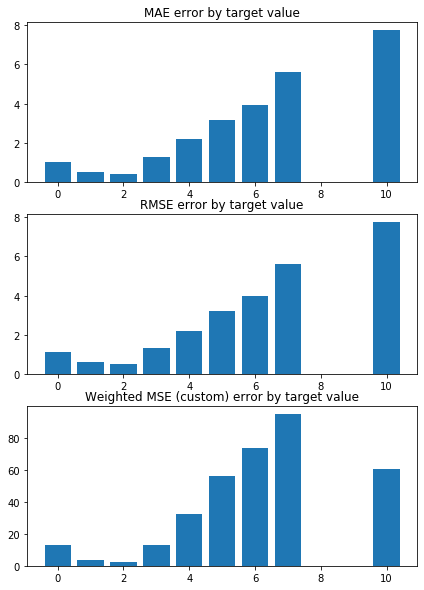

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0710354593899256 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0296194582116787 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


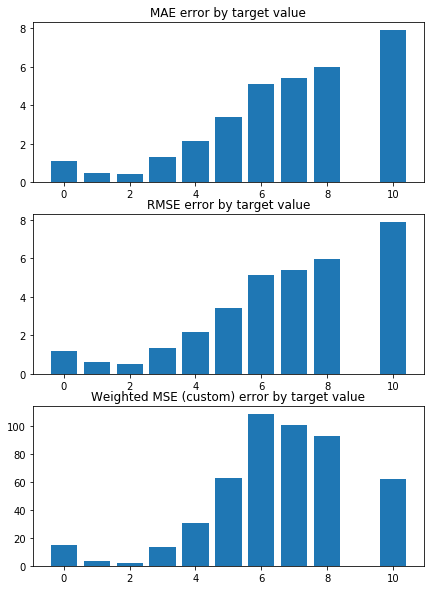

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0238136869205556 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0304477967386931 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


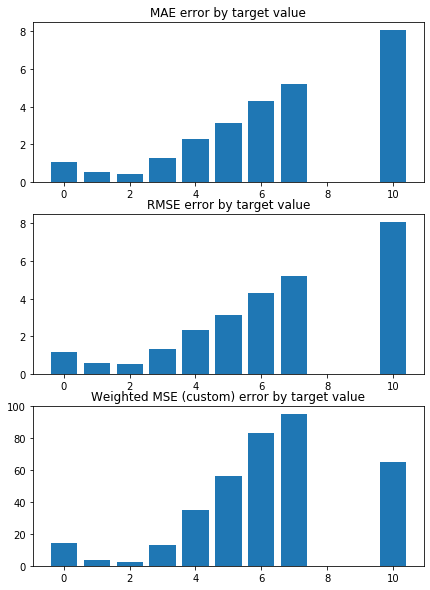

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1263414690942217 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0235069286577618 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


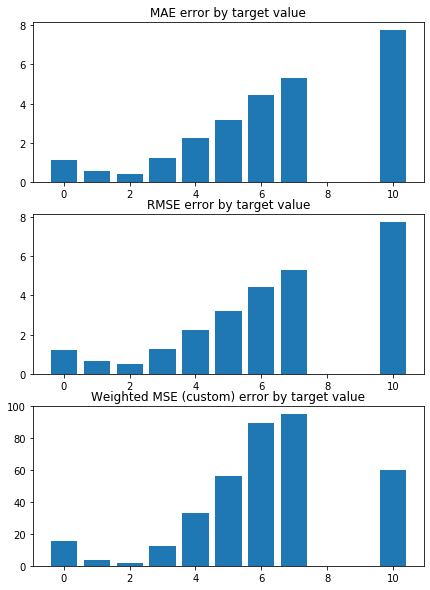

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.05287953944946 


 TRAIN PREDICTION Error
weighted_mse_train: 1.031678277432129 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


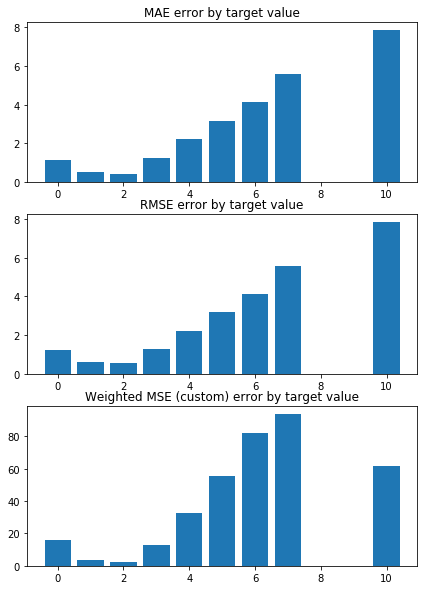

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0241080571060777 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0355456685635447 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


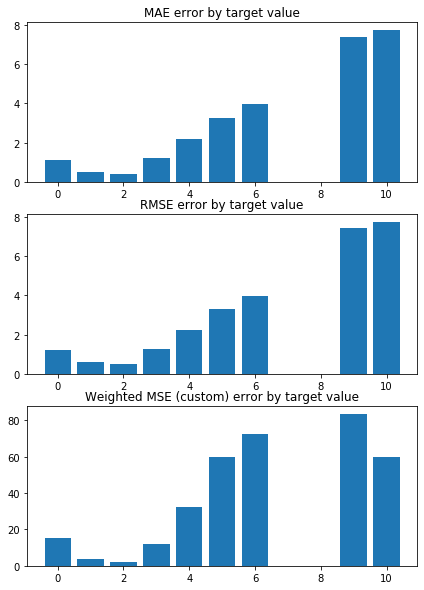

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0103845918460121 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0371044105982454 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


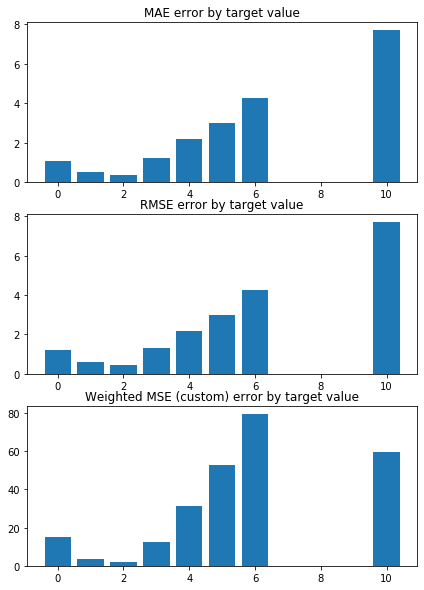

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.122058641452053 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0201356869455136 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


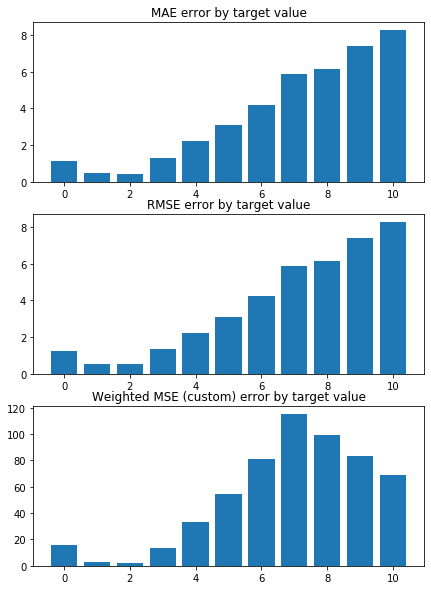

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9430953645497372 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0482929600331967 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


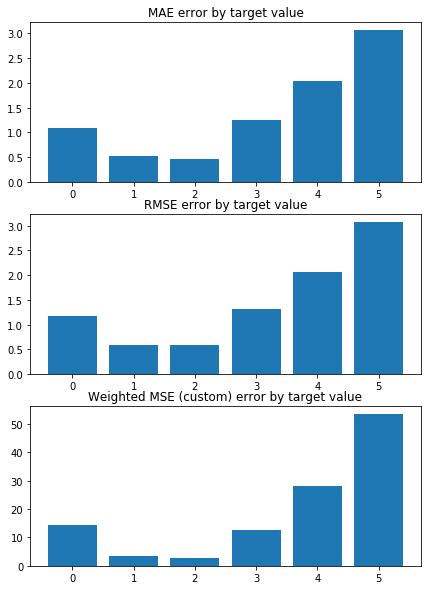

Weighted Mean squared error on Train: 1.03 
 MSE mean train: 1.7149846047359834 

Mean squared error on Test: 1.03 
 MSE mean test:  1.716874085980925 

Root of MSE on Test: 1.02 
 1.3102954193543246 

Variance score on Test: 0.06 
 r2_test: 0.20405238766024475 

wMSE_train 1.03
wMSE_test 1.03
MSE_train 1.71
MSE_test 1.72
MAE_train 0.98
MAE_test 0.92
r2_test 0.2
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.243683 -0.150414 -0.069998  0.052146  0.018672
1 -0.243577 -0.156281 -0.067317  0.051098  0.014635
2 -0.245946 -0.154854 -0.076290  0.050825  0.015185
3 -0.247990 -0.154547 -0.066799  0.056195  0.013334
4 -0.242754 -0.153590 -0.071182  0.056624  0.013600
5 -0.244299 -0.153321 -0.068139  0.057379  0.017765
6 -0.244594 -0.159266 -0.069850  0.047563  0.015500
7 -0.245080 -0.153888 -0.070613  0.052828  0.015798
8 -0.245497 -0.156988 -0.071020  0.054847  0.017113
9 -0.243525 -0.153713 -0.075006  0.055587  0.011731
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


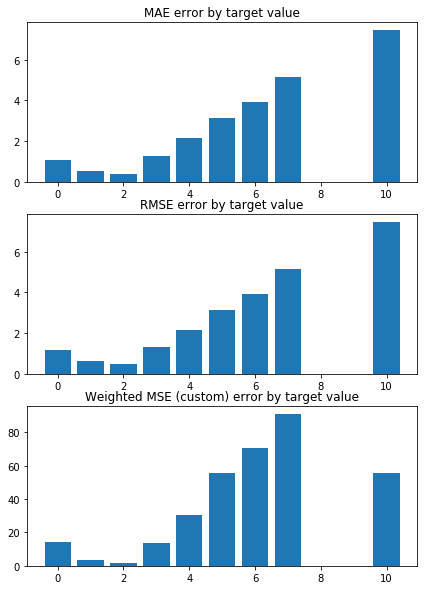

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9359481400473114 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0580759305427117 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


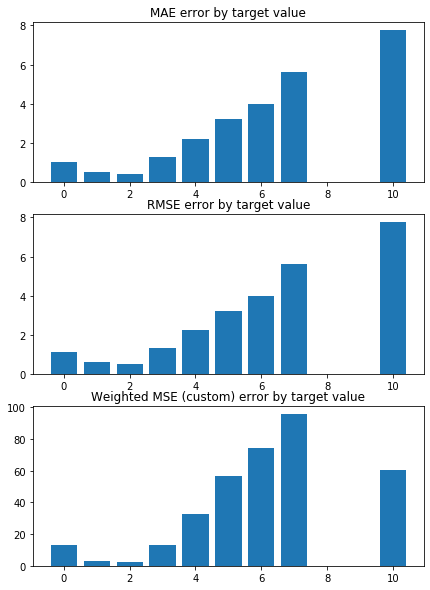

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0803046091137967 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0409833040549226 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


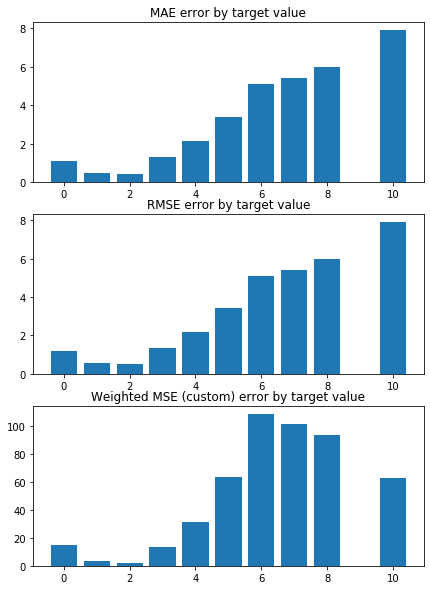

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0335785541763114 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0416725024177524 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


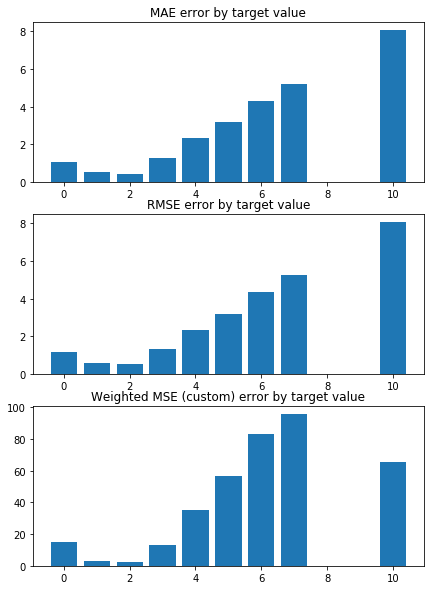

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1377653875854932 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0346001442196562 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


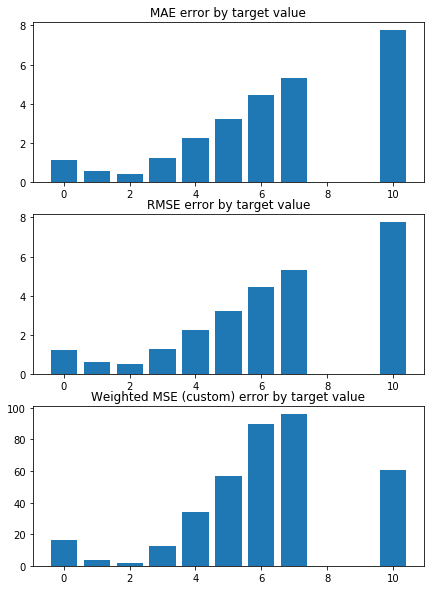

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0638902909571823 


 TRAIN PREDICTION Error
weighted_mse_train: 1.042747194563346 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


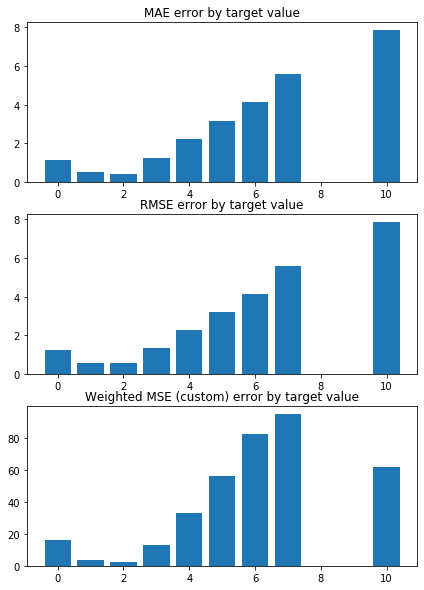

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.03431115236027 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0468586692607273 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


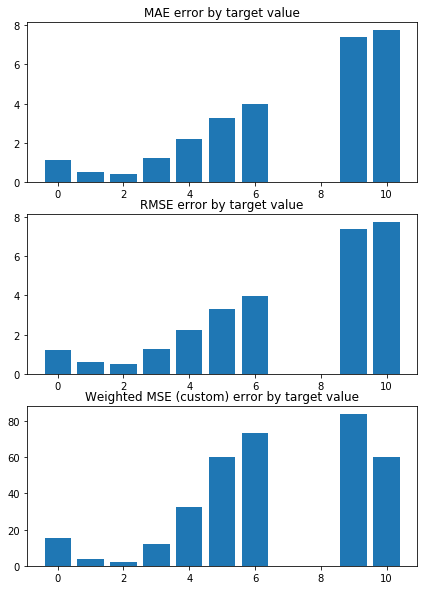

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0219422618517404 


 TRAIN PREDICTION Error
weighted_mse_train: 1.048302925576087 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


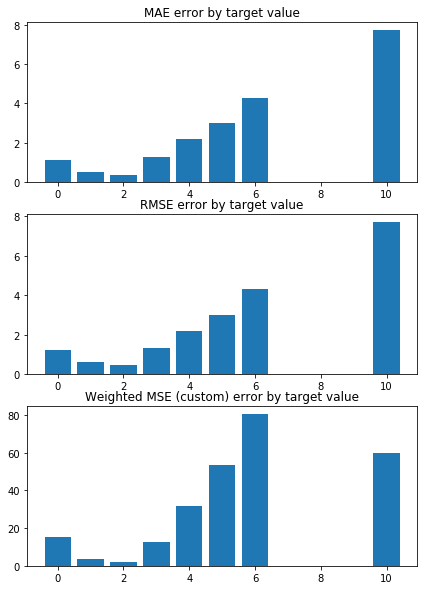

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1324925158473058 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0312427418516228 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


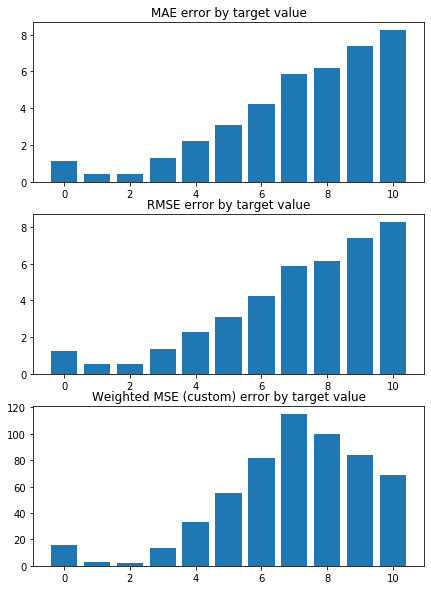

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9555900499592027 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0593251092032165 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


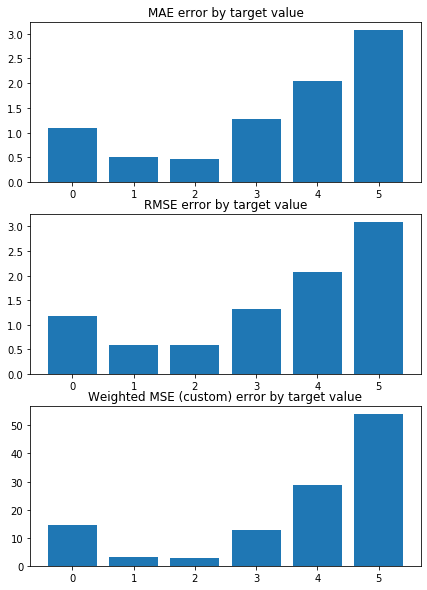

Weighted Mean squared error on Train: 1.05 
 MSE mean train: 1.730751895453103 

Mean squared error on Test: 1.05 
 MSE mean test:  1.7325620445876222 

Root of MSE on Test: 1.02 
 1.316268226687715 

Variance score on Test: 0.06 
 r2_test: 0.19659991786594153 

wMSE_train 1.05
wMSE_test 1.05
MSE_train 1.73
MSE_test 1.73
MAE_train 0.99
MAE_test 0.93
r2_test 0.2
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.228578 -0.143394 -0.067036  0.050649  0.018875
1 -0.228435 -0.148784 -0.064538  0.049724  0.015112
2 -0.230735 -0.147527 -0.072875  0.049442  0.015661
3 -0.232658 -0.147313 -0.064109  0.054550  0.013921
4 -0.227812 -0.146247 -0.068122  0.054868  0.014143
5 -0.229274 -0.146158 -0.065347  0.055538  0.018104
6 -0.229462 -0.151562 -0.066941  0.046441  0.015950
7 -0.229880 -0.146597 -0.067575  0.051353  0.016182
8 -0.230388 -0.149568 -0.068052  0.053256  0.017435
9 -0.228542 -0.146348 -0.071752  0.053932  0.012372


,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,1.588976,0.277716,1.585707,0.031170,-,"Ridge(alpha=1000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.32078741467444427, 0.2932258883292441, 0.21...",0.957366,0.067970,0.955552,0.008473
1,1.606163,0.275571,1.603283,0.031097,-,"Ridge(alpha=2000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.30829724529543934, 0.2852577133156444, 0.21...",0.964201,0.066901,0.962632,0.008476
2,1.625451,0.273828,1.622850,0.031025,-,"Ridge(alpha=3000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.29533364881311996, 0.27562474865985853, 0.2...",0.974648,0.066007,0.973249,0.008490
3,1.645051,0.272331,1.642660,0.030956,-,"Ridge(alpha=4000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2827247904970511, 0.26556399866780533, 0.19...",0.986527,0.065225,0.985256,0.008503
4,1.664238,0.271011,1.662013,0.030887,-,"Ridge(alpha=5000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2707392796855992, 0.25558538373332196, 0.19...",0.998875,0.064529,0.997701,0.008512
5,1.682686,0.269832,1.680594,0.030818,-,"Ridge(alpha=6000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.25946103115334007, 0.24592457884787944, 0.1...",1.011201,0.063902,1.010104,0.008516
6,1.700249,0.268769,1.698266,0.030749,-,"Ridge(alpha=7000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.24889929943879174, 0.23669113477291737, 0.1...",1.023240,0.063334,1.022206,0.008515
7,1.716874,0.267806,1.714985,0.030680,-,"Ridge(alpha=8000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2390301449247464, 0.2279300519354498, 0.172...",1.034852,0.062818,1.033871,0.008509
8,1.732562,0.266928,1.730752,0.030612,-,"Ridge(alpha=9000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.22981484022398413, 0.21965152298186463, 0.1...",1.045967,0.062348,1.045031,0.008500


In [99]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(1000, 10000, 1000)
# Create linear regression object



model_name = 'LR+L2_grid10000'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

results_pd_gr = pd.DataFrame()

for alpha in alpha_grid:
    model = linear_model.Ridge(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    results_pd_gr = train_test_KFold(X, y, 
                                                  model, model_name, results_pd_gr,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)

    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))

results_pd_gr

In [100]:
results_pd_gr

,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,1.588976,0.277716,1.585707,0.031170,-,"Ridge(alpha=1000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.32078741467444427, 0.2932258883292441, 0.21...",0.957366,0.067970,0.955552,0.008473
1,1.606163,0.275571,1.603283,0.031097,-,"Ridge(alpha=2000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.30829724529543934, 0.2852577133156444, 0.21...",0.964201,0.066901,0.962632,0.008476
2,1.625451,0.273828,1.622850,0.031025,-,"Ridge(alpha=3000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.29533364881311996, 0.27562474865985853, 0.2...",0.974648,0.066007,0.973249,0.008490
3,1.645051,0.272331,1.642660,0.030956,-,"Ridge(alpha=4000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2827247904970511, 0.26556399866780533, 0.19...",0.986527,0.065225,0.985256,0.008503
4,1.664238,0.271011,1.662013,0.030887,-,"Ridge(alpha=5000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2707392796855992, 0.25558538373332196, 0.19...",0.998875,0.064529,0.997701,0.008512
5,1.682686,0.269832,1.680594,0.030818,-,"Ridge(alpha=6000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.25946103115334007, 0.24592457884787944, 0.1...",1.011201,0.063902,1.010104,0.008516
6,1.700249,0.268769,1.698266,0.030749,-,"Ridge(alpha=7000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.24889929943879174, 0.23669113477291737, 0.1...",1.023240,0.063334,1.022206,0.008515
7,1.716874,0.267806,1.714985,0.030680,-,"Ridge(alpha=8000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2390301449247464, 0.2279300519354498, 0.172...",1.034852,0.062818,1.033871,0.008509
8,1.732562,0.266928,1.730752,0.030612,-,"Ridge(alpha=9000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.22981484022398413, 0.21965152298186463, 0.1...",1.045967,0.062348,1.045031,0.008500


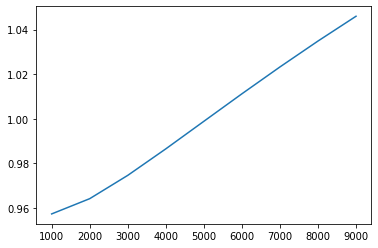

In [101]:
plt.plot(alpha_grid, wmse_test)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9768305170301268 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9754284844672658 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


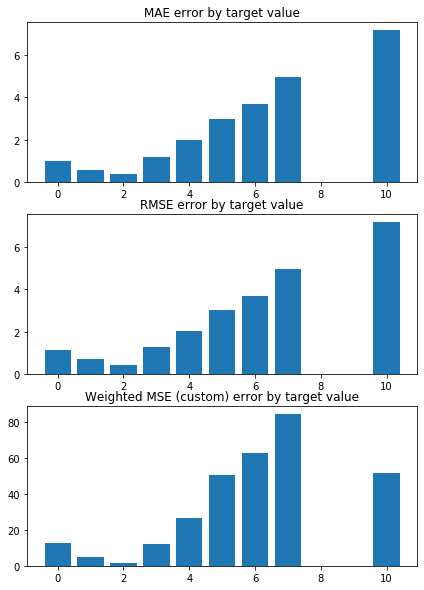

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8588333674523791 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9856911588943249 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


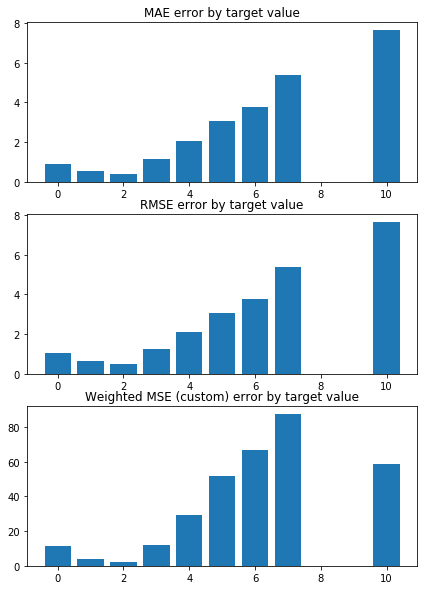

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0271463766349003 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9676707521693119 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


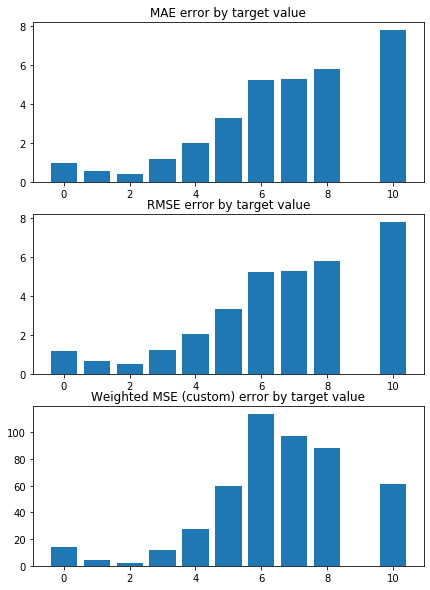

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9721431025314208 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9696034318842677 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


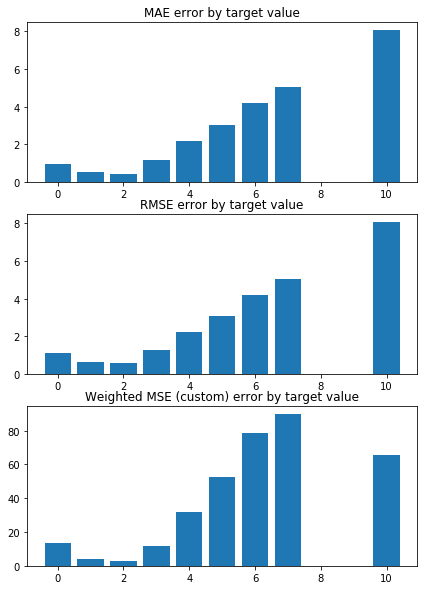

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0635231495266313 


 TRAIN PREDICTION Error
weighted_mse_train: 0.963260733399942 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


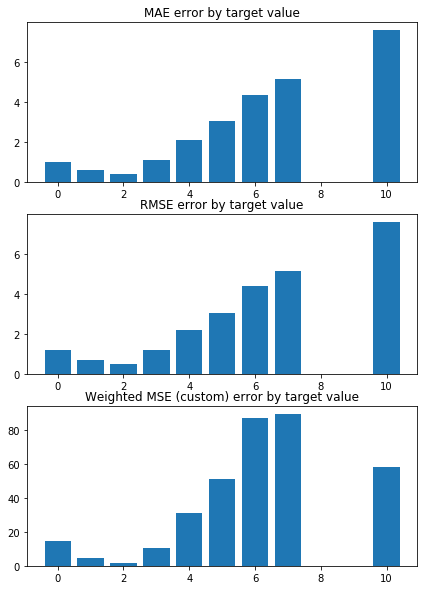

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9899851281177472 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9717049626409664 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


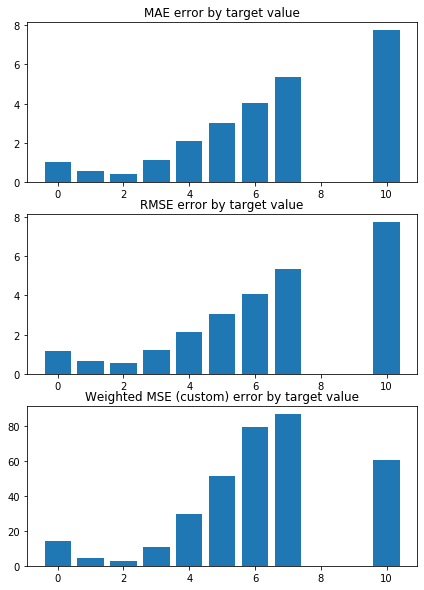

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9726699966912576 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9738592210637567 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


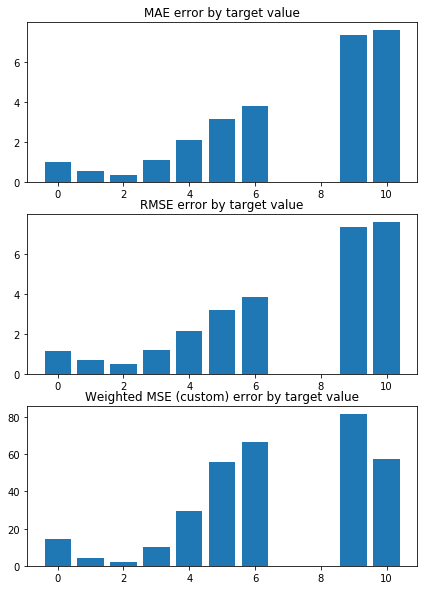

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9492651667420771 


 TRAIN PREDICTION Error
weighted_mse_train: 0.976047270974965 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


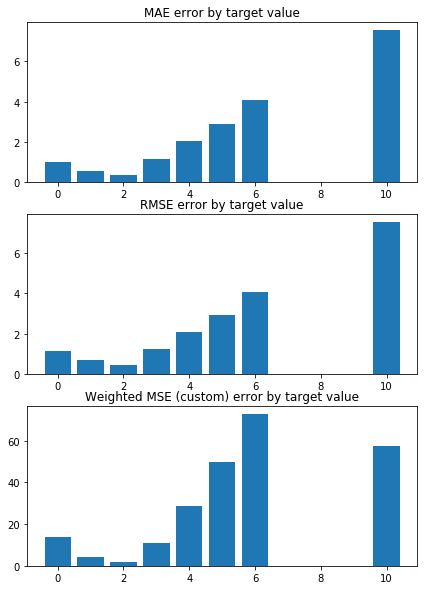

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0642656666940227 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9604239890513365 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


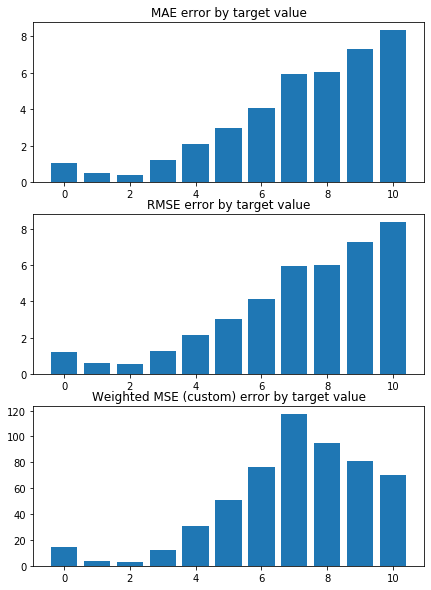

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8718127892130121 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9888045757113471 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


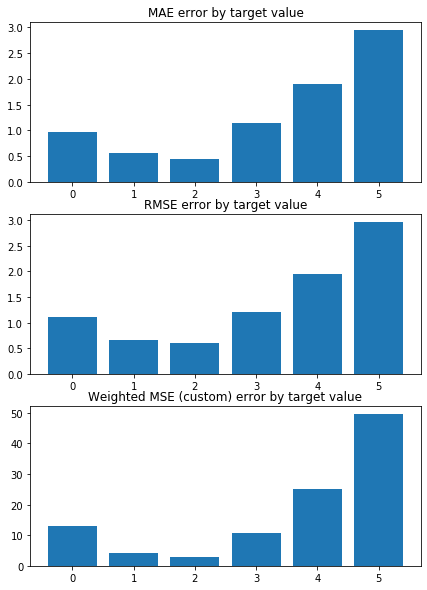

Weighted Mean squared error on Train: 0.97 
 MSE mean train: 1.622849922238211 

Mean squared error on Test: 0.97 
 MSE mean test:  1.6254512066919673 

Root of MSE on Test: 0.99 
 1.2749318439398898 

Variance score on Test: 0.07 
 r2_test: 0.24750595611126958 

wMSE_train 0.97
wMSE_test 0.97
MSE_train 1.62
MSE_test 1.63
MAE_train 0.93
MAE_test 0.86
r2_test 0.25
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.372637 -0.193354 -0.085947  0.053709  0.008882
1 -0.372930 -0.203763 -0.081506  0.051261  0.002323
2 -0.375414 -0.200563 -0.096011  0.051302  0.003043
3 -0.378755 -0.199225 -0.080166  0.058410  0.000085
4 -0.369413 -0.200116 -0.087954  0.060181  0.001006
5 -0.371976 -0.197652 -0.082438  0.061800  0.006682
6 -0.373391 -0.208706 -0.085091  0.045476  0.003311
7 -0.374768 -0.199300 -0.087175  0.053885  0.004476
8 -0.373928 -0.203430 -0.086814  0.056845  0.006270
9 -0.370541 -0.200391 -0.093199  0.058224 -0.001609
wmse_mean_train, wmse_mean_test = 0.9732494580257484 0.9746475

In [102]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# alpha_grid = np.arange(3000, 10000, 100)
# Create linear regression object


wmse_test = []
wmse_train = []

# for alpha in alpha_grid:
model = linear_model.Ridge(alpha=3000)


model_name = 'LR+L2_alf=3000'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)



wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [103]:
coefs_argsort, np.sort(coefs)

(array([[0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3]]),
 array([[-3.72636713e-01, -1.93354279e-01, -8.59466354e-02,
          8.88201183e-03,  5.37087386e-02],
        [-3.72929853e-01, -2.03763165e-01, -8.15062303e-02,
          2.32266276e-03,  5.12606427e-02],
        [-3.75413605e-01, -2.00562575e-01, -9.60113415e-02,
          3.04291079e-03,  5.13021038e-02],
        [-3.78754615e-01, -1.99225369e-01, -8.01658767e-02,
          8.49897280e-05,  5.84096687e-02],
        [-3.69412610e-01, -2.00115622e-01, -8.79544668e-02,
          1.00572533e-03,  6.01810147e-02],
        [-3.71976048e-01, -1.97651961e-01, -8.24381503e-02,
          6.68159117e-03,  6.18002818e-02],
        [-3.73390642e-01, -2.08705593e-01, -8.50905766e-02,
          3.31070875e-03,  4.54764372e-02],
        [-3.74768477

In [104]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K27ac', 'CTCF', 'Su(Hw)', 'H3K27me3'], dtype='object')

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS  + L2

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9616752015875624 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9647880816613102 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


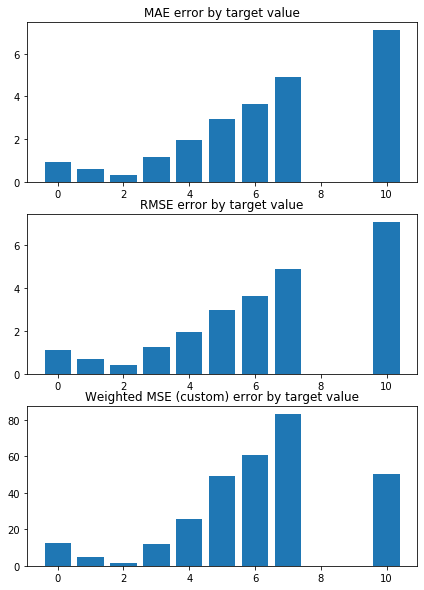

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8483123475221663 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9748139602612711 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


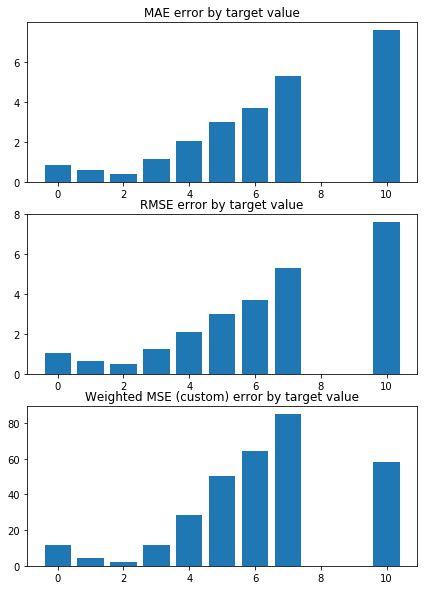

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0228027494040453 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9567201275566052 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


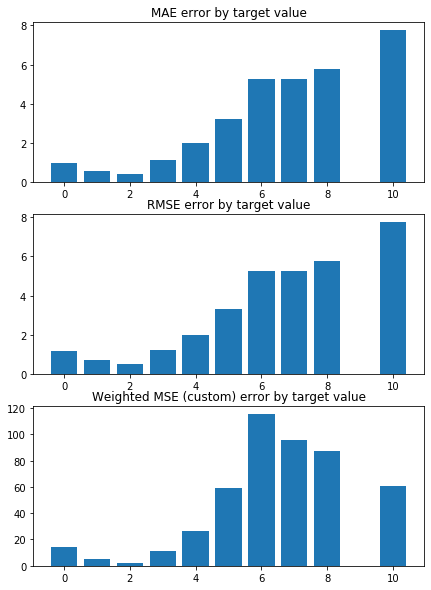

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9640035254581836 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9590055723499092 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


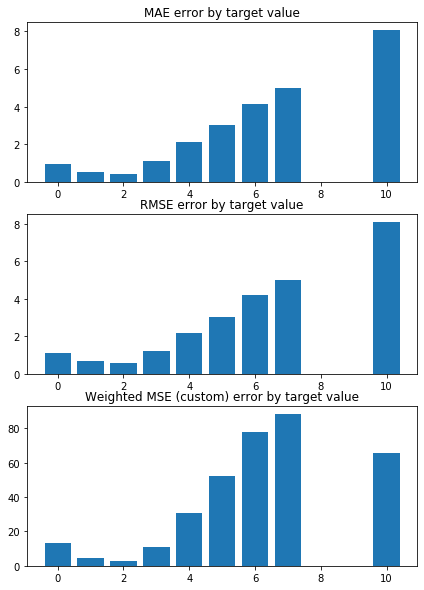

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.051859188811091 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9527072578644561 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


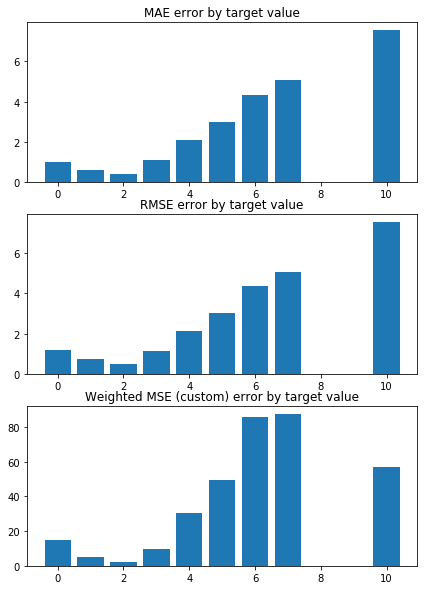

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9773850810062501 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9611926011269868 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


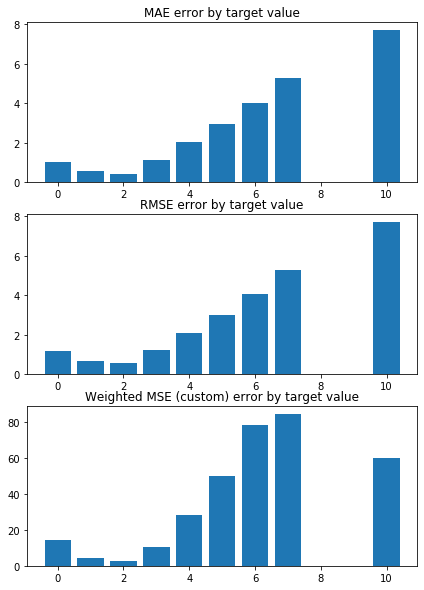

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9656907728238943 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9629885774373794 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


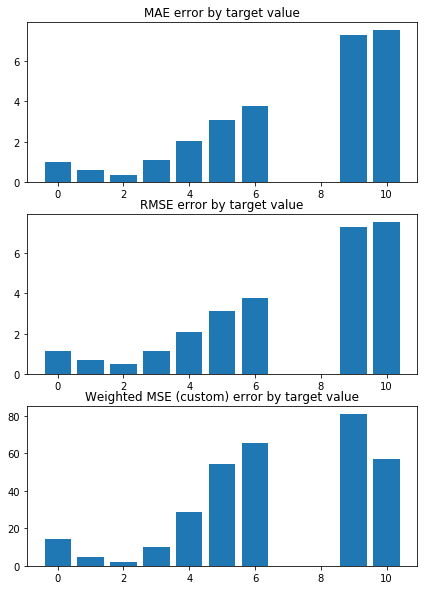

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9395682785785798 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9652741885509196 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


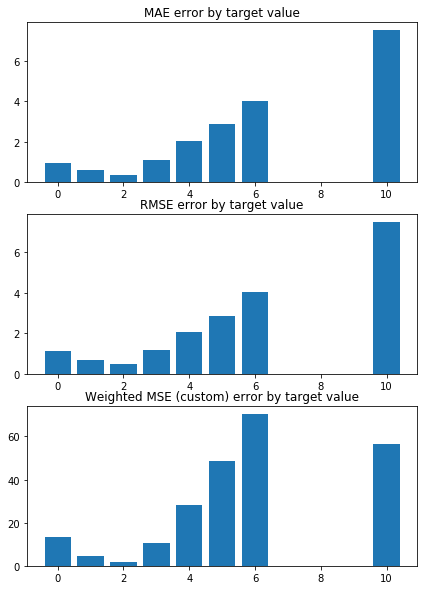

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0534967718033152 


 TRAIN PREDICTION Error
weighted_mse_train: 0.950214484353183 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


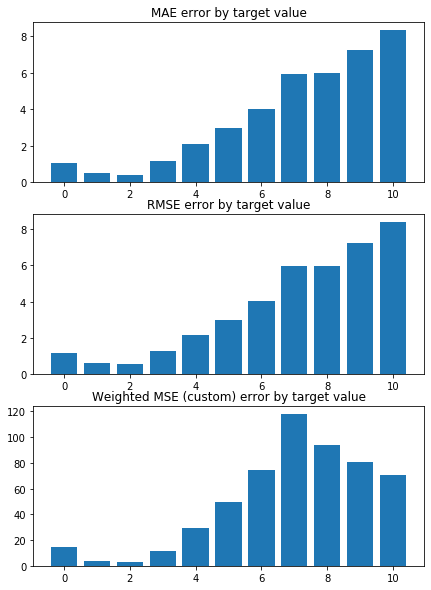

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8572145821737519 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9786136280906177 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


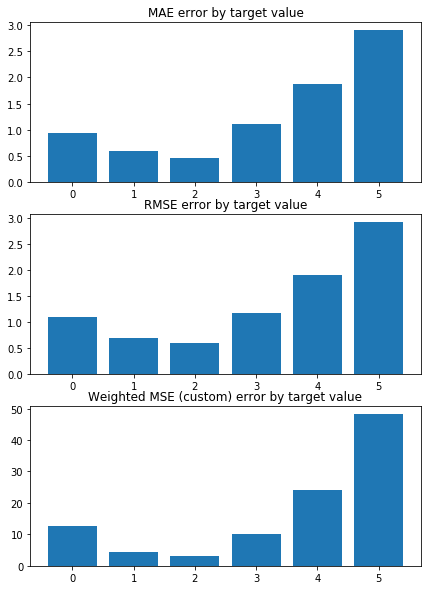

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.6032828004284412 

Mean squared error on Test: 0.96 
 MSE mean test:  1.6061626104945 

Root of MSE on Test: 0.98 
 1.267344708630805 

Variance score on Test: 0.07 
 r2_test: 0.2566884787853813 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.6
MSE_test 1.61
MAE_train 0.92
MAE_test 0.85
r2_test 0.26
      Chriz   H3K27ac      CTCF    Su(Hw)  H3K27me3
0 -0.421793 -0.201136 -0.087640  0.049178  0.001708
1 -0.422253 -0.213425 -0.082442  0.046053 -0.005892
2 -0.424544 -0.209462 -0.098979  0.046348 -0.004955
3 -0.428558 -0.207648 -0.080814  0.053855 -0.008453
4 -0.417208 -0.209667 -0.089923  0.056298 -0.007126
5 -0.420385 -0.206123 -0.083447  0.058256 -0.000966
6 -0.422267 -0.219201 -0.086424  0.039401 -0.004879
7 -0.424162 -0.208042 -0.089027  0.049053 -0.003262
8 -0.422650 -0.212584 -0.088393  0.052334 -0.001296
9 -0.418511 -0.209906 -0.095619  0.054016 -0.009969
wmse_mean_train, wmse_mean_test = 0.9626318479252637 0.964200849916

In [105]:
%%time
n_splits=10
random_state=16

X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# alpha_grid = np.arange(3000, 10000, 100)
# Create linear regression object


wmse_test = []
wmse_train = []

# for alpha in alpha_grid:
model = linear_model.Ridge(alpha=2000)

model_name = 'LR+L2_alf=2000'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_test.append(np.mean(weighted_mse_test_all))
wmse_train.append(np.mean(weighted_mse_train_all))


wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [106]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.922047,0.042622,0.920844,0.010108,-,test_params = testtest,1.269372,0.077260,1.267885,0.019264,"[0.33022472445781603, 0.30276714824071915, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.982133,0.065669,0.981319,0.008746,-,test_params = testtest,1.637767,0.275124,1.636354,0.031770,"[0.27687710875971383, 0.26619423266295583, 0.2...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.974648,0.066007,0.973249,0.008490,-,test_params = testtest,1.625451,0.273828,1.622850,0.031025,"[0.29533364881311996, 0.27562474865985853, 0.2...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.964201,0.066901,0.962632,0.008476,-,test_params = testtest,1.606163,0.275571,1.603283,0.031097,"[0.30829724529543934, 0.2852577133156444, 0.21...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."


In [107]:
wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 0.9626318479252637 0.964200849916884


In [108]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K27ac', 'CTCF', 'Su(Hw)', 'H3K27me3'], dtype='object')

In [109]:
su_drsc.columns[2:], coefs

(Index(['Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3', 'H3K27ac'], dtype='object'),
 array([[-0.42179254, -0.08764028,  0.0491783 ,  0.00170824, -0.20113572],
        [-0.42225293, -0.08244208,  0.04605299, -0.00589202, -0.21342544],
        [-0.42454364, -0.09897898,  0.04634837, -0.00495488, -0.20946184],
        [-0.42855782, -0.08081401,  0.05385473, -0.00845291, -0.20764782],
        [-0.41720802, -0.08992266,  0.05629784, -0.00712612, -0.20966726],
        [-0.42038527, -0.0834472 ,  0.05825572, -0.00096576, -0.20612251],
        [-0.42226669, -0.08642412,  0.03940083, -0.00487866, -0.21920138],
        [-0.42416234, -0.08902715,  0.04905287, -0.00326171, -0.2080416 ],
        [-0.42265043, -0.08839335,  0.05233408, -0.00129554, -0.21258431],
        [-0.4185106 , -0.09561915,  0.05401564, -0.00996948, -0.20990624]]))

In [110]:
coefs_argsort

array([[0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3],
       [0, 4, 1, 2, 3]])

In [111]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K27ac', 'CTCF', 'Su(Hw)', 'H3K27me3'], dtype='object')

In [112]:
coefs

array([[-0.42179254, -0.08764028,  0.0491783 ,  0.00170824, -0.20113572],
       [-0.42225293, -0.08244208,  0.04605299, -0.00589202, -0.21342544],
       [-0.42454364, -0.09897898,  0.04634837, -0.00495488, -0.20946184],
       [-0.42855782, -0.08081401,  0.05385473, -0.00845291, -0.20764782],
       [-0.41720802, -0.08992266,  0.05629784, -0.00712612, -0.20966726],
       [-0.42038527, -0.0834472 ,  0.05825572, -0.00096576, -0.20612251],
       [-0.42226669, -0.08642412,  0.03940083, -0.00487866, -0.21920138],
       [-0.42416234, -0.08902715,  0.04905287, -0.00326171, -0.2080416 ],
       [-0.42265043, -0.08839335,  0.05233408, -0.00129554, -0.21258431],
       [-0.4185106 , -0.09561915,  0.05401564, -0.00996948, -0.20990624]])

In [113]:
coefs_argsort, su_drsc.columns[2:][coefs_argsort[0]], np.sort(coefs)

(array([[0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3],
        [0, 4, 1, 2, 3]]),
 Index(['Chriz', 'H3K27ac', 'CTCF', 'Su(Hw)', 'H3K27me3'], dtype='object'),
 array([[-0.42179254, -0.20113572, -0.08764028,  0.00170824,  0.0491783 ],
        [-0.42225293, -0.21342544, -0.08244208, -0.00589202,  0.04605299],
        [-0.42454364, -0.20946184, -0.09897898, -0.00495488,  0.04634837],
        [-0.42855782, -0.20764782, -0.08081401, -0.00845291,  0.05385473],
        [-0.41720802, -0.20966726, -0.08992266, -0.00712612,  0.05629784],
        [-0.42038527, -0.20612251, -0.0834472 , -0.00096576,  0.05825572],
        [-0.42226669, -0.21920138, -0.08642412, -0.00487866,  0.03940083],
        [-0.42416234, -0.2080416 , -0.08902715, -0.00326171,  0.04905287],
        [-0.42265043, -0.21258431, -0.08839335, -0.00129554,  0.05233408

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L1  + L2/1 

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2449060089614168 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2055765017304694 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


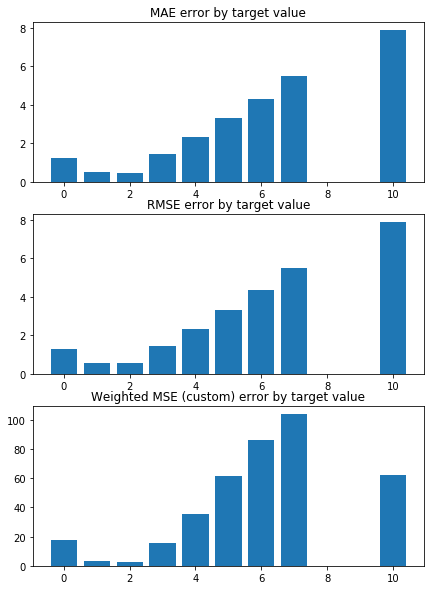

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1118669658719527 


 TRAIN PREDICTION Error
weighted_mse_train: 1.220569919183369 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


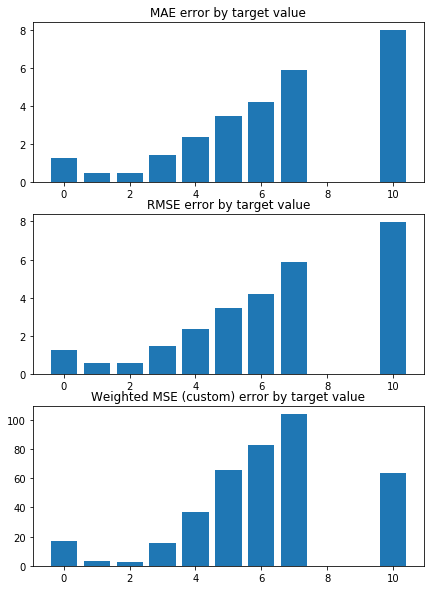

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2287279349973714 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2025883672258364 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


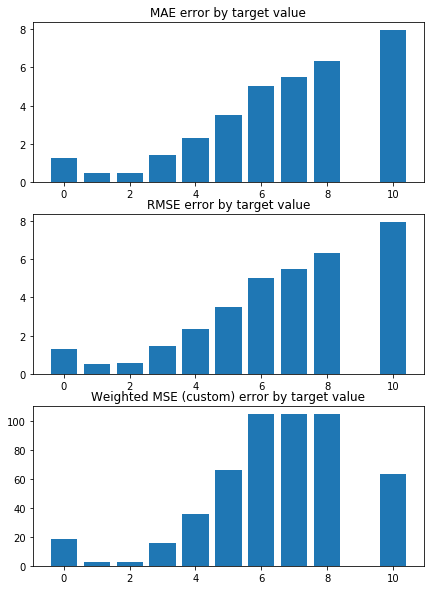

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1728007982199657 


 TRAIN PREDICTION Error
weighted_mse_train: 1.199391201570425 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


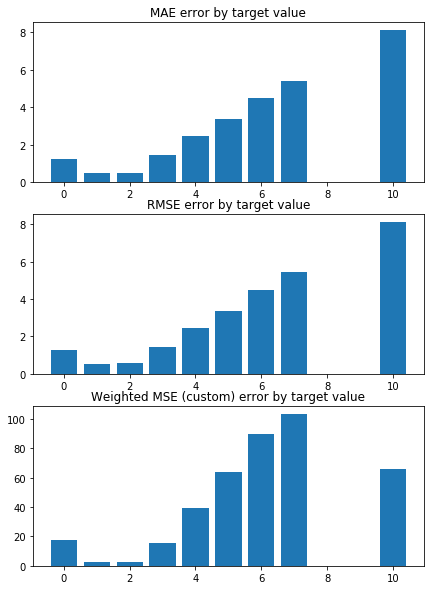

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3052594300880391 


 TRAIN PREDICTION Error
weighted_mse_train: 1.196368455388538 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


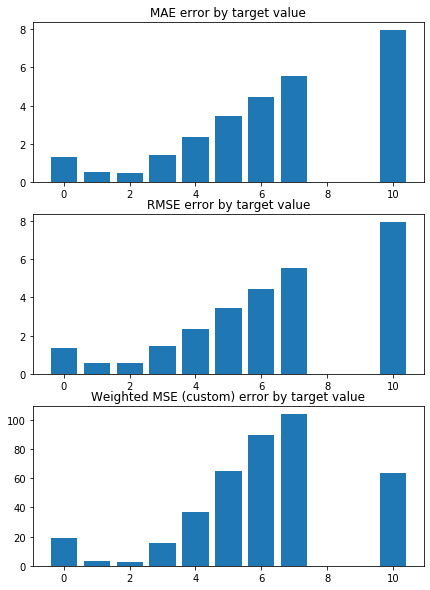

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2148024080917132 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2026817076703322 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


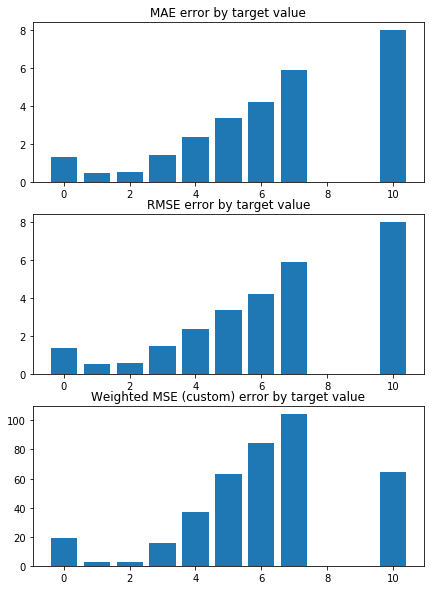

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1822040603354045 


 TRAIN PREDICTION Error
weighted_mse_train: 1.209985923231596 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


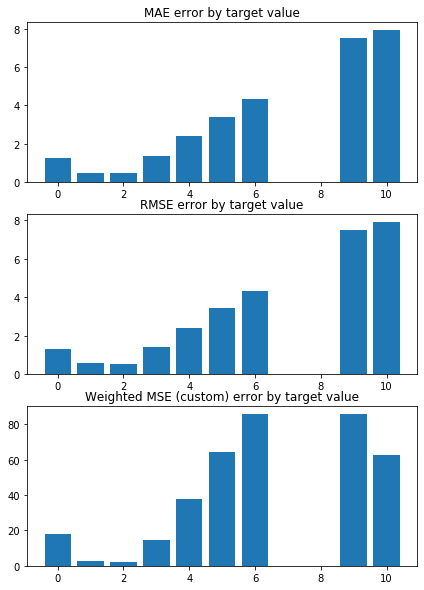

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.1963171372475687 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2085437586252985 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


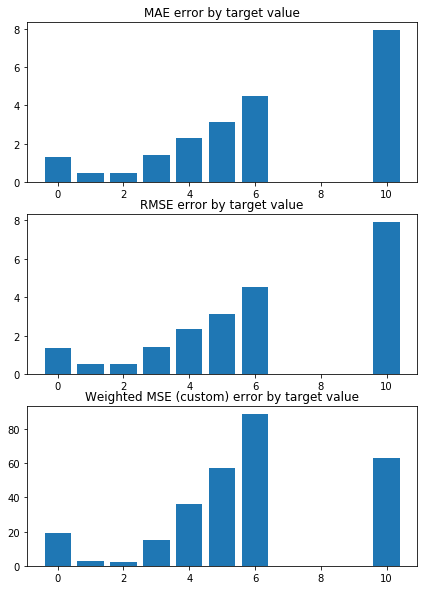

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.27353803539049 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1917596155616346 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


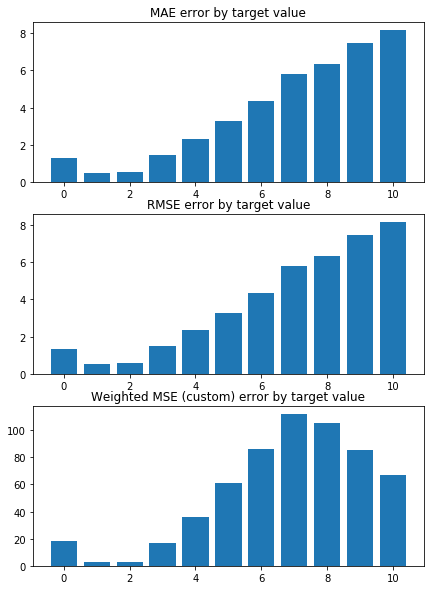

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1315546930970317 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2200593512380997 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


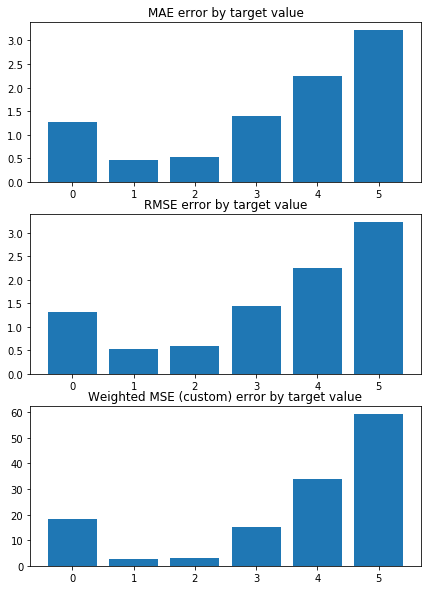

Weighted Mean squared error on Train: 1.21 
 MSE mean train: 1.9471356173691141 

Mean squared error on Test: 1.21 
 MSE mean test:  1.948052433103833 

Root of MSE on Test: 1.10 
 1.3957264893609467 

Variance score on Test: 0.06 
 r2_test: 0.0942159831356836 

wMSE_train 1.21
wMSE_test 1.21
MSE_train 1.95
MSE_test 1.95
MAE_train 1.09
MAE_test 1.03
r2_test 0.09
      Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0 -0.151244  -0.0     0.0       0.0     -0.0
1 -0.150435  -0.0     0.0       0.0     -0.0
2 -0.156387  -0.0     0.0       0.0     -0.0
3 -0.160923  -0.0     0.0       0.0     -0.0
4 -0.151200  -0.0     0.0       0.0     -0.0
5 -0.155718  -0.0     0.0       0.0     -0.0
6 -0.153997  -0.0     0.0       0.0     -0.0
7 -0.153884  -0.0     0.0       0.0     -0.0
8 -0.158339  -0.0     0.0       0.0     -0.0
9 -0.153161  -0.0     0.0       0.0     -0.0
wmse_mean_train, wmse_mean_test = 1.2057524801425599 1.2061977472300955


In [114]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.ElasticNet()

model_name = 'LR+L1+L2'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [115]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.922047,0.042622,0.920844,0.010108,-,test_params = testtest,1.269372,0.077260,1.267885,0.019264,"[0.33022472445781603, 0.30276714824071915, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.982133,0.065669,0.981319,0.008746,-,test_params = testtest,1.637767,0.275124,1.636354,0.031770,"[0.27687710875971383, 0.26619423266295583, 0.2...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.974648,0.066007,0.973249,0.008490,-,test_params = testtest,1.625451,0.273828,1.622850,0.031025,"[0.29533364881311996, 0.27562474865985853, 0.2...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.964201,0.066901,0.962632,0.008476,-,test_params = testtest,1.606163,0.275571,1.603283,0.031097,"[0.30829724529543934, 0.2852577133156444, 0.21...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.206198,0.057172,1.205752,0.008909,-,test_params = testtest,1.948052,0.255206,1.947136,0.031019,"[0.10377187523708364, 0.10463421009496077, 0.0...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."


In [116]:
weighted_mse_train_all, weighted_mse_test_all

(array([1.2055765 , 1.22056992, 1.20258837, 1.1993912 , 1.19636846,
        1.20268171, 1.20998592, 1.20854376, 1.19175962, 1.22005935]),
 array([1.24490601, 1.11186697, 1.22872793, 1.1728008 , 1.30525943,
        1.21480241, 1.18220406, 1.19631714, 1.27353804, 1.13155469]))

In [117]:
print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


wmse_mean_train, wmse_mean_test = 1.2057524801425599 1.2061977472300955


KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9671639131106929 


 TRAIN PREDICTION Error
weighted_mse_train: 0.965883082781529 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


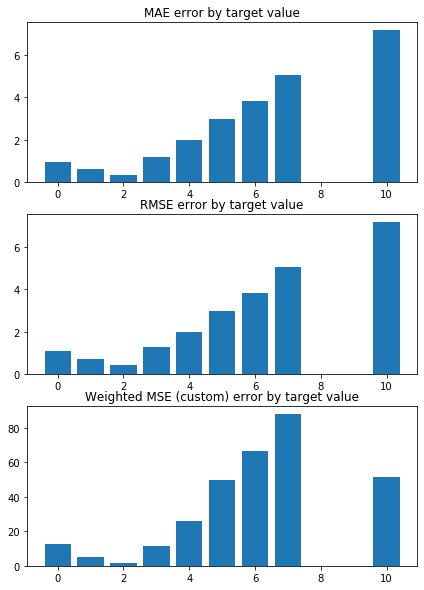

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8542675016035018 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9758657840931195 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


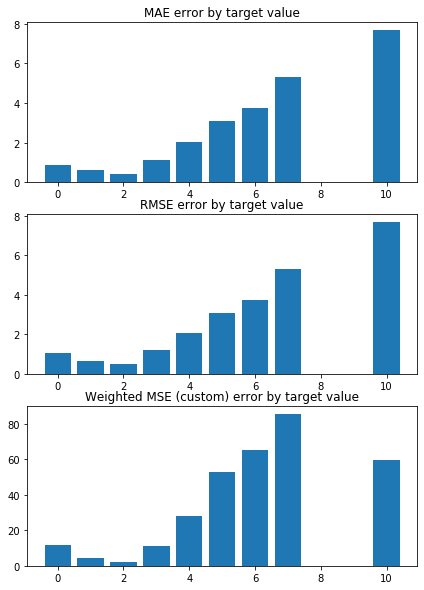

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0220476182101565 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9569257002772339 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


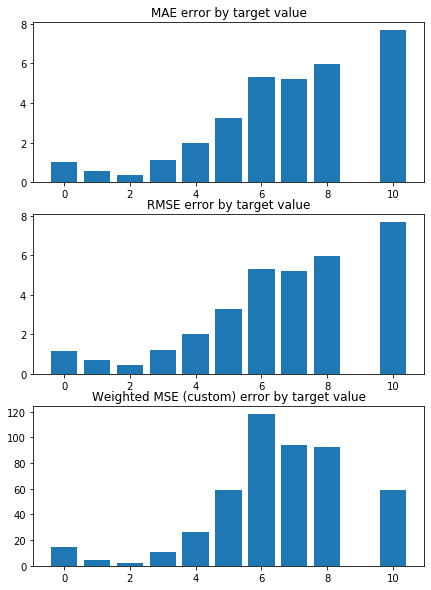

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9685666633503076 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9607202208633012 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


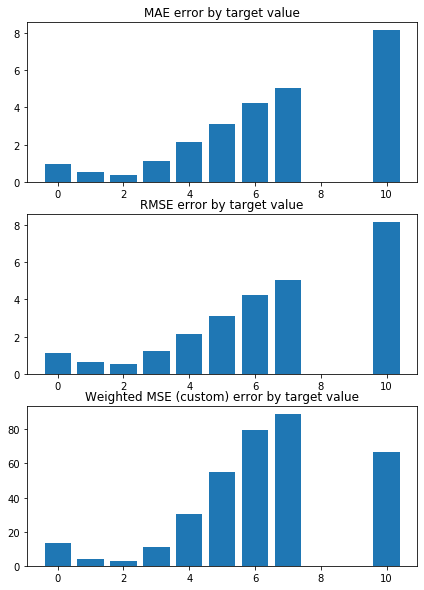

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0429365429829254 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9548958204480442 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


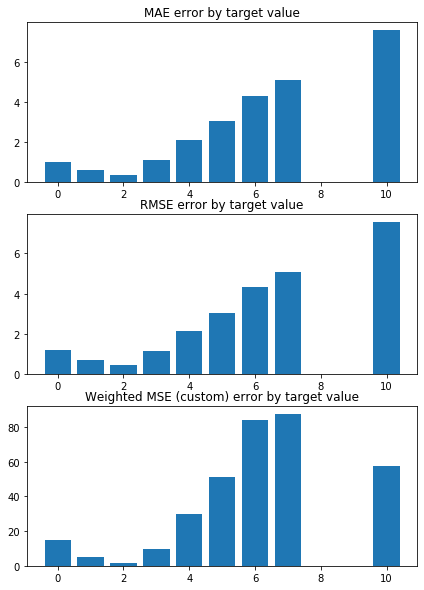

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.981554998590553 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9630061869502268 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


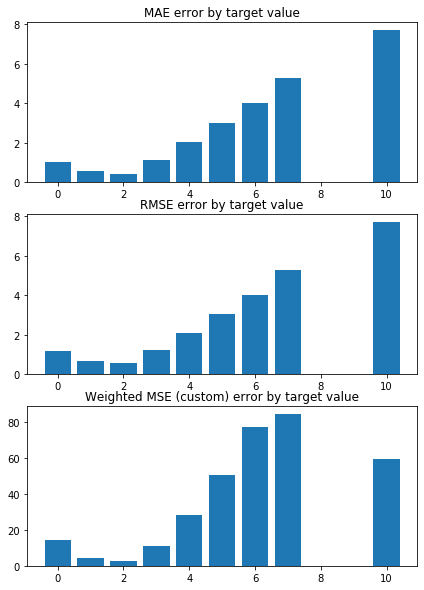

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9659198426675225 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9631524622124154 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


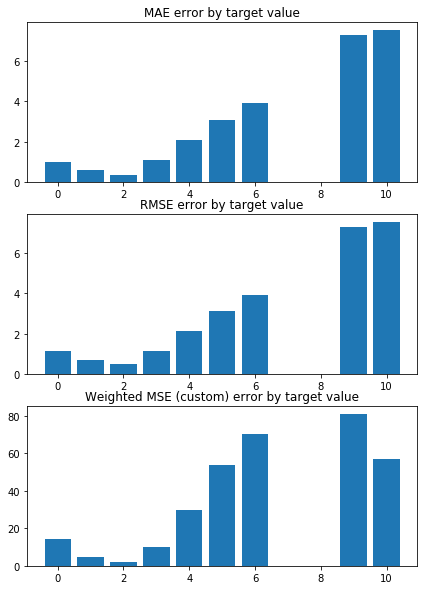

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9481872468132316 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9659346754005695 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


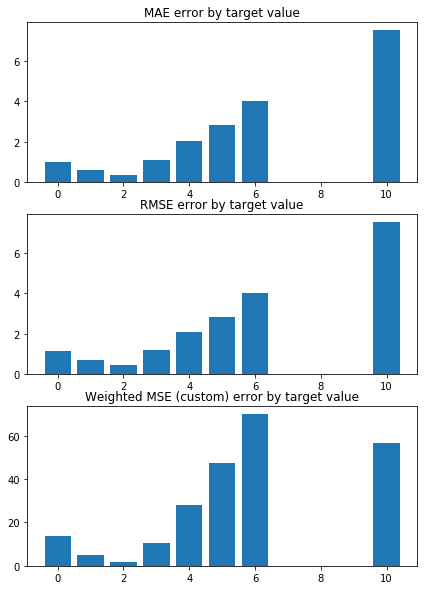

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0537109149489787 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9509439823919802 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


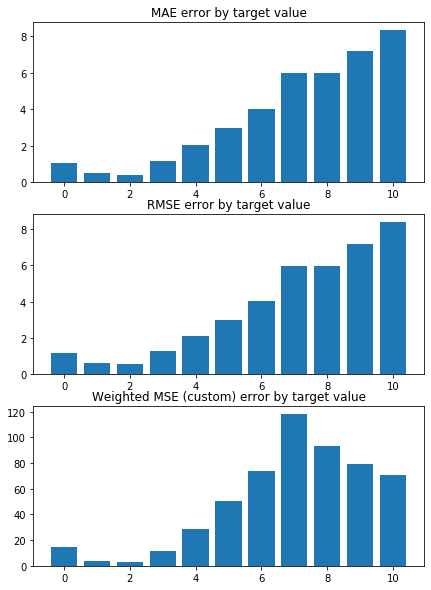

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8445852150557414 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9804898637495291 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


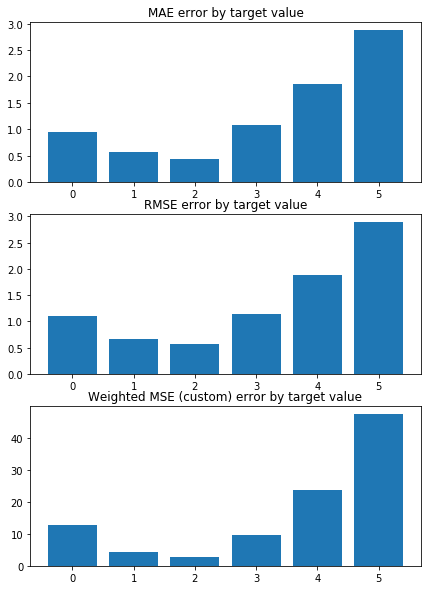

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.6063538356182345 

Mean squared error on Test: 0.96 
 MSE mean test:  1.608461172666038 

Root of MSE on Test: 0.98 
 1.2682512261638221 

Variance score on Test: 0.07 
 r2_test: 0.2557933084378202 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.61
MSE_test 1.61
MAE_train 0.93
MAE_test 0.85
r2_test 0.26
      Chriz   H3K27ac      CTCF  Su(Hw)  H3K27me3
0 -0.492427 -0.145898 -0.015894     0.0      -0.0
1 -0.489838 -0.160949 -0.010083     0.0      -0.0
2 -0.492876 -0.155696 -0.027846     0.0      -0.0
3 -0.500706 -0.152492 -0.008484     0.0      -0.0
4 -0.485381 -0.156253 -0.019418     0.0      -0.0
5 -0.492157 -0.153118 -0.009583     0.0      -0.0
6 -0.487392 -0.167928 -0.015478     0.0      -0.0
7 -0.494201 -0.153863 -0.016227     0.0      -0.0
8 -0.492648 -0.160389 -0.017704     0.0      -0.0
9 -0.486869 -0.154716 -0.027509     0.0      -0.0
wmse_mean_train, wmse_mean_test = 0.963781777916795 0.964894045733361


In [118]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object

alpha =  0.2 # 3000 + 0.2
l1_ratio = 0.5 # 0.000066 # 0.2 / (3000 + 0.2)

model = linear_model.ElasticNet(alpha=alpha, l1_ratio=l1_ratio, fit_intercept=True, normalize=False, precompute=False, max_iter=1000, 
                                copy_X=True, tol=0.0001, warm_start=False, positive=False, random_state=None, selection='cyclic')


model_name = 'LR+L2_alf=.2_rat=.5'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)


wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [119]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.922047,0.042622,0.920844,0.010108,-,test_params = testtest,1.269372,0.077260,1.267885,0.019264,"[0.33022472445781603, 0.30276714824071915, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.982133,0.065669,0.981319,0.008746,-,test_params = testtest,1.637767,0.275124,1.636354,0.031770,"[0.27687710875971383, 0.26619423266295583, 0.2...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.974648,0.066007,0.973249,0.008490,-,test_params = testtest,1.625451,0.273828,1.622850,0.031025,"[0.29533364881311996, 0.27562474865985853, 0.2...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.964201,0.066901,0.962632,0.008476,-,test_params = testtest,1.606163,0.275571,1.603283,0.031097,"[0.30829724529543934, 0.2852577133156444, 0.21...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.206198,0.057172,1.205752,0.008909,-,test_params = testtest,1.948052,0.255206,1.947136,0.031019,"[0.10377187523708364, 0.10463421009496077, 0.0...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,0.964894,0.066734,0.963782,0.008575,-,test_params = testtest,1.608461,0.277371,1.606354,0.031258,"[0.300533354147124, 0.27855539412578, 0.214878...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."


In [120]:
print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 0.963781777916795 0.964894045733361


In [121]:
coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:][coefs_argsort][0])
coefs_pd.round(2)

,Chriz,H3K27ac,CTCF,Su(Hw),H3K27me3
0,-0.49,-0.02,0.0,-0.0,-0.15
1,-0.49,-0.01,0.0,-0.0,-0.16
2,-0.49,-0.03,0.0,-0.0,-0.16
3,-0.50,-0.01,0.0,-0.0,-0.15
4,-0.49,-0.02,0.0,-0.0,-0.16
5,-0.49,-0.01,0.0,-0.0,-0.15
6,-0.49,-0.02,0.0,-0.0,-0.17
7,-0.49,-0.02,0.0,-0.0,-0.15
8,-0.49,-0.02,0.0,-0.0,-0.16
9,-0.49,-0.03,0.0,-0.0,-0.15


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS 

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

1 / (2 * n_samples) * ||y - Xw||^2_2 + alpha * l1_ratio * ||w||_1 + 0.5 * alpha * (1 - l1_ratio) * ||w||^2_2


$$ \frac{1}{(2  n_{samples})} ||y - Xw||^2_2
+ alpha * l1_{ratio}  ||w||_1
+ 0.5 * alpha * (1 - l1_{ratio}) ||w||^2_2 $$



$$ \frac{1}{ n\_samples} ||y - Xw||^2_2
+ \alpha ||w||_1
+ \beta ||w||^2_2 $$

$$ \frac{1}{ n\_samples} ||y - Xw||^2_2 + \alpha ||w||_1 + \beta ||w||^2_2 $$

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9455995888906195 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9603754462685091 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


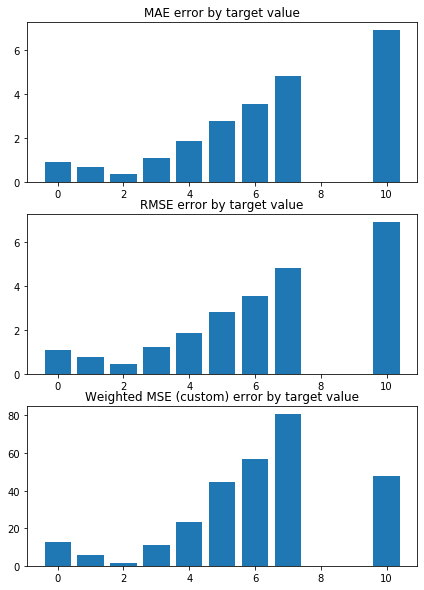

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8505579048187752 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9703194255065083 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


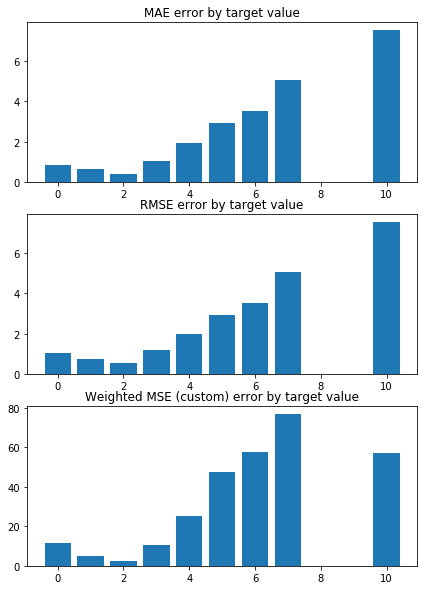

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0395098799433695 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9518809239249897 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


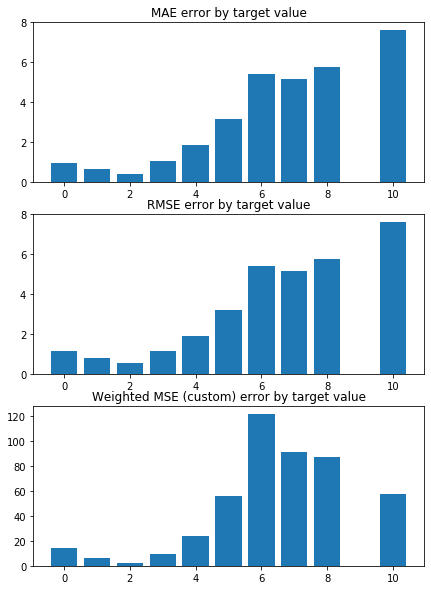

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9679932045405429 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9557725900337942 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


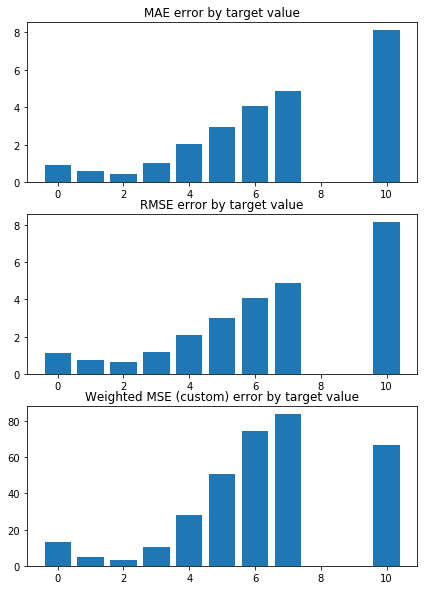

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0411551326283972 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9482024895993993 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


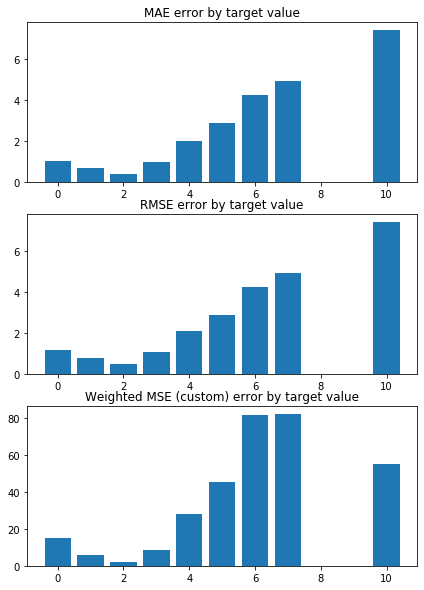

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9642521288450389 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9568170964093331 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


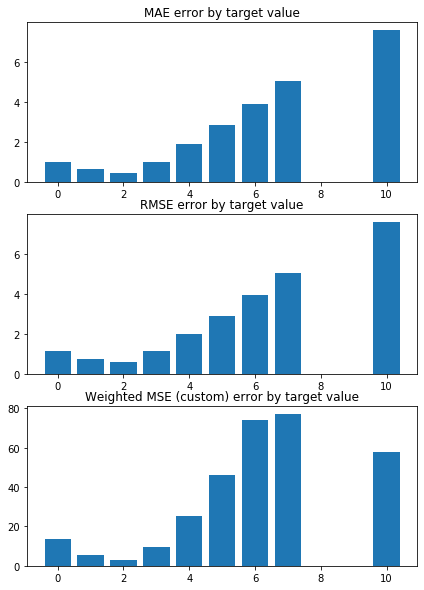

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9734548226658905 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9586834206397351 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


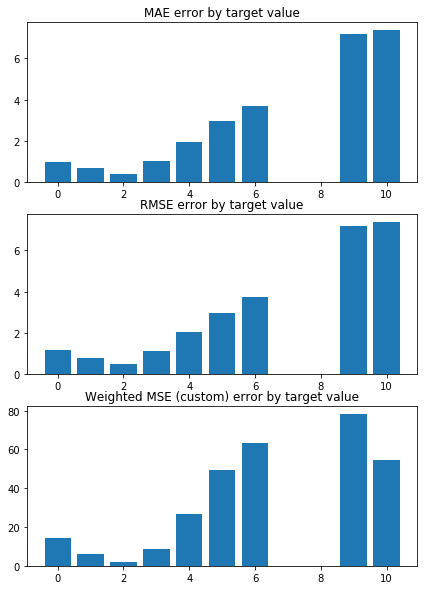

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9425846536237507 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9610023690953803 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


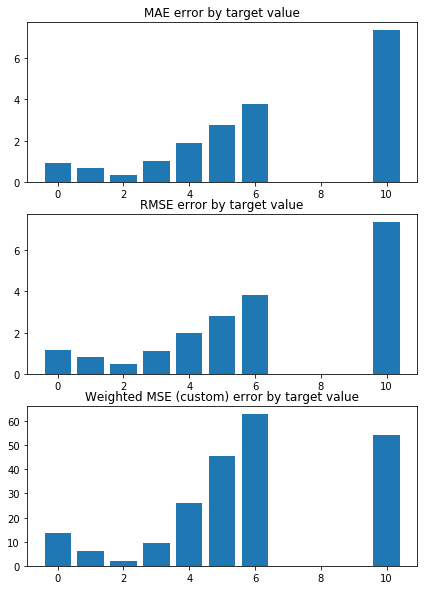

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0459065815277124 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9473869909682894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


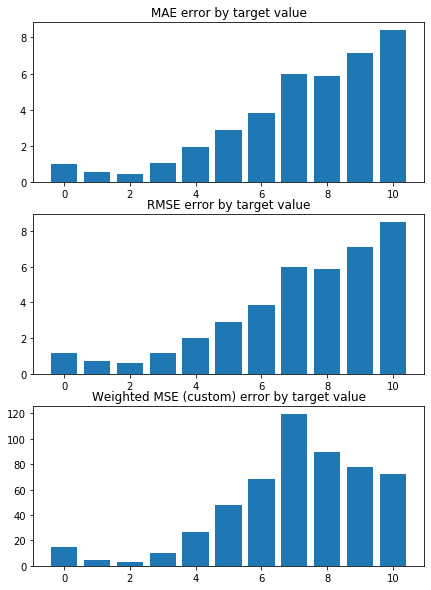

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8370351058117279 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9755965144073965 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


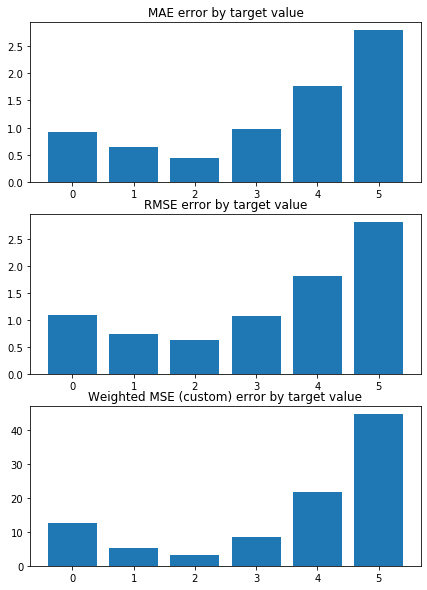

Weighted Mean squared error on Train: 0.96 
 MSE mean train: 1.5760946939714553 

Mean squared error on Test: 0.96 
 MSE mean test:  1.579956057333393 

Root of MSE on Test: 0.98 
 1.2569630294218652 

Variance score on Test: 0.07 
 r2_test: 0.26927210899686277 

wMSE_train 0.96
wMSE_test 0.96
MSE_train 1.58
MSE_test 1.58
MAE_train 0.91
MAE_test 0.83
r2_test 0.27
      Chriz   H3K27ac      CTCF  H3K27me3    Su(Hw)
0 -0.604917 -0.190577 -0.077341 -0.035250  0.013724
1 -0.605994 -0.209867 -0.069082 -0.046829  0.007790
2 -0.606345 -0.203347 -0.092007 -0.044125  0.009684
3 -0.613834 -0.199451 -0.066803 -0.050258  0.017438
4 -0.592805 -0.207426 -0.080341 -0.046697  0.022904
5 -0.599567 -0.199354 -0.070598 -0.039149  0.025675
6 -0.603285 -0.218941 -0.074712 -0.045496 -0.001745
7 -0.608094 -0.200640 -0.078664 -0.042130  0.012393
8 -0.603454 -0.207045 -0.077731 -0.039399  0.016631
9 -0.595396 -0.206297 -0.087506 -0.050025  0.019883
wmse_mean_train, wmse_mean_test = 0.9586037266853333 0.9608049

In [122]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression()

model_name = 'LR'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)



In [123]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.922047,0.042622,0.920844,0.010108,-,test_params = testtest,1.269372,0.077260,1.267885,0.019264,"[0.33022472445781603, 0.30276714824071915, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.982133,0.065669,0.981319,0.008746,-,test_params = testtest,1.637767,0.275124,1.636354,0.031770,"[0.27687710875971383, 0.26619423266295583, 0.2...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.974648,0.066007,0.973249,0.008490,-,test_params = testtest,1.625451,0.273828,1.622850,0.031025,"[0.29533364881311996, 0.27562474865985853, 0.2...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.964201,0.066901,0.962632,0.008476,-,test_params = testtest,1.606163,0.275571,1.603283,0.031097,"[0.30829724529543934, 0.2852577133156444, 0.21...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.206198,0.057172,1.205752,0.008909,-,test_params = testtest,1.948052,0.255206,1.947136,0.031019,"[0.10377187523708364, 0.10463421009496077, 0.0...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,0.964894,0.066734,0.963782,0.008575,-,test_params = testtest,1.608461,0.277371,1.606354,0.031258,"[0.300533354147124, 0.27855539412578, 0.214878...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [124]:
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

,Chriz,H3K27ac,CTCF,H3K27me3,Su(Hw)
0,-0.492427,-0.015894,0.0,-0.145898,-0.0
1,-0.489838,-0.010083,0.0,-0.160949,-0.0
2,-0.492876,-0.027846,0.0,-0.155696,-0.0
3,-0.500706,-0.008484,0.0,-0.152492,-0.0
4,-0.485381,-0.019418,0.0,-0.156253,-0.0
5,-0.492157,-0.009583,0.0,-0.153118,-0.0
6,-0.487392,-0.015478,0.0,-0.167928,-0.0
7,-0.494201,-0.016227,0.0,-0.153863,-0.0
8,-0.492648,-0.017704,0.0,-0.160389,-0.0
9,-0.486869,-0.027509,0.0,-0.154716,-0.0


In [125]:
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]].iloc[0]

Chriz      -0.492427
H3K27ac    -0.015894
CTCF        0.000000
H3K27me3   -0.145898
Su(Hw)     -0.000000
Name: 0, dtype: float64

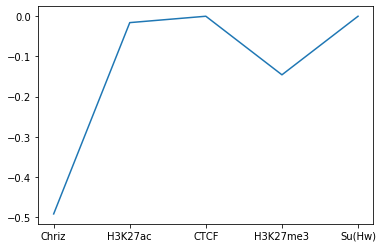

In [126]:
plt.plot(coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]].iloc[0])

# !! одинаковая приоритизация 

In [127]:
np.sort(coefs[0])

array([-0.60491679, -0.19057744, -0.07734103, -0.03525037,  0.01372434])

In [128]:
pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

,Chriz,H3K27ac,CTCF,H3K27me3,Su(Hw)
0,0,4,1,3,2
1,0,4,1,3,2
2,0,4,1,3,2
3,0,4,1,3,2
4,0,4,1,3,2
5,0,4,1,3,2
6,0,4,1,3,2
7,0,4,1,3,2
8,0,4,1,3,2
9,0,4,1,3,2


In [129]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K27ac', 'CTCF', 'H3K27me3', 'Su(Hw)'], dtype='object')

In [130]:
coefs_df = pd.DataFrame(coefs, columns=su_drsc.columns[2:])[su_drsc.columns[2:][coefs_argsort[0]]]

coefs_df

,Chriz,H3K27ac,CTCF,H3K27me3,Su(Hw)
0,-0.604917,-0.190577,-0.077341,-0.035250,0.013724
1,-0.605994,-0.209867,-0.069082,-0.046829,0.007790
2,-0.606345,-0.203347,-0.092007,-0.044125,0.009684
3,-0.613834,-0.199451,-0.066803,-0.050258,0.017438
4,-0.592805,-0.207426,-0.080341,-0.046697,0.022904
5,-0.599567,-0.199354,-0.070598,-0.039149,0.025675
6,-0.603285,-0.218941,-0.074712,-0.045496,-0.001745
7,-0.608094,-0.200640,-0.078664,-0.042130,0.012393
8,-0.603454,-0.207045,-0.077731,-0.039399,0.016631
9,-0.595396,-0.206297,-0.087506,-0.050025,0.019883


In [131]:
coefs_df.round(2)

,Chriz,H3K27ac,CTCF,H3K27me3,Su(Hw)
0,-0.60,-0.19,-0.08,-0.04,0.01
1,-0.61,-0.21,-0.07,-0.05,0.01
2,-0.61,-0.20,-0.09,-0.04,0.01
3,-0.61,-0.20,-0.07,-0.05,0.02
4,-0.59,-0.21,-0.08,-0.05,0.02
5,-0.60,-0.20,-0.07,-0.04,0.03
6,-0.60,-0.22,-0.07,-0.05,-0.00
7,-0.61,-0.20,-0.08,-0.04,0.01
8,-0.60,-0.21,-0.08,-0.04,0.02
9,-0.60,-0.21,-0.09,-0.05,0.02


In [132]:
# !! одинаковая приоритизация 

np.sort(coefs[0])

coefs

coefs_argsort[0]

pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

su_drsc.columns[2:], su_drsc.columns[2:][coefs_argsort[0]]

coefs_df = pd.DataFrame(coefs, columns=su_drsc.columns[2:])[su_drsc.columns[2:][coefs_argsort[0]]]

coefs_df

coefs_df.round(2)

,Chriz,H3K27ac,CTCF,H3K27me3,Su(Hw)
0,-0.60,-0.19,-0.08,-0.04,0.01
1,-0.61,-0.21,-0.07,-0.05,0.01
2,-0.61,-0.20,-0.09,-0.04,0.01
3,-0.61,-0.20,-0.07,-0.05,0.02
4,-0.59,-0.21,-0.08,-0.05,0.02
5,-0.60,-0.20,-0.07,-0.04,0.03
6,-0.60,-0.22,-0.07,-0.05,-0.00
7,-0.61,-0.20,-0.08,-0.04,0.01
8,-0.60,-0.21,-0.08,-0.04,0.02
9,-0.60,-0.21,-0.09,-0.05,0.02


In [133]:
coefs_df

,Chriz,H3K27ac,CTCF,H3K27me3,Su(Hw)
0,-0.604917,-0.190577,-0.077341,-0.035250,0.013724
1,-0.605994,-0.209867,-0.069082,-0.046829,0.007790
2,-0.606345,-0.203347,-0.092007,-0.044125,0.009684
3,-0.613834,-0.199451,-0.066803,-0.050258,0.017438
4,-0.592805,-0.207426,-0.080341,-0.046697,0.022904
5,-0.599567,-0.199354,-0.070598,-0.039149,0.025675
6,-0.603285,-0.218941,-0.074712,-0.045496,-0.001745
7,-0.608094,-0.200640,-0.078664,-0.042130,0.012393
8,-0.603454,-0.207045,-0.077731,-0.039399,0.016631
9,-0.595396,-0.206297,-0.087506,-0.050025,0.019883


In [134]:
coefs_df_2 = coefs_df.round(2)
coefs_df_2

,Chriz,H3K27ac,CTCF,H3K27me3,Su(Hw)
0,-0.60,-0.19,-0.08,-0.04,0.01
1,-0.61,-0.21,-0.07,-0.05,0.01
2,-0.61,-0.20,-0.09,-0.04,0.01
3,-0.61,-0.20,-0.07,-0.05,0.02
4,-0.59,-0.21,-0.08,-0.05,0.02
5,-0.60,-0.20,-0.07,-0.04,0.03
6,-0.60,-0.22,-0.07,-0.05,-0.00
7,-0.61,-0.20,-0.08,-0.04,0.01
8,-0.60,-0.21,-0.08,-0.04,0.02
9,-0.60,-0.21,-0.09,-0.05,0.02


In [135]:
coefs_means = pd.DataFrame ( coefs_df.mean() )
coefs_means.round(2)# .values, coefs_means.values

,0
Chriz,-0.60
H3K27ac,-0.20
CTCF,-0.08
H3K27me3,-0.04
Su(Hw),0.01


In [136]:
coefs_std = pd.DataFrame (coefs_df.std())

coefs_std.round(4)

,0
Chriz,0.0061
H3K27ac,0.0076
CTCF,0.0079
H3K27me3,0.0049
Su(Hw),0.0080


In [137]:
order_df = np.argsort(np.abs(coefs_means))
priority_order = order_df.index.values

priority_order


array(['Chriz', 'H3K27ac', 'CTCF', 'H3K27me3', 'Su(Hw)'], dtype=object)

In [138]:
coefs_df_2[priority_order]

,Chriz,H3K27ac,CTCF,H3K27me3,Su(Hw)
0,-0.60,-0.19,-0.08,-0.04,0.01
1,-0.61,-0.21,-0.07,-0.05,0.01
2,-0.61,-0.20,-0.09,-0.04,0.01
3,-0.61,-0.20,-0.07,-0.05,0.02
4,-0.59,-0.21,-0.08,-0.05,0.02
5,-0.60,-0.20,-0.07,-0.04,0.03
6,-0.60,-0.22,-0.07,-0.05,-0.00
7,-0.61,-0.20,-0.08,-0.04,0.01
8,-0.60,-0.21,-0.08,-0.04,0.02
9,-0.60,-0.21,-0.09,-0.05,0.02


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS + L 

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

1 / (2 * n_samples) * ||y - Xw||^2_2 + alpha * l1_ratio * ||w||_1 + 0.5 * alpha * (1 - l1_ratio) * ||w||^2_2


$$ \frac{1}{(2  n_{samples})} ||y - Xw||^2_2
+ alpha * l1_{ratio}  ||w||_1
+ 0.5 * alpha * (1 - l1_{ratio}) ||w||^2_2 $$



$$ \frac{1}{ n\_samples} ||y - Xw||^2_2
+ \alpha ||w||_1
+ \beta ||w||^2_2 $$

$$ \frac{1}{ n\_samples} ||y - Xw||^2_2 + \alpha ||w||_1 + \beta ||w||^2_2 $$

In [139]:
def getConfIdxFrequencies(coefs_argsort, feature_names, row_lim, min_lim = 5, max_lim = 5):
    ''' 
    Get Frequencies of feature indexes in the sorted array of indexes bu the coefficient of the feature in different itterstions.
    The smallest and the biggest elements are valueable - as they give the biggest impact.
    min_lim, max_lim - limitations of the number of smallest and biggest coefficients to consider for the frequency.
    '''
    merged_coefs = np.concatenate(np.hstack([coefs_argsort[:row_lim,:min_lim], coefs_argsort[:row_lim,-max_lim:]]))

    merged_coefs = list(merged_coefs)

    featur_freq_dict =  dict((i, merged_coefs.count(i)) for i in merged_coefs)
    for key, value in  sorted(featur_freq_dict.items(), key=lambda item: (-item[1], item[0])):
        print("{}: {}".format(feature_names[key], value)) # (feature_names[key], value))
        
    return featur_freq_dict

In [140]:
feature_names = su_drsc.columns[2:]
feature_names

Index(['Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3', 'H3K27ac'], dtype='object')

In [141]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort,feature_names=feature_names, row_lim=len(coefs_argsort), min_lim = 3, max_lim = 0)

Chriz: 20
CTCF: 20
H3K27ac: 20
Su(Hw): 10
H3K27me3: 10


In [142]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort,feature_names=feature_names, row_lim=len(coefs_argsort), min_lim = 5, max_lim = 0)

Chriz: 20
CTCF: 20
Su(Hw): 20
H3K27me3: 20
H3K27ac: 20


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# CONST pred

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# CONSTANT pred Error:

In [143]:

print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.3824593863907273
weighted_mse_test_const:  1.3272985106371562


In [144]:

def train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True):


    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []


    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

#         # Train the model using the training sets
#         model.fit(X_train, y_train)

#         # Make predictions using the train set
#         y_pred_train = model.predict(X_train)

#         # Make predictions using the testing set
#         y_pred = model.predict(X_test)
        

        print(" CONSTANT pred Error:" )

        const_pred = np.mean(y_train)
        const_pred_test = np.array([const_pred] * len(y_test) )


        const_pred_train = np.array([const_pred] * len(y_train) )


        # rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
        weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

        weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

        # mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

        print("weighted_mse_train_const: ", weighted_mse_train_const )

        print("weighted_mse_test_const: ", weighted_mse_test_const )


#         MSE_train.append(mean_squared_error(y_train, y_pred_train))

#         MSE_test.append(mean_squared_error(y_test, y_pred))

#         r2_test.append(r2_score(y_test, y_pred))

#         coefs.append(model.coef_)
#         coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        
#         weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  X_test,y_train, y_test, model )
            
        weighted_mse_test_all.append(weighted_mse_test_const)
        weighted_mse_train_all.append(weighted_mse_train_const)

    
    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)



#     coefs = np.array(coefs)
#     coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
          weighted_mse_train_all, "\n")

    # The mean squared error
    print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
          weighted_mse_test_all, "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")
    
    return weighted_mse_test_all, weighted_mse_train_all, 
    
    
    
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.3824593863907273
weighted_mse_test_const:  1.3272985106371562


In [145]:
#  weighted_mse_test_all, weighted_mse_train_all = train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True)

In [146]:
# weighted_mse_test_all, weighted_mse_train_all

In [147]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")
# # Explained variance score: 1 is perfect prediction
# print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")


Weighted Mean squared error CONST std on Train : 0.96 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 0.96 
 wmst CONST std test 0.07 



In [148]:
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )

 CONSTANT pred Error:
weighted_mse_train_const:  1.3824593863907273
weighted_mse_test_const:  1.3272985106371562


In [149]:
def train_test_KFold_const(X, y, n_splits=5, random_state=16, shuffle=True):


    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []


    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

#         # Train the model using the training sets
#         model.fit(X_train, y_train)

#         # Make predictions using the train set
#         y_pred_train = model.predict(X_train)

#         # Make predictions using the testing set
#         y_pred = model.predict(X_test)
        

        print(" CONSTANT pred Error:" )

        const_pred = np.mean(y_train)
        const_pred_test = np.array([const_pred] * len(y_test) )
        const_pred_train = np.array([const_pred] * len(y_train) )


        # rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
        weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

        weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

        # mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

        print("weighted_mse_train_const: ", weighted_mse_train_const )

        print("weighted_mse_test_const: ", weighted_mse_test_const )


#         MSE_train.append(mean_squared_error(y_train, y_pred_train))

#         MSE_test.append(mean_squared_error(y_test, y_pred))

#         r2_test.append(r2_score(y_test, y_pred))

#         coefs.append(model.coef_)
#         coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        
#         weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  X_test,y_train, y_test, model )
            
        weighted_mse_test_all.append(weighted_mse_test_const)
        weighted_mse_train_all.append(weighted_mse_train_const)

    
    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)



#     coefs = np.array(coefs)
#     coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
          weighted_mse_train_all, "\n")

    # The mean squared error
    print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
          weighted_mse_test_all, "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")
    
    return weighted_mse_test_all, weighted_mse_train_all, 
    
    
    
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.3824593863907273
weighted_mse_test_const:  1.3272985106371562


In [150]:
weighted_mse_test_all, \
weighted_mse_train_all  =  train_test_KFold_const(X, 
                                                 y,
                                                 n_splits=5, 
                                                 random_state=16,
                                                 shuffle=True)


KFold(n_splits=5, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3702294151205097
weighted_mse_test_const:  1.3456105997630745
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3646121768215125
weighted_mse_test_const:  1.3451635911929014
train_index= [   1    4    5 ... 5944 5945 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.347752913518197
weighted_mse_test_const:  1.411882650610877
train_index= [   0    1    2 ... 5946 5947 5948]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3701172556617454
weighted_mse_test_const:  1.352836446520946
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3659423100351409
weighted_mse_test_const:  1.363791328427953
Weighted Mean squared error on Train: 1.36 
 [1.37022942 1.36461218 1.34775291 1.37011726 1.36594231] 

Weighted Mean squared error on Test: 1.36

In [151]:
 weighted_mse_test_all, weighted_mse_train_all = train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3598390652573922
weighted_mse_test_const:  1.4063865324088682
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3733850602520663
weighted_mse_test_const:  1.2830239989229137
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3635079217610573
weighted_mse_test_const:  1.3764699984214421
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3646536276658503
weighted_mse_test_const:  1.318220853021891
train_index= [   0    1    2 ... 5946 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3507475781784193
weighted_mse_test_const:  1.462727437863662
train_index= [   1    4    5 ... 5945 5947 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.362501969543359
weighted_mse_test_const:  

In [152]:
# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      weighted_mse_train_all, "\n")

# The mean squared error
print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      weighted_mse_test_all, "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")


Weighted Mean squared error on Train: 1.36 
 [1.35983907 1.37338506 1.36350792 1.36465363 1.35074758 1.36250197
 1.36739776 1.36571897 1.35366363 1.37577011] 

Weighted Mean squared error on Test: 1.36 
 [1.40638653 1.283024   1.37647    1.31822085 1.46272744 1.36424626
 1.34480443 1.35746434 1.42740462 1.299267  ] 

Variance score on Test: 0.05 
 [1.40638653 1.283024   1.37647    1.31822085 1.46272744 1.36424626
 1.34480443 1.35746434 1.42740462 1.299267  ] 



In [153]:
%%time

for train_index, test_index in kf.split(X):
    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    #         # Train the model using the training sets
    #         model.fit(X_train, y_train)

    #         # Make predictions using the train set
    #         y_pred_train = model.predict(X_train)

    #         # Make predictions using the testing set
    #         y_pred = model.predict(X_test)


    print(" CONSTANT pred Error:" )

    const_pred = np.mean(y_train)
    const_pred_test = np.array([const_pred] * len(y_test) )
    const_pred_train = np.array([const_pred] * len(y_train) )


    y_pred_train = const_pred_train
    y_pred = const_pred_test
    
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    print("Mean squared error on Train: %.2f"
          % mean_squared_error(y_train, y_pred_train))

    # The mean squared error
    print("Mean squared error on Test: %.2f"
          % mean_squared_error(y_test, y_pred))

    # The mean squared error
    print("Root of Mean squared error: %.2f"
          % np.sqrt(mean_squared_error(y_test, y_pred)))

    # Explained variance score: 1 is perfect prediction
    print('Variance score: %.2f' % r2_score(y_test, y_pred))


    print("MAE on Train: %.2f"
          % mae_cout(y_train, y_pred_train))

    # The mean squared error
    print("MAE on Test: %.2f"
          %  mae_cout(y_test, y_pred))


train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.36
wMean squared error on Test: 1.41
Mean squared error on Train: 2.16
Mean squared error on Test: 2.04
Root of Mean squared error: 1.43
Variance score: -0.00
MAE on Train: 1.16
MAE on Test: 1.17
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.37
wMean squared error on Test: 1.28
Mean squared error on Train: 2.16
Mean squared error on Test: 2.07
Root of Mean squared error: 1.44
Variance score: -0.00
MAE on Train: 1.16
MAE on Test: 1.13
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.36
wMean squared error on Test: 1.38
Mean squared error on Train: 2.13
Mean squared error on Test: 2.35
Root of Mean squared error: 1.53
Variance score: -0.00
MAE on Train: 1.16
MAE on Test: 1.17
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.

In [154]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

Weighted Mean squared error CONST std on Train : 1.36 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 1.36 
 wmst CONST std test 0.05 



# L1 Lasso regulization

In [155]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso(alpha=0.2)

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

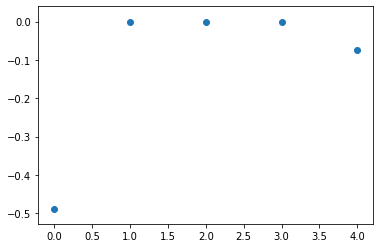

In [156]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [157]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index(['Chriz', 'H3K27ac'], dtype='object')

In [158]:
lin_reg_l1.coef_

array([-0.48761224, -0.        ,  0.        , -0.        , -0.0731405 ])

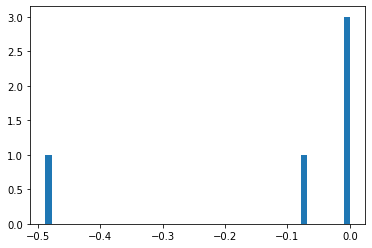

In [159]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

In [160]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso(alpha=0.8)

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

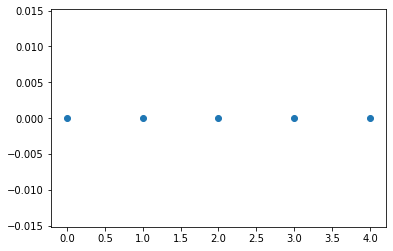

In [161]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [162]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index([], dtype='object')

In [163]:
lin_reg_l1.coef_

array([-0., -0.,  0.,  0., -0.])

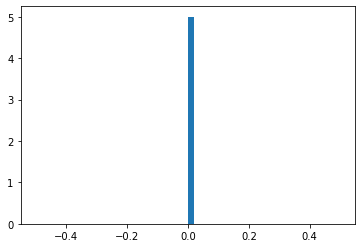

In [164]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

# Gradient Boosting Regressor

In [165]:
%%time

import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

from sklearn import ensemble

params = {'n_estimators': 250, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.82
wMean squared error on Test: 0.87
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.82
wMean squared error on Test: 0.80
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.80
wMean squared error on Test: 0.98
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.81
wMean squared error on Test: 0.91
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.81
wMean squared error on Test: 0.94
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.81
wMean squared error on Test: 0.88
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.81
wMean squared error on Test: 0.93
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.81
wMean squared error on Test: 0.90
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

In [166]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


Weighted Mean squared error CONST std on Train : 0.81 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 0.89 
 wmst CONST std test 0.06 



# GB 250 TRAIN 0.9+0.01
# GB 250 TEST   1.07+0.06

In [167]:
params = {'n_estimators': 100, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    
#     y_pred_train = const_pred_train
#     y_pred = const_pred_test

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))

    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))

    
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.91
wMean squared error on Test: 0.94
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.91
wMean squared error on Test: 0.86
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.90
wMean squared error on Test: 1.00
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.90
wMean squared error on Test: 0.94
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.90
wMean squared error on Test: 1.01
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.90
wMean squared error on Test: 0.93
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.90
wMean squared error on Test: 0.95
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.90
wMean squared error on Test: 0.93
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

,Chriz,H3K27ac,CTCF,H3K27me3,Su(Hw)
0,-0.595396,-0.206297,-0.087506,-0.050025,0.019883
1,-0.595396,-0.206297,-0.087506,-0.050025,0.019883
2,-0.595396,-0.206297,-0.087506,-0.050025,0.019883
3,-0.595396,-0.206297,-0.087506,-0.050025,0.019883
4,-0.595396,-0.206297,-0.087506,-0.050025,0.019883
5,-0.595396,-0.206297,-0.087506,-0.050025,0.019883
6,-0.595396,-0.206297,-0.087506,-0.050025,0.019883
7,-0.595396,-0.206297,-0.087506,-0.050025,0.019883
8,-0.595396,-0.206297,-0.087506,-0.050025,0.019883
9,-0.595396,-0.206297,-0.087506,-0.050025,0.019883


In [168]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

Weighted Mean squared error CONST std on Train : 0.90 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 0.94 
 wmst CONST std test 0.05 



In [169]:
%%time

params = {'n_estimators': 250, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


res_dict = {
        'model_name': 'GB_250',
        'wMSE_test_mean': np.mean(weighted_mse_test_all), 
        'wMSE_test_std':  np.std(weighted_mse_test_all), 
        'wMSE_train_mean': np.mean(weighted_mse_train_all), 
        'wMSE_train_std': np.std(weighted_mse_train_all),
        'comments': '-', 
        'params': 'test_params = testtest',
        
        'MSE_test_mean': np.mean(MSE_test), 
        'MSE_test_std': np.std(MSE_test), 
        'MSE_train_mean': np.mean(MSE_train), 
        'MSE_train_std': np.std(MSE_train),
        'r2_test': r2_test,
        
        'n_splits': n_splits,
        'model': model,
    }

results_pd = results_pd.append(res_dict, ignore_index=True)
results_pd

# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


# GB 250 TRAIN 0.9+0.01
# GB 250 TEST   1.07+0.06

train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.82
wMean squared error on Test: 0.87
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.82
wMean squared error on Test: 0.80
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.80
wMean squared error on Test: 0.98
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.81
wMean squared error on Test: 0.91
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.81
wMean squared error on Test: 0.94
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.81
wMean squared error on Test: 0.88
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.81
wMean squared error on Test: 0.93
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.81
wMean squared error on Test: 0.90
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

# Results

In [170]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.922047,0.042622,0.920844,0.010108,-,test_params = testtest,1.269372,0.077260,1.267885,0.019264,"[0.33022472445781603, 0.30276714824071915, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.982133,0.065669,0.981319,0.008746,-,test_params = testtest,1.637767,0.275124,1.636354,0.031770,"[0.27687710875971383, 0.26619423266295583, 0.2...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.974648,0.066007,0.973249,0.008490,-,test_params = testtest,1.625451,0.273828,1.622850,0.031025,"[0.29533364881311996, 0.27562474865985853, 0.2...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.964201,0.066901,0.962632,0.008476,-,test_params = testtest,1.606163,0.275571,1.603283,0.031097,"[0.30829724529543934, 0.2852577133156444, 0.21...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.206198,0.057172,1.205752,0.008909,-,test_params = testtest,1.948052,0.255206,1.947136,0.031019,"[0.10377187523708364, 0.10463421009496077, 0.0...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,0.964894,0.066734,0.963782,0.008575,-,test_params = testtest,1.608461,0.277371,1.606354,0.031258,"[0.300533354147124, 0.27855539412578, 0.214878...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,0.960805,0.069392,0.958604,0.008517,-,test_params = testtest,1.579956,0.280739,1.576095,0.031220,"[0.32957222636655736, 0.29554928362975974, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
9,GB_250,0.893341,0.060302,0.811855,0.006624,-,test_params = testtest,1.504203,0.267072,1.351436,0.021607,"[0.3679190199214132, 0.32724272399775867, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
